<a href="https://colab.research.google.com/github/abhiramoggu/time-series-forecasting/blob/main/renewable_energy_forecasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Multi-Step Univariate Time Series Forecasting of Renewable Energy Production

<b>Submitted by</b>: Oggu Satya Sai Abhiram <br>
<b>Last Updated</b>: Jun 25th, 2024 <br>
<b>Course</b>: Applied Informatics I <br>
<b>Professor in-charge</b>: Professor Shady Salama

## 1.Project Objective

This project aims to achieve the following objectives:


#### 1. Conduct preliminary data analysis using descriptive statistics and data visualizations

1. Calculate basic statistics like average, median, standard deviation, and range.

2. Create visual representations to identify patterns and relationships within the data.

#### 2. Analyze the global trends, seasonality, and cyclicity in renewable energy production for historical information

1. Identify trends over the historical period to understand how renewable energy production has changed over time.

2. Identify cycles within the data, such as seasonal variations or cyclical fluctuations, which can provide insights into the factors influencing renewable energy production.

#### 3. Assess the relationship between renewable energy production and other energy sources

1. Use statistical techniques to quantify the strength and direction of the relationship between renewable energy production and other energy sources, such as fossil fuels or nuclear energy.

2. Create visualizations like scatter plots and correlation matrices to visually explore the dependencies and associations between different energy sources.

#### 4. Test with different models to determine the best model for Univariate time series forecasting (static model at the moment)

1. Experiment with various univariate time series forecasting models, such as ARIMA, to identify the best suitable model for predicting renewable energy production.

2. Evaluate the performance of each model using metrics to find  model that gives the most accurate forecasts.

#### 5. Multi-step forecasting of renewable energy production for the next few years

1. Deploy the selected forecasting model to predict renewable energy production for multiple future time steps, considering the dynamic nature of renewable energy systems and external factors.

2. Explore different scenarios and sensitivities to assess the potential impacts of various factors on future renewable energy production, aiding in decision-making and strategic planning.

## 2.Research Questions

This project poses to answer the following research questions:

#### 1. Analyze Temporal Trends

1. How did the global renewable energy production evolve over from 1973 - 2022?
2. Are there identifiable patterns or trends in renewable energy production on a global scale?
3. What factors have influenced the evolution of renewable energy production over time?

#### 2. Check for Endogenous Comparison

1. How does the growth rate of renewable energy production compare to that of fossil fuels and nuclear energy?
2. What are the correlations of renewable energy, fossil fuels, and nuclear energy production?
- UN Goals and Sustainable Development goals assert for a need to switch from non-renewable sources like fossil fuesl to renewable sources of energy. Hence, it is to be studied if increase in renewable energy production reduces the need for fossil fuel production.
3. What insights can be gained from comparing the growth patterns of different energy sources?

#### 3. Check for Exogenrous Variables

1. Was it any renewable energy policies or technological advancements influencing the growth and adoption of renewable energy sources globally?

#### 4. Seasonal and Climate Influences

1. How do seasonal variations and climate changes affect renewable energy production across different months and years?

## 3.Dataset Definiton

In this time series forecasting project, the dataset is multivariate chart which provides an comprehensive overview of global energy trends. The dataset covers monthly data from 1973 to 2022 and includes detailed information on energy production and consumption across various sources. These sources encompass fossil fuels, nuclear electric power, and renewable energy. Additionally, the dataset includes data on primary energy imports, exports, and stock exchanges. All energy measurements in this dataset are standardized in Quadrillion British Thermal Units (1 quad =
10^15 Btu). For this project, a univariate multi-step forecasting model will be deployed for renewable energy source production.

The source for this dataset comes from a Kaggle dataset titled as "Global Energy Statisitics (1980-2021).
<br> You can find the link here: https://www.kaggle.com/datasets/akhiljethwa/world-energy-statistics/data

This data was originally collected from the U.S Energy Information Administration website, which is the official  reliable source for this study. You can find the link here: https://www.eia.gov/

## 4.Preliminary Analysis


In [ ]:
!pip install pmdarima
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import matplotlib.pyplot as plt
from pmdarima import auto_arima
from ipywidgets import interact, widgets
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
# Ignore all warnings
warnings.filterwarnings("ignore")

In [ ]:
# Read the CSV file 'GlobalTemperatures.csv' into a DataFrame.
# The 'parse_dates' parameter is used to convert the 'dt' column to datetime objects.
# The 'index_col' parameter sets the 'dt' column as the index of the DataFrame.
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')
# Set the frequency of the DataFrame to the start of the month ('MS').
#df = df.asfreq('MS')

### 4.1.Tabular Display


**Objective**

The research topic for this project is concentrated around the "Total Renewable Energy Production" globally. Therefore, it is a univariate time series forecasting study. Furthermore, all production variables are checked for correlation later, as well as the Total Renewable Energy Consumption too. Rest variables will not be relevant hereafter.

**Insights**

**Rows(Datapoints)**: 599

These datapoints are monthly data from 1973-2022, last day of each month in the following manner:

1. 1973-01-31
2. 1973-02-28
...
599. 2022-11-30


**Columns (Variables)**: 12

For Production:
1. Total Fossil Fuels Production
2. Nuclear Electric Power Production
3. Total Renewable Energy Production
4. Total Primary Energy Production

For Exchange:
1. Primary Energy Imports
2. Primary Enery Exports
3. Primary Energy Net Imports
4. Primary Energy Stock Change and Other

Consumption:
1. Total Fossil Fuels Consumption
2. Nuclear Electric Power Consumption
3. Total Renewable Energy Consumption
4. Total Primary Energy Consumption


In [ ]:
df

,Total Fossil Fuels Production,Nuclear Electric Power Production,Total Renewable Energy Production,Total Primary Energy Production,Primary Energy Imports,Primary Energy Exports,Primary Energy Net Imports,Primary Energy Stock Change and Other,Total Fossil Fuels Consumption,Nuclear Electric Power Consumption,Total Renewable Energy Consumption,Total Primary Energy Consumption
Date,,,,,,,,,,,,
1973-01-31,4.932632,0.068103,0.403981,5.404715,1.173080,0.125781,1.047299,0.771858,6.747651,0.068103,0.403981,7.223873
1973-02-28,4.729582,0.064634,0.360900,5.155115,1.168005,0.120883,1.047122,0.390129,6.163095,0.064634,0.360900,6.592366
1973-03-31,4.946902,0.072494,0.400161,5.419556,1.309473,0.139950,1.169523,-0.067640,6.044647,0.072494,0.400161,6.521439
1973-04-30,4.716271,0.064070,0.380470,5.160812,1.085169,0.194185,0.890984,-0.110067,5.493184,0.064070,0.380470,5.941729
1973-05-31,4.956995,0.062111,0.392141,5.411246,1.162804,0.196775,0.966029,-0.305335,5.613551,0.062111,0.392141,6.071940
...,...,...,...,...,...,...,...,...,...,...,...,...
2022-07-31,6.921426,0.718109,1.132400,8.771935,1.907862,2.294320,-0.386458,0.199327,6.736891,0.718109,1.111161,8.584805
2022-08-31,7.047525,0.718526,1.044026,8.810077,1.821828,2.327090,-0.505262,0.225628,6.755154,0.718526,1.036589,8.530444
2022-09-30,6.915201,0.664673,0.978647,8.558521,1.702048,2.219831,-0.517784,-0.257997,6.144280,0.664673,0.960694,7.782741


In [ ]:
# Identify columns that contain the word 'Uncertainty' in their name.
irrelevant_columns_1 = df.filter(like='Primary').columns
irrelevant_columns_2 = df.filter(like='Total Fossil Fuels Consumption').columns
irrelevant_columns_3 = df.filter(like='Nuclear Electric Power Consumption').columns
irrelevant_columns_4 = df.filter(like='Total Primary Energy Consumption').columns

# Drop the identified uncertainty columns from the DataFrame.
df = df.drop(columns=irrelevant_columns_1)
df = df.drop(columns=irrelevant_columns_2)
df = df.drop(columns=irrelevant_columns_3)
#df = df.drop(columns=irrelevant_columns_4)

In [ ]:
df

,Total Fossil Fuels Production,Nuclear Electric Power Production,Total Renewable Energy Production,Total Renewable Energy Consumption
Date,,,,
1973-01-31,4.932632,0.068103,0.403981,0.403981
1973-02-28,4.729582,0.064634,0.360900,0.360900
1973-03-31,4.946902,0.072494,0.400161,0.400161
1973-04-30,4.716271,0.064070,0.380470,0.380470
1973-05-31,4.956995,0.062111,0.392141,0.392141
...,...,...,...,...
2022-07-31,6.921426,0.718109,1.132400,1.111161
2022-08-31,7.047525,0.718526,1.044026,1.036589
2022-09-30,6.915201,0.664673,0.978647,0.960694


### 4.2.Table Information

**Objective**

This code allows us to check the data types of the datapoints for each of the variables to ensure they can be used for data analysis. Additionally, the index type, total number of entries or datapoints for each variable and file size is give which may be useful to understand if it may or may not be computationally expensive or time-consuming for running and training our models.

**Insights**

The DataFram contains 599 rows. All datatypes are float64 or numerical data which can be directly used for handling and performing analysis. All the columns have non-null values meaning there are not any missing values.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 599 entries, 1973-01-31 to 2022-11-30
Data columns (total 4 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Total Fossil Fuels Production       599 non-null    float64
 1   Nuclear Electric Power Production   599 non-null    float64
 2   Total Renewable Energy Production   599 non-null    float64
 3   Total Renewable Energy Consumption  599 non-null    float64
dtypes: float64(4)
memory usage: 23.4 KB


### 4.3.Descriptive Analysis of Renewable Energy Consumption

**Objective**

Calculate basic statistics for Renewable Energy Consumption like average, median, standard deviation, and range to understand the central tendency and variability of the data.

**Insights**

The statistics for total renewable energy production and consumtion are very similar for the first two decimal places, except maximum, suggesting a close relationship between these vairables. This can be tested later using correlation matrices.

The range from minimum to maximum in total renewable energy production suggests a signficant increase over time (later we know that the maximum comes later and the minimum comes earlier in time). However, this is possible as energy production is terms of quads will naturally be higher with more increase in population globally. Although, not tested for now, the graph should be trasnformed using population adjustment later. This way we know if more energy is actually being produced for the given number of population.

Other evident numbers suggest that the average fossil fuels production has always been higher than average nuclear and renweable sources and in facts nearly 9 times more.

In [ ]:
df.describe()

,Total Fossil Fuels Production,Nuclear Electric Power Production,Total Renewable Energy Production,Total Renewable Energy Consumption
count,599.000000,599.000000,599.000000,599.000000
mean,5.034634,0.519567,0.593709,0.591620
std,0.610126,0.202697,0.193351,0.189229
min,3.676065,0.062111,0.304328,0.304328
25%,4.683559,0.328635,0.467414,0.467414
50%,4.831601,0.594293,0.527479,0.527257
75%,5.087384,0.681056,0.685252,0.683567
max,7.126618,0.780456,1.218790,1.199383


In [ ]:
df.isnull().sum()

Total Fossil Fuels Production         0
Nuclear Electric Power Production     0
Total Renewable Energy Production     0
Total Renewable Energy Consumption    0
dtype: int64

### 4.4.Date of Min-Max Values of Each Variables

**Objective**

Finding the dates or index values of the minimum value and the maximum value for each of the columns or variables can help identify extreme events before we start plotting the graph and also guess the overall trend of the graph to know where the peak and troughs are. Though, it may not be sufficient to know if this data is simply a noise or outlier but it still gives an idea.

**Insights**

The lowest recorded in Total Renewable Energy Production had been recorded in 1977-02-28, although the dataset begins at 1973-1-31, it must have increased before dropping to an all time low. Whereas the all time high production in the same variable is 2022-05-31. As discussed earlier, an increase in population, industralization and globalization must have increased the demands in renewable energy production over time. Therefore, the troughs lie near the earliest points of the dataset and peak near or at the end.

In [ ]:
# Return the index label of the minimum value for each column in the DataFrame
df.idxmin()

Total Fossil Fuels Production        1978-02-28
Nuclear Electric Power Production    1973-05-31
Total Renewable Energy Production    1977-02-28
Total Renewable Energy Consumption   1977-02-28
dtype: datetime64[ns]

In [ ]:
# Return the index label of the maximum value for each column in the DataFrame
df.idxmax()

Total Fossil Fuels Production        2022-10-31
Nuclear Electric Power Production    2018-01-31
Total Renewable Energy Production    2022-05-31
Total Renewable Energy Consumption   2022-05-31
dtype: datetime64[ns]

### 4.5.Visualizing Data in Variables

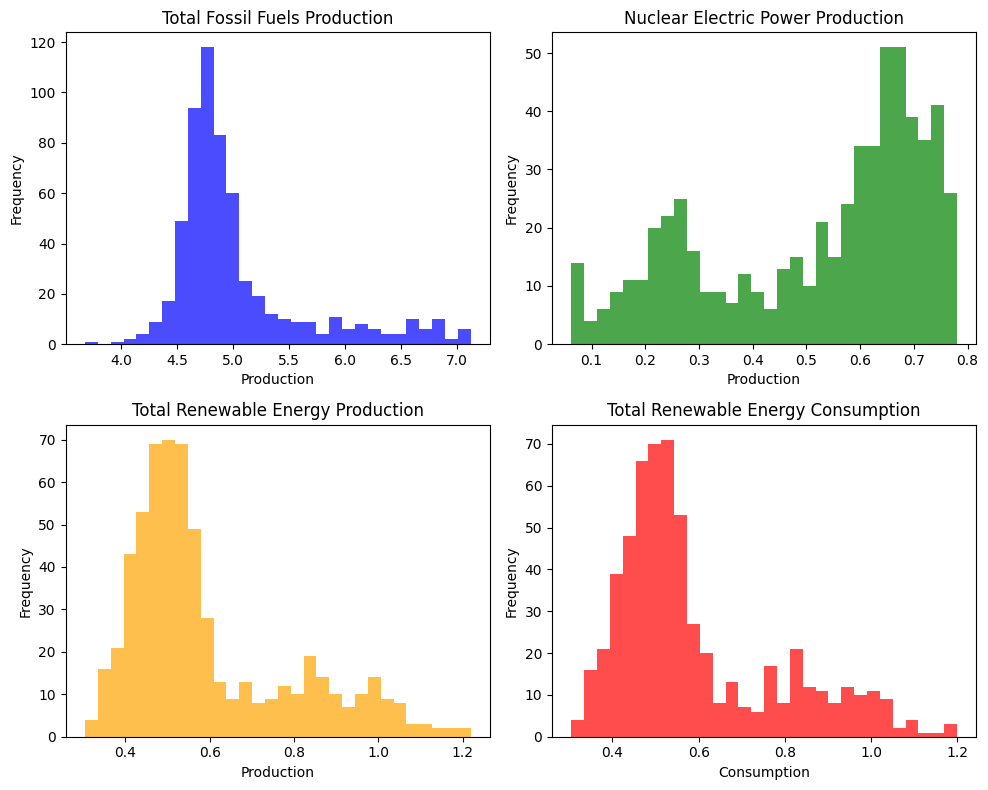

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'World-Energy-Overview.csv'  # Replace with your actual file path
energy_data = pd.read_csv(file_path, parse_dates=['Date'], index_col='Date')

# Plotting histograms for each variable
plt.figure(figsize=(10, 8))

plt.subplot(2, 2, 1)
plt.hist(energy_data['Total Fossil Fuels Production'], bins=30, color='blue', alpha=0.7)
plt.title('Total Fossil Fuels Production')
plt.xlabel('Production')
plt.ylabel('Frequency')

plt.subplot(2, 2, 2)
plt.hist(energy_data['Nuclear Electric Power Production'], bins=30, color='green', alpha=0.7)
plt.title('Nuclear Electric Power Production')
plt.xlabel('Production')
plt.ylabel('Frequency')

plt.subplot(2, 2, 3)
plt.hist(energy_data['Total Renewable Energy Production'], bins=30, color='orange', alpha=0.7)
plt.title('Total Renewable Energy Production')
plt.xlabel('Production')
plt.ylabel('Frequency')

plt.subplot(2, 2, 4)
plt.hist(energy_data['Total Renewable Energy Consumption'], bins=30, color='red', alpha=0.7)
plt.title('Total Renewable Energy Consumption')
plt.xlabel('Consumption')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()



### 4.6.Graph of Total Renewable Energy Production vs Date

**Objective**

This graph helps visually check for seasonality, long or short trends, cyclicity and find times where they may be significant events in the historical context for Total Renewable Energy Production.

**Insights**


- Trends

The Total Renewable Energy Production has an overall increasing trend of growth. The overall trend of total renewable energy production is nonlinear. But it can be divided into two parts.

From 1973 to 2000, the production largely lies between 0.6 and 0.4quad Btu.It steady increases and decreases within this, with two peaks at 1984 and 1997.

From 2001 to 2022, the trend rapidly increases relative to the historical data. The median of the 2001 is a little over 0.4 quad Btu and it goes as high and close to 1.2 quad Btu.



- Underlying Reasons

This sudden difference in trend from 2000 may indicate availibility of more data and changes in policies of renewable energy and more recent technolgical advancements and standardization of prices. These are exogenerous variables.


- Some Boxplot Insights

The range in each year was lower around 1973 to 2007, and then the range is amplified or much bigger. There is an evident of small nonlinear seasonality where there is an increasing amplitude over time.

- Cyclicity and Seasonality

After trends, we observe no cyclicty or phases in the graph that repeats itself. While, seasonality cannot be clearly said as the trend seems nonlinear, for a given year there is a clear spike in the middle of the year and drops at the end of the year.

- Some Underlying Reasons

We are unsure of the components of renewable energy but if it solar energy, most of the countries in the world are in the upper hemisphere of the planet which experiences summer and more average sunlight around the middle of the year. This could be a plausible reason behind this feabile seasonlity.


- Seasonal Plots

While seasonality suggests more production in the middle of the year than the ends, the seasonal plots indicate that there is an equal uniform distribution of all months producing similar amount of renewable energy. However, it is important to notice that seasonality observed was for one year but the seasonal plot sums all the production for all years. If closely observed, the months in the middle of the year still has a slightly higher production comapred to other months.

<Axes: xlabel='Date'>

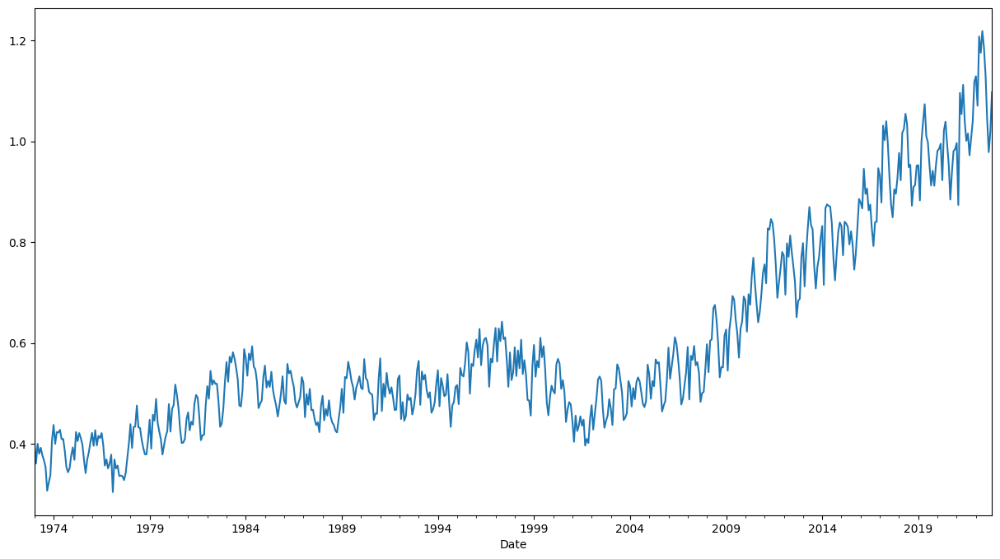

In [ ]:
df['Total Renewable Energy Production'].plot(figsize=(15, 8))

<Axes: xlabel='Date'>

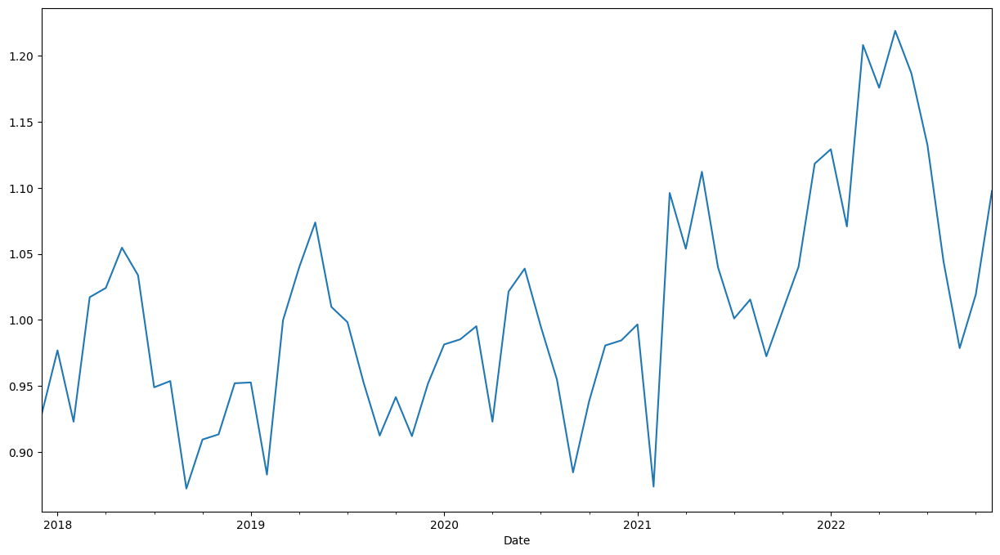

In [ ]:
df['Total Renewable Energy Production'][-60:].plot(figsize=(15, 8))

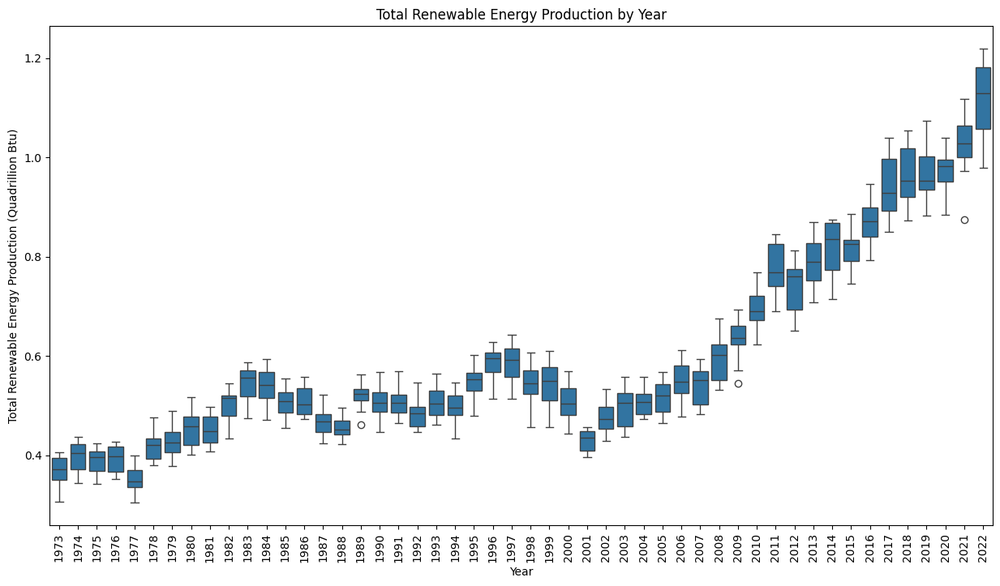

In [ ]:
df['Year'] = df.index.year
plt.figure(figsize=(15, 8))
sns.boxplot(x='Year', y='Total Renewable Energy Production', data=df)
plt.xticks(rotation=90)
plt.title('Total Renewable Energy Production by Year')
plt.xlabel('Year')
plt.ylabel('Total Renewable Energy Production (Quadrillion Btu)')
plt.show()
df.drop('Year', axis=1, inplace=True)


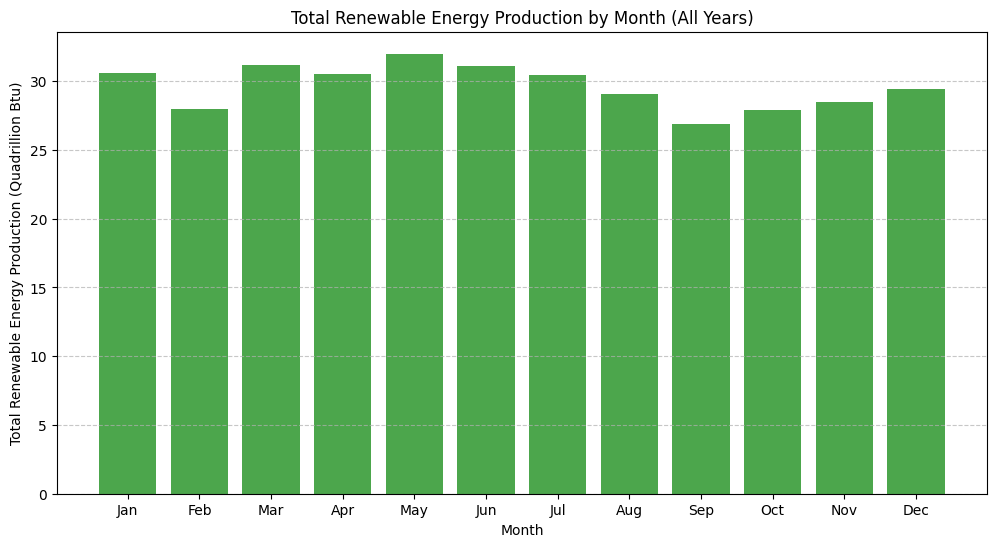

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure your DataFrame's index is in datetime format
df.index = pd.to_datetime(df.index)

# Add 'Year' and 'Month' columns to the DataFrame
df['Year'] = df.index.year
df['Month'] = df.index.month

# Aggregate total renewable energy production for each month across all years
monthly_production = df.groupby('Month')['Total Renewable Energy Production'].sum()

# Plot histogram
plt.figure(figsize=(12, 6))
plt.bar(monthly_production.index, monthly_production.values, color='green', alpha=0.7)
plt.title('Total Renewable Energy Production by Month (All Years)')
plt.xlabel('Month')
plt.ylabel('Total Renewable Energy Production (Quadrillion Btu)')
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


### 4.7.Rolling Average and Expanding Mean

**Objective**

While it was relatively easier to figure out the long-term trends due to smaller datatset, the rolling average technqiue is still implemented to smooht out noise and fluctuations. Since, we have two distinct trends observed visually we want to see the growth analysis of the graph using the expanding mean graph using the historical data.

**Insights**

The five-year moving average of total renewable energy as previosuly discovred shows two peaks, however around 1987 and 2000. The graph hits a dip at 2005 and then after it linearly grows with a slope close to 1. For the expanding mean graph, it will be a little jittery in the start due to lesss values but it steeply rises from around 1978 to 1985. Then the slope is slightly flattened suggesting a decrease in the rate of production from 1985 to 2000. After slightly curving smoothly down into a trough, the rate of production increases linearly from around 2002 onwards. The years have been visually estimated as they are not displayed in the scales.

<Figure size 1500x800 with 0 Axes>

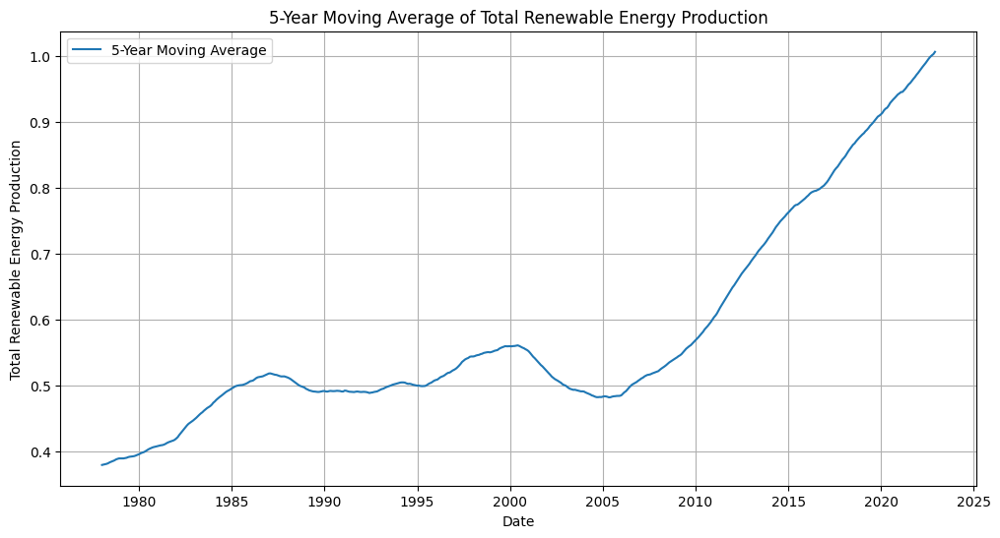

In [ ]:
# Set the figure size for the plot
plt.figure(figsize=(15, 8))

rolling_mean = df['Total Renewable Energy Production'].rolling(window=60).mean()  # 5 years, assuming monthly data

# Convert the index to a numpy array
rolling_mean_index = rolling_mean.index.to_numpy()
rolling_mean_values = rolling_mean.values

# Plot the 5-year moving average
plt.figure(figsize=(12, 6))
plt.plot(rolling_mean_index, rolling_mean_values, label='5-Year Moving Average')

# Add labels and title to the plot
plt.xlabel('Date')
plt.ylabel('Total Renewable Energy Production')
plt.title('5-Year Moving Average of Total Renewable Energy Production')
plt.legend()
plt.grid(True)
plt.show()


# # Set the figure size for the plot
# plt.figure(figsize=(15, 8))

# # Calculate the 5-year rolling mean
# rolling_mean = df['Total Renewable Energy Production'].rolling(window=60).mean()

# # Plot the 5-year moving average
# plt.plot(rolling_mean.index, rolling_mean, label='5-Year Moving Average')

# # Add labels and title to the plot
# plt.xlabel('Date')
# plt.ylabel("Total Renewable Energy Production")
# plt.title('Total Renewable Energy Production with 5-Year Moving Average')

# # Display the plot
# plt.show()

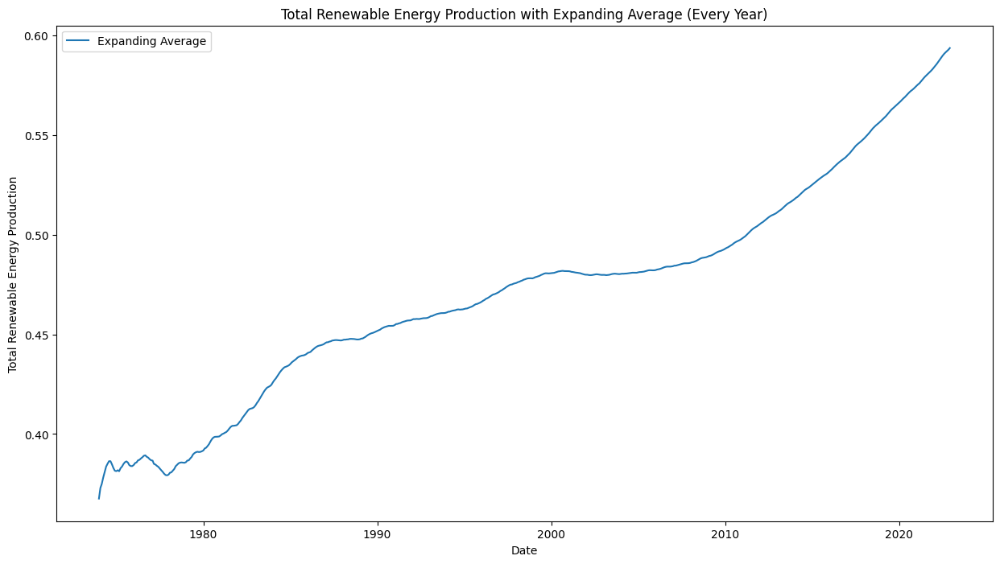

In [ ]:
# Compute the expanding mean (cumulative mean) with a minimum number of observations equal to 12 months (1 year)
expanding_mean = df["Total Renewable Energy Production"].expanding(12).mean()

expanding_mean_index = expanding_mean.index.to_numpy()
expanding_mean_values = expanding_mean.values

# Plot the expanding mean
plt.figure(figsize=(15, 8))
plt.plot(expanding_mean_index, expanding_mean_values, label='Expanding Average')
plt.xlabel('Date')
plt.ylabel("Total Renewable Energy Production")
plt.title('Total Renewable Energy Production with Expanding Average (Every Year)')
plt.legend()
plt.show()

### 4.8.Heatmap of Total Renewable Energy Production

**Objective**
This graph has been plotted to visually identify patterns using color gradient in an easy manner. Although, the previous graphs are explanatory, we shall implement this to strengthen our conclusions.

**Insights**
Light yellow color indicates low (around 0.4 quad Btu) total renewable energy production while dark blue color indicates a high renewable energy production (at 1.2 quad Btu), and the turquiose color indicates a medium.

Overall look of the heatmap, more renewable energy has been produced from 2008 where there is a clear sign of turquoise which transitions into aqua blue and then dark blue at 2022. Before that the whole heatmap is light yellow color except in two regions around 1983 and 1997 with a turquoise color, which were the peaks that we had previously observed. In these years, the turquoise color is more prominent in the months around the middle of the year than the end or begin of the year. This is true for after 2010 too where months from March to July depict a stonger and darker color unlike the end or start of the year for the respective months.

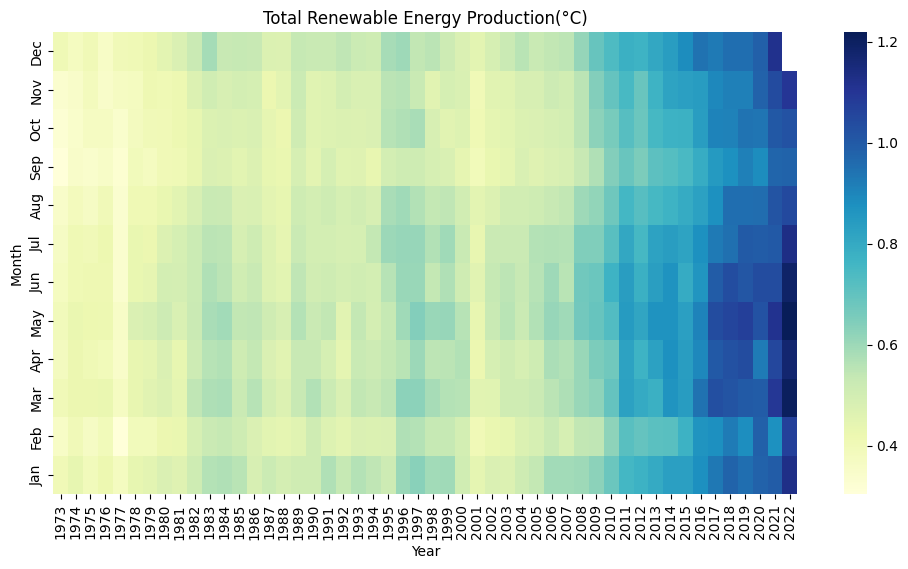

In [ ]:
# Add 'Year' and 'Month' columns to the DataFrame
df['Year'] = df.index.year
df['Month'] = df.index.month

# Pivot the DataFrame to have years as columns and months as rows
pivot_df = df.pivot_table(index='Month', columns='Year', values='Total Renewable Energy Production')

# Plot heatmap
plt.figure(figsize=(12, 6))
sns.heatmap(pivot_df[::-1], cmap='YlGnBu', annot=False, yticklabels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'][::-1])
plt.title('Total Renewable Energy Production(°C)')
plt.xlabel('Year')
plt.ylabel('Month')
plt.show()

# Drop the 'Year' and 'Month' columns from the DataFrame
df.drop('Year', axis=1, inplace=True)
df.drop('Month', axis=1, inplace=True)

### 4.9.Correlation Between Renewable Energy and Other Endogenerous Energy Variables

**Objective**

These following correlation matrices uses statistical techniques to quantify the strength, direction and distribution of the relationship between renewable energy production and other energy sources, such as fossil fuels or nuclear energy as well as the total renewable energy consumption itself.

**Insights**

- Total Renewable Energy Production vs Consumption

The relationship between total renewable energy production and total renewable energy consumption is perfect positive correlation as good as one with a linear relationship. This means when renewable energy production increases, then the renewable energy consumption tends to increase too. Correlation must not be mistaken with causation but in this case, we can infer that energy production more only if consumption is more.


- Total Renewable Energy vs Total Fossil Fuels Production

The relationship between total renewable energy production and total fossil fuels production is moderate positive correlation and vaugely lienar. While it is generally expected that an increase is renewable energy might be a decrease is fossil fuels, this is not the case. The use of both is increasing but one may not be replacing another.

-  Total Renewable Energy vs Total Nuclear Electric Production

The relationship between total renewable energy and total nuclear electric production is moderation correlation but non-linear which suggest other underlying factors at play. The shape is like an L but when a line is draw it might be more of a monotonic curve. When one variable is increasing, the other is stagnant and at certain point, the variable that was increasing becomes stagnant and the other variable is either increasing sharply or decreasing sharply, both cases have been found.  

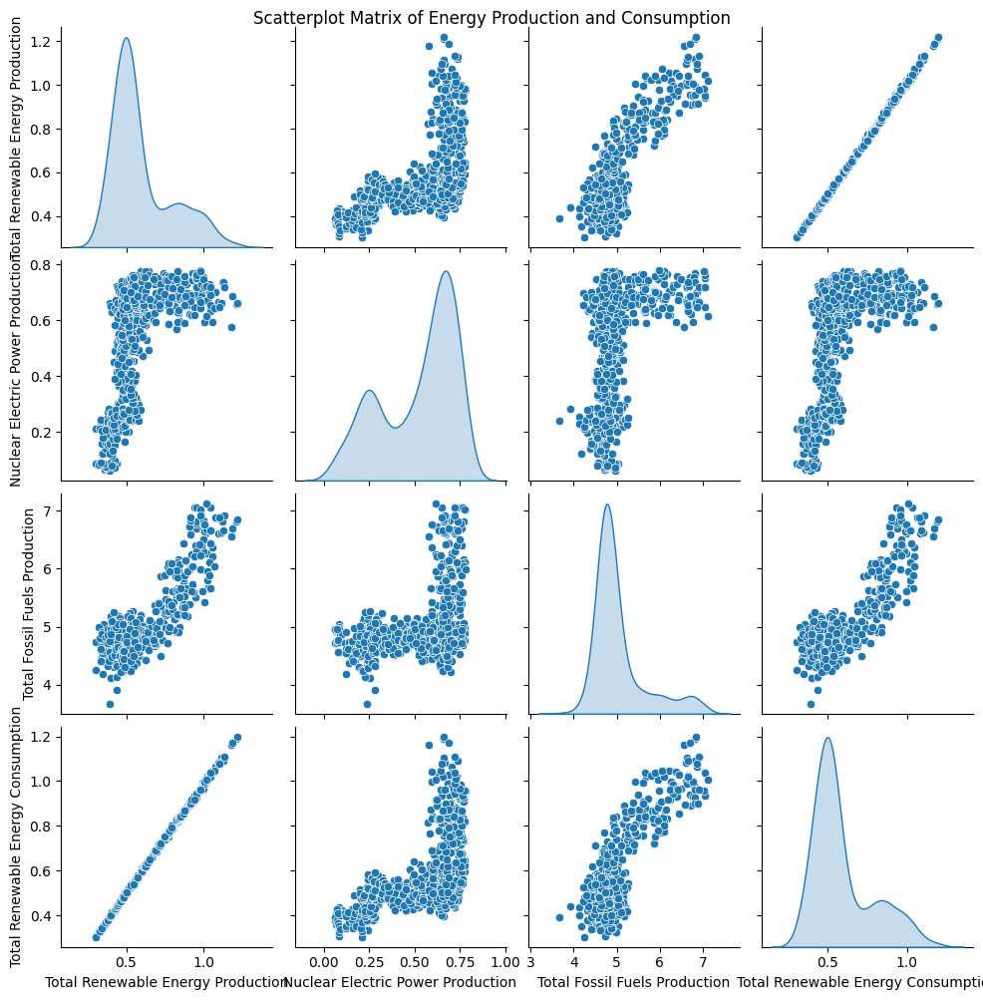

In [ ]:


columns_to_include = [
    "Total Renewable Energy Production",
    "Nuclear Electric Power Production",
    "Total Fossil Fuels Production",
    "Total Renewable Energy Consumption"


]

# Create the scatterplot matrix
sns.pairplot(df[columns_to_include], diag_kind='kde')
plt.suptitle('Scatterplot Matrix of Energy Production and Consumption', y=1.0)
plt.show()


### 4.10.Autocorrelation Plot for Total Renewable Energy Production

**Objective**

Autocorrelation plot is especially important at this point to determine if there are any repeating temporal patterns in the the total renewable energy production over time. 50 lags have been set for convenience which is around . **Each datapoint is a month so, 12 datapoints is 12 months which is 1 year, 60 datapoints is 60 months which is 5 years and so on.*

**Insights**

There is a string positive autocorrelatio between different time lages since, all the poles are in the positive side and is slowly descreasing in a linear fashion from 1 to 0.5 across 50 lags and they all lie outside the confidence interval indicating statistically significance, meaning there is a good connection between the historical and current data of the same variable and its not random cahnce.


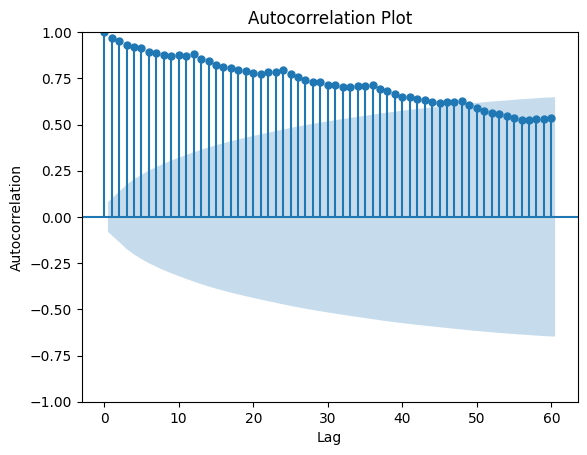

In [ ]:
plot_acf(df["Total Renewable Energy Production"], lags=60)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Plot')
plt.show()

### 4.11.Classical Decomposition and STL Decomposition of Total Renewable Energy Production

**Objective**

These two methods are implemented to extract trend component, seasonality component and residual components of the Total Renewable Energy Production. The first method is classical decomposition where the multiplicative model has been adopted because we observed nonlinear trend and nonlinear seasonality in the graph. The second method and more effective but computationally taxing one is STL decomposition.

**Insights**

- Trend Component

Both methods perform well when extarcting the trend component with highly similar or even same results. The trend shows a overall nonlinear curve that increases steadily with time.

- Seasonality Component

For the seasonal component, the classical component seems to have extarcted a clear seasonality with no-varying amplitudes unlike the STL decomposition where the amplitude/frequency increases with time (though it is hard to notice when crushed into a smaller x-axis width). When the graph is stretched the seasonal component for the last 30 years, the amplitude increasing from 0.05 and -0.05 to 0.1 and -0.1.

- Residual Component

As for the residuals, the graph for classical component seems to have constant mean at 1 with a constant variance between 1.1 and 0.9, while for STL decomposition, the constant mean is at 0 with a constant variance between 0.04 and -0.04, although there has been one serious outlier at 2020 which needs to be further studied. However, since it is closer to white noise, we can say all the patterns have been effectively captured.

In [ ]:
# Perform classical decomposition of the 'Total Renewable Energy Production' column
classical_decomposition = seasonal_decompose(df["Total Renewable Energy Production"], model='multiplicative', period=12)
classical_trend = classical_decomposition.trend
classical_seasonal = classical_decomposition.seasonal
classical_residual = classical_decomposition.resid


In [ ]:
# Perform STL decomposition of the 'Total Renewable Energy Production' column
stl = STL(df["Total Renewable Energy Production"], period=12)
stl_decomposition = stl.fit()
stl_trend = stl_decomposition.trend
stl_seasonal = stl_decomposition.seasonal
stl_residual = stl_decomposition.resid

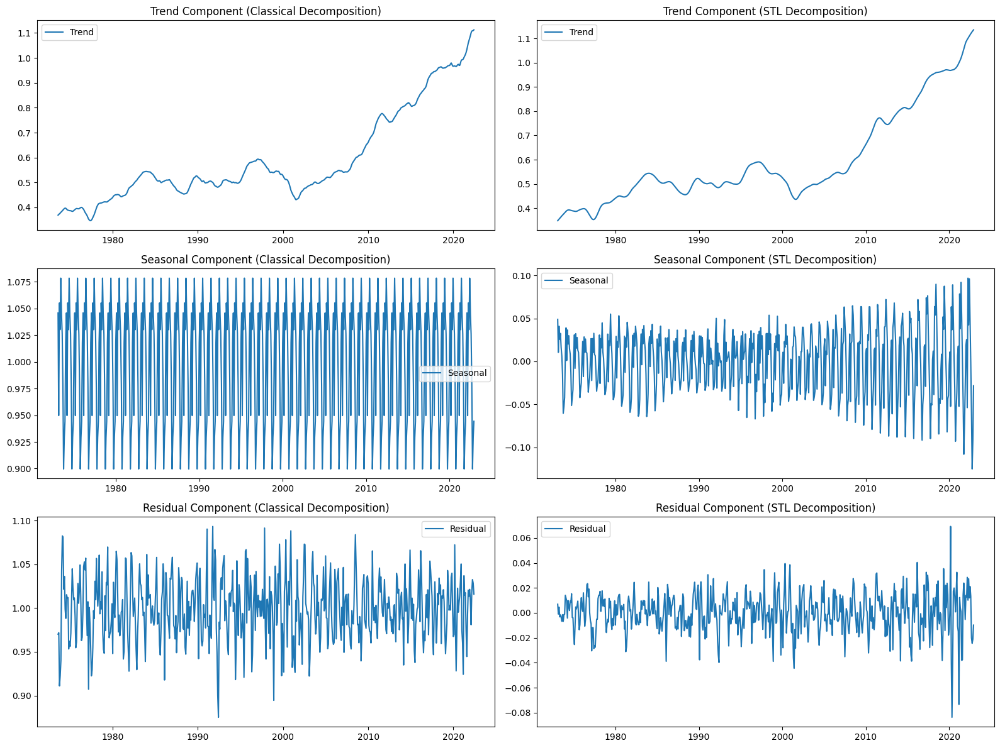

In [ ]:
# Plotting
plt.figure(figsize=(16, 12))

index = df.index.to_numpy()

# Classical Decomposition Components
plt.subplot(3, 2, 1)
plt.plot(index, classical_trend.values, label='Trend')
plt.title('Trend Component (Classical Decomposition)')
plt.legend()

plt.subplot(3, 2, 3)
plt.plot(index, classical_seasonal.values, label='Seasonal')
plt.title('Seasonal Component (Classical Decomposition)')
plt.legend()

plt.subplot(3, 2, 5)
plt.plot(index, classical_residual.values, label='Residual')
plt.title('Residual Component (Classical Decomposition)')
plt.legend()

# STL Decomposition Components
plt.subplot(3, 2, 2)
plt.plot(index, stl_trend.values, label='Trend')
plt.title('Trend Component (STL Decomposition)')
plt.legend()

plt.subplot(3, 2, 4)
plt.plot(index, stl_seasonal.values, label='Seasonal')
plt.title('Seasonal Component (STL Decomposition)')
plt.legend()

plt.subplot(3, 2, 6)
plt.plot(index, stl_residual.values, label='Residual')
plt.title('Residual Component (STL Decomposition)')
plt.legend()

plt.tight_layout()
plt.show()

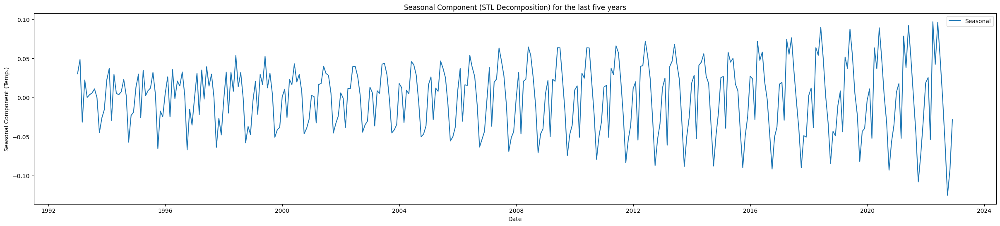

In [ ]:
# Plot the seasonal component (STL Decomposition) for the last five years
plt.figure(figsize=(30, 6))
index = df.index.to_numpy()
plt.plot(index[-360:], stl_seasonal.values[-360:], label='Seasonal')
plt.title('Seasonal Component (STL Decomposition) for the last five years')
plt.xlabel('Date')
plt.ylabel('Seasonal Component (Temp.)')
plt.legend()
plt.show()

In [ ]:
def check_stationarity(data):
    # Visualize the time series
    plt.figure(figsize=(10, 6))
    plt.plot(data, color='blue')
    plt.title('Renewable Energy Production (1980-2021)')
    plt.xlabel('Year')
    plt.ylabel('Production (Quadrillion BTU)')
    plt.grid(True)
    plt.show()
    # Perform ADF test
    adf_result = adfuller(data)
    adf_statistic = adf_result[0]
    adf_p_value = adf_result[1]

    # Print results
    print("ADF Test:")
    print("ADF Statistic:", adf_statistic)
    print("p-value:", adf_p_value)
    if adf_p_value < 0.05:
        print("ADF Test Result: Data is stationary\n")
    else:
        print("ADF Test Result: Data is non-stationary\n")

In [ ]:
from statsmodels.tsa.stattools import kpss

def check_stationarity_kpss(data):

    # Perform KPSS test
    kpss_stat, p_value, lags, crit_values = kpss(data)
    print('KPSS Statistic:', kpss_stat)
    print('p-value:', p_value)
    print('Critical Values:', crit_values)

    # Interpret the results
    if p_value < 0.05:
        print('Reject the null hypothesis: Time series is not stationary')
    else:
        print('Fail to reject the null hypothesis: Time series is stationary')




### 4.12.Check for Stationarity using ADF and KPSS Test

**Objective**

Stationarity indicates constant mean, variance and autocorrelation which is an essential format to be used for determining a suitable model for making predicitions for the variable. For Total Renewable Energy Production, we run both ADF and KPSS test to strictly ensure stationarity. ADF tells whther a unit root is present in time series data and KPSS tells if the trend itself is stationary or not. If both are stationary we proceed, otherwise we have to make adjustments or transformations.

**Insights**

The variable itself fails on both the ADF and KPSS tests indicating that it is non-stationary. Hence, we do differencing to change this. The differencing has been set to monthly, which is 1, as the time series data are measured in months too and exhibits non-stationarity. Hence, we check for ACF before and after differencing. Before differencing, the graph is statistically significant. However, after differencing monthly, most poles fall within the confidence interval immediately. Note, one pole keeps repeating at a regular interval. This needs futher analysis. When the stationarity is checked with both tests after this, the differenced time series successfullyy passes both tests ready for model selection and fitting.

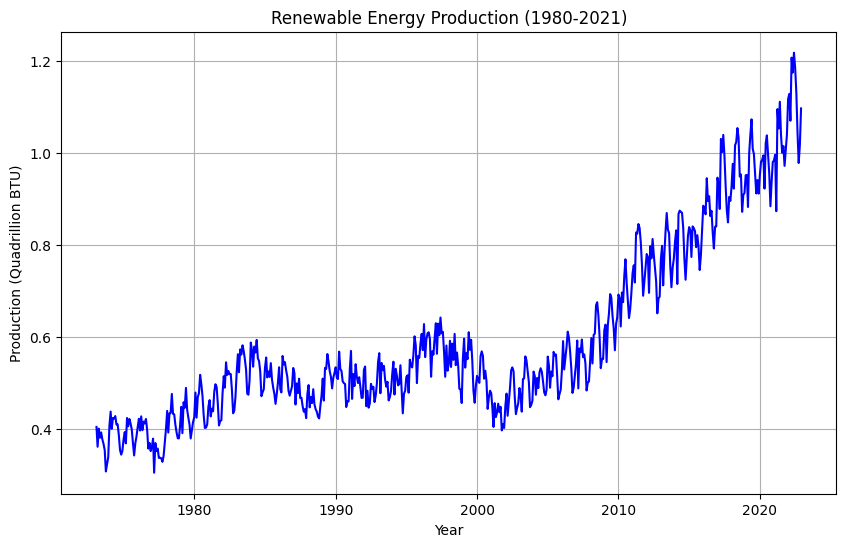

ADF Test:
ADF Statistic: 1.4414664510812045
p-value: 0.9972946112835634
ADF Test Result: Data is non-stationary

KPSS Statistic: 2.7359183433969596
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Reject the null hypothesis: Time series is not stationary


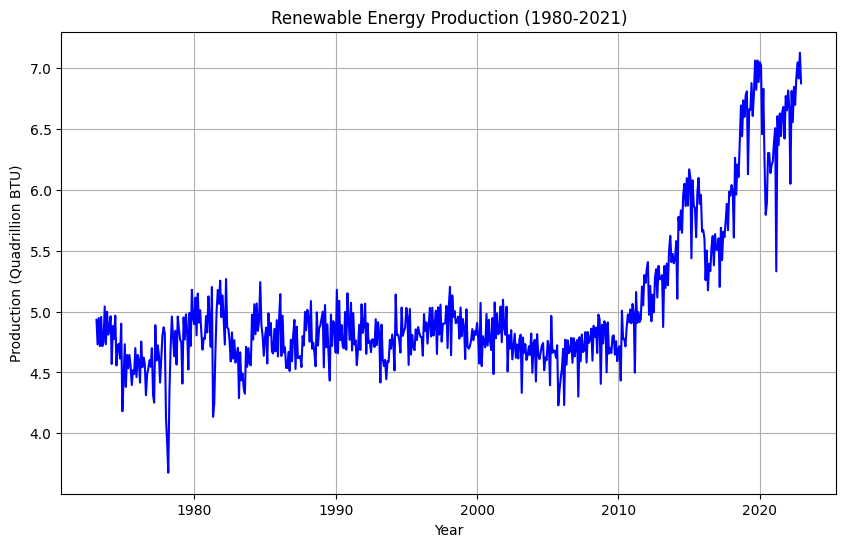

ADF Test:
ADF Statistic: 0.618611191894859
p-value: 0.9880654916763071
ADF Test Result: Data is non-stationary

KPSS Statistic: 2.7359183433969596
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Reject the null hypothesis: Time series is not stationary


In [ ]:
check_stationarity(df['Total Renewable Energy Production'])
check_stationarity_kpss(df['Total Renewable Energy Production'])
check_stationarity(df['Total Fossil Fuels Production'])
check_stationarity_kpss(df['Total Renewable Energy Production'])


In [ ]:
try_1 = df['Total Renewable Energy Production'].diff()

In [ ]:
try_2 = df['Total Fossil Fuels Production'].diff()

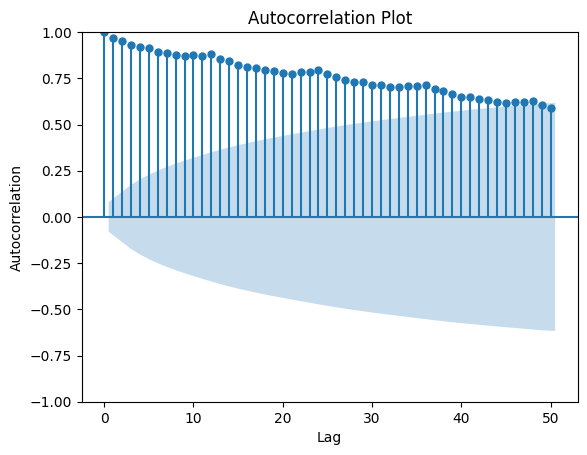

In [ ]:
plot_acf(df["Total Renewable Energy Production"], lags=50)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Plot')
plt.show()

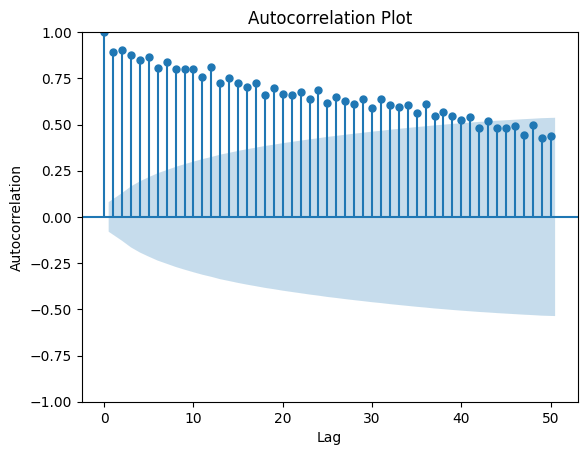

In [ ]:
plot_acf(df['Total Fossil Fuels Production'], lags=50)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Plot')
plt.show()

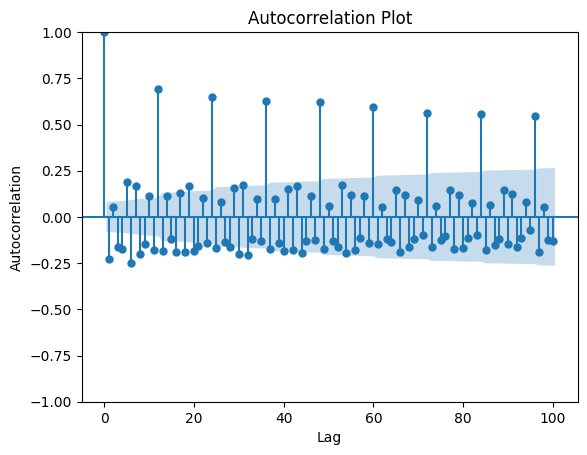

In [ ]:
plot_acf(try_1[1:], lags=100)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Plot')
plt.show()

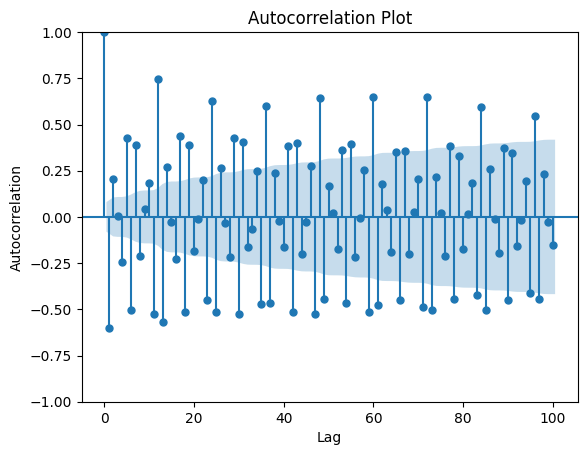

In [ ]:
plot_acf(try_2[1:], lags=100)
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.title('Autocorrelation Plot')
plt.show()

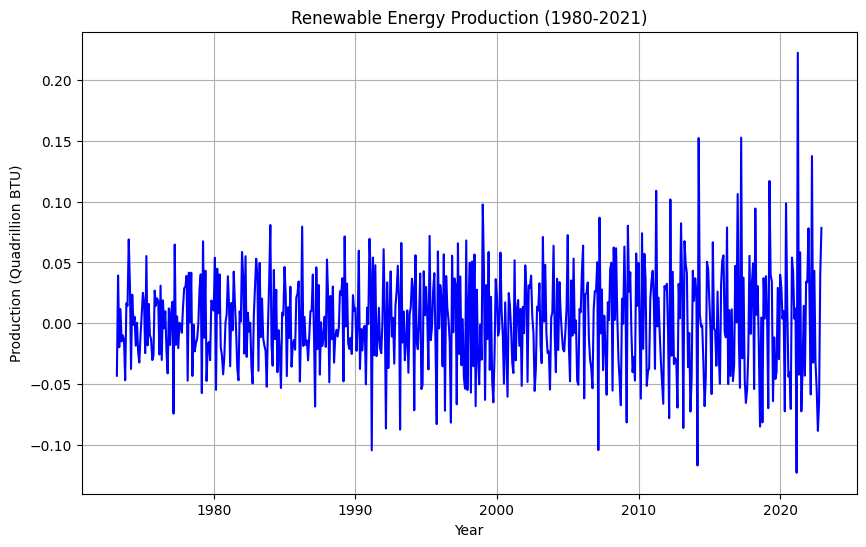

ADF Test:
ADF Statistic: -6.318990474081044
p-value: 3.099538458778141e-08
ADF Test Result: Data is stationary

KPSS Statistic: 0.3239982882139003
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Fail to reject the null hypothesis: Time series is stationary


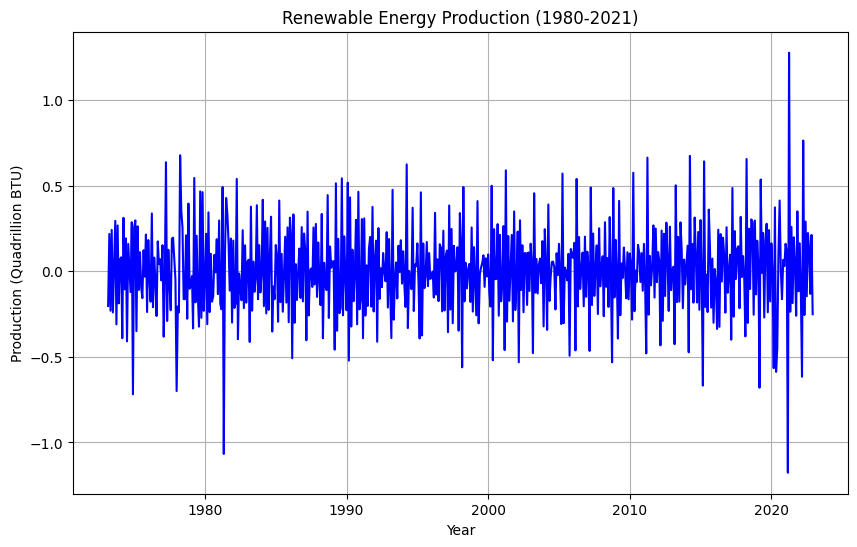

ADF Test:
ADF Statistic: -6.387143121711839
p-value: 2.1502665798222488e-08
ADF Test Result: Data is stationary

KPSS Statistic: 0.36828048903462074
p-value: 0.09082737541611174
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Fail to reject the null hypothesis: Time series is stationary


In [ ]:
check_stationarity(try_1[1:])
check_stationarity_kpss(try_1[1:])
check_stationarity(try_2[1:])
check_stationarity_kpss(try_2[1:])

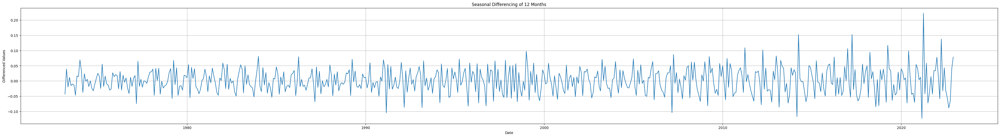

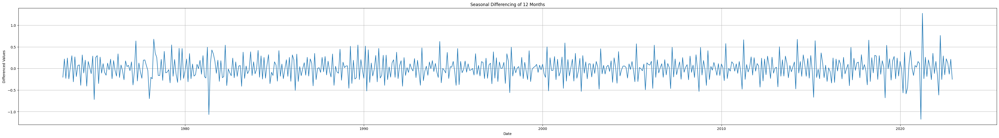

In [ ]:
# Compute seasonal differencing of 1 months for the 'Total Renewable Energy Production' column
seasonal_diff_renewable = df['Total Renewable Energy Production'].diff()
seasonal_diff_fossil = df['Total Fossil Fuels Production'].diff()

# Plot the differenced column
plt.figure(figsize=(50, 6))
plt.plot(seasonal_diff_renewable)
plt.title('Seasonal Differencing of 12 Months')
plt.xlabel('Date')
plt.ylabel('Differenced Values')
plt.grid(True)
plt.show()


plt.figure(figsize=(50, 6))
plt.plot(seasonal_diff_fossil)
plt.title('Seasonal Differencing of 12 Months')
plt.xlabel('Date')
plt.ylabel('Differenced Values')
plt.grid(True)
plt.show()

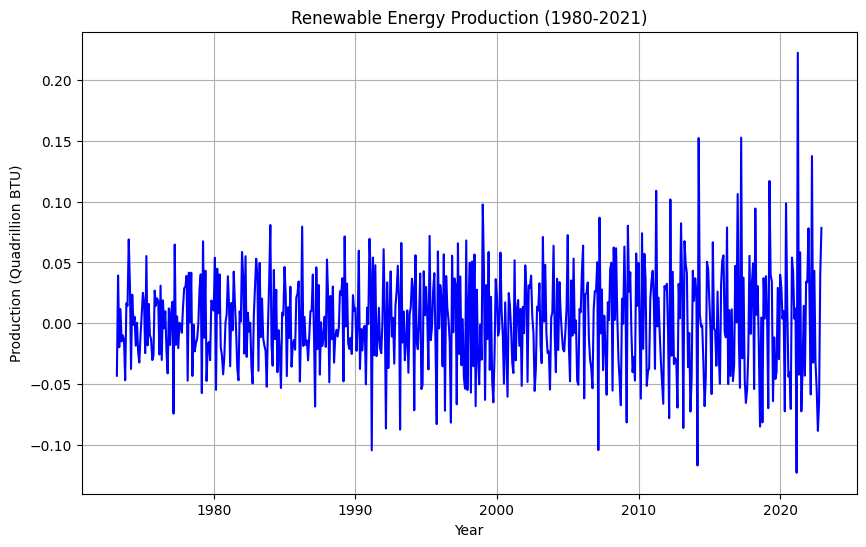

ADF Test:
ADF Statistic: -6.318990474081044
p-value: 3.099538458778141e-08
ADF Test Result: Data is stationary

KPSS Statistic: 0.3239982882139003
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Fail to reject the null hypothesis: Time series is stationary


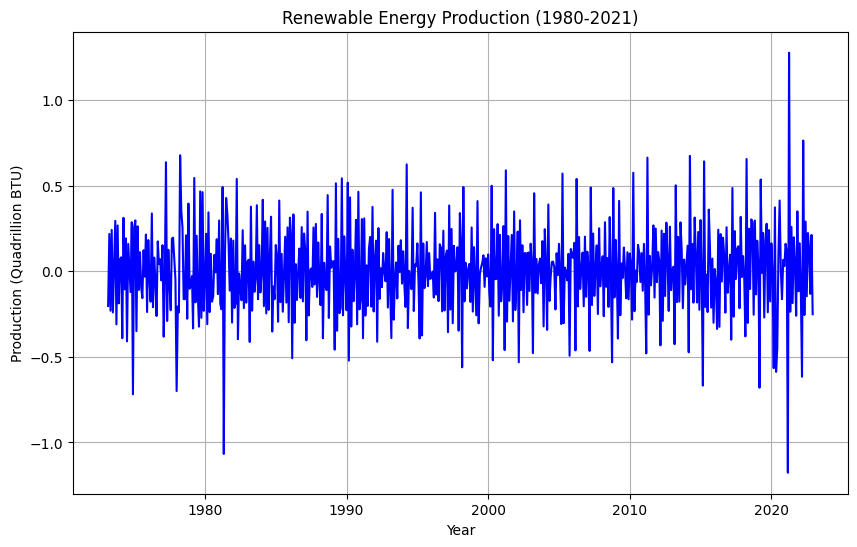

ADF Test:
ADF Statistic: -6.387143121711839
p-value: 2.1502665798222488e-08
ADF Test Result: Data is stationary

KPSS Statistic: 0.36828048903462074
p-value: 0.09082737541611174
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
Fail to reject the null hypothesis: Time series is stationary


In [ ]:
check_stationarity(seasonal_diff_renewable.dropna())
check_stationarity_kpss(seasonal_diff_renewable.dropna())
check_stationarity(seasonal_diff_fossil.dropna())
check_stationarity_kpss(seasonal_diff_fossil.dropna())

In [ ]:
# Compute the absolute minimum value of the seasonal differenced data
add_value = round(abs(seasonal_diff_renewable.min()))

# Print the value to be subtracted after developing the model
print(f"This value has to be subtracted after developing our model = {add_value}")

# Add the absolute minimum value to the seasonal differenced data
seasonal_diff_renewable += add_value



# Compute the absolute minimum value of the seasonal differenced data
add_value = round(abs(seasonal_diff_fossil.min()))

# Print the value to be subtracted after developing the model
print(f"This value has to be subtracted after developing our model = {add_value}")

# Add the absolute minimum value to the seasonal differenced data
seasonal_diff_fossil += add_value

This value has to be subtracted after developing our model = 0
This value has to be subtracted after developing our model = 1


In [ ]:
class TSMean:
    def __init__(self, series):
        """
        Initialize TSMean with the given time series.

        Parameters:
        series (pandas Series): Time series data.
        """
        # Calculate the mean of the series
        self.mean = series.mean()

    def forecast(self, steps):
        """
        Generate forecasts using the mean value.

        Parameters:
        steps (int): Number of steps to forecast.

        Returns:
        list: List of forecasted values.
        """
        # Return a list containing the mean value repeated for the specified number of steps
        return [self.mean] * steps

class TSNaive:
    def __init__(self, series):
        """
        Initialize TSNaive with the given time series.

        Parameters:
        series (pandas Series): Time series data.
        """
        # Store the last observed value of the series
        self.last_value = series.iloc[-1]

    def fit(self):
        """
        Fit the model (no action needed for naive method).

        Returns:
        self: Returns self.
        """
        return self

    def forecast(self, steps):
        """
        Generate forecasts using the last observed value.

        Parameters:
        steps (int): Number of steps to forecast.

        Returns:
        list: List of forecasted values.
        """
        # Return a list containing the last observed value repeated for the specified number of steps
        return [self.last_value] * steps

class TSNaiveSeasonal:
    def __init__(self, series, period):
        """
        Initialize TSNaiveSeasonal with the given time series and seasonal period.

        Parameters:
        series (pandas Series): Time series data.
        period (int): Seasonal period of the time series.
        """
        # Store the seasonal period and values of the series
        self.period = period
        self.values = series.values

    def forecast(self, steps):
        """
        Generate seasonal naive forecasts.

        Parameters:
        steps (int): Number of steps to forecast.

        Returns:
        list: List of forecasted values.
        """
        # Generate forecasts by repeating the last observed value from the corresponding season
        seasonal_forecast = []
        for i in range(steps):
            index = len(self.values) - (i % self.period) - 1
            seasonal_forecast.append(self.values[index])
        return seasonal_forecast[::-1]

class TSDrift:
    def __init__(self, series):
        """
        Initialize TSDrift with the given time series.

        Parameters:
        series (pandas Series): Time series data.
        """
        # Calculate the linear regression parameters
        self.x_start = 0
        self.x_end = len(series) - 1
        self.y_start = series.iloc[0]
        self.y_end = series.iloc[-1]
        self.slope = (self.y_end - self.y_start) / (self.x_end - self.x_start)
        self.intercept = self.y_start - self.slope * self.x_start

    def forecast(self, steps):
        """
        Generate forecasts using the linear regression (drift) method.

        Parameters:
        steps (int): Number of steps to forecast.

        Returns:
        list: List of forecasted values.
        """
        # Generate forecasts by extending the linear regression line into the future
        forecast_values = [self.intercept + self.slope * (self.x_end + i) for i in range(1, steps + 1)]
        return forecast_values

### 4.13.Simple Forecasting Methods on Total Renewable Energy Production

The seasonal naive model is very similar to the testing set in shape but it is placed below the testing set as the naive function simply models the last five years of the training set. The mean occurs lower than all the other tests. Drift method and naive method have also been checked.

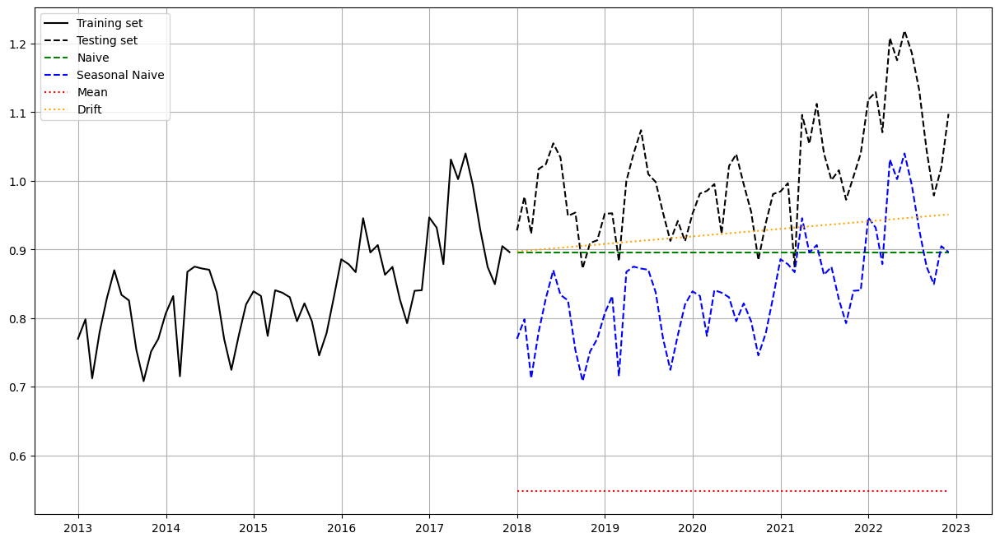

In [ ]:
# Apply differencing of order 1 to 'Total Renewable Energy Production'
#df['Total Renewable Energy Production_diff'] = df['Total Renewable Energy Production'].diff(1)

# Make all data as training except the last year as testing
Train = df['Total Renewable Energy Production'][:-60]
Test = df['Total Renewable Energy Production'][-60:]
m = TSMean(Train)
n = TSNaive(Train).fit()
s = TSNaiveSeasonal(Train, 60)
dr = TSDrift(Train)

# Calculate forecasted values
forecast_naive = n.forecast(60)
forecast_seasonal = s.forecast(60)
forecast_mean = m.forecast(60)
forecast_drift = dr.forecast(60)

index = Test.index.to_numpy()

# Plotting
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(Train[-60:], 'k', label='Training set')
ax.plot(Test, 'k', linestyle='--', label='Testing set')
ax.plot(index, forecast_naive, color='green', label='Naive', linestyle='--')
ax.plot(index, forecast_seasonal, color='blue', label='Seasonal Naive', linestyle='--')
ax.plot(index, forecast_mean, color='red', label='Mean', linestyle='dotted')
ax.plot(index, forecast_drift, color='orange', label='Drift', linestyle=':')
ax.legend(loc='upper left')
ax.grid()
plt.show()

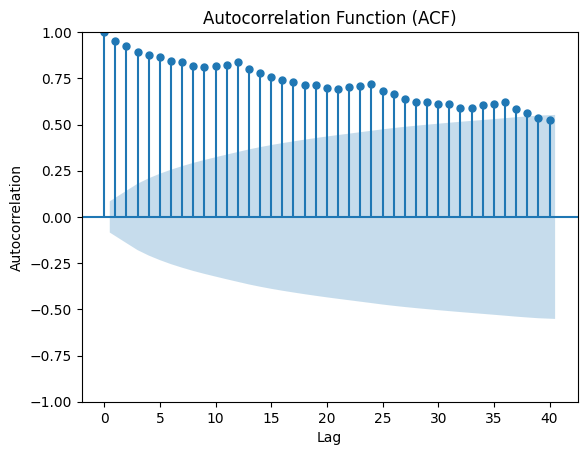

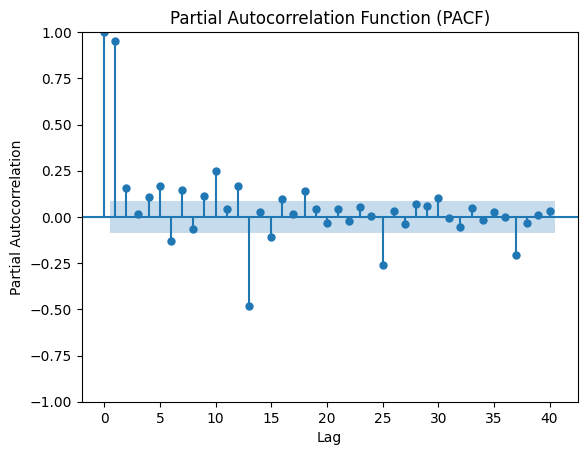

In [ ]:
# Plot ACF
plot_acf(Train, lags=40)
plt.title('Autocorrelation Function (ACF)')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

# Plot PACF
plot_pacf(Train, lags=40)
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.show()

### 4.14.Training and Testing Data

The models that are being tested out at AR, ARMA, AIC, ARIMA, SARIMA, Holt-Winters Seasonal Model.

The training and testing data has been split into 9:1 ratio where training observations are 539 and testing observations are 60 which is equivalent to 5 years.

**Results Shortened for Now**

Both AutoRegression model and SARIMA model have been able to predict the time series closest to the expected results becauses seasonal patterns even though non-linear can be captured by SARIMA really well unlike a standard ARIMA which is without seasonal components. And we know the orignal model is not really stationary so there is lower cahnces it will perform better on ARIMA that requires it to be stationary. Though, ARIMA beats ARMA in this aspect, SARIMA provides better results for more complex data.

In [ ]:
# Print information about the data
print('Observations: {}'.format(len(df)))
print('Training Observations: {}'.format(len(Train)))
print('Testing Observations: {}'.format(len(Test)))

Observations: 599
Training Observations: 539
Testing Observations: 60


In [ ]:
# Calculate RMSE, MAE, MAPE for each model
def calculate_metrics(true_values, forecasted_values):
    rmse = np.sqrt(mean_squared_error(true_values, forecasted_values))
    mae = mean_absolute_error(true_values, forecasted_values)
    mape = np.mean(np.abs((true_values - forecasted_values) / true_values)) * 100
    return [rmse, mae, mape]

In [ ]:
naive_metrics = calculate_metrics(Test, forecast_naive)
seasonal_metrics = calculate_metrics(Test, forecast_seasonal)
mean_metrics = calculate_metrics(Test, forecast_mean)
drift_metrics = calculate_metrics(Test, forecast_drift)

# Create a DataFrame to store the results
results = pd.DataFrame({
    'Model': ['Naive', 'Seasonal Naive', 'Mean', 'Drift'],
    'RMSE': [naive_metrics[0], seasonal_metrics[0], mean_metrics[0], drift_metrics[0]],
    'MAE': [naive_metrics[1], seasonal_metrics[1], mean_metrics[1], drift_metrics[1]],
    'MAPE (%)': [naive_metrics[2], seasonal_metrics[2], mean_metrics[2], drift_metrics[2]]
})
results.set_index('Model', inplace=True)
results

,RMSE,MAE,MAPE (%)
Model,,,
Naive,0.137196,0.112996,10.701457
Seasonal Naive,0.168325,0.163752,16.230965
Mean,0.466141,0.459026,45.254054
Drift,0.110533,0.088411,8.357195


In [ ]:
# Train autoregression model
model = AutoReg(Train, lags=25)  # Create an autoregression model with 25 lags
model_fit = model.fit()  # Fit the autoregression model to the training data
print('Coefficients: %s' % model_fit.params)  # Print the coefficients of the fitted model

Coefficients: const                                   -0.001850
Total Renewable Energy Production.L1     0.778193
Total Renewable Energy Production.L2    -0.035461
Total Renewable Energy Production.L3     0.112810
Total Renewable Energy Production.L4     0.032252
Total Renewable Energy Production.L5     0.086793
Total Renewable Energy Production.L6    -0.106967
Total Renewable Energy Production.L7     0.050305
Total Renewable Energy Production.L8    -0.056944
Total Renewable Energy Production.L9    -0.017280
Total Renewable Energy Production.L10    0.056755
Total Renewable Energy Production.L11    0.006573
Total Renewable Energy Production.L12    0.519430
Total Renewable Energy Production.L13   -0.402349
Total Renewable Energy Production.L14    0.081362
Total Renewable Energy Production.L15   -0.135168
Total Renewable Energy Production.L16   -0.030863
Total Renewable Energy Production.L17   -0.070024
Total Renewable Energy Production.L18    0.089051
Total Renewable Energy Production.L1

In [ ]:
model_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                    AutoReg Model Results                                    
=============================================================================================
Dep. Variable:     Total Renewable Energy Production   No. Observations:                  539
Model:                                   AutoReg(25)   Log Likelihood                1208.624
Method:                              Conditional MLE   S.D. of innovations              0.023
Date:                               Mon, 24 Jun 2024   AIC                          -2363.248
Time:                                       19:36:23   BIC                          -2248.708
Sample:                                   02-28-1975   HQIC                         -2318.355
                                        - 11-30-2017                                         
=========================================================================================================
                                            coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                    -0.0018      0.005     -0.382      0.702      -0.011       0.008
Total Renewable Energy Production.L1      0.7782      0.043     18.240      0.000       0.695       0.862
Total Renewable Energy Production.L2     -0.0355      0.053     -0.665      0.506      -0.140       0.069
Total Renewable Energy Production.L3      0.1128      0.053      2.116      0.034       0.008       0.217
Total Renewable Energy Production.L4      0.0323      0.054      0.603      0.547      -0.073       0.137
Total Renewable Energy Production.L5      0.0868      0.054      1.621      0.105      -0.018       0.192
Total Renewable Energy Production.L6     -0.1070      0.054     -1.986      0.047      -0.213      -0.001
Total Renewable Energy Production.L7      0.0503      0.054      0.931      0.352      -0.056       0.156
Total Renewable Energy Production.L8     -0.0569      0.054     -1.055      0.291      -0.163       0.049
Total Renewable Energy Production.L9     -0.0173      0.054     -0.318      0.750      -0.124       0.089
Total Renewable Energy Production.L10     0.0568      0.055      1.034      0.301      -0.051       0.164
Total Renewable Energy Production.L11     0.0066      0.055      0.120      0.904      -0.101       0.114
Total Renewable Energy Production.L12     0.5194      0.055      9.493      0.000       0.412       0.627
Total Renewable Energy Production.L13    -0.4023      0.057     -7.086      0.000      -0.514      -0.291
Total Renewable Energy Production.L14     0.0814      0.055      1.482      0.138      -0.026       0.189
Total Renewable Energy Production.L15    -0.1352      0.055     -2.460      0.014      -0.243      -0.027
Total Renewable Energy Production.L16    -0.0309      0.055     -0.559      0.576      -0.139       0.077
Total Renewable Energy Production.L17    -0.0700      0.055     -1.267      0.205      -0.178       0.038
Total Renewable Energy Production.L18     0.0891      0.055      1.607      0.108      -0.020       0.198
Total Renewable Energy Production.L19    -0.0014      0.056     -0.025      0.980      -0.110       0.107
Total Renewable Energy Production.L20    -0.0221      0.055     -0.400      0.689      -0.131       0.086
Total Renewable Energy Production.L21     0.0287      0.055      0.520      0.603      -0.080       0.137
Total Renewable Energy Production.L22     0.0296      0.055      0.536      0.592      -0.079       0.138
Total Renewable Energy Production.L23    -0.0137      0.055     -0.248      0.804      -0.122       0.094
Total Renewable Energy Production.L24     0.2903      0.055      5.273      0.000       0.182       0.398
Total Renewable Energy Production.L25    -0.2621      0.044     -5.917      0.000      -0.349      -0.175
                                

predicted=0.959273, expected=0.927670
predicted=0.953542, expected=0.976929
predicted=0.930344, expected=0.922932
predicted=1.034524, expected=1.017194
predicted=0.998972, expected=1.024178
predicted=1.032552, expected=1.054663
predicted=0.988502, expected=1.033802
predicted=0.956351, expected=0.948984
predicted=0.903795, expected=0.953714
predicted=0.873278, expected=0.872342
predicted=0.929162, expected=0.909450
predicted=0.920309, expected=0.913361
predicted=0.989373, expected=0.952043
predicted=0.983526, expected=0.952661
predicted=0.958840, expected=0.882918
predicted=1.065549, expected=0.999795
predicted=1.035309, expected=1.039700
predicted=1.069661, expected=1.073754
predicted=1.022192, expected=1.009869
predicted=0.984593, expected=0.998272
predicted=0.941631, expected=0.952554
predicted=0.916333, expected=0.912470
predicted=0.971413, expected=0.941536
predicted=0.957889, expected=0.912051
predicted=1.014935, expected=0.951898
predicted=1.013717, expected=0.981404
predicted=0.

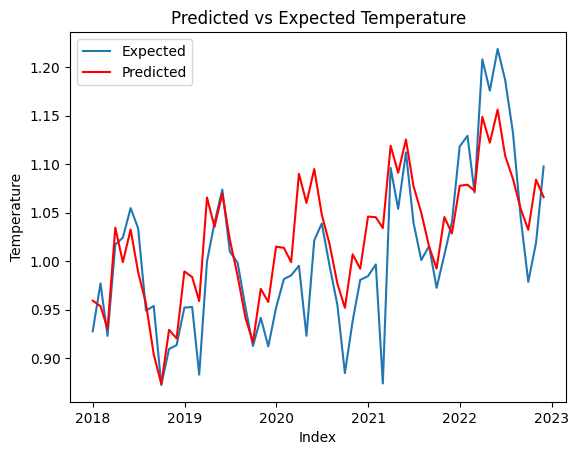

In [ ]:
# Make predictions using the fitted model
predictions = model_fit.predict(start=len(Train), end=len(Train)+len(Test)-1, dynamic=False).values

# Print predicted and expected values
for i in range(len(predictions)):
    print('predicted=%f, expected=%f' % (predictions[i], Test.iloc[i]))

index = Test.index.to_numpy()

# Plot predictions vs expected
plt.plot(index, Test.values, label='Expected')
plt.plot(index, predictions, color='red', label='Predicted')
plt.xlabel('Index')
plt.ylabel('Temperature')
plt.title('Predicted vs Expected Temperature')
plt.legend();

In [ ]:
# Calculate metrics for the predictions
metrics = calculate_metrics(Test, predictions)

# Create a DataFrame to hold the calculated metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])

# Add the calculated metrics as a row to the results DataFrame
results.loc['Autoregression'] = metrics_df.values[0]

In [ ]:
results

,RMSE,MAE,MAPE (%)
Model,,,
Naive,0.137196,0.112996,10.701457
Seasonal Naive,0.168325,0.163752,16.230965
Mean,0.466141,0.459026,45.254054
Drift,0.110533,0.088411,8.357195
Autoregression,0.048912,0.037691,3.787627


In [ ]:
# calculate residuals
# Predict values for the training set using the fitted autoregression model
# Start predicting from the 26th observation (lags = 25) to the end of the training set
predictions_train = model_fit.predict(start=25, end=len(Train), dynamic=False).values

# Extract the actual values of the training set starting from the 26th observation
Train_mod = Train[25:].values

# Calculate residuals by subtracting predicted values from actual values for each corresponding observation
train_resid = [Train_mod[i] - predictions_train[i] for i in range(len(Train_mod))]

In [ ]:
model_ma = AutoReg(train_resid, lags=200)
model_fit_ma = model_ma.fit()
print('Coefficients: %s' % model_fit_ma.params)

Coefficients: [-1.06636028e-03 -1.33281659e-01 -1.32242511e-01  6.22465737e-02
 -4.24418262e-02 -1.17833281e-02  1.72266020e-02  7.18889899e-02
  2.70475212e-02  9.55131567e-02  7.15419190e-02 -4.49003521e-05
 -7.74026822e-02 -2.49312723e-02  7.47550895e-02  1.84598154e-01
  8.23672894e-02  4.73702295e-02 -3.86237759e-02  8.49899037e-02
  5.75994664e-02 -4.61616558e-02 -9.94727832e-02 -9.32779122e-02
 -3.40566787e-01  1.36538669e-01  3.32478363e-02  1.40237452e-01
  4.57435134e-02 -6.25954853e-02  7.75262629e-02  2.22728241e-01
  4.07559274e-02  1.62064402e-02 -8.30191921e-02  1.17466860e-01
 -9.18427913e-03  2.59050103e-01  4.32678907e-02  8.01895822e-02
 -6.10684670e-02 -8.03595505e-02  4.12809006e-02  3.41293657e-02
 -1.24243273e-01 -3.28753445e-02 -6.05162367e-02  2.65370442e-02
 -2.42705234e-02  3.29990124e-02 -1.26361053e-01 -1.85799484e-01
 -6.70831993e-02 -3.14815554e-02 -1.41705282e-01 -9.64588475e-03
 -1.61322235e-01 -4.48928935e-02  4.12406831e-02  1.40074242e-02
  1.2947066

In [ ]:
model_fit_ma.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            AutoReg Model Results                             
==============================================================================
Dep. Variable:                      y   No. Observations:                  514
Model:                   AutoReg(200)   Log Likelihood                 850.101
Method:               Conditional MLE   S.D. of innovations              0.016
Date:                Mon, 24 Jun 2024   AIC                          -1296.202
Time:                        19:36:25   BIC                           -538.825
Sample:                           200   HQIC                          -993.568
                                  514                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0011      0.002     -0.652      0.514      -0.004       0.002
y.L1          -0.1333      0.056     -2.365      0.018      -0.244      -0.023
y.L2          -0.1322      0.057     -2.330      0.020      -0.243      -0.021
y.L3           0.0622      0.057      1.089      0.276      -0.050       0.174
y.L4          -0.0424      0.057     -0.739      0.460      -0.155       0.070
y.L5          -0.0118      0.058     -0.205      0.838      -0.125       0.101
y.L6           0.0172      0.057      0.303      0.762      -0.094       0.129
y.L7           0.0719      0.057      1.266      0.205      -0.039       0.183
y.L8           0.0270      0.056      0.483      0.629      -0.083       0.137
y.L9           0.0955      0.057      1.688      0.091      -0.015       0.206
y.L10          0.0715      0.057      1.262      0.207      -0.040       0.183
y.L11       -4.49e-05      0.057     -0.001      0.999      -0.111       0.111
y.L12         -0.0774      0.056     -1.383      0.167      -0.187       0.032
y.L13         -0.0249      0.056     -0.442      0.658      -0.135       0.086
y.L14          0.0748      0.056      1.332      0.183      -0.035       0.185
y.L15          0.1846      0.056      3.274      0.001       0.074       0.295
y.L16          0.0824      0.057      1.436      0.151      -0.030       0.195
y.L17          0.0474      0.057      0.826      0.409      -0.065       0.160
y.L18         -0.0386      0.058     -0.670      0.503      -0.152       0.074
y.L19          0.0850      0.058      1.462      0.144      -0.029       0.199
y.L20          0.0576      0.058      0.986      0.324      -0.057       0.172
y.L21         -0.0462      0.058     -0.792      0.428      -0.160       0.068
y.L22         -0.0995      0.059     -1.696      0.090      -0.214       0.016
y.L23         -0.0933      0.059     -1.586      0.113      -0.209       0.022
y.L24         -0.3406      0.059     -5.821      0.000      -0.455      -0.226
y.L25          0.1365      0.061      2.220      0.026       0.016       0.257
y.L26          0.0332      0.062      0.538      0.591      -0.088       0.154
y.L27          0.1402      0.062      2.251      0.024       0.018       0.262
y.L28          0.0457      0.062      0.735      0.463      -0.076       0.168
y.L29         -0.0626      0.062     -1.003      0.316      -0.185       0.060
y.L30          0.0775      0.062      1.259      0.208      -0.043       0.198
y.L31          0.2227      0.062      3.602      0.000       0.102       0.344
y.L32          0.0408      0.063      0.649      0.516      -0.082       0.164
y.L33          0.0162      0.061      0.266      0.790      -0.103       0.135
y.L34         -0.0830      0.061     -1.370      0.171      -0.202       0.036
y.L35          0.1175      0.061      1.933      0.053      -0.002       0.237
y.L36         -0.0092      0.060     -0.153      0.878      -0.127       0.108
y.L37          0.2591      0.060      4.320      0.000       0.142       0.377
y.

predicted=0.016464, expected=-0.031603
predicted=-0.012813, expected=0.023387
predicted=-0.062173, expected=-0.007412
predicted=0.024171, expected=-0.017330
predicted=-0.019549, expected=0.025206
predicted=0.002299, expected=0.022111
predicted=-0.044137, expected=0.045300
predicted=-0.036048, expected=-0.007367
predicted=0.016471, expected=0.049919
predicted=0.018623, expected=-0.000936
predicted=-0.006994, expected=-0.019712
predicted=0.023774, expected=-0.006948
predicted=-0.068765, expected=-0.037330
predicted=0.031643, expected=-0.030865
predicted=0.000053, expected=-0.075922
predicted=-0.026048, expected=-0.065754
predicted=0.038305, expected=0.004391
predicted=-0.048144, expected=0.004093
predicted=0.011614, expected=-0.012323
predicted=0.014642, expected=0.013679
predicted=-0.030292, expected=0.010923
predicted=-0.001106, expected=-0.003863
predicted=-0.044778, expected=-0.029877
predicted=0.010953, expected=-0.045838
predicted=0.024874, expected=-0.063037
predicted=0.024369, ex

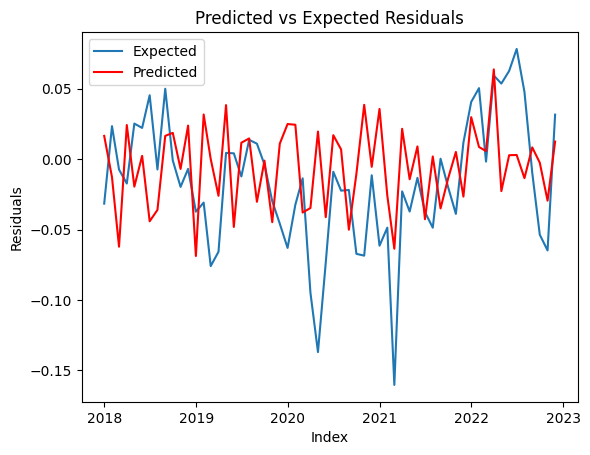

In [ ]:
# Make predictions using the fitted model
predictions_ma = model_fit_ma.predict(start=len(train_resid), end=len(train_resid)+len(Test)-1, dynamic=False)

# Print predicted and expected values
for i in range(len(predictions)):
    print('predicted=%f, expected=%f' % (predictions_ma[i], Test.iloc[i]-predictions[i]))

# Calculate and print Root Mean Squared Error (RMSE) for the predictions
# rmse = sqrt(mean_squared_error(test.values, predictions_ma))
# print('Test RMSE: %.3f' % rmse)

index = Test.index.to_numpy()

# Plot predictions vs expected
plt.plot(index, Test.values - predictions, label='Expected')
plt.plot(index, predictions_ma, color='red', label='Predicted')
plt.xlabel('Index')
plt.ylabel('Residuals')
plt.title('Predicted vs Expected Residuals')
plt.legend();

In [ ]:
predictions_sum = [x + y for x, y in zip(predictions, predictions_ma)]
# Calculate metrics for the predictions
metrics = calculate_metrics(Test, predictions_sum)

# Create a DataFrame to hold the calculated metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])

# Add the calculated metrics as a row to the results DataFrame
results.loc['AR+MA'] = metrics_df.values[0]

In [ ]:
results

,RMSE,MAE,MAPE (%)
Model,,,
Naive,0.137196,0.112996,10.701457
Seasonal Naive,0.168325,0.163752,16.230965
Mean,0.466141,0.459026,45.254054
Drift,0.110533,0.088411,8.357195
Autoregression,0.048912,0.037691,3.787627
AR+MA,0.051083,0.041880,4.223367


In [ ]:
# Automatically search for the best ARIMA model parameters using auto_arima function
auto_arima_model = auto_arima(Train, start_p=1, start_q=1,
                              max_p=30, max_q=30, m=1,
                              seasonal=False,
                              d=None, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True,
                              random_state=42)

# Print the best parameters found by auto_arima
print("Best parameters found by auto_arima:", auto_arima_model.order)

# Create an ARIMA model with the best parameters obtained from auto_arima
model_arima = ARIMA(Train, order=auto_arima_model.order)

# Fit the ARIMA model to the training data
arima_fit = model_arima.fit()

# Akaike Information Criterion (AIC) is a metric used to evaluate the goodness of fit of a statistical model while penalizing for the number of parameters in the model.
# The lower the AIC value, the better the model is considered to be.
# "intercept" refers to an additional parameter in the model equation that represents a constant term or a baseline level. Including an intercept term allows the model to capture any systematic offset or bias in the data that is not explained by the autoregressive (AR), differencing (I), and moving average (MA) components.

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=-2022.253, Time=3.57 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-1950.826, Time=0.31 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-1975.438, Time=0.45 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=-1977.869, Time=0.88 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-1952.535, Time=0.21 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=-2020.672, Time=2.47 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=-2018.669, Time=2.72 sec
 ARIMA(0,1,2)(0,0,0)[0] intercept   : AIC=-1983.009, Time=1.30 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-1973.629, Time=0.34 sec
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=-2020.135, Time=4.34 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=-2018.823, Time=0.92 sec

Best model:  ARIMA(1,1,1)(0,0,0)[0] intercept
Total fit time: 17.568 seconds
Best parameters found by auto_arima: (1, 1, 1)


### 4.15.The Akaike Information Criterion (AIC):


In [ ]:
arima_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                       
=============================================================================================
Dep. Variable:     Total Renewable Energy Production   No. Observations:                  539
Model:                                ARIMA(1, 1, 1)   Log Likelihood                1012.411
Date:                               Mon, 24 Jun 2024   AIC                          -2018.823
Time:                                       19:36:45   BIC                          -2005.959
Sample:                                   01-31-1973   HQIC                         -2013.791
                                        - 11-30-2017                                         
Covariance Type:                                 opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5723      0.056     10.169      0.000       0.462       0.683
ma.L1         -0.8791      0.032    -27.714      0.000      -0.941      -0.817
sigma2         0.0014   7.92e-05     17.125      0.000       0.001       0.002
===================================================================================
Ljung-Box (L1) (Q):                   0.32   Jarque-Bera (JB):                 5.36
Prob(Q):                              0.57   Prob(JB):                         0.07
Heteroskedasticity (H):               2.23   Skew:                             0.20
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.27
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

predicted=0.900877, expected=0.927670
predicted=0.903600, expected=0.976929
predicted=0.905159, expected=0.922932
predicted=0.906051, expected=1.017194
predicted=0.906561, expected=1.024178
predicted=0.906853, expected=1.054663
predicted=0.907020, expected=1.033802
predicted=0.907116, expected=0.948984
predicted=0.907171, expected=0.953714
predicted=0.907202, expected=0.872342
predicted=0.907220, expected=0.909450
predicted=0.907230, expected=0.913361
predicted=0.907236, expected=0.952043
predicted=0.907239, expected=0.952661
predicted=0.907241, expected=0.882918
predicted=0.907242, expected=0.999795
predicted=0.907243, expected=1.039700
predicted=0.907243, expected=1.073754
predicted=0.907244, expected=1.009869
predicted=0.907244, expected=0.998272
predicted=0.907244, expected=0.952554
predicted=0.907244, expected=0.912470
predicted=0.907244, expected=0.941536
predicted=0.907244, expected=0.912051
predicted=0.907244, expected=0.951898
predicted=0.907244, expected=0.981404
predicted=0.

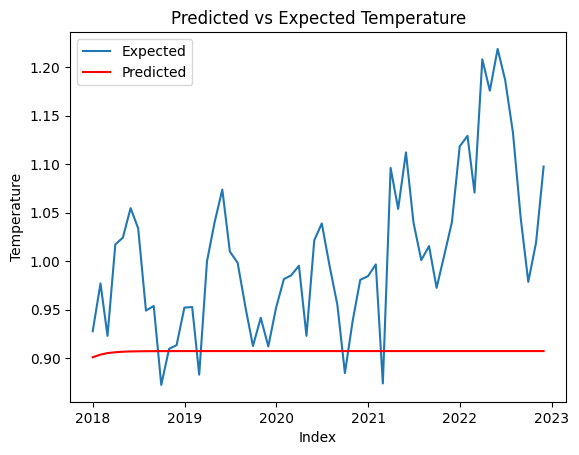

In [ ]:
# Make predictions using the fitted model
predictions = arima_fit.predict(start=len(Train), end=len(Train)+len(Test)-1, dynamic=False).values

# Print predicted and expected values
for i in range(len(predictions)):
    print('predicted=%f, expected=%f' % (predictions[i], Test.iloc[i]))

index = Test.index.to_numpy()

# Plot predictions vs expected
plt.plot(index, Test.values, label='Expected')
plt.plot(index, predictions, color='red', label='Predicted')
plt.xlabel('Index')
plt.ylabel('Temperature')
plt.title('Predicted vs Expected Temperature')
plt.legend();

In [ ]:
# Calculate metrics for the predictions
metrics = calculate_metrics(Test, predictions)

# Create a DataFrame to hold the calculated metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])

# Add the calculated metrics as a row to the results DataFrame
results.loc['ARIMA'] = metrics_df.values[0]

In [ ]:
results

,RMSE,MAE,MAPE (%)
Model,,,
Naive,0.137196,0.112996,10.701457
Seasonal Naive,0.168325,0.163752,16.230965
Mean,0.466141,0.459026,45.254054
Drift,0.110533,0.088411,8.357195
Autoregression,0.048912,0.037691,3.787627
AR+MA,0.051083,0.041880,4.223367
ARIMA,0.128491,0.103601,9.784219


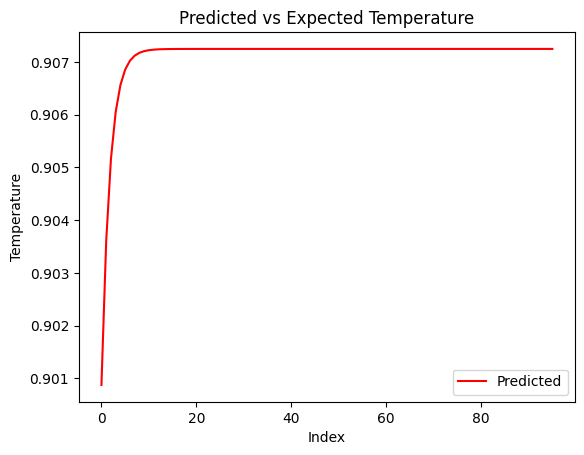

In [ ]:
# Make predictions using the fitted model
predictions = arima_fit.predict(start=len(Train), end=len(Train)+len(Test)-1+36, dynamic=False).values

# Plot predictions vs expected
plt.plot(predictions, color='red', label='Predicted')
plt.xlabel('Index')
plt.ylabel('Temperature')
plt.title('Predicted vs Expected Temperature')
plt.legend();

### 4.16.Seasonal Autoregressive Integrated Moving Average (SARIMA) model


In [ ]:
# fix the seed for randomness
seed = 42
np.random.seed(seed)

# Fit auto ARIMA model with seasonality
auto_aarima_model = auto_arima(Train, start_p=1, start_q=1,
                              max_p=30, max_q=30, m=12,  # Set m to the seasonal period
                              seasonal=True,  # Enable seasonal ARIMA
                              d=None, trace=True,
                              error_action='ignore',
                              suppress_warnings=True,
                              stepwise=True,
                              random_state=seed)

# Print best parameters found
print("Order (p,d,q):", auto_aarima_model.order)
print("Seasonal Order (P,D,Q,m):", auto_aarima_model.seasonal_order)

# Fit SARIMA model with the best parameters
model_sarima = ARIMA(Train, order=auto_aarima_model.order, seasonal_order=auto_aarima_model.seasonal_order)
sarima_fit = model_sarima.fit()

# Print summary of the fitted model
print(sarima_fit.summary())

Performing stepwise search to minimize aic
 ARIMA(1,1,1)(1,0,1)[12] intercept   : AIC=-2543.947, Time=6.66 sec
 ARIMA(0,1,0)(0,0,0)[12] intercept   : AIC=-1950.826, Time=0.26 sec
 ARIMA(1,1,0)(1,0,0)[12] intercept   : AIC=-2402.079, Time=3.27 sec
 ARIMA(0,1,1)(0,0,1)[12] intercept   : AIC=-2203.903, Time=2.31 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=-1952.535, Time=0.14 sec
 ARIMA(1,1,1)(0,0,1)[12] intercept   : AIC=-2239.120, Time=2.36 sec
 ARIMA(1,1,1)(1,0,0)[12] intercept   : AIC=-2434.285, Time=2.17 sec
 ARIMA(1,1,1)(2,0,1)[12] intercept   : AIC=-2522.131, Time=7.86 sec
 ARIMA(1,1,1)(1,0,2)[12] intercept   : AIC=-2532.403, Time=7.47 sec
 ARIMA(1,1,1)(0,0,0)[12] intercept   : AIC=-2022.253, Time=1.07 sec
 ARIMA(1,1,1)(0,0,2)[12] intercept   : AIC=-2304.943, Time=7.72 sec
 ARIMA(1,1,1)(2,0,0)[12] intercept   : AIC=-2476.760, Time=5.39 sec
 ARIMA(1,1,1)(2,0,2)[12] intercept   : AIC=-2551.142, Time=9.55 sec
 ARIMA(0,1,1)(2,0,2)[12] intercept   : AIC=-2537.252, Time=7.09 sec
 ARIM

predicted=0.959963, expected=0.927670
predicted=0.964514, expected=0.976929
predicted=0.907743, expected=0.922932
predicted=1.006008, expected=1.017194
predicted=0.995220, expected=1.024178
predicted=1.024191, expected=1.054663
predicted=0.999543, expected=1.033802
predicted=0.971655, expected=0.948984
predicted=0.929089, expected=0.953714
predicted=0.888913, expected=0.872342
predicted=0.925578, expected=0.909450
predicted=0.935664, expected=0.913361
predicted=0.987366, expected=0.952043
predicted=0.994798, expected=0.952661
predicted=0.938568, expected=0.882918
predicted=1.022563, expected=0.999795
predicted=1.013786, expected=1.039700
predicted=1.039775, expected=1.073754
predicted=1.019243, expected=1.009869
predicted=1.001464, expected=0.998272
predicted=0.961415, expected=0.952554
predicted=0.918190, expected=0.912470
predicted=0.950796, expected=0.941536
predicted=0.964452, expected=0.912051
predicted=1.015457, expected=0.951898
predicted=1.022583, expected=0.981404
predicted=0.

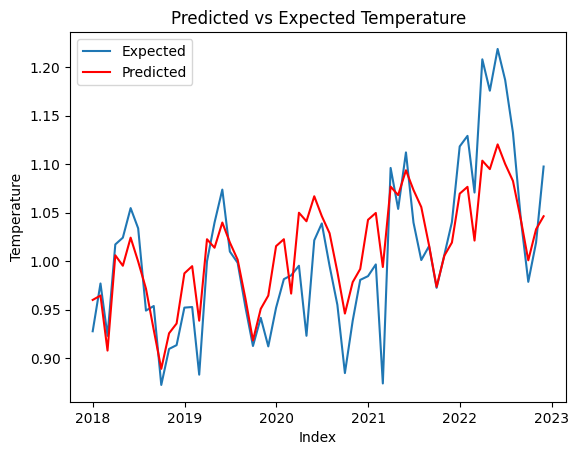

In [ ]:
# Make predictions using the fitted model
predictions = sarima_fit.predict(start=len(Train), end=len(Train)+len(Test)-1, dynamic=False).values

# Print predicted and expected values
for i in range(len(predictions)):
    print('predicted=%f, expected=%f' % (predictions[i], Test.iloc[i]))

# Plot predictions vs expected
index = Test.index.to_numpy()

plt.plot(index, Test.values, label='Expected')
plt.plot(index, predictions, color='red', label='Predicted')
plt.xlabel('Index')
plt.ylabel('Temperature')
plt.title('Predicted vs Expected Temperature')
plt.legend();


In [ ]:
# Calculate metrics for the predictions
metrics = calculate_metrics(Test.values, predictions)

# Create a DataFrame to hold the calculated metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])

# Add the calculated metrics as a row to the results DataFrame
results.loc['SARIMA'] = metrics_df.values[0]

In [ ]:
results

,RMSE,MAE,MAPE (%)
Model,,,
Naive,0.137196,0.112996,10.701457
Seasonal Naive,0.168325,0.163752,16.230965
Mean,0.466141,0.459026,45.254054
Drift,0.110533,0.088411,8.357195
Autoregression,0.048912,0.037691,3.787627
AR+MA,0.051083,0.041880,4.223367
ARIMA,0.128491,0.103601,9.784219
SARIMA,0.045670,0.035912,3.550115


### 4.17.Holt-Winters Seasonal Model


predicted=0.937050, expected=0.927670
predicted=0.949923, expected=0.976929
predicted=0.901758, expected=0.922932
predicted=0.972391, expected=1.017194
predicted=0.950490, expected=1.024178
predicted=0.974343, expected=1.054663
predicted=0.958859, expected=1.033802
predicted=0.945092, expected=0.948984
predicted=0.912021, expected=0.953714
predicted=0.873612, expected=0.872342
predicted=0.900552, expected=0.909450
predicted=0.909820, expected=0.913361
predicted=0.956451, expected=0.952043
predicted=0.960916, expected=0.952661
predicted=0.903487, expected=0.882918
predicted=0.979267, expected=0.999795
predicted=0.965185, expected=1.039700
predicted=0.988331, expected=1.073754
predicted=0.963550, expected=1.009869
predicted=0.951835, expected=0.998272
predicted=0.923302, expected=0.952554
predicted=0.884373, expected=0.912470
predicted=0.914775, expected=0.941536
predicted=0.923565, expected=0.912051
predicted=0.961334, expected=0.951898
predicted=0.974207, expected=0.981404
predicted=0.

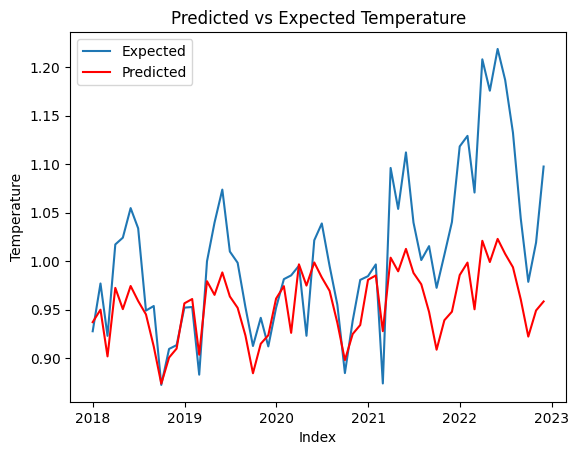

In [ ]:
# Fix the seed for randomness
seed = 42
np.random.seed(seed)

# Fit Holt-Winters Seasonal Model
holt_winters_model = ExponentialSmoothing(
    Train,
    seasonal_periods=24,
    trend='add',        # 'add' for additive trend, can be 'mul' for multiplicative
    seasonal='add'      # 'add' for additive seasonality, can be 'mul' for multiplicative
).fit()

# Make predictions using the fitted model
predictions = holt_winters_model.forecast(len(Test))

# Print predicted and expected values
for i in range(len(predictions)):
    print(f'predicted={predictions.iloc[i]:.6f}, expected={Test.iloc[i]:.6f}')

index = Test.index.to_numpy()

# Plot predictions vs expected
plt.plot(index, Test.values, label='Expected')
plt.plot(index, predictions.values, color='red', label='Predicted')
plt.xlabel('Index')
plt.ylabel('Temperature')
plt.title('Predicted vs Expected Temperature')
plt.legend()
plt.show()

In [ ]:
# Calculate metrics for the predictions
metrics = calculate_metrics(Test, predictions)

# Create a DataFrame to hold the calculated metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])

# Add the calculated metrics as a row to the results DataFrame
results.loc['Holt_Winters'] = metrics_df.values[0]

In [ ]:
results

,RMSE,MAE,MAPE (%)
Model,,,
Naive,0.137196,0.112996,10.701457
Seasonal Naive,0.168325,0.163752,16.230965
Mean,0.466141,0.459026,45.254054
Drift,0.110533,0.088411,8.357195
Autoregression,0.048912,0.037691,3.787627
AR+MA,0.051083,0.041880,4.223367
ARIMA,0.128491,0.103601,9.784219
SARIMA,0.045670,0.035912,3.550115
Holt_Winters,0.076045,0.057042,5.365478


## 5.Model Evalution

### 5.1.MLP

#### 5.1.1.Univariate MLP

**Objective**

The purpose of using MLP for time series forecastings is to model and predict the future values of a single variable based on the past observations, for this case, it is 'Total Renewable Energy Production'. It aims to cpature the temporal dependencies.

**Insights**

- Training and Validation Loss

After 2000 epochs of training and validation, the graph depicts an immediate drop in the loss indicating quick learning of the training set, which is also reflected in the validation loss graph which drops to zero and stays around there.

- MLP Model 1 and 2, 1 for Regular MLP and 2 for MLP with Early Stopping

The graph does not imporve after the 263 epochs when early stopping is implemented. Visually interpreting the training, validation and testing set graphs, the model seems to perform well and generalize on unseen data too.

- RMSE, MAE, MAPE comparison

Model 1:
RMSE = 0.029573
MAE = 0.023243
MAPE = 0.039849

Model 2:
RMSE = 0.028324
MAE = 0.022783
MAPE = 0.040368

The first model performs slightly worse as it goes beyond the early stopping bar, as it yields higher RMSE and MAE magnitudes of errors but the MAPE percentages are lower. However, as the MLP itself has a notable performance for the dataset.

In [ ]:
import os
import random
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.layers import Dense, Input
from keras.callbacks import EarlyStopping
from keras.models import Sequential, Model
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error


In [ ]:
# Split a univariate sequence into samples (input and output)
def split_sequence(sequence, n_steps):
    X = [sequence[i:i+n_steps] for i in range(len(sequence) - n_steps)]
    y = [sequence[i+n_steps] for i in range(len(sequence) - n_steps)]
    return np.array(X), np.array(y)


0


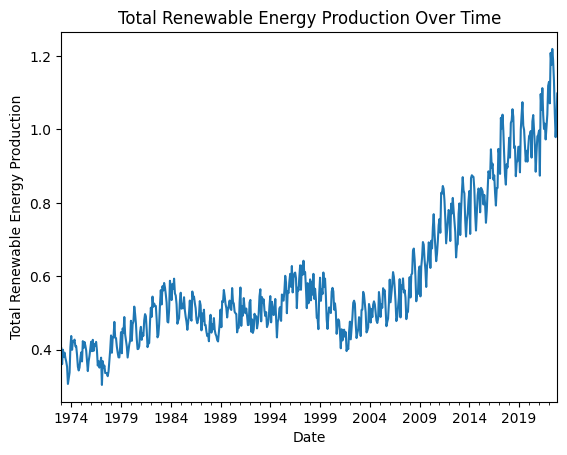

In [ ]:
# Read the CSV file 'World-Energy-Overview.csv' into a DataFrame
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')

# Set the frequency of the DataFrame to the start of the month ('MS')
#df = df.asfreq('MS')

# Apply differencing of order 1 to 'Total Renewable Energy Production'
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()

# Handle missing values by interpolation
df.interpolate(method='linear', inplace=True)

# Check for missing values
print(df['Total Renewable Energy Production'].isnull().sum())

# Plot the data
df['Total Renewable Energy Production'].plot()
plt.title('Total Renewable Energy Production Over Time')
plt.xlabel('Date')
plt.ylabel('Total Renewable Energy Production')
plt.show()


In [ ]:
# Prepare the data for time series forecasting
n_steps = 24
X, y = split_sequence(df['Total Renewable Energy Production'].tolist(), n_steps)

# Split data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Set the random seeds for reproducibility
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)


Epoch 1/2000
11/11 [==============================] - 1s 20ms/step - loss: 0.1904 - val_loss: 0.0235
Epoch 2/2000
11/11 [==============================] - 0s 6ms/step - loss: 0.0439 - val_loss: 0.0157
Epoch 3/2000
11/11 [==============================] - 0s 5ms/step - loss: 0.0074 - val_loss: 0.0125
Epoch 4/2000
11/11 [==============================] - 0s 5ms/step - loss: 0.0079 - val_loss: 0.0031
Epoch 5/2000
11/11 [==============================] - 0s 7ms/step - loss: 0.0042 - val_loss: 0.0034
Epoch 6/2000
11/11 [==============================] - 0s 5ms/step - loss: 0.0036 - val_loss: 0.0033
Epoch 7/2000
11/11 [==============================] - 0s 6ms/step - loss: 0.0035 - val_loss: 0.0030
Epoch 8/2000
11/11 [==============================] - 0s 6ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 9/2000
11/11 [==============================] - 0s 7ms/step - loss: 0.0034 - val_loss: 0.0029
Epoch 10/2000
11/11 [==============================] - 0s 7ms/step - loss: 0.0034 - val_loss: 0.002

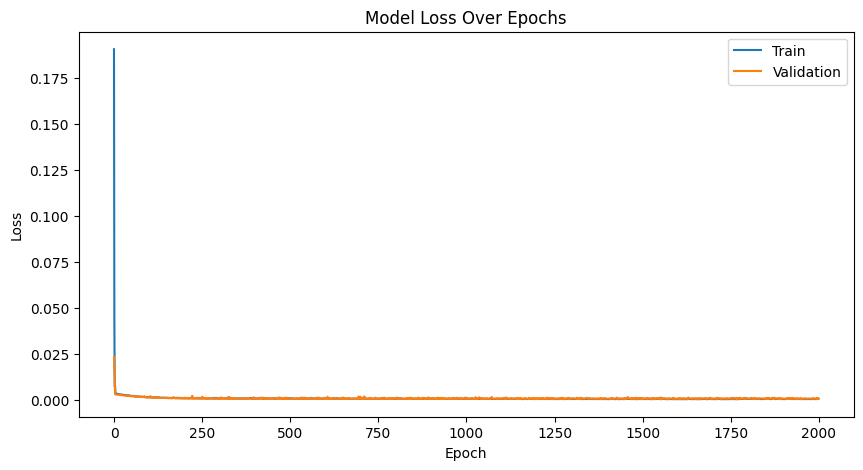

In [ ]:
# Define the model
model_1 = Sequential()
model_1.add(Dense(100, activation='relu', input_dim=n_steps))
model_1.add(Dense(1))
model_1.compile(optimizer='adam', loss='mse')

# Fit the model
history_1 = model_1.fit(X_train, y_train, epochs=2000, verbose=1, validation_data=(X_val, y_val))

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history_1.history['loss'])
plt.plot(history_1.history['val_loss'])
plt.title('Model Loss Over Epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()


4/4 [==============================] - 0s 3ms/step


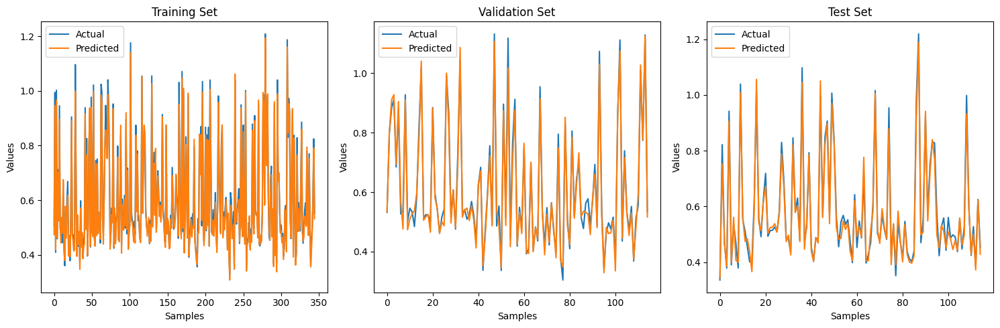

In [ ]:
# Predict values
y_train_pred = model_1.predict(X_train)
y_val_pred = model_1.predict(X_val)
y_test_pred = model_1.predict(X_test)

# Plot predictions vs actual values
plt.figure(figsize=(15, 5))

# Training set
plt.subplot(1, 3, 1)
plt.plot(y_train, label='Actual')
plt.plot(y_train_pred, label='Predicted')
plt.title('Training Set')
plt.xlabel('Samples')
plt.ylabel('Values')
plt.legend()

# Validation set
plt.subplot(1, 3, 2)
plt.plot(y_val, label='Actual')
plt.plot(y_val_pred, label='Predicted')
plt.title('Validation Set')
plt.xlabel('Samples')
plt.ylabel('Values')
plt.legend()

# Test set
plt.subplot(1, 3, 3)
plt.plot(y_test, label='Actual')
plt.plot(y_test_pred, label='Predicted')
plt.title('Test Set')
plt.xlabel('Samples')
plt.ylabel('Values')
plt.legend()

plt.tight_layout()
plt.show()


Epoch 1/2000
11/11 [==============================] - 1s 19ms/step - loss: 0.1764 - val_loss: 0.0470
Epoch 2/2000
11/11 [==============================] - 0s 7ms/step - loss: 0.0482 - val_loss: 0.0076
Epoch 3/2000
11/11 [==============================] - 0s 7ms/step - loss: 0.0087 - val_loss: 0.0139
Epoch 4/2000
11/11 [==============================] - 0s 5ms/step - loss: 0.0068 - val_loss: 0.0052
Epoch 5/2000
11/11 [==============================] - 0s 6ms/step - loss: 0.0051 - val_loss: 0.0039
Epoch 6/2000
11/11 [==============================] - 0s 5ms/step - loss: 0.0041 - val_loss: 0.0041
Epoch 7/2000
11/11 [==============================] - 0s 5ms/step - loss: 0.0038 - val_loss: 0.0038
Epoch 8/2000
11/11 [==============================] - 0s 6ms/step - loss: 0.0037 - val_loss: 0.0037
Epoch 9/2000
11/11 [==============================] - 0s 8ms/step - loss: 0.0036 - val_loss: 0.0036
Epoch 10/2000
11/11 [==============================] - 0s 5ms/step - loss: 0.0036 - val_loss: 0.003

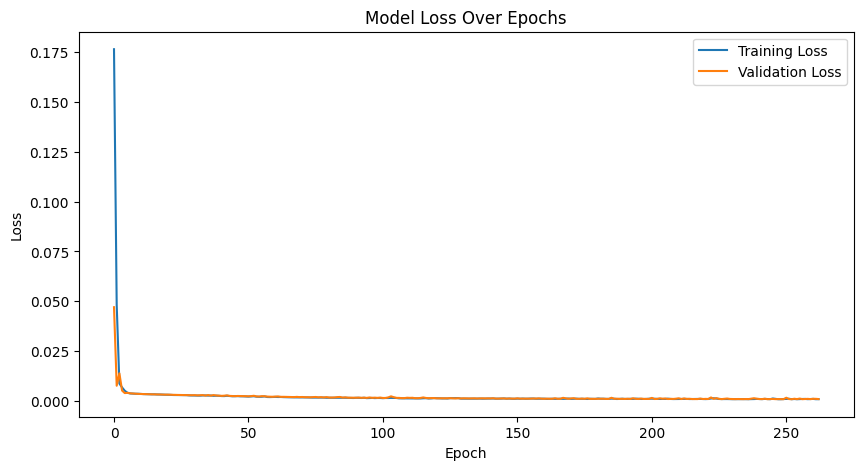

In [ ]:
# Define the EarlyStopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Define the model with EarlyStopping
model_2 = Sequential()
model_2.add(Dense(100, activation='relu', input_dim=n_steps))
model_2.add(Dense(1))
model_2.compile(optimizer='adam', loss='mse')

# Fit the model with EarlyStopping
history_2 = model_2.fit(X_train, y_train, epochs=2000, verbose=1, validation_data=(X_val, y_val), callbacks=[early_stopping])

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history_2.history['loss'], label='Training Loss')
plt.plot(history_2.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper right')
plt.show()


4/4 [==============================] - 0s 3ms/step


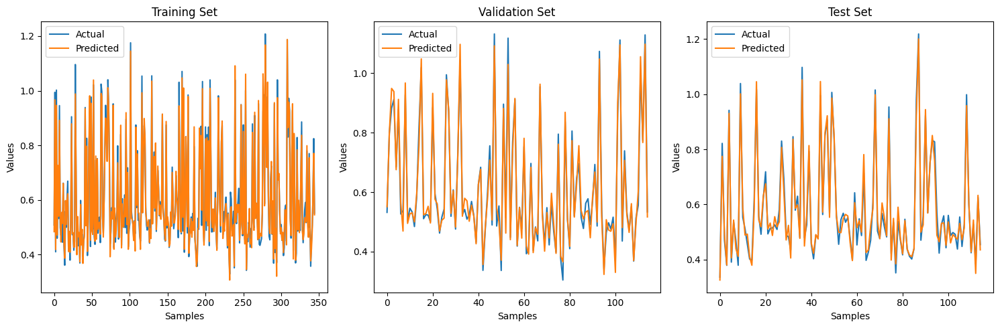

In [ ]:
# Predict values
y_train_pred = model_2.predict(X_train)
y_val_pred = model_2.predict(X_val)
y_test_pred = model_2.predict(X_test)

# Plot predictions vs actual values
plt.figure(figsize=(15, 5))

# Training set
plt.subplot(1, 3, 1)
plt.plot(y_train, label='Actual')
plt.plot(y_train_pred, label='Predicted')
plt.title('Training Set')
plt.xlabel('Samples')
plt.ylabel('Values')
plt.legend()

# Validation set
plt.subplot(1, 3, 2)
plt.plot(y_val, label='Actual')
plt.plot(y_val_pred, label='Predicted')
plt.title('Validation Set')
plt.xlabel('Samples')
plt.ylabel('Values')
plt.legend()

# Test set
plt.subplot(1, 3, 3)
plt.plot(y_test, label='Actual')
plt.plot(y_test_pred, label='Predicted')
plt.title('Test Set')
plt.xlabel('Samples')
plt.ylabel('Values')
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
# Function to print MAE for training, validation, and testing sets
def print_mae(model, X_train, y_train, X_val, y_val, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_val_pred = model.predict(X_val)
    y_test_pred = model.predict(X_test)

    train_mae = mean_absolute_error(y_train, y_train_pred)
    val_mae = mean_absolute_error(y_val, y_val_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)

    print(f'Training MAE: {train_mae}')
    print(f'Validation MAE: {val_mae}')
    print(f'Test MAE: {test_mae}')

# Print the MAE for the training, validation, and testing sets
print_mae(model_1, X_train, y_train, X_val, y_val, X_test, y_test)
print_mae(model_2, X_train, y_train, X_val, y_val, X_test, y_test)


4/4 [==============================] - 0s 9ms/step
Training MAE: 0.019396622062196597
Validation MAE: 0.021314955853354415
Test MAE: 0.023242827636967535
4/4 [==============================] - 0s 6ms/step
Training MAE: 0.021926575224414768
Validation MAE: 0.023449767548469884
Test MAE: 0.02278329065284729


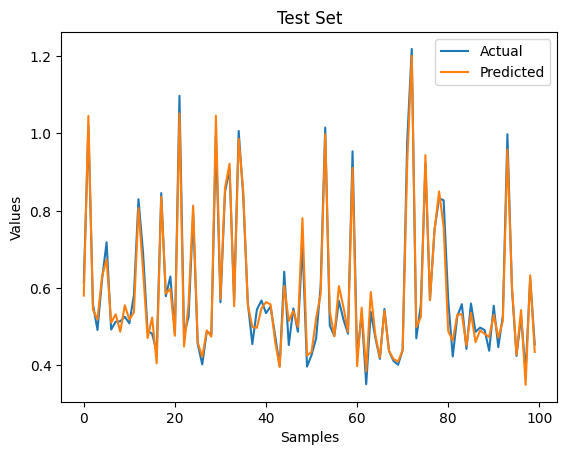

In [ ]:
plt.plot(y_test [-100:], label='Actual')
plt.plot(y_test_pred[-100:], label='Predicted')
plt.title('Test Set')
plt.xlabel('Samples')
plt.ylabel('Values')
plt.legend();

In [ ]:
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return rmse, mae, mape

# Calculate metrics for model_1
metrics_1 = {
    'Train': calculate_metrics(y_train, model_1.predict(X_train)),
    'Validation': calculate_metrics(y_val, model_1.predict(X_val)),
    'Test': calculate_metrics(y_test, model_1.predict(X_test))
}

# Calculate metrics for model_2
metrics_2 = {
    'Train': calculate_metrics(y_train, model_2.predict(X_train)),
    'Validation': calculate_metrics(y_val, model_2.predict(X_val)),
    'Test': calculate_metrics(y_test, model_2.predict(X_test))
}

# Create DataFrame for model_1 metrics
df_metrics_1 = pd.DataFrame(metrics_1, index=['RMSE', 'MAE', 'MAPE'])
df_metrics_1.columns.name = 'Model 1'

# Create DataFrame for model_2 metrics
df_metrics_2 = pd.DataFrame(metrics_2, index=['RMSE', 'MAE', 'MAPE'])
df_metrics_2.columns.name = 'Model 2'

# Display the metrics
print("Model 1 Metrics:")
print(df_metrics_1)
print("\nModel 2 Metrics:")
print(df_metrics_2)


4/4 [==============================] - 0s 3ms/step
Model 1 Metrics:
Model 1     Train  Validation      Test
RMSE     0.024781    0.027774  0.029573
MAE      0.019397    0.021315  0.023243
MAPE     0.032292    0.036471  0.039849

Model 2 Metrics:
Model 2     Train  Validation      Test
RMSE     0.029180    0.029628  0.028324
MAE      0.021927    0.023450  0.022783
MAPE     0.037588    0.040167  0.040368


#### 5.1.2.Multivaraite MLP Models: ALL models in here

**Objective**

The importance of using a Multivariate MLP is for understanding multiple related time series simultaneously for total renewable energy production and total fossil fuels production. It also capturing the complex interactions and dependencies between them.

Three tests have been conducted in this domain:

1. Multi-input Series MLP

A multi-input series approach involves using multiple different input features to inform the model. IIt is used for forecasting total energy produced using the input features of the total renewable and fossil fuels production.


2. Multi-headed MLP

This architecture involves using separate "heads" for different targets while sharing some common hidden layers. In this context, one head could be dedicated to predicting total renewable energy production, and another head for predicting total fossil fuels
production. At the end, each type of energy production is checked for distinct patterns and then combined to make a final prediction for total energy produced.  


3. Multiple Parallel Series

This approach treats each energy production type as a separate time series but learns them in parallel. The MLP takes inputs from both the renewable and fossil fuel time series simultaneously, allowing it to capture interactions and dependencies between the two series. This way, the model can better understand the overall energy production landscape.


4. Multi-output MLP

MLP is designed to produce multiple outputs simultaneously. The inputs can be a combination of features related to both renewable and fossil fuels production. The output layer of the MLP will have two nodes, one for predicting the total renewable energy production and one for predicting the total fossil fuels production. This approach ensures that the model learns the joint distribution and dependencies between the two output variables.


**Insights**

1. The Multiple-Input Series MLP exhibits the lowest error metrics on RMSE, MAE, and MAPE, indicating high performance and good generalization on unseen data. For testing, RMSE = 0.001848,
MAE = 0.001828, and MAPE = 0.000325.

2. Multi-headed MLP has higher error metrics than the prior model but still performs well. Since, each head processes the inputs independently, there maybe a limitation.

3. Treating the series separately without strong interaction modeling can lead to poorer performance since the model may not effectively capture the dependencies between renewable and fossil fuels production. Hence, it performed poorly on Multiple parallel series compared to both the previous models. This also indicates a importance of dependency between them.

4. Interestingly, multi-output MLP has high MAPE values for training which hints instabiltiy in learning data due to high complexity making the model unreliable, even if the testing seemed good for gnerelization.

In [ ]:
import pandas as pd
import numpy as np
from keras.models import Sequential, Model
from keras.layers import Dense, Input, concatenate
import tensorflow as tf
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

# Function to calculate and return RMSE, MAE, and MAPE
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return rmse, mae, mape

# Function to format metrics into a DataFrame
def format_metrics(train_metrics, test_metrics):
    df_metrics = pd.DataFrame({
        'Train': train_metrics,
        'Test': test_metrics
    }, index=['RMSE', 'MAE', 'MAPE'])
    return df_metrics

# Load the dataset
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')



# Select relevant columns
df = df[['Total Renewable Energy Production', 'Total Fossil Fuels Production']]
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()
#df['Total Fossil Fuels Production'] = df['Total Fossil Fuels Production'].diff()

# Handle missing values if any
df.interpolate(method='linear', inplace=True)

# Display the first few rows
print("Dataset Sample:")
print(df.head())

Dataset Sample:
            Total Renewable Energy Production  Total Fossil Fuels Production
Date                                                                        
1973-01-31                           0.403981                       4.932632
1973-02-28                           0.360900                       4.729582
1973-03-31                           0.400161                       4.946902
1973-04-30                           0.380470                       4.716271
1973-05-31                           0.392141                       4.956995


#### 5.1.3.Multiple Input Series (Multivariate MLP)

In [ ]:
# Define input sequences
in_seq1 = df['Total Renewable Energy Production'].values
in_seq2 = df['Total Fossil Fuels Production'].values
out_seq = in_seq1 + in_seq2

# Convert sequences to a [rows, columns] structure
in_seq1 = in_seq1.reshape((len(in_seq1), 1))
in_seq2 = in_seq2.reshape((len(in_seq2), 1))
out_seq = out_seq.reshape((len(out_seq), 1))

# Horizontally stack columns to create the dataset
dataset = np.hstack((in_seq1, in_seq2, out_seq))

# Function to split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = [], []
    for i in range(len(sequences) - n_steps + 1):
        end_ix = i + n_steps
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Choose a number of time steps
n_steps = 3

# Convert the dataset into input/output samples
X_mlp, y_mlp = split_sequences(dataset, n_steps)

# Flatten input for MLP
n_input_mlp = X_mlp.shape[1] * X_mlp.shape[2]
X_mlp = X_mlp.reshape((X_mlp.shape[0], n_input_mlp))

# Split data into training and test sets
X_mlp_train, X_mlp_test, y_mlp_train, y_mlp_test = train_test_split(X_mlp, y_mlp, test_size=0.2, random_state=42)

# Define the model architecture for Multivariate MLP
model_mlp = Sequential()
model_mlp.add(Dense(100, activation='relu', input_dim=n_input_mlp))
model_mlp.add(Dense(1))
model_mlp.compile(optimizer='adam', loss='mse')

# Fit the model on training data
model_mlp.fit(X_mlp_train, y_mlp_train, epochs=1000, verbose=0)

# Predict on training and test data
y_mlp_train_pred = model_mlp.predict(X_mlp_train)
y_mlp_test_pred = model_mlp.predict(X_mlp_test)

# Calculate metrics for Multivariate MLP
train_metrics_mlp = calculate_metrics(y_mlp_train, y_mlp_train_pred)
test_metrics_mlp = calculate_metrics(y_mlp_test, y_mlp_test_pred)

# Format and display metrics for Multivariate MLP
print("\nMetrics for Multiple Input Series (Multivariate MLP):")
print(format_metrics(train_metrics_mlp, test_metrics_mlp))


4/4 [==============================] - 0s 4ms/step

Metrics for Multiple Input Series (Multivariate MLP):
         Train      Test
RMSE  0.001861  0.001848
MAE   0.001831  0.001828
MAPE  0.000325  0.000325


#### 5.1.4.Multi-headed MLP

In [ ]:
# Function to split a multivariate sequence into samples for multi-headed MLP
def split_sequences_multiheaded(sequences, n_steps):
    X, y = [], []
    for i in range(len(sequences) - n_steps + 1):
        end_ix = i + n_steps
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix-1, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Convert into input/output samples for multi-headed MLP
X_multiheaded, y_multiheaded = split_sequences_multiheaded(dataset, n_steps)

# Split data into training and test sets
X1_multiheaded = X_multiheaded[:, :, 0]
X2_multiheaded = X_multiheaded[:, :, 1]
X1_multiheaded_train, X1_multiheaded_test, X2_multiheaded_train, X2_multiheaded_test, y_multiheaded_train, y_multiheaded_test = train_test_split(X1_multiheaded, X2_multiheaded, y_multiheaded, test_size=0.2, random_state=42)

# Define the model architecture for Multi-headed MLP
visible1_multiheaded = Input(shape=(n_steps,))
dense1_multiheaded = Dense(100, activation='relu')(visible1_multiheaded)
visible2_multiheaded = Input(shape=(n_steps,))
dense2_multiheaded = Dense(100, activation='relu')(visible2_multiheaded)
merged_multiheaded = concatenate([dense1_multiheaded, dense2_multiheaded])
output_multiheaded = Dense(1)(merged_multiheaded)
model_multiheaded = Model(inputs=[visible1_multiheaded, visible2_multiheaded], outputs=output_multiheaded)
model_multiheaded.compile(optimizer='adam', loss='mse')

# Fit the model on training data
model_multiheaded.fit([X1_multiheaded_train, X2_multiheaded_train], y_multiheaded_train, epochs=2000, verbose=0)

# Predict on training and test data
y_multiheaded_train_pred = model_multiheaded.predict([X1_multiheaded_train, X2_multiheaded_train])
y_multiheaded_test_pred = model_multiheaded.predict([X1_multiheaded_test, X2_multiheaded_test])

# Calculate metrics for Multi-headed MLP
train_metrics_multiheaded = calculate_metrics(y_multiheaded_train, y_multiheaded_train_pred)
test_metrics_multiheaded = calculate_metrics(y_multiheaded_test, y_multiheaded_test_pred)

# Format and display metrics for Multi-headed MLP
print("\nMetrics for Multi-headed MLP:")
print(format_metrics(train_metrics_multiheaded, test_metrics_multiheaded))




4/4 [==============================] - 0s 4ms/step

Metrics for Multi-headed MLP:
         Train      Test
RMSE  0.002189  0.002167
MAE   0.002122  0.002102
MAPE  0.000373  0.000370


#### 5.1.5.Multiple Parallel Series (Multivariate Forecasting)

In [ ]:
# Function to split a multivariate sequence into samples for multivariate forecasting
def split_sequences_multivar(sequences, n_steps):
    X, y = [], []
    for i in range(len(sequences) - n_steps):
        end_ix = i + n_steps
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix, :]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Convert into input/output samples for multivariate forecasting
X_multivar, y_multivar = split_sequences_multivar(dataset, n_steps)

# Flatten input for multivariate forecasting
n_input_multivar = X_multivar.shape[1] * X_multivar.shape[2]
X_multivar_flat = X_multivar.reshape((X_multivar.shape[0], n_input_multivar))

# Split data into training and test sets
X_multivar_train, X_multivar_test, y_multivar_train, y_multivar_test = train_test_split(X_multivar_flat, y_multivar, test_size=0.2, random_state=42)

# Define the model architecture for Multivariate Forecasting
model_multivar = Sequential()
model_multivar.add(Dense(100, activation='relu', input_dim=n_input_multivar))
model_multivar.add(Dense(n_steps))
model_multivar.compile(optimizer='adam', loss='mse')

# Fit the model on training data
model_multivar.fit(X_multivar_train, y_multivar_train, epochs=2000, verbose=0)

# Predict on training and test data
y_multivar_train_pred = model_multivar.predict(X_multivar_train)
y_multivar_test_pred = model_multivar.predict(X_multivar_test)

# Calculate metrics for Multivariate Forecasting
train_metrics_multivar = calculate_metrics(y_multivar_train.flatten(), y_multivar_train_pred.flatten())
test_metrics_multivar = calculate_metrics(y_multivar_test.flatten(), y_multivar_test_pred.flatten())

# Format and display metrics for Multivariate Forecasting
print("\nMetrics for Multiple Parallel Series (Multivariate Forecasting):")
print(format_metrics(train_metrics_multivar, test_metrics_multivar))


4/4 [==============================] - 0s 3ms/step

Metrics for Multiple Parallel Series (Multivariate Forecasting):
         Train      Test
RMSE  0.158269  0.156497
MAE   0.105059  0.109025
MAPE  0.034884  0.036182


#### 5.1.5.Multi-output MLP

In [ ]:
import pandas as pd
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Flatten
import tensorflow as tf
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split

# Function to split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = [], []  # Initialize empty lists for inputs and outputs
    for i in range(len(sequences) - n_steps_in - n_steps_out + 1):
        # Define the end index of the input sequence
        end_ix = i + n_steps_in
        # Define the end index of the output sequence
        out_end_ix = end_ix + n_steps_out
        # Extract input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
        X.append(seq_x)  # Append input sequence to X
        y.append(seq_y)  # Append output sequence to y
    return np.array(X), np.array(y)  # Convert lists to numpy arrays and return

# Function to calculate and return RMSE, MAE, and MAPE
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return rmse, mae, mape

# Function to format metrics into a DataFrame
def format_metrics(train_metrics, test_metrics):
    df_metrics = pd.DataFrame({
        'Train': train_metrics,
        'Test': test_metrics
    }, index=['RMSE', 'MAE', 'MAPE'])
    return df_metrics

# Load and preprocess the dataset
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')
df = df[['Total Renewable Energy Production', 'Total Fossil Fuels Production']]
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()
#df['Total Fossil Fuels Production'] = df['Total Fossil Fuels Production'].diff()
df.interpolate(method='linear', inplace=True)

# Normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df)

# Choose number of time steps for input and output
n_steps_in, n_steps_out = 3, 2

# Convert dataset into input/output pairs
X, y = split_sequences(scaled_data, n_steps_in, n_steps_out)

# Flatten output to match the required shape for the model
n_output = y.shape[1] * y.shape[2]
y = y.reshape((y.shape[0], n_output))

# Print the shapes of the input and output arrays
print(X.shape, y.shape)

# Set the seed for reproducibility
np.random.seed(100)
tf.random.set_seed(100)

# Number of features in the dataset
n_features = X.shape[2]

# Define the model
model = Sequential([
    Flatten(input_shape=(n_steps_in, n_features)),
    Dense(100, activation='relu'),
    Dense(100, activation='relu'),
    Dense(n_output)
])

# Compile the model using the Adam optimizer and mean squared error loss function
model.compile(optimizer='adam', loss='mse')

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, shuffle=False)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

# Fit the model
model.fit(X_train, y_train, epochs=300, validation_data=(X_val, y_val), verbose=0)

# Evaluate the model on training set
y_train_pred = model.predict(X_train)
train_rmse, train_mae, train_mape = calculate_metrics(y_train, y_train_pred)

# Evaluate the model on test set
y_test_pred = model.predict(X_test)
test_rmse, test_mae, test_mape = calculate_metrics(y_test, y_test_pred)

# Format and display metrics
train_metrics = [train_rmse, train_mae, train_mape]
test_metrics = [test_rmse, test_mae, test_mape]
print("\nMetrics for Multi-output MLP:")
print(format_metrics(train_metrics, test_metrics))



(595, 3, 2) (595, 4)
3/3 [==============================] - 0s 4ms/step

Metrics for Multi-output MLP:
             Train      Test
RMSE  3.547904e-02  0.119843
MAE   2.724694e-02  0.101809
MAPE  5.163408e+11  0.135610


#### 5.1.6.Multi-step MLP Models


**Objective**

Multi-step MLP model is to predict the future values of total renewable energy production based on historical data



**Insights**

- Training and Validation Loss

The graph plummets quickly at the start to zero and remians stable for both training and validaiton losses.

- Actual vs Predicted

The model accurately captures the overal trend of the actual values but the fluctuations of the predicted is less amplitfied than the actual values. Fortuantely, there is no time shift and the peaks and troughs match well.


- Training vs. Test Performance

The slightly higher RMSE and MAE on the test set compared to the
 training set indicate some overfitting, but the differences are small, suggesting the model generalizes reasonably well.

- MAPE Consistency

The consistency in MAPE between training and test sets (both 0.05%) indicates stable performance in terms of percentage error, reaffirming the model's robustness.

### 5.2.CNN

4/4 [==============================] - 0s 4ms/step
Training Metrics:
RMSE: 0.03, MAE: 0.03, MAPE: 0.05%

Test Metrics:
RMSE: 0.06, MAE: 0.05, MAPE: 0.05%


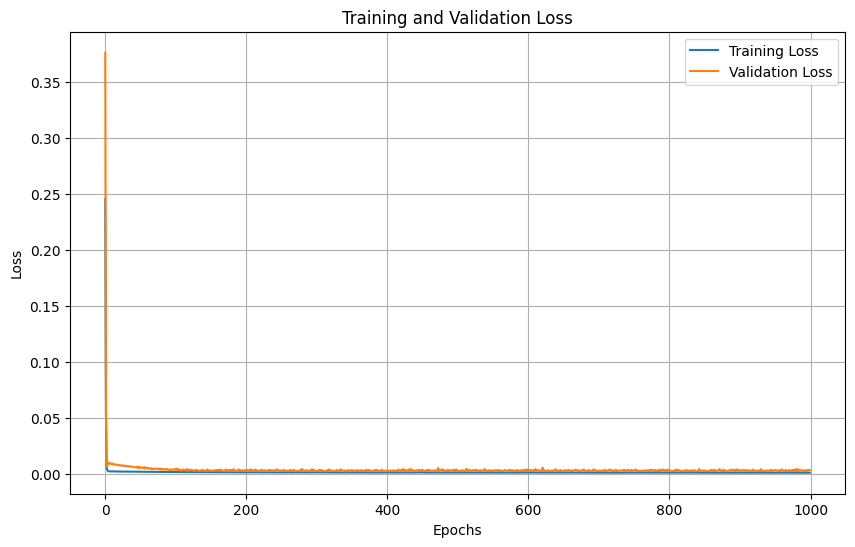

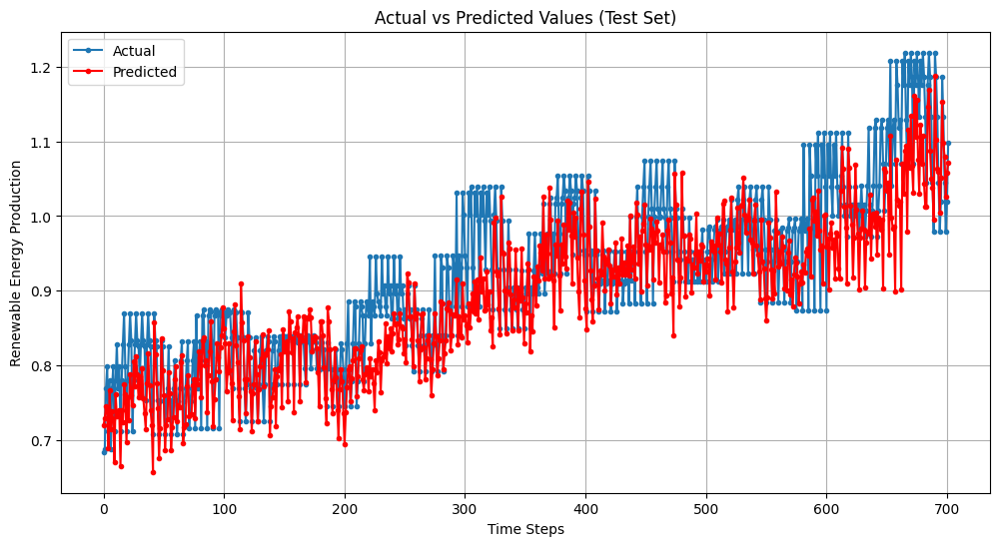

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import Dense
import tensorflow as tf
import random
import os

# Load the dataset
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')

# Apply differencing of order 1 to 'Total Renewable Energy Production'
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()

# Select relevant column
data = df['Total Renewable Energy Production'].values

# Function to split a univariate sequence into input/output samples
def split_sequence(sequence, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(sequence) - n_steps_in - n_steps_out + 1):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix:out_end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Choose a number of time steps for input and output
n_steps_in = 12  # Number of input time steps
n_steps_out = 6  # Number of output time steps

# Split the dataset into input/output samples
X, y = split_sequence(data, n_steps_in, n_steps_out)

# Split into training and test sets
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]


# Define the model
model = Sequential()
model.add(Dense(100, activation='relu', input_dim=n_steps_in))
model.add(Dense(n_steps_out))

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Set random seed for reproducibility
seed = 42
np.random.seed(seed)
tf.random.set_seed(seed)
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

# Fit the model
history = model.fit(X_train, y_train, epochs=1000, validation_data=(X_test, y_test), verbose=0)


# Function to calculate and return RMSE, MAE, and MAPE
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return rmse, mae, mape

# Predict on training and test sets
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

# Calculate metrics
train_rmse, train_mae, train_mape = calculate_metrics(y_train, y_train_pred)
test_rmse, test_mae, test_mape = calculate_metrics(y_test, y_test_pred)

# Print metrics
print("Training Metrics:")
print(f"RMSE: {train_rmse:.2f}, MAE: {train_mae:.2f}, MAPE: {train_mape:.2f}%")
print("\nTest Metrics:")
print(f"RMSE: {test_rmse:.2f}, MAE: {test_mae:.2f}, MAPE: {test_mape:.2f}%")

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

# Plot actual vs predicted values for test set
plt.figure(figsize=(12, 6))
plt.plot(y_test.flatten(), marker='.', label='Actual')
plt.plot(y_test_pred.flatten(), 'r', marker='.', label='Predicted')
plt.title('Actual vs Predicted Values (Test Set)')
plt.xlabel('Time Steps')
plt.ylabel('Renewable Energy Production')
plt.legend()
plt.grid(True)
plt.show()



#### 5.2.1.Univariate CNN

**Objective**

- This model is implemented on the dataset to predict the total renewable energy production based on past observations (a single variable). CNNs are very helpful in recognizing patterns in sequential data (though generally meant for pattern recognition in images) and extract features to give higher accuracy.


**Insights**

- Training and Validation Loss Graph

The loss for training loss (blue line) starts above 0.25 and starkly drops to zero even before 5 epochs and remains as a horizontal line, and the validation loss (orange line) follows a similar trend by dropping from between 0.05 and 0.10 and converge with the training loss line.

The drop in training loss suggests that the model quickly learns the data and the convergence with validation data hints that this can be generalized for the future unseen time period as well.

- Predicted vs Actual Values Graph

The actual values are represented by the blue line, whereas the predicted are shown by the orange line. Visually intepreting, it can be seen that the predicted and actual values closely coinicide with each other. Therefore, we can say that the univariate CNN almost accurately captures the seasonality and trends of the 'Total Renewable Energy Production' variable

- Error Comparison with RMSE, MAE, MAPE

The RMSE and MAE for Univariate_CNN is 0.04039 and 0.032823, with MAPE at 5.598695, respectively as opposed to the next best model which is SARIMA that has the values of 0.045670, 0.035912, 3.550115 and Autoregression with values of 0.048912	0.037691 and 3.787627. Note, the time steps have been set to 24, meaning 2 years.


Importantly, MAPE remained relatively higher even if RMSE and MAE values dropped down to closer to SARIMA's values. This because the percentage errors from small values can be very high and might go as high as infinity for MAPE. CNN model in this case has yielded low actual values causing this trend.



4/4 [==============================] - 0s 3ms/step
MSE: 0.0013278588510175617
MAE: 0.029279540468199357
MAPE: 0.05105622258000129


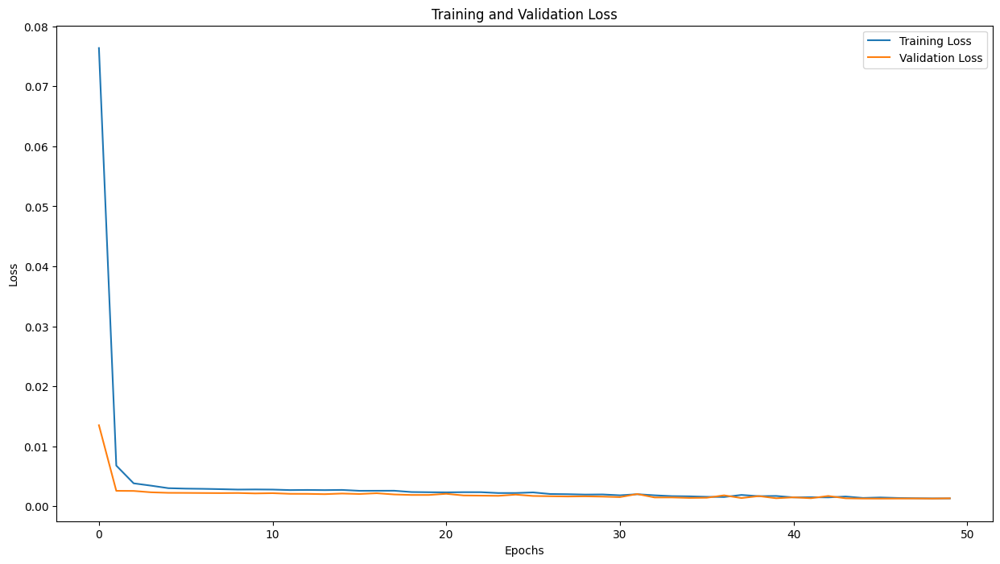

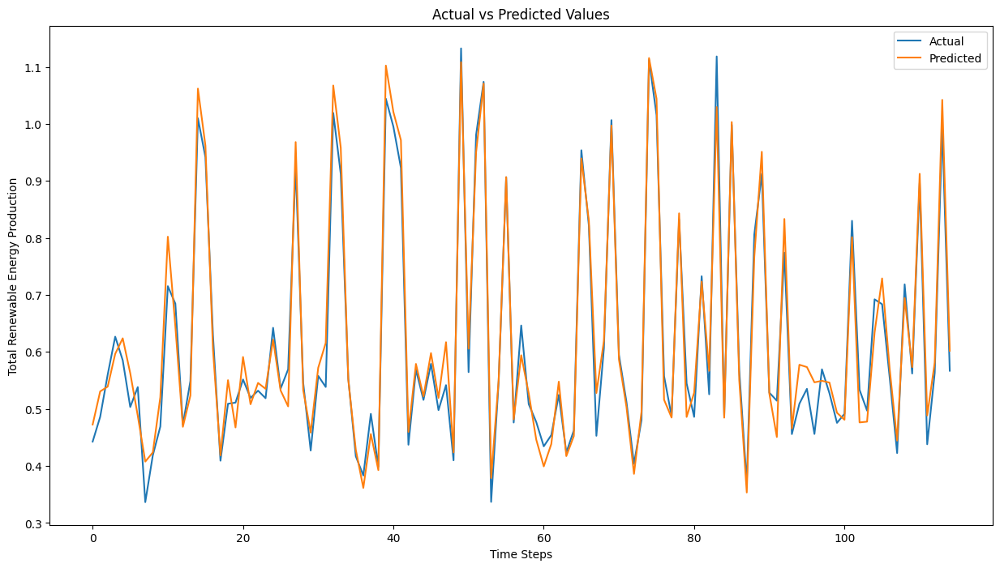

                   RMSE      MAE  MAPE (%)
Univariate_CNN  0.03644  0.02928  5.105622


In [ ]:
"""
Univariate CNN
"""


import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

# Assuming df is a DataFrame and the 'Total Renewable Energy Production' column exists
# For example, you can create a DataFrame like this:
# df = pd.DataFrame({'Total Renewable Energy Production': np.random.rand(100)})

df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')

# Apply differencing of order 1 to 'Total Renewable Energy Production'
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()

# Assuming df is defined and contains the required data
data = df['Total Renewable Energy Production'].dropna().values

def split_sequence(sequence, n_steps):
    X, y = [], []
    for i in range(len(sequence) - n_steps):
        seq_x, seq_y = sequence[i:i + n_steps], sequence[i + n_steps]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Define the number of time steps
n_steps = 24

# Split the data into input-output pairs
X, y = split_sequence(data, n_steps)

# Reshape the input data to be [samples, time steps, features]
X = X.reshape((X.shape[0], X.shape[1], 1))

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build the CNN model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, 1)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Fit the model
history = model.fit(X_train, y_train, epochs=50, validation_data=(X_test, y_test), verbose=0)

# Evaluate the model
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f'MSE: {mse}')
print(f'MAE: {mae}')
print(f'MAPE: {mape}')

# Plot the training and validation loss
plt.figure(figsize=(15, 8))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

# Plot the actual vs predicted values
plt.figure(figsize=(15, 8))
plt.plot(y_test, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.xlabel('Time Steps')
plt.ylabel('Total Renewable Energy Production')
plt.legend()
plt.title('Actual vs Predicted Values')
plt.show()

# Calculate RMSE
rmse = np.sqrt(mse)

# Create a DataFrame to hold the calculated metrics
metrics = {
    'RMSE': rmse,
    'MAE': mae,
    'MAPE (%)': mape * 100  # Convert MAPE to percentage
}

# Create a DataFrame for the metrics
results = pd.DataFrame(columns=['RMSE', 'MAE', 'MAPE (%)'])

# Assuming results is a DataFrame defined elsewhere to store results
# For example, you can initialize it like this if not defined:
# results = pd.DataFrame(columns=['RMSE', 'MAE', 'MAPE (%)'])

# Add the calculated metrics as a row to the results DataFrame
# Add the calculated metrics as a row to the results DataFrame
results.loc['Univariate_CNN'] = [metrics['RMSE'], metrics['MAE'], metrics['MAPE (%)']]

# Display the results DataFrame
print(results)


#### 5.2.2.Multi-step CNN Model

**Objective**

Multi-step forecasting involves predicting a sequence of future values rather
than just a single future value. This approach is essential in where expect to see future trends over multiple time steps can provide more actionable insights.

**Insights**

- Actual vs Predicted Values

The blue line represents the actual values for the 'Total Renewable Energy Renewable Production' whereas the red dotted line indicates the predicted values for the same. The time step is setp to 24, with 25 input, which is means inputting past two years are used to predict the next two years.

Visually interpreting, the seasonality of the predicted values are very similar to the actual values. The trend grows in a upward trend similar to the historical data at the same slope rate. Thus, the multi-step CNN is able to capture a good prediction based on the historical data. This tells the production for the next two years will grow for renewbale energy at the same rate as before.

- Comparison with RMSE, MAE and MAPE

The Multi-step CNN model, despite having slightly higher RMSE and MAE (0.072331  0.057219) compared to the Univariate CNN (0.048757  0.038186), shows better percentage accuracy (lower MAPE  Multi-CNN: 5.606105 | Univariate_CNN: 6.545187). This indicates that for multi-step forecasting, the model is able to provide more reliable predictions over longer horizons.


1/1 [==============================] - 0s 73ms/step


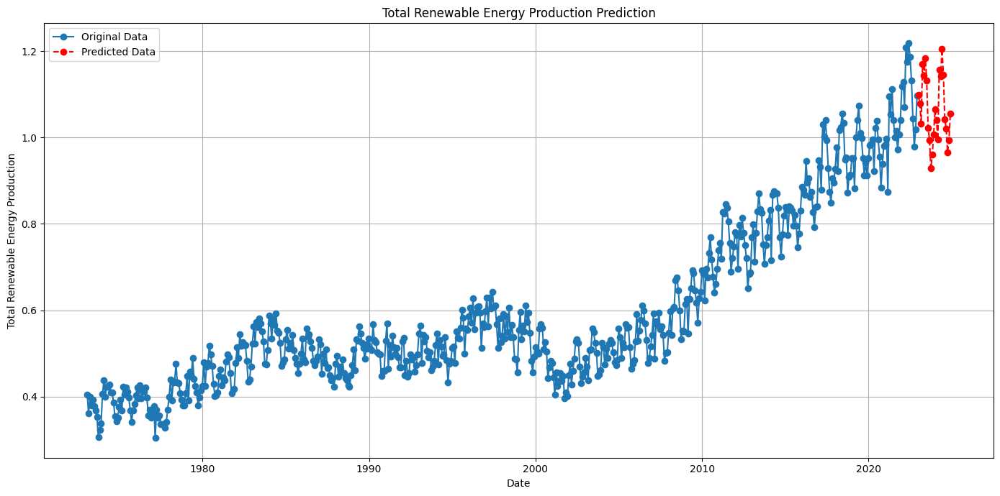

                    RMSE       MAE  MAPE (%)
Univariate_CNN  0.036440  0.029280  5.105622
Multi-step_CNN  0.068105  0.058281  5.593259


In [ ]:
"""
Multi-step CNN Models

"""

import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

# Function to split a univariate sequence into samples
def split_sequence(sequence, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(sequence) - n_steps_in - n_steps_out + 1):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix:out_end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Apply differencing of order 1 to 'Total Renewable Energy Production'
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()

# Use Total Renewable Energy Production as the input sequence
raw_seq = df['Total Renewable Energy Production'].values

# Choose the number of time steps for input and output
n_steps_in, n_steps_out = 25, 24  # Predicting the next 24 steps

# Split the raw sequence into samples
X, y = split_sequence(raw_seq, n_steps_in, n_steps_out)

# Reshape from [samples, timesteps] to [samples, timesteps, features]
n_features = 1
X = X.reshape((X.shape[0], X.shape[1], n_features))

# Set the seed for reproducibility
np.random.seed(100)
tf.random.set_seed(100)

# Define the model
model = Sequential([
    Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps_in, n_features)),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(50, activation='relu'),
    Dense(n_steps_out)
])

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Fit the model
model.fit(X, y, epochs=3000, verbose=0)

# Demonstrate prediction
x_input = np.array([df['Total Renewable Energy Production'][-n_steps_in:].values]).reshape((1, n_steps_in, n_features))
yhat = model.predict(x_input)

# Plotting the predictions
plt.figure(figsize=(14, 7))
plt.plot(df.index, df['Total Renewable Energy Production'], marker='o', label='Original Data')

# Predicted data
future_indices = pd.date_range(start=df.index[-1], periods=n_steps_out+1, freq='M')[1:]
plt.plot(future_indices, np.squeeze(yhat), marker='o', linestyle='--', color='red', label='Predicted Data')

plt.title('Total Renewable Energy Production Prediction')
plt.xlabel('Date')
plt.ylabel('Total Renewable Energy Production')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Calculate the metrics for the Multi-step CNN model

# Generate predictions for the test data
y_pred = yhat.flatten()

# Actual future values for comparison
y_true = df['Total Renewable Energy Production'][-n_steps_out:].values

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_true, y_pred))

# Calculate MSE
mse = mean_squared_error(y_true, y_pred)

# Calculate MAE
mae = mean_absolute_error(y_true, y_pred)

# Calculate MAPE
mape = mean_absolute_percentage_error(y_true, y_pred)

# Create a DataFrame to hold the calculated metrics
metrics = {
    'RMSE': rmse,
    'MAE': mae,
    'MAPE (%)': mape * 100  # Convert MAPE to percentage
}

# Create a DataFrame for the metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])

# Add the calculated metrics as a row to the results DataFrame
results.loc['Multi-step_CNN'] = metrics_df.values[0]

# Display the results DataFrame
print(results)


#### 5.2.3.Multivariate CNN - Multiple Input Series

**Objective**

Although the research question is based on univariate models, we are testing with multivariate models as well to check for its relation with other variables just in case too. For the first multivariate model, its multiple input series which is essential in modelling multiple feeatures simultanesouly into the CNN model. In this case, the total renewable energy production is predicted from both total renewable energy production, total fosssil fuels production and nuclear electric power production.

**Insights**

- Training and Validation Loss

The graph quickly learns from the dataset and the loss drops within the few intial epochs. The validation loss also converges after a few epochs which shows that this model can be geenralized for unseen datapoints in the time series too.

- Actual and Prediction Values

By visual interpretation we can see that the actual and predicted values align very closely too.  Hence, the RMSE and MAE are at ther record low at 0.034249  and 0.027702  respectively, (although it cannot be compared with previous models as they were meant for univariate cases with different features). The is MAPE is at 5.029136 which is due to the small actual values resulting in higher percentage errors.

4/4 [==============================] - 0s 3ms/step
RMSE on test set: 0.03
MSE on test set: 0.00
MAE on test set: 0.03
MAPE on test set: 0.05%


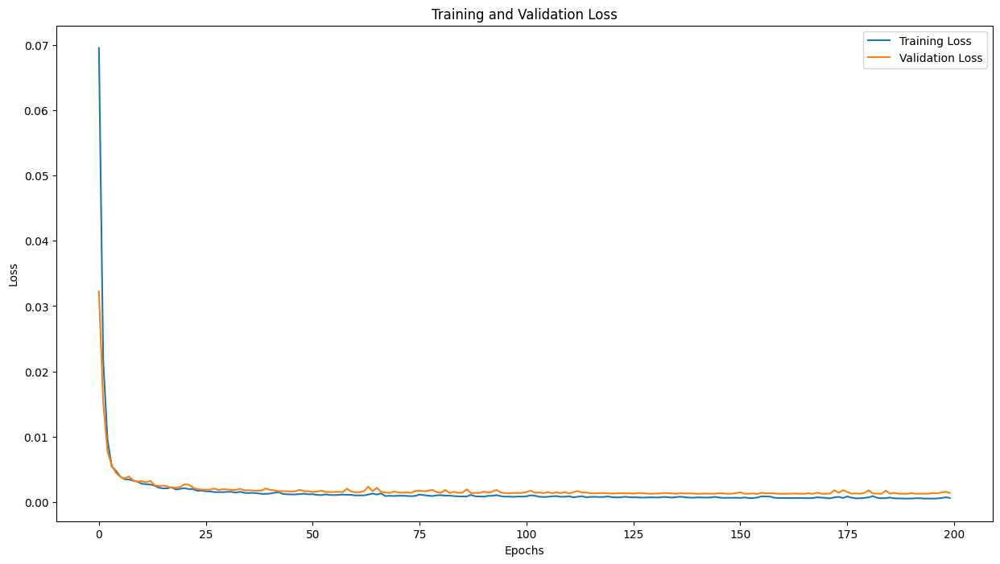

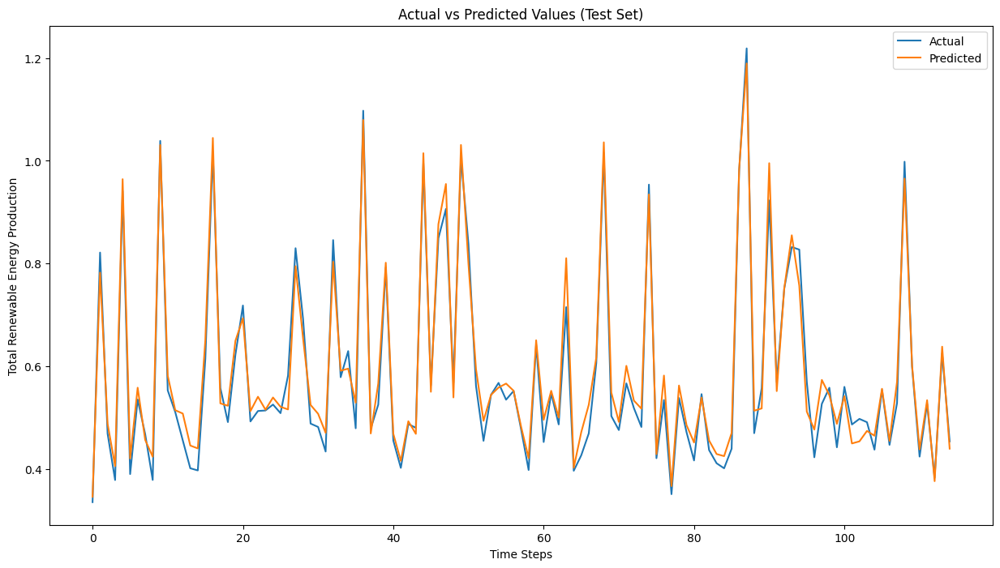

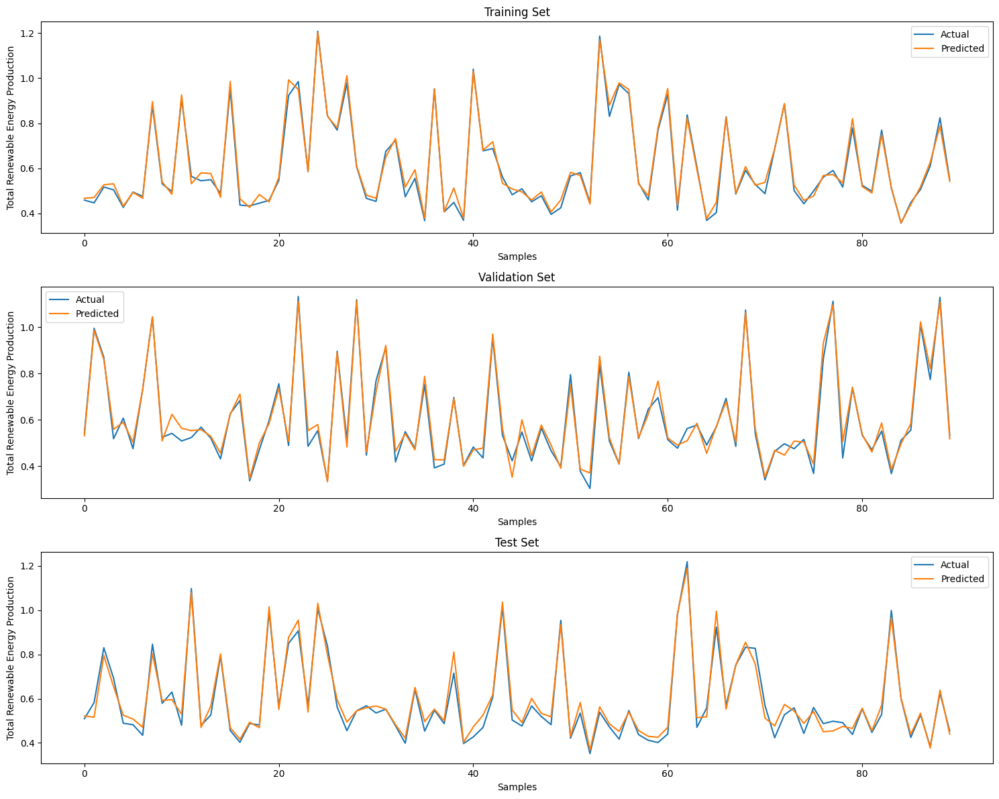

       RMSE       MAE  MAPE (%)
0  0.031446  0.026182  4.802545


In [ ]:
"""
Multivariate CNN - Multiple Input Series:
Use Case: When you want to model multiple time series variables (features)
simultaneously as input to the CNN.
Example: You could predict Total Renewable Energy Production using both Total
Renewable Energy Consumption and Total Fossil Fuels Production as input features.

"""

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

# Assuming df is already loaded and contains necessary columns

# Selecting relevant columns
df = df[['Total Renewable Energy Production',
         'Nuclear Electric Power Production',
         'Total Fossil Fuels Production']]

# Drop rows with any NaN values
df = df.dropna()

# Convert to numpy arrays
data_renewable = df['Total Renewable Energy Production'].values
data_consumption = df['Nuclear Electric Power Production'].values
data_fossil_fuels = df['Total Fossil Fuels Production'].values

# Function to create sequences for multivariate input
def split_sequences_multi(data_renewable, data_consumption, data_fossil_fuels, n_steps):
    X, y = [], []
    for i in range(len(data_renewable) - n_steps):
        end_ix = i + n_steps
        seq_x = np.column_stack((
            data_renewable[i:end_ix],
            data_consumption[i:end_ix],
            data_fossil_fuels[i:end_ix]
        ))
        seq_y = data_renewable[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Define the number of time steps
n_steps = 24

# Split the data into input-output pairs
X, y = split_sequences_multi(data_renewable, data_consumption, data_fossil_fuels, n_steps)

# Split the data into training, validation, and testing sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

# Normalize the input data
scaler_X = MinMaxScaler()
X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, 3)).reshape(X_train.shape)
X_val_scaled = scaler_X.transform(X_val.reshape(-1, 3)).reshape(X_val.shape)
X_test_scaled = scaler_X.transform(X_test.reshape(-1, 3)).reshape(X_test.shape)

scaler_y = MinMaxScaler()
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1)).reshape(y_train.shape)
y_val_scaled = scaler_y.transform(y_val.reshape(-1, 1)).reshape(y_val.shape)
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1)).reshape(y_test.shape)

# Build the multivariate CNN model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, 3)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mse')

# Fit the model
history = model.fit(X_train_scaled, y_train_scaled, epochs=200, validation_data=(X_val_scaled, y_val_scaled), verbose=0)

# Predict the values
y_train_pred_scaled = model.predict(X_train_scaled)
y_val_pred_scaled = model.predict(X_val_scaled)
y_test_pred_scaled = model.predict(X_test_scaled)

# Inverse transform the scaled predictions and actual values
y_train_pred = scaler_y.inverse_transform(y_train_pred_scaled)
y_val_pred = scaler_y.inverse_transform(y_val_pred_scaled)
y_test_pred = scaler_y.inverse_transform(y_test_pred_scaled)

# Calculate errors for the test set
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred)
mape = mean_absolute_percentage_error(y_test, y_test_pred)

print(f'RMSE on test set: {rmse:.2f}')
print(f'MSE on test set: {mse:.2f}')
print(f'MAE on test set: {mae:.2f}')
print(f'MAPE on test set: {mape:.2f}%')

# Plot the training and validation loss
plt.figure(figsize=(15, 8))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

# Plot actual vs predicted values on test set
plt.figure(figsize=(15, 8))
plt.plot(y_test, label='Actual')
plt.plot(y_test_pred, label='Predicted')
plt.xlabel('Time Steps')
plt.ylabel('Total Renewable Energy Production')
plt.legend()
plt.title('Actual vs Predicted Values (Test Set)')
plt.show()

# Plot predictions vs actual values for training, validation, and test sets
plt.figure(figsize=(15, 12))

# Training set
plt.subplot(3, 1, 1)
plt.plot(y_train[-90:], label='Actual')
plt.plot(y_train_pred[-90:], label='Predicted')
plt.title('Training Set')
plt.xlabel('Samples')
plt.ylabel('Total Renewable Energy Production')
plt.legend()

# Validation set
plt.subplot(3, 1, 2)
plt.plot(y_val[-90:], label='Actual')
plt.plot(y_val_pred[-90:], label='Predicted')
plt.title('Validation Set')
plt.xlabel('Samples')
plt.ylabel('Total Renewable Energy Production')
plt.legend()

# Test set
plt.subplot(3, 1, 3)
plt.plot(y_test[-90:], label='Actual')
plt.plot(y_test_pred[-90:], label='Predicted')
plt.title('Test Set')
plt.xlabel('Samples')
plt.ylabel('Total Renewable Energy Production')
plt.legend()

plt.tight_layout()
plt.show()

# Create a DataFrame to hold the calculated metrics
metrics = {
    'RMSE': rmse,
    'MAE': mae,
    'MAPE (%)': mape * 100  # Convert MAPE to percentage
}

# Create a DataFrame for the metrics
metrics_df = pd.DataFrame([metrics], columns=['RMSE', 'MAE', 'MAPE (%)'])

# Display the metrics DataFrame
print(metrics_df)



#### 5.2.4.Multi-headed CNN model for World Energy

Dataset Sample:
            Total Renewable Energy Production  Total Fossil Fuels Production
Date                                                                        
1973-01-31                           0.403981                       4.932632
1973-02-28                           0.360900                       4.729582
1973-03-31                           0.400161                       4.946902
1973-04-30                           0.380470                       4.716271
1973-05-31                           0.392141                       4.956995
3/3 [==============================] - 0s 4ms/step

Metrics for Multi-headed CNN Model:
         Train  Validation      Test
RMSE  0.216802    0.199312  0.202242
MAE   0.162428    0.163711  0.161095
MAPE  0.028954    0.029147  0.028438


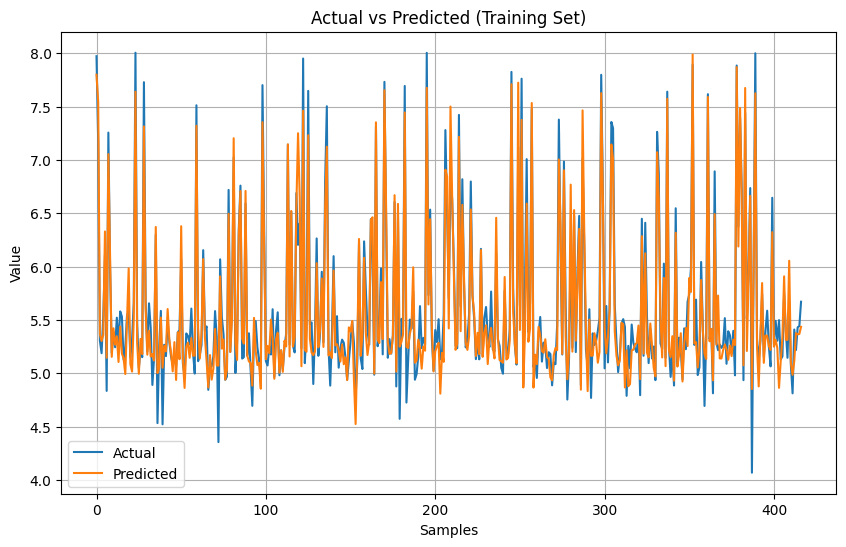

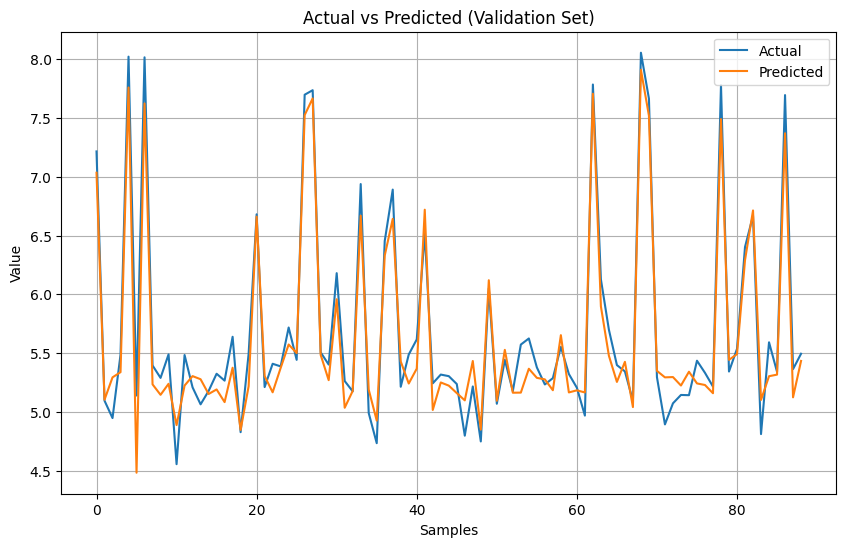

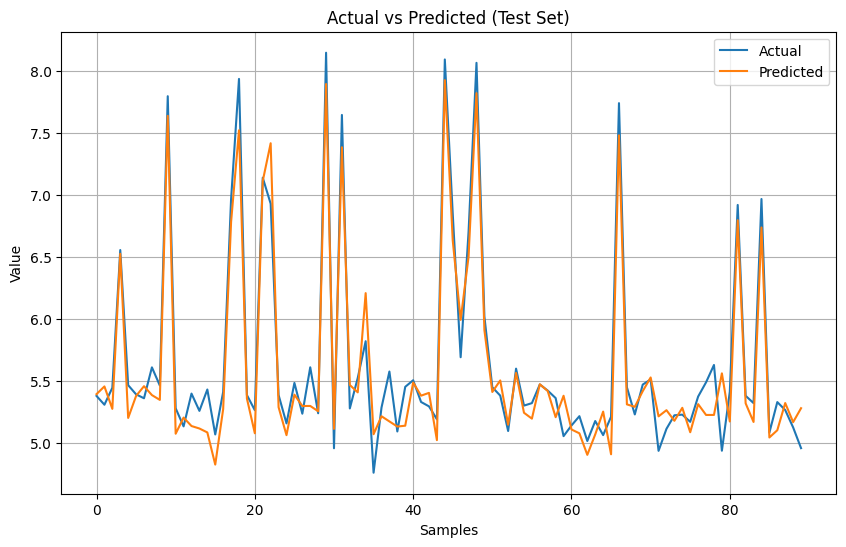

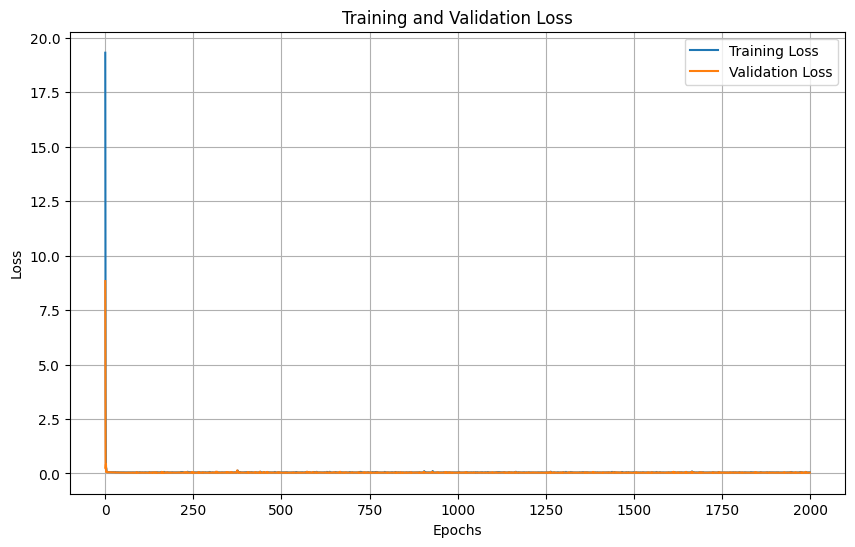

In [ ]:
"""
Using Multi-headed CNN model for World Energy

Multi-headed CNN Model:

Use Case: When you want to process multiple parallel time series independently and then combine them before making predictions.
Example: Predict Total Renewable Energy Production and Total Renewable Energy Consumption independently using separate CNN heads and then combine their outputs for final predictions.
"""

import pandas as pd
import numpy as np
from keras.models import Model
from keras.layers import Input, Conv1D, MaxPooling1D, Flatten, Dense, concatenate
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.model_selection import train_test_split
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to calculate and return RMSE, MAE, and MAPE
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return rmse, mae, mape

# Function to format metrics into a DataFrame
def format_metrics(train_metrics, val_metrics, test_metrics):
    df_metrics = pd.DataFrame({
        'Train': train_metrics,
        'Validation': val_metrics,
        'Test': test_metrics
    }, index=['RMSE', 'MAE', 'MAPE'])
    return df_metrics

# Function to split a multivariate sequence into samples
def split_sequences_multivariate(sequences, n_steps):
    X, y = [], []
    for i in range(len(sequences) - n_steps):
        end_ix = i + n_steps
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Load the dataset
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')

# Select relevant columns
df = df[['Total Renewable Energy Production', 'Total Fossil Fuels Production']]
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()
#df['Total Fossil Fuels Production'] = df['Total Fossil Fuels Production'].diff()

# Handle missing values if any
df.interpolate(method='linear', inplace=True)

# Display the first few rows
print("Dataset Sample:")
print(df.head())

# Convert data to numpy arrays
in_seq1 = df['Total Renewable Energy Production'].values.reshape(-1, 1)
in_seq2 = df['Total Fossil Fuels Production'].values.reshape(-1, 1)
out_seq = (in_seq1 + in_seq2).reshape(-1, 1)

# Horizontally stack columns to create the dataset
dataset = np.hstack((in_seq1, in_seq2, out_seq))

# Choose the number of time steps
n_steps = 3

# Convert dataset into input/output samples for the multi-headed CNN
X, y = split_sequences_multivariate(dataset, n_steps)

# Reshape input data for each time series (one feature per head)
n_features = 1  # Each head processes one feature
X1 = X[:, :, 0].reshape((X.shape[0], X.shape[1], n_features))
X2 = X[:, :, 1].reshape((X.shape[0], X.shape[1], n_features))

# Set the seed for reproducibility
np.random.seed(100)
tf.random.set_seed(100)

# Define the first input model
visible1 = Input(shape=(n_steps, n_features))
cnn1 = Conv1D(filters=64, kernel_size=2, activation='relu')(visible1)
cnn1 = MaxPooling1D(pool_size=2)(cnn1)
cnn1 = Flatten()(cnn1)

# Define the second input model
visible2 = Input(shape=(n_steps, n_features))
cnn2 = Conv1D(filters=64, kernel_size=2, activation='relu')(visible2)
cnn2 = MaxPooling1D(pool_size=2)(cnn2)
cnn2 = Flatten()(cnn2)

# Merge input models
merged = concatenate([cnn1, cnn2])
dense = Dense(50, activation='relu')(merged)
output = Dense(1)(dense)

# Define the multi-headed model
model = Model(inputs=[visible1, visible2], outputs=output)
model.compile(optimizer='adam', loss='mse')

# Split data into training, validation, and test sets
X1_train, X1_temp, X2_train, X2_temp, y_train, y_temp = train_test_split(X1, X2, y, test_size=0.3, random_state=42)
X1_val, X1_test, X2_val, X2_test, y_val, y_test = train_test_split(X1_temp, X2_temp, y_temp, test_size=0.5, random_state=42)

# Function to plot actual vs predicted
def plot_actual_vs_predicted(y_true, y_pred, title):
    plt.figure(figsize=(10, 6))
    plt.plot(y_true, label='Actual')
    plt.plot(y_pred, label='Predicted')
    plt.title(title)
    plt.xlabel('Samples')
    plt.ylabel('Value')
    plt.legend()
    plt.grid(True)
    plt.show()

# Fit the model on training data with validation data
history = model.fit([X1_train, X2_train], y_train, epochs=2000, validation_data=([X1_val, X2_val], y_val), verbose=0)

# Predict on training, validation, and test data
y_train_pred = model.predict([X1_train, X2_train])
y_val_pred = model.predict([X1_val, X2_val])
y_test_pred = model.predict([X1_test, X2_test])

# Calculate metrics for evaluation
train_metrics = calculate_metrics(y_train, y_train_pred)
val_metrics = calculate_metrics(y_val, y_val_pred)
test_metrics = calculate_metrics(y_test, y_test_pred)

# Format and display metrics
print("\nMetrics for Multi-headed CNN Model:")
print(format_metrics(train_metrics, val_metrics, test_metrics))

# Plot actual vs predicted for training set
plot_actual_vs_predicted(y_train, y_train_pred, title='Actual vs Predicted (Training Set)')

# Plot actual vs predicted for validation set
plot_actual_vs_predicted(y_val, y_val_pred, title='Actual vs Predicted (Validation Set)')

# Plot actual vs predicted for test set
plot_actual_vs_predicted(y_test, y_test_pred, title='Actual vs Predicted (Test Set)')

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


#### 5.2.5.Multiple Parallel Series

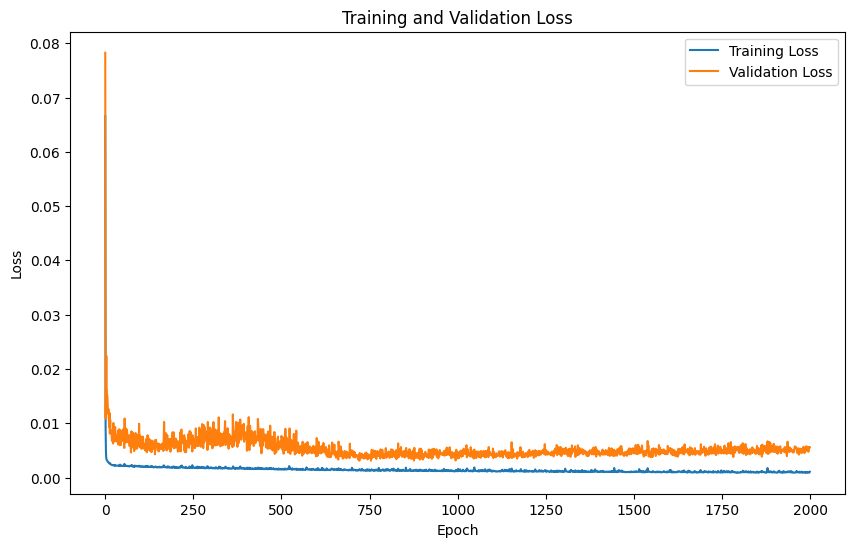

3/3 [==============================] - 0s 4ms/step

Training Metrics (Last Time Step):
RMSE: 0.12, MAE: 0.09, MAPE: 0.02%

Validation Metrics (Last Time Step):
RMSE: 0.27, MAE: 0.21, MAPE: 0.04%

Test Metrics (Last Time Step):
RMSE: 0.37, MAE: 0.30, MAPE: 0.05%


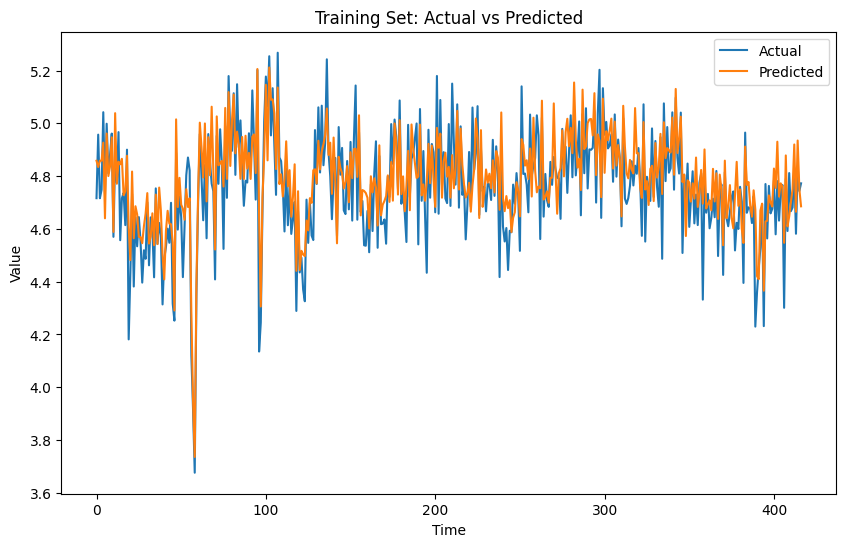

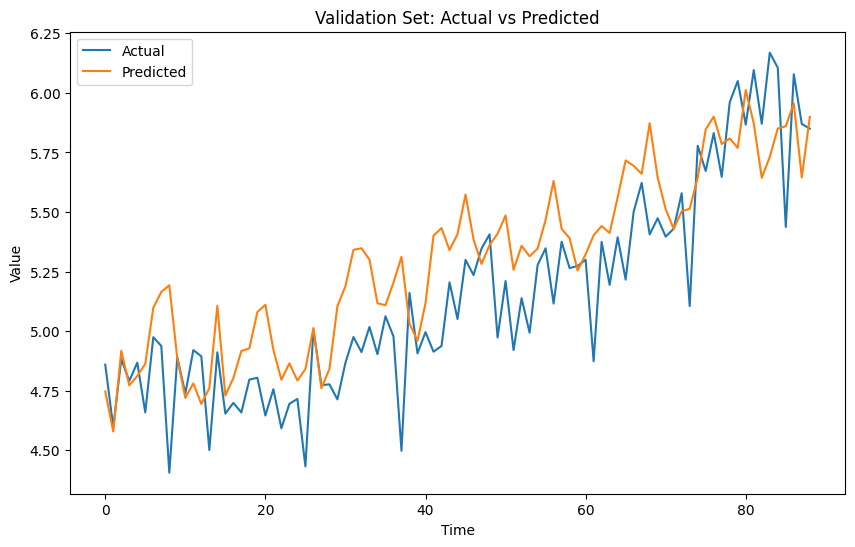

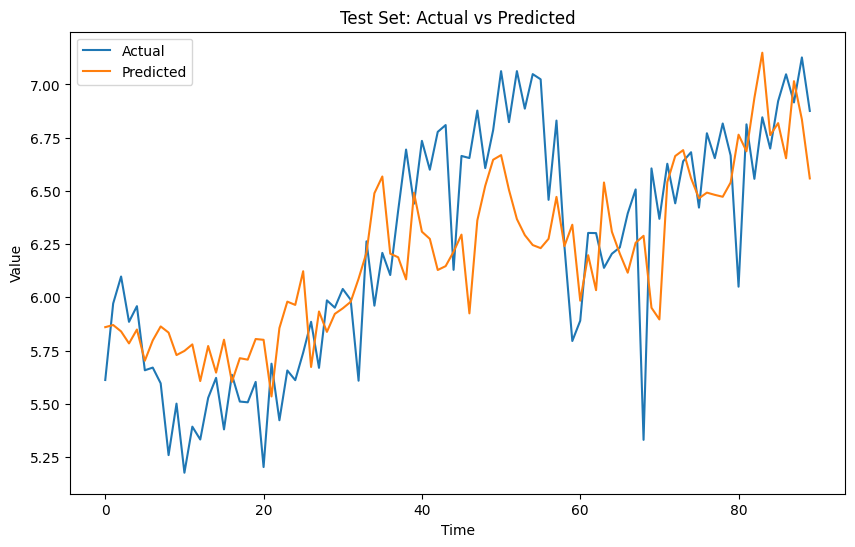

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
    X, y = [], []
    for i in range(len(sequences) - n_steps):
        end_ix = i + n_steps
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix, :]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Function to calculate and return RMSE, MAE, and MAPE
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = mean_absolute_percentage_error(y_true, y_pred)
    return rmse, mae, mape

# Function to plot actual vs predicted values
def plot_actual_vs_predicted(actual, predicted, title):
    plt.figure(figsize=(10, 6))
    plt.plot(actual, label='Actual')
    plt.plot(predicted, label='Predicted')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Load and preprocess the dataset
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')
df = df[['Total Renewable Energy Production', 'Total Fossil Fuels Production']]
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()
#df['Total Fossil Fuels Production'] = df['Total Fossil Fuels Production'].diff()
df.interpolate(method='linear', inplace=True)

# Normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df)

# Choose number of time steps
n_steps = 3

# Convert dataset into input/output pairs
X, y = split_sequences(scaled_data, n_steps)

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, shuffle=False)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

# Define model architecture
n_features = X.shape[2]  # Number of parallel series
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps, n_features)))
model.add(MaxPooling1D(pool_size=2))
model.add(Flatten())
model.add(Dense(50, activation='relu'))
model.add(Dense(n_features))  # Output layer has number of neurons equal to number of features
model.compile(optimizer='adam', loss='mse')

# Fit the model
history = model.fit(X_train, y_train, epochs=2000, validation_data=(X_val, y_val), verbose=0)

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Predictions
y_train_pred = model.predict(X_train)
y_val_pred = model.predict(X_val)
y_test_pred = model.predict(X_test)

# Inverse transform predictions to original scale
y_train_pred_inv = scaler.inverse_transform(y_train_pred)  # Inverse transform predictions directly
y_val_pred_inv = scaler.inverse_transform(y_val_pred)
y_test_pred_inv = scaler.inverse_transform(y_test_pred)

# Inverse transform actual values to original scale (already in correct shape)
y_train_actual_inv = scaler.inverse_transform(y_train)
y_val_actual_inv = scaler.inverse_transform(y_val)
y_test_actual_inv = scaler.inverse_transform(y_test)

# ... (rest of the code remains the same)

# Calculate metrics
train_metrics = calculate_metrics(y_train_actual_inv[:, -1], y_train_pred_inv[:, -1])
val_metrics = calculate_metrics(y_val_actual_inv[:, -1], y_val_pred_inv[:, -1])
test_metrics = calculate_metrics(y_test_actual_inv[:, -1], y_test_pred_inv[:, -1])

print("\nTraining Metrics (Last Time Step):")
print(f"RMSE: {train_metrics[0]:.2f}, MAE: {train_metrics[1]:.2f}, MAPE: {train_metrics[2]:.2f}%")
print("\nValidation Metrics (Last Time Step):")
print(f"RMSE: {val_metrics[0]:.2f}, MAE: {val_metrics[1]:.2f}, MAPE: {val_metrics[2]:.2f}%")
print("\nTest Metrics (Last Time Step):")
print(f"RMSE: {test_metrics[0]:.2f}, MAE: {test_metrics[1]:.2f}, MAPE: {test_metrics[2]:.2f}%")

# Plot actual vs predicted for training set
plot_actual_vs_predicted(y_train_actual_inv[:, -1], y_train_pred_inv[:, -1], 'Training Set: Actual vs Predicted')

# Plot actual vs predicted for validation set
plot_actual_vs_predicted(y_val_actual_inv[:, -1], y_val_pred_inv[:, -1], 'Validation Set: Actual vs Predicted')

# Plot actual vs predicted for test set
plot_actual_vs_predicted(y_test_actual_inv[:, -1], y_test_pred_inv[:, -1], 'Test Set: Actual vs Predicted')


#### 5.2.6.Multi-output CNN Model:

Shape of X: (595, 3, 2)
Shape of y: (595, 4)


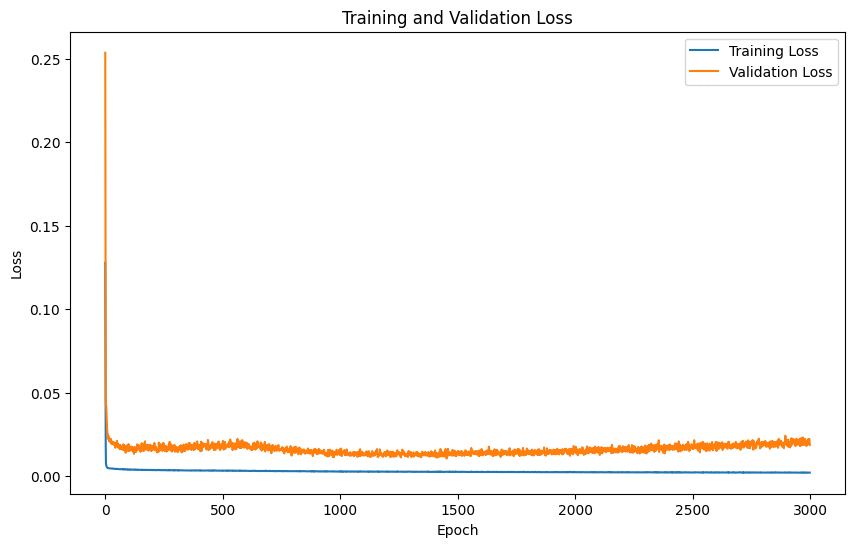

3/3 [==============================] - 0s 4ms/step
RMSE for y1 (Total Renewable Energy Production): 0.22
RMSE for y2 (Total Fossil Fuels Production): 0.70
MAE for y1 (Total Renewable Energy Production): 0.19
MAE for y2 (Total Fossil Fuels Production): 0.55
MAPE for y1 (Total Renewable Energy Production): 19.83%
MAPE for y2 (Total Fossil Fuels Production): 8.61%


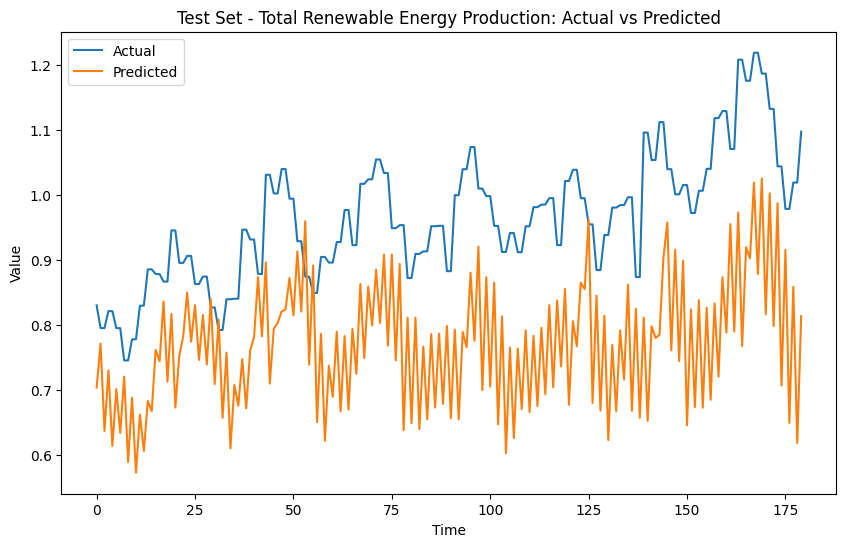

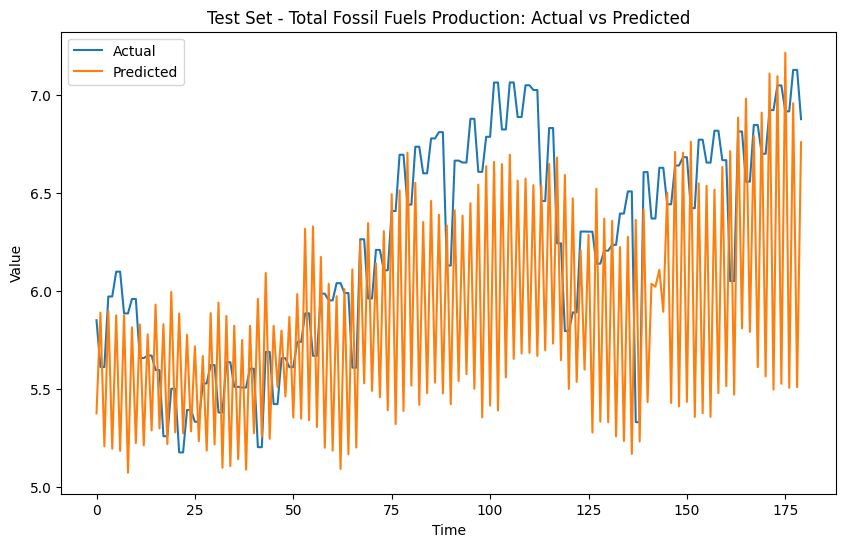

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from keras.models import Model
from keras.layers import Input, Conv1D, MaxPooling1D, Flatten, Dense
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = [], []  # Initialize empty lists for inputs and outputs
    for i in range(len(sequences) - n_steps_in - n_steps_out + 1):
        # Define the end index of the input sequence
        end_ix = i + n_steps_in
        # Define the end index of the output sequence
        out_end_ix = end_ix + n_steps_out
        # Extract input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
        X.append(seq_x)  # Append input sequence to X
        y.append(seq_y)  # Append output sequence to y
    return np.array(X), np.array(y)  # Convert lists to numpy arrays and return

# Function to plot actual vs predicted values
def plot_actual_vs_predicted(actual, predicted, title):
    plt.figure(figsize=(10, 6))
    plt.plot(actual, label='Actual')
    plt.plot(predicted, label='Predicted')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Function to calculate Mean Absolute Percentage Error (MAPE)
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load and preprocess the dataset
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')
df = df[['Total Renewable Energy Production', 'Total Fossil Fuels Production']]
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()
#df['Total Fossil Fuels Production'] = df['Total Fossil Fuels Production'].diff()
df.interpolate(method='linear', inplace=True)

# Normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df)

# Choose number of time steps for input and output
n_steps_in, n_steps_out = 3, 2

# Convert dataset into input/output pairs
X, y = split_sequences(scaled_data, n_steps_in, n_steps_out)

# Flatten output to match the required shape for the model
n_output = y.shape[1] * y.shape[2]
y = y.reshape((y.shape[0], n_output))

# Print the shapes of the input and output arrays
print("Shape of X:", X.shape)
print("Shape of y:", y.shape)

# Set the seed for reproducibility
np.random.seed(100)
tf.random.set_seed(100)

# Number of features in the dataset
n_features = X.shape[2]

# Define the model architecture
visible = Input(shape=(n_steps_in, n_features))
cnn = Conv1D(filters=64, kernel_size=2, activation='relu')(visible)
cnn = MaxPooling1D(pool_size=2)(cnn)
cnn = Flatten()(cnn)
cnn = Dense(50, activation='relu')(cnn)

# Define three separate outputs
output1 = Dense(n_steps_out)(cnn)  # Adjust output dimension as needed
output2 = Dense(n_steps_out)(cnn)  # Adjust output dimension as needed

# Tie together the input and output models
model = Model(inputs=visible, outputs=[output1, output2])
model.compile(optimizer='adam', loss='mse')

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, shuffle=False)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

# Fit the model
history = model.fit(X_train, [y_train[:, :n_steps_out], y_train[:, n_steps_out:]],
                    epochs=3000, validation_data=(X_val, [y_val[:, :n_steps_out], y_val[:, n_steps_out:]]), verbose=0)

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Evaluate the model on test set
y_test_pred = model.predict(X_test)

# Reshape predictions to (samples, timesteps, features) before inverse transform
y_test_pred_reshaped = np.hstack(y_test_pred).reshape(y_test_pred[0].shape[0], n_steps_out, n_features)
y_test_pred_inv = scaler.inverse_transform(y_test_pred_reshaped.reshape(-1, n_features)).reshape(y_test_pred_reshaped.shape)

# Similarly, reshape actual values
y_test_reshaped = y_test.reshape(y_test.shape[0], n_steps_out, n_features)
y_test_actual_inv = scaler.inverse_transform(y_test_reshaped.reshape(-1, n_features)).reshape(y_test_reshaped.shape)

# Calculate RMSE for each series
rmse_y1 = np.sqrt(mean_squared_error(y_test_actual_inv[:, :, 0], y_test_pred_inv[:, :, 0]))
rmse_y2 = np.sqrt(mean_squared_error(y_test_actual_inv[:, :, 1], y_test_pred_inv[:, :, 1]))

# Calculate MAE for each series
mae_y1 = mean_absolute_error(y_test_actual_inv[:, :, 0], y_test_pred_inv[:, :, 0])
mae_y2 = mean_absolute_error(y_test_actual_inv[:, :, 1], y_test_pred_inv[:, :, 1])

# Calculate MAPE for each series
mape_y1 = mean_absolute_percentage_error(y_test_actual_inv[:, :, 0], y_test_pred_inv[:, :, 0])
mape_y2 = mean_absolute_percentage_error(y_test_actual_inv[:, :, 1], y_test_pred_inv[:, :, 1])

print(f"RMSE for y1 (Total Renewable Energy Production): {rmse_y1:.2f}")
print(f"RMSE for y2 (Total Fossil Fuels Production): {rmse_y2:.2f}")
print(f"MAE for y1 (Total Renewable Energy Production): {mae_y1:.2f}")
print(f"MAE for y2 (Total Fossil Fuels Production): {mae_y2:.2f}")
print(f"MAPE for y1 (Total Renewable Energy Production): {mape_y1:.2f}%")
print(f"MAPE for y2 (Total Fossil Fuels Production): {mape_y2:.2f}%")

# Plot actual vs predicted for test set
plot_actual_vs_predicted(y_test_actual_inv[:, :, 0].reshape(-1), y_test_pred_inv[:, :, 0].reshape(-1), 'Test Set - Total Renewable Energy Production: Actual vs Predicted')
plot_actual_vs_predicted(y_test_actual_inv[:, :, 1].reshape(-1), y_test_pred_inv[:, :, 1].reshape(-1), 'Test Set - Total Fossil Fuels Production: Actual vs Predicted')


#### 5.2.7.Multivariate Multi-step CNN Models, Multiple Input Multi-step Output

(595, 3, 1) (595, 2)


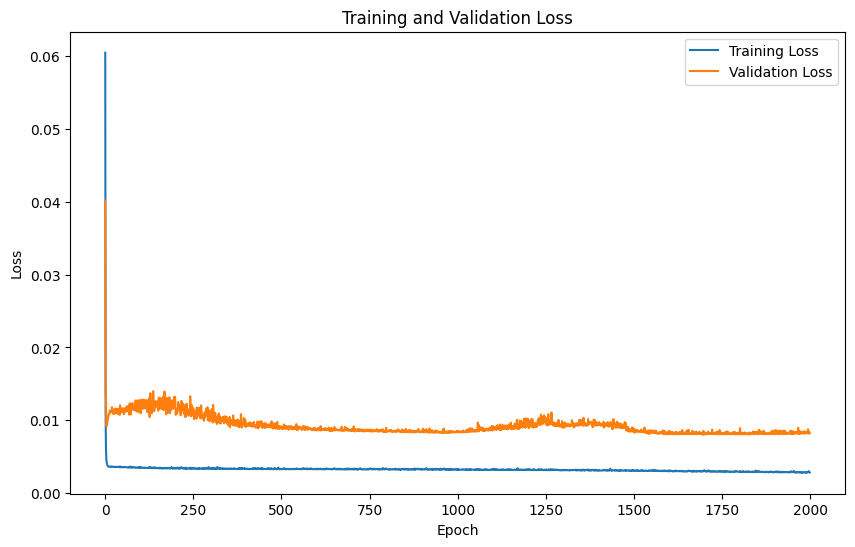

3/3 [==============================] - 0s 4ms/step
RMSE for test set: 0.69
MAE for test set: 0.58
MAPE for test set: 9.04%


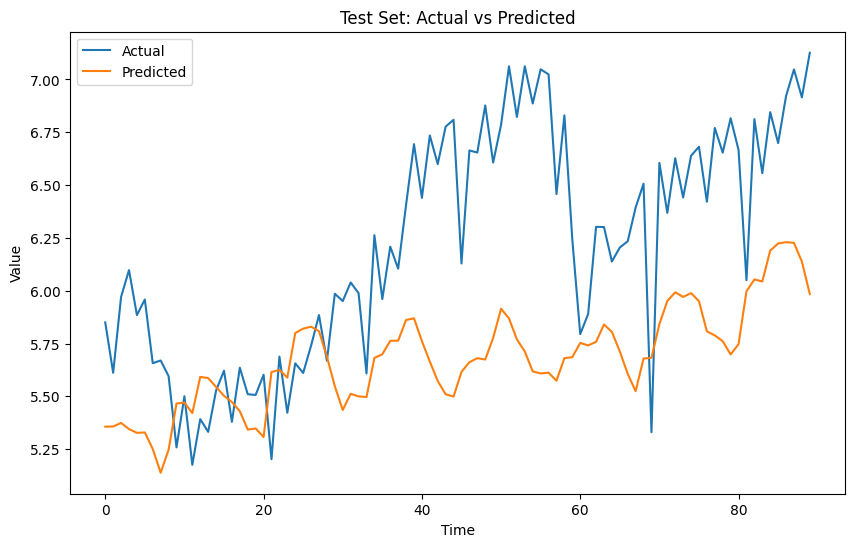

In [ ]:
"""
Multivariate Multi-step CNN Models:

Use Case: When you want to predict multiple future time steps for multiple output variables.
Example: Predict the next 12 months of both Total Renewable Energy Production and Total Renewable Energy Consumption simultaneously.
"""
"""
Multivariate Multi-step CNN Models:

Use Case: When you want to predict multiple future time steps for multiple output variables.
Example: Predict the next 12 months of both Total Renewable Energy Production and Total Renewable Energy Consumption simultaneously.
"""

import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = [], []  # Initialize empty lists for inputs and outputs
    for i in range(len(sequences) - n_steps_in - n_steps_out + 1):
        # Define the end index of the input sequence
        end_ix = i + n_steps_in
        # Define the end index of the output sequence
        out_end_ix = end_ix + n_steps_out - 1
        # Extract input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1]
        X.append(seq_x)  # Append input sequence to X
        y.append(seq_y)  # Append output sequence to y
    return np.array(X), np.array(y)  # Convert lists to numpy arrays and return

# Function to plot actual vs predicted values
def plot_actual_vs_predicted(actual, predicted, title):
    plt.figure(figsize=(10, 6))
    plt.plot(actual, label='Actual')
    plt.plot(predicted, label='Predicted')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Load and preprocess the dataset
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')
df = df[['Total Renewable Energy Production', 'Total Fossil Fuels Production']]
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()
#df['Total Fossil Fuels Production'] = df['Total Fossil Fuels Production'].diff()
df.interpolate(method='linear', inplace=True)

# Normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df)

# Choose number of time steps for input and output
n_steps_in, n_steps_out = 3, 2

# Convert dataset into input/output pairs
X, y = split_sequences(scaled_data, n_steps_in, n_steps_out)

# Print the shapes of the input and output arrays
print(X.shape, y.shape)

# Set the seed for reproducibility
np.random.seed(100)
tf.random.set_seed(100)

# Number of features in the dataset
n_features = X.shape[2]

# Define the model
model = Sequential([
    Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps_in, n_features)),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(50, activation='relu'),
    Dense(n_steps_out)
])

# Compile the model using the Adam optimizer and mean squared error (MSE) loss function
model.compile(optimizer='adam', loss='mse')

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, shuffle=False)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

# Fit the model
history = model.fit(X_train, y_train, epochs=2000, validation_data=(X_val, y_val), verbose=0)

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Evaluate the model on test set
y_test_pred = model.predict(X_test)

## Inverse transform predictions to original scale
y_test_pred_inv = scaler.inverse_transform(y_test_pred) # Inverse transform predictions directly
y_test_actual_inv = scaler.inverse_transform(y_test) # Inverse transform actual values directly

# Calculate RMSE for the test set
rmse = np.sqrt(mean_squared_error(y_test_actual_inv[:, -1], y_test_pred_inv[:, -1]))
print(f"RMSE for test set: {rmse:.2f}")

# Calculate MAE for the test set
mae = mean_absolute_error(y_test_actual_inv[:, -1], y_test_pred_inv[:, -1])
print(f"MAE for test set: {mae:.2f}")

# Calculate MAPE for the test set
mape = np.mean(np.abs((y_test_actual_inv[:, -1] - y_test_pred_inv[:, -1]) / y_test_actual_inv[:, -1])) * 100
print(f"MAPE for test set: {mape:.2f}%")

# Plot actual vs predicted for test set
plot_actual_vs_predicted(y_test_actual_inv[:, -1], y_test_pred_inv[:, -1], 'Test Set: Actual vs Predicted')



(595, 3, 1) (595, 2)


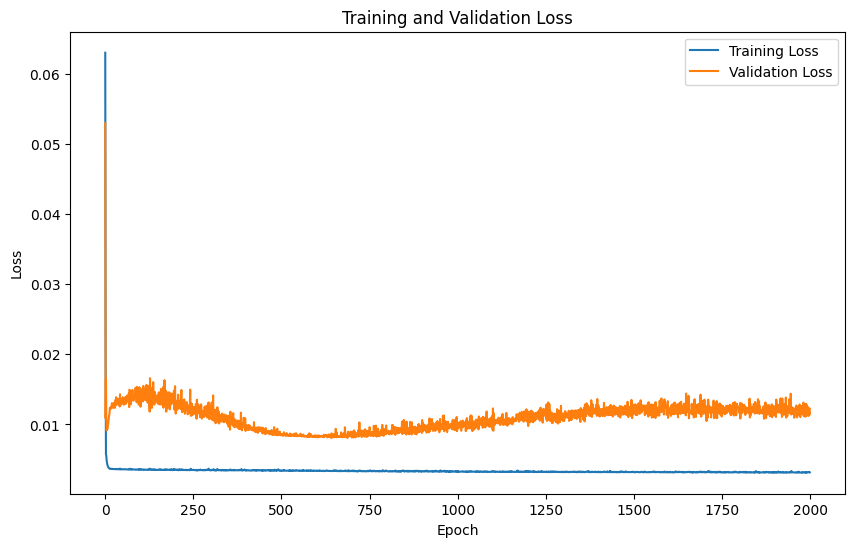

3/3 [==============================] - 0s 6ms/step
RMSE for test set: 1.15
MAE for test set: 1.04
MAPE for test set: 16.20%


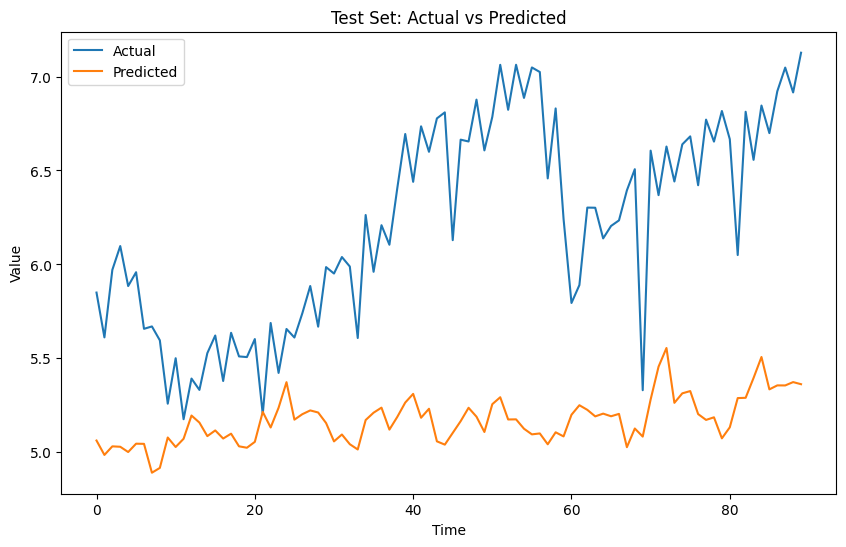

3/3 [==============================] - 0s 10ms/step


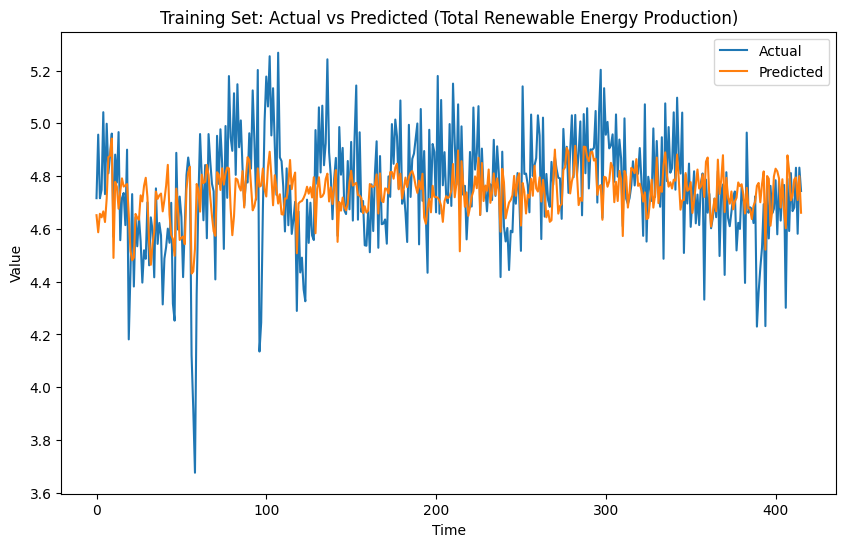

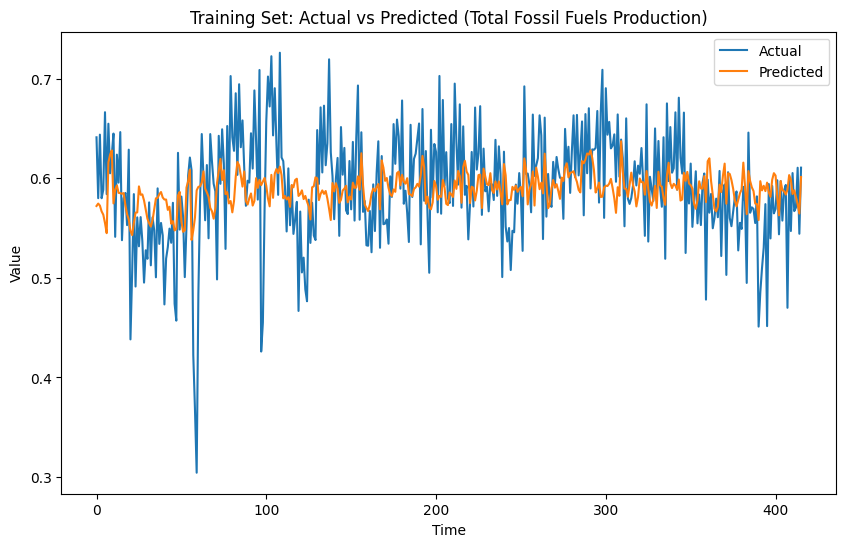

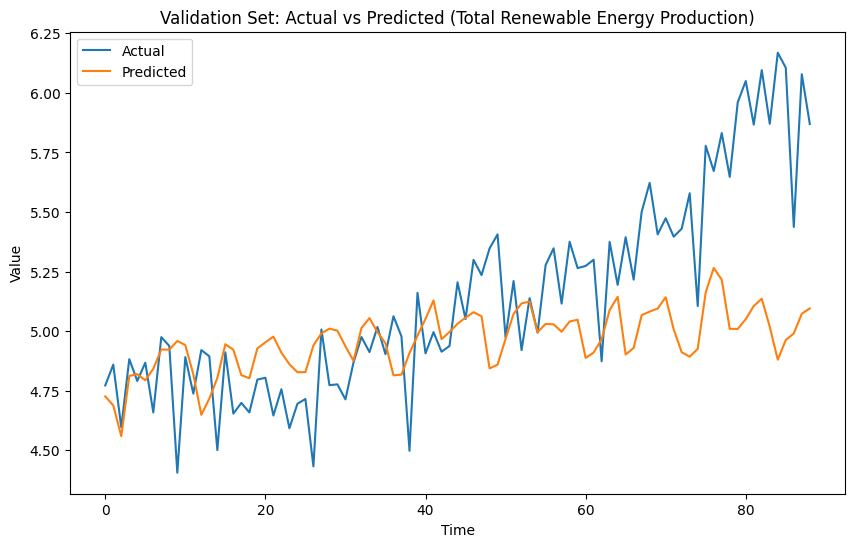

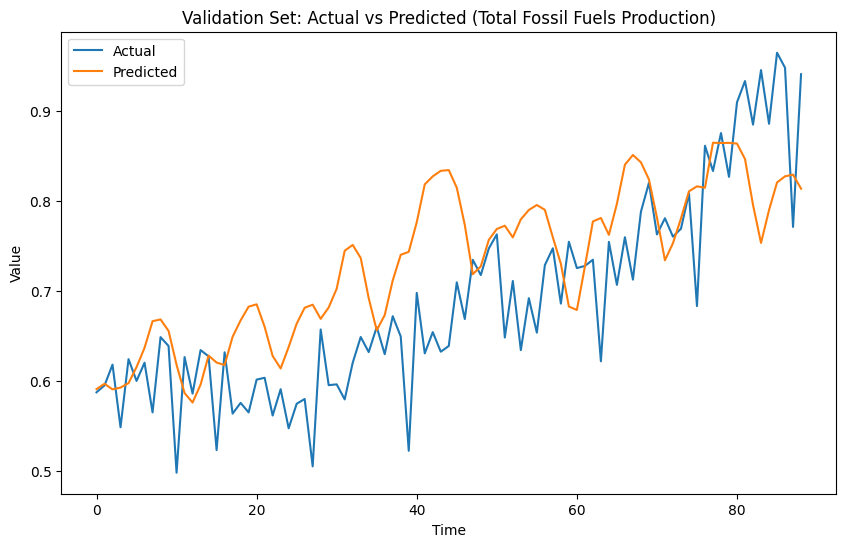

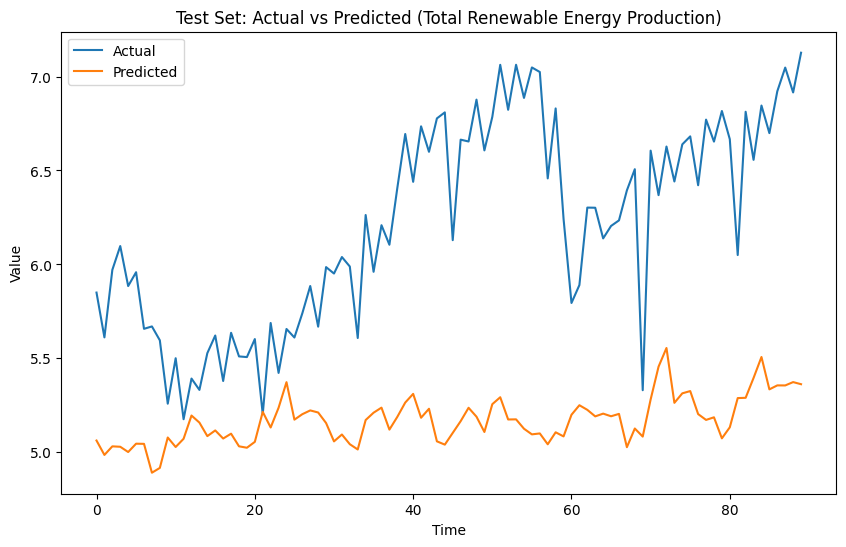

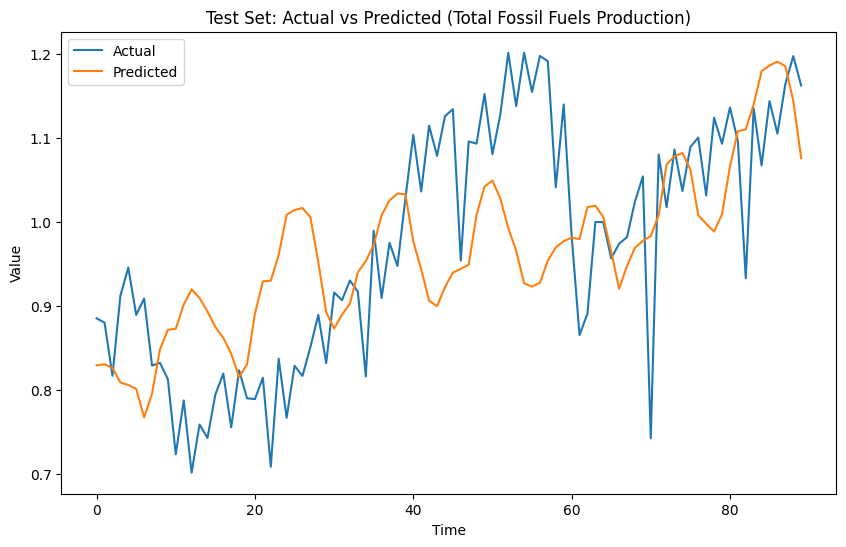

In [ ]:
"""
Multivariate Multi-step CNN Models:

Use Case: When you want to predict multiple future time steps for multiple output variables.
Example: Predict the next 12 months of both Total Renewable Energy Production and Total Renewable Energy Consumption simultaneously.
"""

import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = [], []  # Initialize empty lists for inputs and outputs
    for i in range(len(sequences) - n_steps_in - n_steps_out + 1):
        # Define the end index of the input sequence
        end_ix = i + n_steps_in
        # Define the end index of the output sequence
        out_end_ix = end_ix + n_steps_out - 1
        # Extract input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix-1:out_end_ix, -1]
        X.append(seq_x)  # Append input sequence to X
        y.append(seq_y)  # Append output sequence to y
    return np.array(X), np.array(y)  # Convert lists to numpy arrays and return

# Function to plot actual vs predicted values
def plot_actual_vs_predicted(actual, predicted, title):
    plt.figure(figsize=(10, 6))
    plt.plot(actual, label='Actual')
    plt.plot(predicted, label='Predicted')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Load and preprocess the dataset
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')
df = df[['Total Renewable Energy Production', 'Total Fossil Fuels Production']]
df.interpolate(method='linear', inplace=True)

# Normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df)

# Choose number of time steps for input and output
n_steps_in, n_steps_out = 3, 2

# Convert dataset into input/output pairs
X, y = split_sequences(scaled_data, n_steps_in, n_steps_out)

# Print the shapes of the input and output arrays
print(X.shape, y.shape)

# Set the seed for reproducibility
np.random.seed(100)
tf.random.set_seed(100)

# Number of features in the dataset
n_features = X.shape[2]

# Define the model
model = Sequential([
    Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps_in, n_features)),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(50, activation='relu'),
    Dense(n_steps_out)
])

# Compile the model using the Adam optimizer and mean squared error (MSE) loss function
model.compile(optimizer='adam', loss='mse')

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, shuffle=False)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

# Fit the model
history = model.fit(X_train, y_train, epochs=2000, validation_data=(X_val, y_val), verbose=0)

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Evaluate the model on test set
y_test_pred = model.predict(X_test)

## Inverse transform predictions to original scale
y_test_pred_inv = scaler.inverse_transform(y_test_pred) # Inverse transform predictions directly
y_test_actual_inv = scaler.inverse_transform(y_test) # Inverse transform actual values directly

# Calculate RMSE for the test set
rmse = np.sqrt(mean_squared_error(y_test_actual_inv[:, -1], y_test_pred_inv[:, -1]))
print(f"RMSE for test set: {rmse:.2f}")

# Calculate MAE for the test set
mae = mean_absolute_error(y_test_actual_inv[:, -1], y_test_pred_inv[:, -1])
print(f"MAE for test set: {mae:.2f}")

# Calculate MAPE for the test set
mape = np.mean(np.abs((y_test_actual_inv[:, -1] - y_test_pred_inv[:, -1]) / y_test_actual_inv[:, -1])) * 100
print(f"MAPE for test set: {mape:.2f}%")

# Plot actual vs predicted for test set
plot_actual_vs_predicted(y_test_actual_inv[:, -1], y_test_pred_inv[:, -1], 'Test Set: Actual vs Predicted')

# Additional plotting for both Renewable Energy and Fossil Fuels

# Evaluate the model on training set
y_train_pred = model.predict(X_train)

## Inverse transform predictions to original scale for training set
y_train_pred_inv = scaler.inverse_transform(y_train_pred)
y_train_actual_inv = scaler.inverse_transform(y_train)

# Evaluate the model on validation set
y_val_pred = model.predict(X_val)

## Inverse transform predictions to original scale for validation set
y_val_pred_inv = scaler.inverse_transform(y_val_pred)
y_val_actual_inv = scaler.inverse_transform(y_val)

# Plot actual vs predicted for training set (Total Renewable Energy Production)
plot_actual_vs_predicted(y_train_actual_inv[:, -1], y_train_pred_inv[:, -1], 'Training Set: Actual vs Predicted (Total Renewable Energy Production)')

# Plot actual vs predicted for training set (Total Fossil Fuels Production)
plot_actual_vs_predicted(y_train_actual_inv[:, -2], y_train_pred_inv[:, -2], 'Training Set: Actual vs Predicted (Total Fossil Fuels Production)')

# Plot actual vs predicted for validation set (Total Renewable Energy Production)
plot_actual_vs_predicted(y_val_actual_inv[:, -1], y_val_pred_inv[:, -1], 'Validation Set: Actual vs Predicted (Total Renewable Energy Production)')

# Plot actual vs predicted for validation set (Total Fossil Fuels Production)
plot_actual_vs_predicted(y_val_actual_inv[:, -2], y_val_pred_inv[:, -2], 'Validation Set: Actual vs Predicted (Total Fossil Fuels Production)')

# Plot actual vs predicted for test set (Total Renewable Energy Production)
plot_actual_vs_predicted(y_test_actual_inv[:, -1], y_test_pred_inv[:, -1], 'Test Set: Actual vs Predicted (Total Renewable Energy Production)')

# Plot actual vs predicted for test set (Total Fossil Fuels Production)
plot_actual_vs_predicted(y_test_actual_inv[:, -2], y_test_pred_inv[:, -2], 'Test Set: Actual vs Predicted (Total Fossil Fuels Production)')


#### 5.2.8.Multiple Parallel Input and Multi-step Output

**Objective**

This model is important when you have multiple input time series and want to predict multiple future time steps for each output variable, with each input time series contributing independently to the prediction. Example: Predict the next 12 months of Total Renewable Energy Production and Total Renewable Energy Consumption using historical data, where each input series (Total Fossil Fuels Production, Nuclear Electric Power Production) independently contributes to the prediction.

**Insights**

Visually interpreting the graph, the peaks and troughs are well followed by the predicted values just as the actual values with either a shift up or down at different instances of time.

(595, 3, 2) (595, 4)


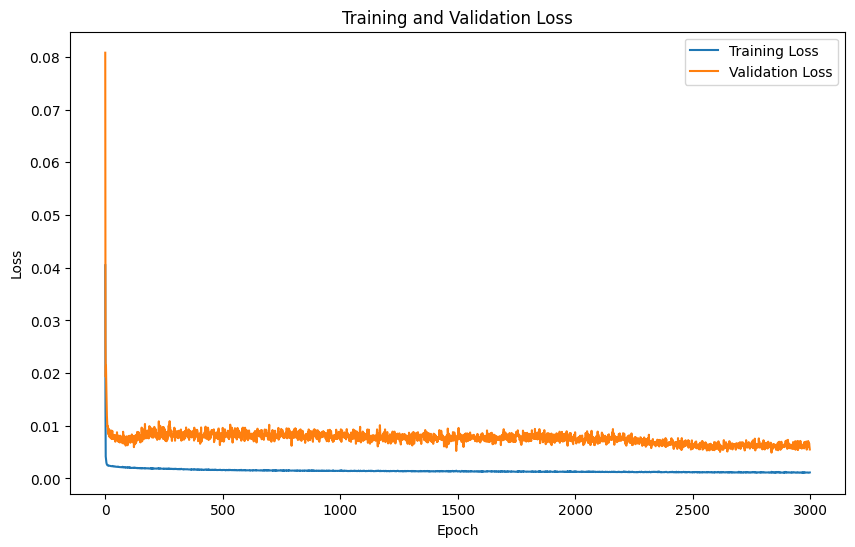

3/3 [==============================] - 0s 4ms/step
RMSE for test set: 0.52
MAE for test set: 0.25
MAPE for test set: 7.00%


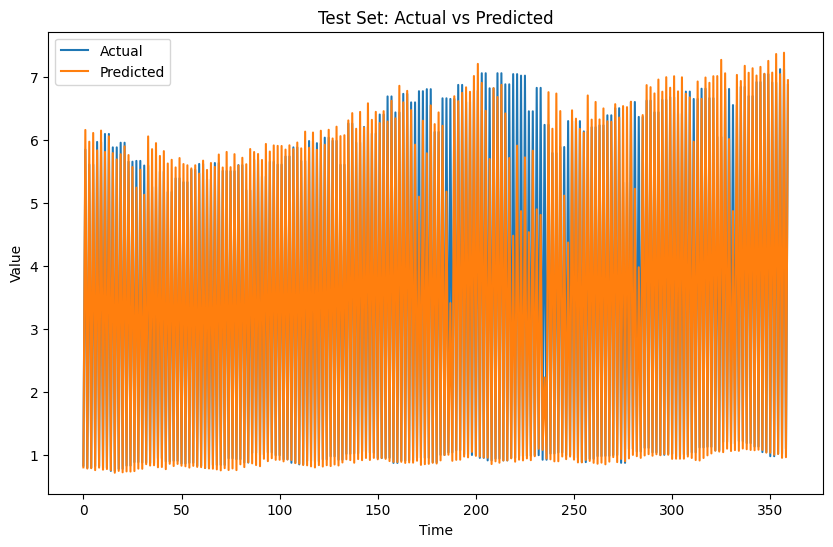

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
import tensorflow as tf
import matplotlib.pyplot as plt

# Function to split a multivariate sequence into samples
def split_sequences(sequences, n_steps_in, n_steps_out):
    X, y = [], []  # Initialize empty lists for inputs and outputs
    for i in range(len(sequences) - n_steps_in - n_steps_out + 1):
        # Define the end index of the input sequence
        end_ix = i + n_steps_in
        # Define the end index of the output sequence
        out_end_ix = end_ix + n_steps_out
        # Extract input and output parts of the pattern
        seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
        X.append(seq_x)  # Append input sequence to X
        y.append(seq_y)  # Append output sequence to y
    return np.array(X), np.array(y)  # Convert lists to numpy arrays and return

# Function to plot actual vs predicted values
def plot_actual_vs_predicted(actual, predicted, title):
    plt.figure(figsize=(10, 6))
    plt.plot(actual, label='Actual')
    plt.plot(predicted, label='Predicted')
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Function to calculate Mean Absolute Percentage Error (MAPE)
def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Load and preprocess the dataset
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')
df = df[['Total Renewable Energy Production', 'Total Fossil Fuels Production']]
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()
#df['Total Fossil Fuels Production'] = df['Total Fossil Fuels Production'].diff()
df.interpolate(method='linear', inplace=True)

# Normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(df)

# Choose number of time steps for input and output
n_steps_in, n_steps_out = 3, 2

# Convert dataset into input/output pairs
X, y = split_sequences(scaled_data, n_steps_in, n_steps_out)

# Flatten output to match the required shape for the model
n_output = y.shape[1] * y.shape[2]
y = y.reshape((y.shape[0], n_output))

# Print the shapes of the input and output arrays
print(X.shape, y.shape)

# Set the seed for reproducibility
np.random.seed(100)
tf.random.set_seed(100)

# Number of features in the dataset
n_features = X.shape[2]

# Define the model
model = Sequential([
    Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps_in, n_features)),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(50, activation='relu'),
    Dense(n_output)
])

# Compile the model using the Adam optimizer and mean squared error loss function
model.compile(optimizer='adam', loss='mse')

# Split the data into training, validation, and test sets
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, shuffle=False)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

# Fit the model
history = model.fit(X_train, y_train, epochs=3000, validation_data=(X_val, y_val), verbose=0)

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Evaluate the model on test set
y_test_pred = model.predict(X_test)

# Reshape predictions to (samples, timesteps, features) before inverse transform
y_test_pred_reshaped = y_test_pred.reshape(y_test_pred.shape[0], n_steps_out, n_features)
y_test_pred_inv = scaler.inverse_transform(y_test_pred_reshaped.reshape(-1, n_features)).reshape(y_test_pred_reshaped.shape)

# Similarly, reshape actual values
y_test_reshaped = y_test.reshape(y_test.shape[0], n_steps_out, n_features)
y_test_actual_inv = scaler.inverse_transform(y_test_reshaped.reshape(-1, n_features)).reshape(y_test_reshaped.shape)

# Calculate RMSE for the test set
rmse = np.sqrt(mean_squared_error(y_test_actual_inv[:, -n_steps_out:, :].reshape(-1), y_test_pred_inv[:, -n_steps_out:, :].reshape(-1)))

# Calculate MAE for the test set
mae = mean_absolute_error(y_test_actual_inv[:, -n_steps_out:, :].reshape(-1), y_test_pred_inv[:, -n_steps_out:, :].reshape(-1))

# Calculate MAPE for the test set
mape = mean_absolute_percentage_error(y_test_actual_inv[:, -n_steps_out:, :].reshape(-1), y_test_pred_inv[:, -n_steps_out:, :].reshape(-1))

print(f"RMSE for test set: {rmse:.2f}")
print(f"MAE for test set: {mae:.2f}")
print(f"MAPE for test set: {mape:.2f}%")

# Plot actual vs predicted for test set
plot_actual_vs_predicted(y_test_actual_inv[:, -n_steps_out:, :].reshape(-1), y_test_pred_inv[:, -n_steps_out:, :].reshape(-1), 'Test Set: Actual vs Predicted')




# """
# Multiple Parallel Input and Multi-step Output:

# Use Case: When you have multiple input time series and want to predict multiple future time steps for each output variable, with each input time series contributing independently to the prediction. Example: Predict the next 12 months of Total Renewable Energy Production and Total Renewable Energy Consumption using historical data, where each input series (Total Fossil Fuels Production, Nuclear Electric Power Production) independently contributes to the prediction.

# """
# import pandas as pd
# import numpy as np
# from sklearn.preprocessing import MinMaxScaler
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import mean_squared_error
# from keras.models import Sequential
# from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
# import tensorflow as tf
# import matplotlib.pyplot as plt

# # Function to split a multivariate sequence into samples
# def split_sequences(sequences, n_steps_in, n_steps_out):
#     X, y = [], []  # Initialize empty lists for inputs and outputs
#     for i in range(len(sequences) - n_steps_in - n_steps_out + 1):
#         # Define the end index of the input sequence
#         end_ix = i + n_steps_in
#         # Define the end index of the output sequence
#         out_end_ix = end_ix + n_steps_out
#         # Extract input and output parts of the pattern
#         seq_x, seq_y = sequences[i:end_ix, :], sequences[end_ix:out_end_ix, :]
#         X.append(seq_x)  # Append input sequence to X
#         y.append(seq_y)  # Append output sequence to y
#     return np.array(X), np.array(y)  # Convert lists to numpy arrays and return

# # Function to plot actual vs predicted values
# def plot_actual_vs_predicted(actual, predicted, title):
#     plt.figure(figsize=(10, 6))
#     plt.plot(actual, label='Actual')
#     plt.plot(predicted, label='Predicted')
#     plt.title(title)
#     plt.xlabel('Time')
#     plt.ylabel('Value')
#     plt.legend()
#     plt.show()

# # Load and preprocess the dataset
# df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')
# df = df[['Total Renewable Energy Production', 'Total Fossil Fuels Production']]
# df.interpolate(method='linear', inplace=True)

# # Normalize the dataset
# scaler = MinMaxScaler(feature_range=(0, 1))
# scaled_data = scaler.fit_transform(df)

# # Choose number of time steps for input and output
# n_steps_in, n_steps_out = 3, 2

# # Convert dataset into input/output pairs
# X, y = split_sequences(scaled_data, n_steps_in, n_steps_out)

# # Flatten output to match the required shape for the model
# n_output = y.shape[1] * y.shape[2]
# y = y.reshape((y.shape[0], n_output))

# # Print the shapes of the input and output arrays
# print(X.shape, y.shape)

# # Set the seed for reproducibility
# np.random.seed(100)
# tf.random.set_seed(100)

# # Number of features in the dataset
# n_features = X.shape[2]

# # Define the model
# model = Sequential([
#     Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(n_steps_in, n_features)),
#     MaxPooling1D(pool_size=2),
#     Flatten(),
#     Dense(50, activation='relu'),
#     Dense(n_output)
# ])

# # Compile the model using the Adam optimizer and mean squared error loss function
# model.compile(optimizer='adam', loss='mse')

# # Split the data into training, validation, and test sets
# X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, shuffle=False)
# X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, shuffle=False)

# # Fit the model
# history = model.fit(X_train, y_train, epochs=3000, validation_data=(X_val, y_val), verbose=0)

# # Plot training and validation loss
# plt.figure(figsize=(10, 6))
# plt.plot(history.history['loss'], label='Training Loss')
# plt.plot(history.history['val_loss'], label='Validation Loss')
# plt.title('Training and Validation Loss')
# plt.xlabel('Epoch')
# plt.ylabel('Loss')
# plt.legend()
# plt.show()

# # Evaluate the model on test set
# y_test_pred = model.predict(X_test)

# # Reshape predictions to (samples, timesteps, features) before inverse transform
# y_test_pred_reshaped = y_test_pred.reshape(y_test_pred.shape[0], n_steps_out, n_features)
# y_test_pred_inv = scaler.inverse_transform(y_test_pred_reshaped.reshape(-1, n_features)).reshape(y_test_pred_reshaped.shape)

# # Similarly, reshape actual values
# y_test_reshaped = y_test.reshape(y_test.shape[0], n_steps_out, n_features)
# y_test_actual_inv = scaler.inverse_transform(y_test_reshaped.reshape(-1, n_features)).reshape(y_test_reshaped.shape)

# # Now you can calculate RMSE, MAE, etc. using these reshaped arrays
# # ... rest of your code
# # Calculate RMSE for the test set
# rmse = np.sqrt(mean_squared_error(y_test_actual_inv[:, -n_steps_out:, :].reshape(-1), y_test_pred_inv[:, -n_steps_out:, :].reshape(-1)))
# print(f"RMSE for test set: {rmse:.2f}")

# # Plot actual vs predicted for test set
# plot_actual_vs_predicted(y_test_actual_inv[:, -n_steps_out:, :].reshape(-1), y_test_pred_inv[:, -n_steps_out:, :].reshape(-1), 'Test Set: Actual vs Predicted')




### 5.3.LSTM

#### 5.3.1.An LSTM: Code from the Stock Market Week 7

**Objective**

LSTM models or Long Short Term Memory models are essential for finding long-term patterns in sequential data which is most important in time series forecasting, which CNNs do not perform too well on. CNNs are good for pattern recognition but they might not be reliable for finding the impact of historical data over long periods of time.

**Insights**

- Training and Testing Loss:

The= model's loss over epochs during training loss decreases significantly in the initial epochs and then stabilizes, indicating that the model is learning and improving its predictions over time. The final loss value is low, suggesting good model performance.


- Actual vs Predicted Values:

The lower plot in the provided image compares the actual Total Renewable Energy Production (blue line) with the predicted values (red line) using the LSTM model.

The close alignment between the actual and predicted values indicates that the model is effectively capturing the trend and fluctuations in the data. The predictions follow the upward trend observed in the actual data, demonstrating the model's ability to forecast future renewable energy production accurately.

 The actual values are directly plotted from the dataset but the predicted values are less wavy with lesser amplitude but still have faint peaks and troughs are bends wherever the actual data rises or falls. The trend of both the actual and predicted matches even if the amplitude of predicted is less variabel than the actual.

Data:
            Total Fossil Fuels Production  Nuclear Electric Power Production  \
Date                                                                           
1973-01-31                       4.932632                           0.068103   
1973-02-28                       4.729582                           0.064634   
1973-03-31                       4.946902                           0.072494   
1973-04-30                       4.716271                           0.064070   
1973-05-31                       4.956995                           0.062111   

            Total Renewable Energy Production  \
Date                                            
1973-01-31                           0.403981   
1973-02-28                           0.360900   
1973-03-31                           0.400161   
1973-04-30                           0.380470   
1973-05-31                           0.392141   

            Total Primary Energy Production  Primary Energy Imports  \
Date              

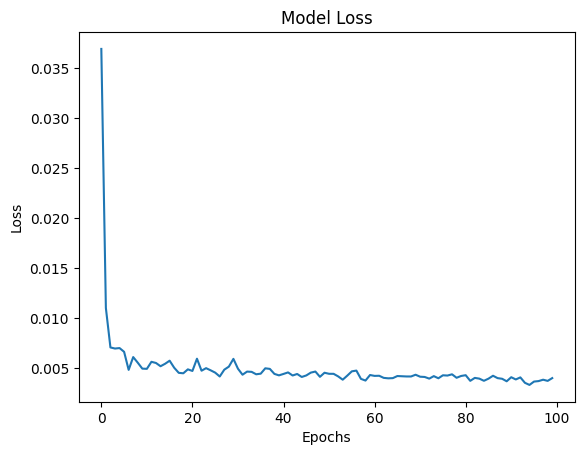

17/17 [==============================] - 2s 29ms/step


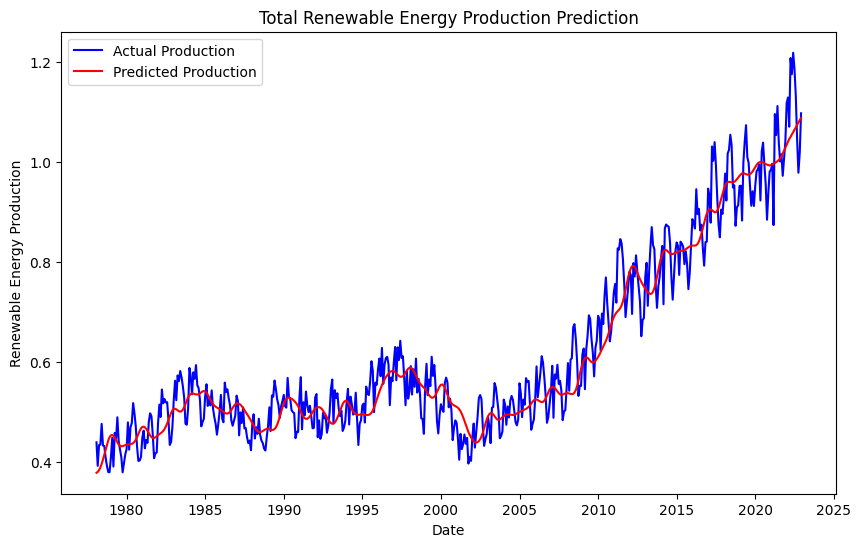

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
import tensorflow as tf

# Load the data
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')

# Display the first few rows of the data
print("Data:")
print(df.head())

# Apply differencing of order 1 to 'Total Renewable Energy Production'
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff()

# Select the 'Total Renewable Energy Production' column
data = df['Total Renewable Energy Production'].values.reshape(-1, 1)

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaled = scaler.fit_transform(data)

# Create features and labels
features_set, labels = [], []
for i in range(60, len(data_scaled)):
    features_set.append(data_scaled[i-60:i, 0])
    labels.append(data_scaled[i, 0])

features_set, labels = np.array(features_set), np.array(labels)

# Reshape features to be 3-dimensional
features_set = np.reshape(features_set, (features_set.shape[0], features_set.shape[1], 1))

# Fix seed for reproducibility
np.random.seed(100)
tf.random.set_seed(100)

# Initialize the model
model = Sequential()

# Add LSTM layers with Dropout regularization
model.add(LSTM(units=50, return_sequences=True, input_shape=(features_set.shape[1], 1)))
model.add(Dropout(0.2))
model.add(LSTM(units=50, return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=50, return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=50))
model.add(Dropout(0.2))

# Add the output layer
model.add(Dense(units=1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Fit the model and store the history for plotting
history = model.fit(features_set, labels, epochs=100, batch_size=32, verbose=1)

# Plot the loss over epochs
plt.plot(history.history['loss'])
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.show()

# Predict using the trained model
predictions = model.predict(features_set)
predictions = scaler.inverse_transform(predictions)

# Plot actual vs predicted renewable energy production
plt.figure(figsize=(10, 6))
plt.plot(df.index[60:], data[60:], color='blue', label='Actual Production')
plt.plot(df.index[60:], predictions, color='red', label='Predicted Production')
plt.title('Total Renewable Energy Production Prediction')
plt.xlabel('Date')
plt.ylabel('Renewable Energy Production')
plt.legend()
plt.show()


#### 5.3.2 Objective and Insights for LSTM Models on Total Renewable Energy Production

**Objective**

LSTM models (Vanilla LSTM, Stacked LSTM, Bidirectional LSTM, CNN-LSTM, and ConvLSTM) are used to predict the Total Renewable Energy Production based on historical data. Each model has a unique architecture aimed at capture different aspects of the data's temporal patterns, trends, and seasonality. By comparing the performance of these models, we can find which model best predicts future values of renewable energy production. the hyperparameters are more or less common througout all the LSTM models for uniformoty of features and to allow comparison for finding better performing models using RMSE, MAE and MAPE.

**Insights**

1. Vanilla LSTM

- Goal: Capture the basic temporal dependencies in the data.
- Training and Validation Loss: Although both of these paramters initially descrease, only trainiing seems to perform well suggesting overfitting. The validation loss graph peaks and troughs several times at different times of the epochs, although its lowest can be found at the first epoch itself. It spikes at the 2nd and the 7th epoch.
- Predictions vs. Actual: The model's predictions  follow the general trend of the actual values but miss to capture the changes in the amplitude or the temporal fluctuations.

2. Stacked LSTM

- Goal: Many layers of LSTM layers in. the hidden layers at keep one after another that seems like it is stacked in order to capture more complex patterns. It is, therefore, a deeper model.
- Training and Validation loss: The traning loss initially drops to zero and remains in that state but the validation although initially peaks, then drops to the lowest at the fourth epoch and then increases bit again before dropping but not as much as Vanilla LSTM. At the same time, the validation loss is always greater than the training loss indicating a sigh of overfitting. This might be because it is too complex of a model too.
- Predictions vs. Actual: The model's predictions  follow the general trend of the actual values but miss to capture the changes in the amplitude or the temporal fluctuations But this trend is more smoother than the Vanilla LSTM.


3. Bidirectional LSTM

- Goal: BiLSTM is chooses a unique way to capture patterns by not just from historical data but the future data poitns as well at the same instant, i.e in both forward and backward temporal directions, hence the name.
- Training and Validation Loss: The model performs only well on the training indicating overfitting. The validaiton loss reaches a minimum at 4 epochs where it convereges wit the training loss and then peaks to an all time high at 0.25 at 6 epochs and drops again but does not hit the minimum within the first 14 epochs.
- Prediciton vs Actual: While the predicted value follows the general trend of the actual values, it totally misses to capture the temporal fluctuations in the actual data and is more like a linear trend and not wavy.


4. CNN-LSTM

-Goal: CNN-LSTM combines the functionalities of both the CNN model for pattern recognition and the LSTM for retaining long-term patterns.
- Training and Validaiton Loss: Both the losses converges initially by dropping at 0.0050 but then diverge linearly away from one another. This overfitting might be due to the high complexity model for a simple dataset with little less than 1K datapoints.
- Prediciton vs Actual: Similar to BiLSTM

5. ConvLSTM

- Goal: Integrate convolutional operations directly into LSTM units to capture spatial as well as temporal features.
- Training and Validation Loss: The loss decreases rapidly and remains low, indicating efficient learning and good fit.
- Predictions vs. Actual: This model captures both the trend and fluctuations very effectively, closely aligning with the actual values.



**Comparison with RMSE, MAE, MAPE**

- ConvLSTM has the best performance as opposed to its coutner LSTM models with RMSE, MAE and MAPE at 0.049657, 0.038772, and 0.04093273, respectively. IT does well on across all metrics, indicating accurate prediction and good generalization.

- This is followed by BiLSTM, CNN-LSTM, Vanilla LSTM and Stacked LSTM, based on the MAPE prediciton accuracy rates, but visually, Stacked and Vanilla LSTMs ccapture the fluctuations better than BiLSTM and CNN-LSTM.

4/4 [==============================] - 0s 6ms/step


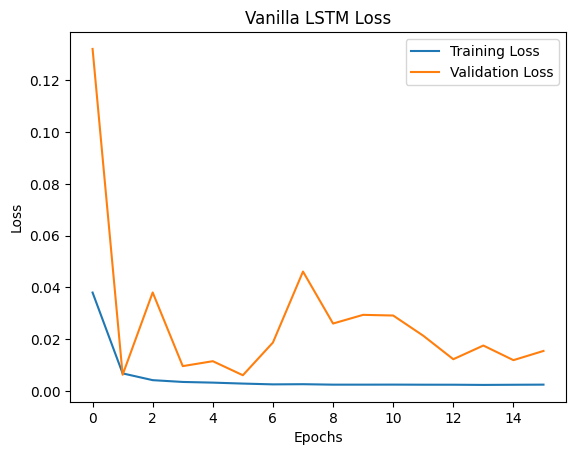

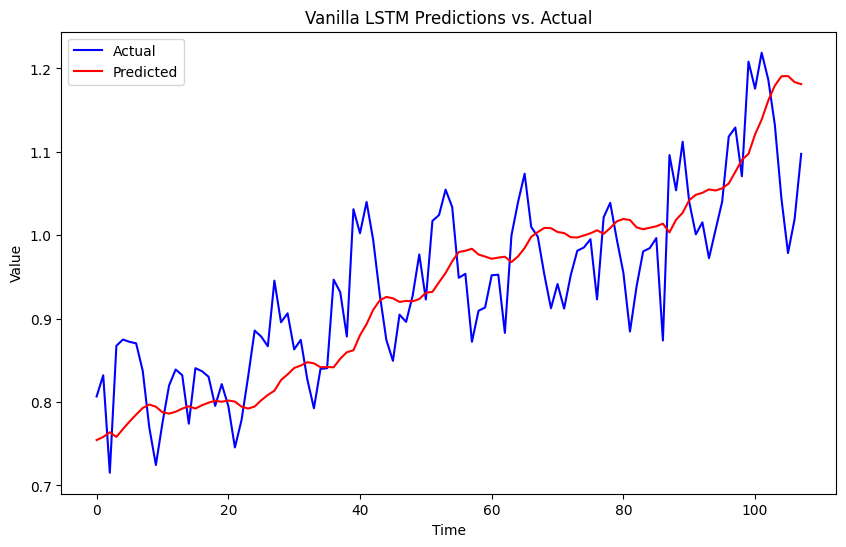

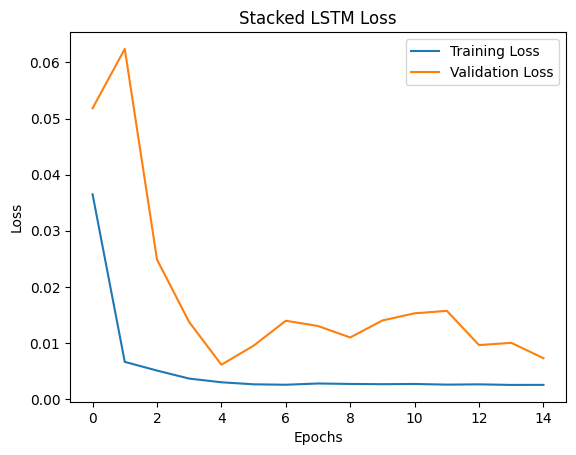

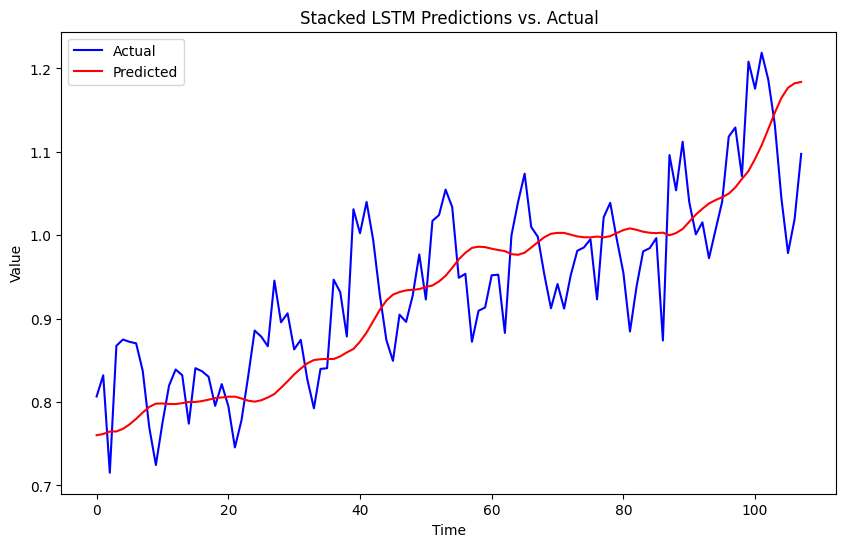

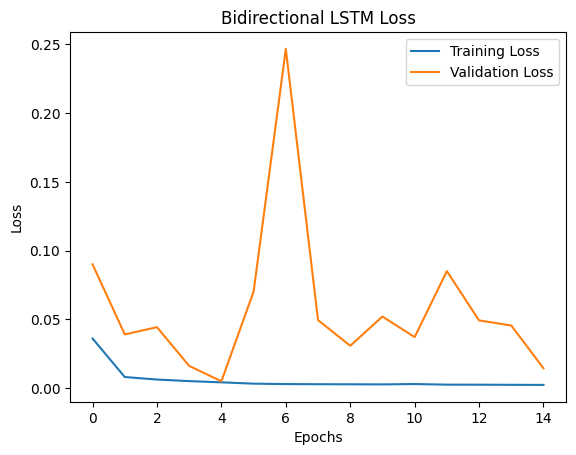

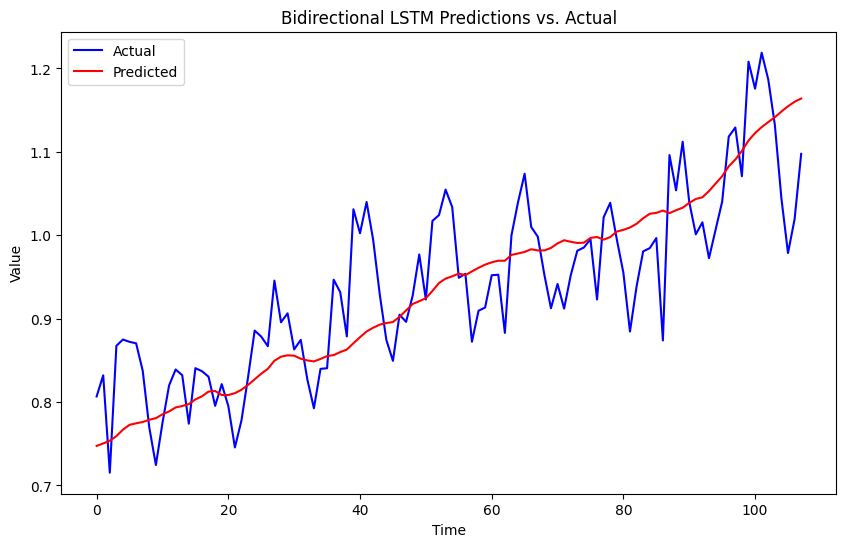

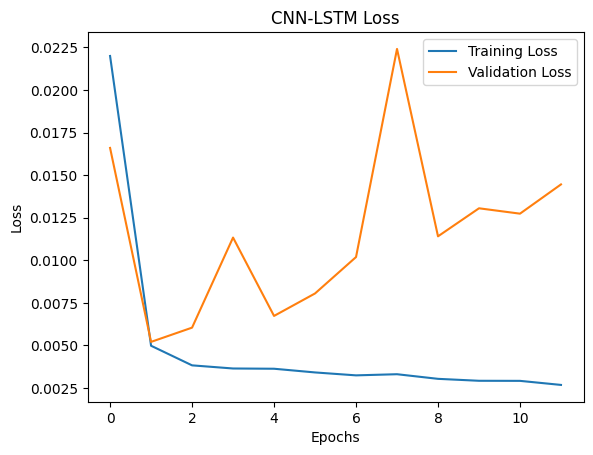

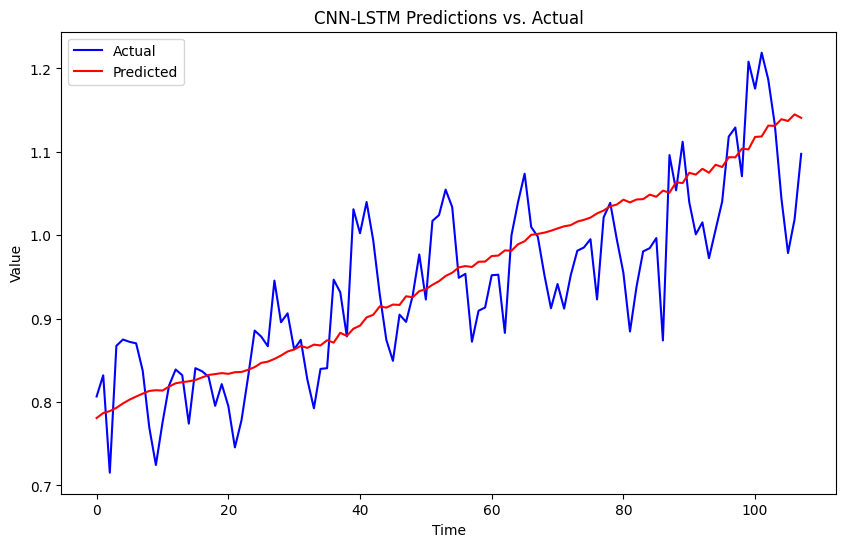

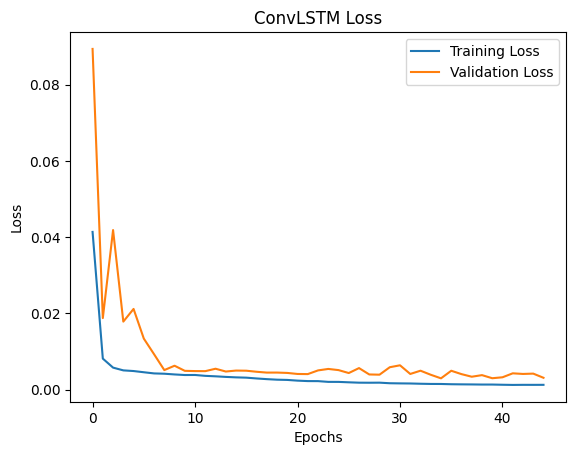

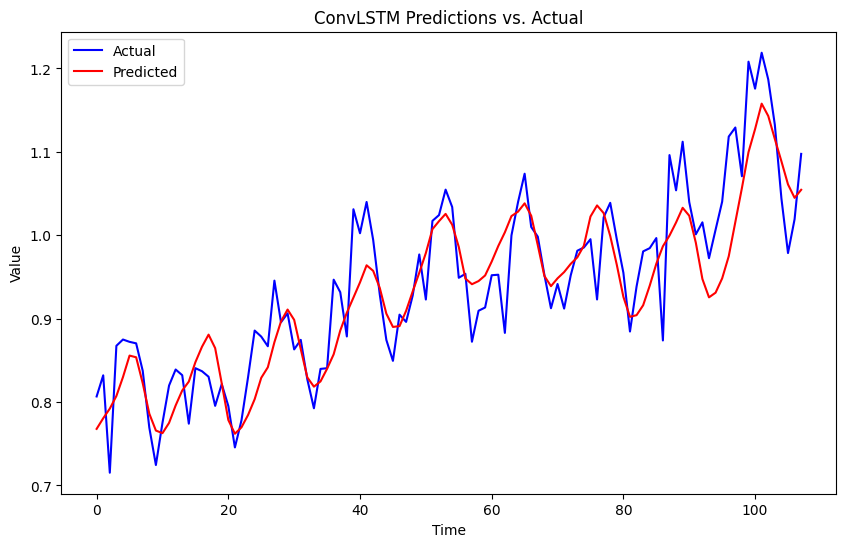

                        RMSE       MAE      MAPE
Vanilla LSTM        0.070962  0.057522  6.096293
Stacked LSTM        0.071553  0.058295  6.161482
Bidirectional LSTM  0.065084  0.052030  5.503907
CNN-LSTM            0.066005  0.053582  5.708411
ConvLSTM            0.049657  0.038772  4.093273


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
import tensorflow as tf
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, Bidirectional, Conv1D, MaxPooling1D, TimeDistributed, Flatten, ConvLSTM2D
from keras.callbacks import EarlyStopping
import random

# Set seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)
random.seed(42)

# Load the data
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')

# Apply differencing of order 1 to 'Total Renewable Energy Production'
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff(1)

# Select the 'Total Renewable Energy Production' column
data = df['Total Renewable Energy Production'].values.reshape(-1, 1)

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
data_scaled = scaler.fit_transform(data)

# Function to split the sequence into samples
def split_sequence(sequence, n_steps):
    X, y = [], []
    for i in range(len(sequence) - n_steps):
        seq_x = sequence[i:i + n_steps]
        seq_y = sequence[i + n_steps]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Define number of time steps
n_steps = 60

# Split data into samples
X, y = split_sequence(data_scaled, n_steps)

# Reshape data into [samples, timesteps, features]
n_features = 1
X = X.reshape((X.shape[0], X.shape[1], n_features))

# Split the data into training and test sets
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

# Helper function to calculate metrics
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return rmse, mae, mape

# Initialize dictionaries to store model histories and predictions
model_histories = {}
model_predictions = {}
model_metrics = {}

# Function to plot loss vs. epochs
def plot_loss(history, model_name):
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Function to plot predictions vs. actual
def plot_predictions(y_true, y_pred, model_name):
    plt.figure(figsize=(10, 6))
    plt.plot(y_true, color='blue', label='Actual')
    plt.plot(y_pred, color='red', label='Predicted')
    plt.title(f'{model_name} Predictions vs. Actual')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Vanilla LSTM
model_vanilla = Sequential()
model_vanilla.add(LSTM(50, activation='relu', input_shape=(n_steps, n_features)))
model_vanilla.add(Dense(1))
model_vanilla.compile(optimizer='adam', loss='mse')

history_vanilla = model_vanilla.fit(X_train, y_train, epochs=200, verbose=0, validation_data=(X_test, y_test), callbacks=[early_stopping])
model_histories['Vanilla LSTM'] = history_vanilla

y_pred_vanilla = model_vanilla.predict(X_test)
y_pred_vanilla = scaler.inverse_transform(y_pred_vanilla)
y_test_actual = scaler.inverse_transform(y_test.reshape(-1, 1))
model_predictions['Vanilla LSTM'] = (y_test_actual, y_pred_vanilla)
model_metrics['Vanilla LSTM'] = calculate_metrics(y_test_actual, y_pred_vanilla)

# Stacked LSTM
model_stacked = Sequential()
model_stacked.add(LSTM(50, activation='relu', return_sequences=True, input_shape=(n_steps, n_features)))
model_stacked.add(LSTM(50, activation='relu'))
model_stacked.add(Dense(1))
model_stacked.compile(optimizer='adam', loss='mse')

history_stacked = model_stacked.fit(X_train, y_train, epochs=200, verbose=0, validation_data=(X_test, y_test), callbacks=[early_stopping])
model_histories['Stacked LSTM'] = history_stacked

y_pred_stacked = model_stacked.predict(X_test)
y_pred_stacked = scaler.inverse_transform(y_pred_stacked)
model_predictions['Stacked LSTM'] = (y_test_actual, y_pred_stacked)
model_metrics['Stacked LSTM'] = calculate_metrics(y_test_actual, y_pred_stacked)

# Bidirectional LSTM
model_bi = Sequential()
model_bi.add(Bidirectional(LSTM(50, activation='relu'), input_shape=(n_steps, n_features)))
model_bi.add(Dense(1))
model_bi.compile(optimizer='adam', loss='mse')

history_bi = model_bi.fit(X_train, y_train, epochs=200, verbose=0, validation_data=(X_test, y_test), callbacks=[early_stopping])
model_histories['Bidirectional LSTM'] = history_bi

y_pred_bi = model_bi.predict(X_test)
y_pred_bi = scaler.inverse_transform(y_pred_bi)
model_predictions['Bidirectional LSTM'] = (y_test_actual, y_pred_bi)
model_metrics['Bidirectional LSTM'] = calculate_metrics(y_test_actual, y_pred_bi)

# CNN-LSTM
n_seq = 2  # Number of subsequences
n_steps_sub = n_steps // n_seq  # Timesteps per subsequence

X_train_cnn = X_train.reshape((X_train.shape[0], n_seq, n_steps_sub, n_features))
X_test_cnn = X_test.reshape((X_test.shape[0], n_seq, n_steps_sub, n_features))

model_cnn_lstm = Sequential()
model_cnn_lstm.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, n_steps_sub, n_features)))
model_cnn_lstm.add(TimeDistributed(MaxPooling1D(pool_size=2)))
model_cnn_lstm.add(TimeDistributed(Flatten()))
model_cnn_lstm.add(LSTM(50, activation='relu'))
model_cnn_lstm.add(Dense(1))
model_cnn_lstm.compile(optimizer='adam', loss='mse')

history_cnn_lstm = model_cnn_lstm.fit(X_train_cnn, y_train, epochs=200, verbose=0, validation_data=(X_test_cnn, y_test), callbacks=[early_stopping])
model_histories['CNN-LSTM'] = history_cnn_lstm

y_pred_cnn_lstm = model_cnn_lstm.predict(X_test_cnn)
y_pred_cnn_lstm = scaler.inverse_transform(y_pred_cnn_lstm)
model_predictions['CNN-LSTM'] = (y_test_actual, y_pred_cnn_lstm)
model_metrics['CNN-LSTM'] = calculate_metrics(y_test_actual, y_pred_cnn_lstm)

# ConvLSTM
X_train_conv = X_train.reshape((X_train.shape[0], n_seq, 1, n_steps_sub, n_features))
X_test_conv = X_test.reshape((X_test.shape[0], n_seq, 1, n_steps_sub, n_features))

model_conv_lstm = Sequential()
model_conv_lstm.add(ConvLSTM2D(filters=64, kernel_size=(1, 2), activation='relu', input_shape=(n_seq, 1, n_steps_sub, n_features)))
model_conv_lstm.add(Flatten())
model_conv_lstm.add(Dense(1))
model_conv_lstm.compile(optimizer='adam', loss='mse')

history_conv_lstm = model_conv_lstm.fit(X_train_conv, y_train, epochs=200, verbose=0, validation_data=(X_test_conv, y_test), callbacks=[early_stopping])
model_histories['ConvLSTM'] = history_conv_lstm

y_pred_conv_lstm = model_conv_lstm.predict(X_test_conv)
y_pred_conv_lstm = scaler.inverse_transform(y_pred_conv_lstm)
model_predictions['ConvLSTM'] = (y_test_actual, y_pred_conv_lstm)
model_metrics['ConvLSTM'] = calculate_metrics(y_test_actual, y_pred_conv_lstm)

# Plot Loss vs. Epochs and Predictions vs. Actual for each model
for model_name, history in model_histories.items():
    plot_loss(history, model_name)
    y_true, y_pred = model_predictions[model_name]
    plot_predictions(y_true, y_pred, model_name)

# Generate metrics table
metrics_table = pd.DataFrame(model_metrics, index=['RMSE', 'MAE', 'MAPE']).T
print(metrics_table)


#### 5.3.3.Multi-step LSTM for Vector Output and Encoder-Decorder Model

**Objective**

LSTMs are able to map input data directly to an output vector that will indicate multiple steps which is vector output. LSTMs can also use an encoder-decoder architecture to process sequences and predict future values. This model is especially useful for handling different lengths of input sequences that give out different lengths of output sequences. It this case we will run these on univaraite inputs of 'Total Renwable Energy Production'.

**Insights**

The predicted values for both the Vector Output and Encoder-decoder follow the general upward trend of the actual values while being sensitive to the fluctuations being a good representative of the actual datapoints.

Although, the predicted lines in Vector-Output are more bundled thant the encorder-decorder which are slightly far apart from one another. This is because the vector output is a single output vector for univariate causing a higher correlation between the lines making them more bundled unlike the encorder-decorder where the vectors transform introducing a chance of variance.

The MAPE values are infinity because the actual values must be really low. The vector output model performs better with lesser absolute error rates with RMSE and MAE at 0.056716 and  0.046123, while encoder-decorder at 0.060508 and 0.048020, respectively.

Vector Output Model - Training Loss: 0.002686425345018506, Testing Loss: 0.003216678975149989
18/18 [==============================] - 1s 16ms/step


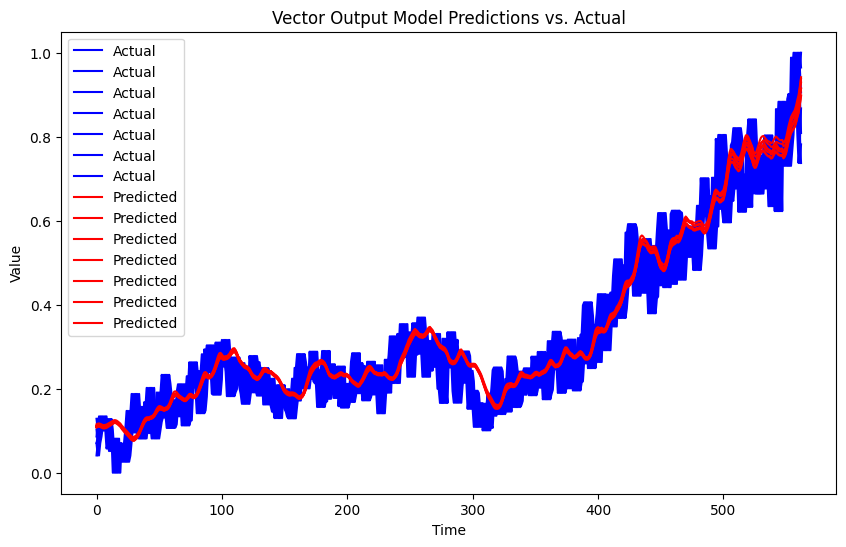

Vector Output Model Metrics - RMSE: 0.05671577219062679, MAE: 0.04612252880958036, MAPE: inf
Encoder-Decoder Model - Training Loss: 0.0027516759000718594, Testing Loss: 0.003661178518086672
18/18 [==============================] - 1s 10ms/step


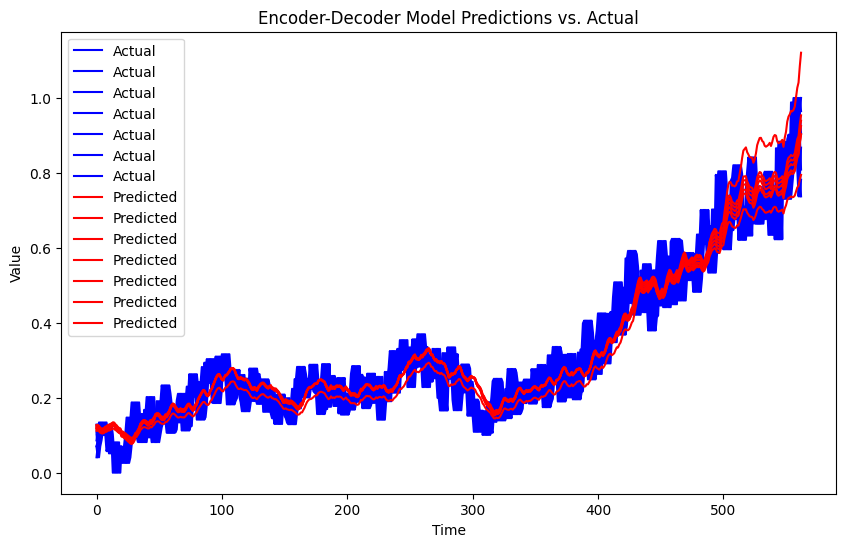

Encoder-Decoder Model Metrics - RMSE: 0.060507670219384746, MAE: 0.04802027539714741, MAPE: inf

Metrics Table:
                           RMSE       MAE  MAPE
Vector Output Model    0.056716  0.046123   inf
Encoder-Decoder Model  0.060508  0.048020   inf


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential, Model
from keras.layers import LSTM, Dense, Input, RepeatVector, TimeDistributed
from keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Load the dataset
df = pd.read_csv("World-Energy-Overview.csv", parse_dates=['Date'], index_col='Date')

# Apply differencing of order 1 to 'Total Renewable Energy Production'
#df['Total Renewable Energy Production'] = df['Total Renewable Energy Production'].diff(1)

# Extract the 'Total Renewable Energy Production' column
energy_data = df['Total Renewable Energy Production'].values

# Normalize the data
scaler = MinMaxScaler()
energy_data_scaled = scaler.fit_transform(energy_data.reshape(-1, 1)).flatten()

# Function to split the sequence into samples
def split_sequence(sequence, n_steps_in, n_steps_out):
    X, y = [], []
    for i in range(len(sequence) - n_steps_in - n_steps_out + 1):
        end_ix = i + n_steps_in
        out_end_ix = end_ix + n_steps_out
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix:out_end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Define the number of input and output steps
n_steps_in, n_steps_out = 30, 7

# Split the sequence into samples
X, y = split_sequence(energy_data_scaled, n_steps_in, n_steps_out)

# Reshape the data for LSTM
n_features = 1
X = X.reshape((X.shape[0], X.shape[1], n_features))
y = y.reshape((y.shape[0], y.shape[1], n_features))

# Define Early Stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Function to calculate metrics
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return rmse, mae, mape

# Function to plot predictions vs. actual
def plot_predictions(y_true, y_pred, model_name):
    plt.figure(figsize=(10, 6))
    plt.plot(y_true, color='blue', label='Actual')
    plt.plot(y_pred, color='red', label='Predicted')
    plt.title(f'{model_name} Predictions vs. Actual')
    plt.xlabel('Time')
    plt.ylabel('Value')
    plt.legend()
    plt.show()

# Define the Vector Output Model
model_vector = Sequential()
model_vector.add(LSTM(100, activation='relu', return_sequences=True, input_shape=(n_steps_in, n_features)))
model_vector.add(LSTM(100, activation='relu'))
model_vector.add(Dense(n_steps_out))
model_vector.compile(optimizer='adam', loss='mse')

# Train the Vector Output Model
history_vector = model_vector.fit(X, y, epochs=200, verbose=0, validation_split=0.2, callbacks=[early_stopping])

# Evaluate Vector Output Model on test set
test_loss_vector = model_vector.evaluate(X, y, verbose=0)
print(f"Vector Output Model - Training Loss: {history_vector.history['loss'][-1]}, Testing Loss: {test_loss_vector}")

# Predictions for Vector Output Model
y_pred_vector = model_vector.predict(X)
y_pred_vector = y_pred_vector.reshape(-1, n_steps_out)
y_true_vector = y.reshape(-1, n_steps_out)
plot_predictions(y_true_vector, y_pred_vector, 'Vector Output Model')

# Calculate metrics for Vector Output Model
rmse_vector, mae_vector, mape_vector = calculate_metrics(y_true_vector, y_pred_vector)
print(f"Vector Output Model Metrics - RMSE: {rmse_vector}, MAE: {mae_vector}, MAPE: {mape_vector}")

# Define the Encoder-Decoder Model
encoder_inputs = Input(shape=(n_steps_in, n_features))
encoder = LSTM(100, activation='relu')(encoder_inputs)
encoder_outputs = RepeatVector(n_steps_out)(encoder)
decoder = LSTM(100, activation='relu', return_sequences=True)(encoder_outputs)
decoder_outputs = TimeDistributed(Dense(n_features))(decoder)
model_encoder_decoder = Model(inputs=encoder_inputs, outputs=decoder_outputs)
model_encoder_decoder.compile(optimizer='adam', loss='mse')

# Train the Encoder-Decoder Model
history_encoder_decoder = model_encoder_decoder.fit(X, y, epochs=200, verbose=0, validation_split=0.2, callbacks=[early_stopping])

# Evaluate Encoder-Decoder Model on test set
test_loss_encoder_decoder = model_encoder_decoder.evaluate(X, y, verbose=0)
print(f"Encoder-Decoder Model - Training Loss: {history_encoder_decoder.history['loss'][-1]}, Testing Loss: {test_loss_encoder_decoder}")

# Predictions for Encoder-Decoder Model
y_pred_encoder_decoder = model_encoder_decoder.predict(X)
y_pred_encoder_decoder = y_pred_encoder_decoder.reshape(-1, n_steps_out)
plot_predictions(y_true_vector, y_pred_encoder_decoder, 'Encoder-Decoder Model')

# Calculate metrics for Encoder-Decoder Model
rmse_encoder_decoder, mae_encoder_decoder, mape_encoder_decoder = calculate_metrics(y_true_vector, y_pred_encoder_decoder)
print(f"Encoder-Decoder Model Metrics - RMSE: {rmse_encoder_decoder}, MAE: {mae_encoder_decoder}, MAPE: {mape_encoder_decoder}")

# Create a table for RMSE, MAE, MAPE
models = ['Vector Output Model', 'Encoder-Decoder Model']
metrics_table = pd.DataFrame({
    'RMSE': [rmse_vector, rmse_encoder_decoder],
    'MAE': [mae_vector, mae_encoder_decoder],
    'MAPE': [mape_vector, mape_encoder_decoder]
}, index=models)
print("\nMetrics Table:")
print(metrics_table)


## 6.Grid Search Hyperparameters for an MLPs for Univariate Time Series Forecasting

### 6.1.Grid Search on Dense Layer

**Purpose:**

- This section performs the grid search by changing hyperparameters to find the best configuration from a set of possibilities for a deep learning model to forecast renewable energy production.

- It can be identified by looking at the lowest RMSE to find the best forecasting performance.

- Grid search with different configuration list is done for three models: Dense Layer, CNN and LSTM.

In [ ]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, mean_squared_error, accuracy_score
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, LSTM, TimeDistributed
import math

# Load the dataset
series = pd.read_csv('World-Energy-Overview.csv', parse_dates=['Date'], index_col='Date')
data = series['Total Renewable Energy Production'].values

def difference(data, order):
    """
    Apply differencing to a dataset.

    Parameters:
    data (list or array): The time series data.
    order (int): The lag order to difference by.

    Returns:
    list: The differenced dataset.
    """
    return [data[i] - data[i - order] for i in range(order, len(data))]

def series_to_supervised(data, n_in, n_out=1):
    """
    Transform a time series into a supervised learning format.

    Parameters:
    data (list or array): The univariate time series data.
    n_in (int): The number of lag observations as input (X).
    n_out (int): The number of observations as output (y). Default is 1.

    Returns:
    ndarray: The transformed data suitable for supervised learning.
    """
    df = pd.DataFrame(data)
    cols = []

    # Create input sequence (t-n, ..., t-1)
    cols += [df.shift(i) for i in range(n_in, 0, -1)]

    # Create forecast sequence (t, t+1, ..., t+n)
    cols += [df.shift(-i) for i in range(n_out)]

    # Combine all sequences and drop rows with NaN values
    agg = pd.concat(cols, axis=1).dropna()

    return agg.values
def model_fit(train, config):
    """
    Fit a neural network model.

    Parameters:
    train (list or array): Training data.
    config (list): Model configuration [n_input, n_nodes, n_epochs, n_batch, n_diff].

    Returns:
    model: Trained neural network model.
    """
    # Unpack config
    n_input, n_nodes, n_epochs, n_batch, n_diff = config

    # Apply differencing if required
    if n_diff > 0:
        train = difference(train, n_diff)

    # Transform series into supervised format
    data = series_to_supervised(train, n_in=n_input)

    # Separate inputs and outputs
    train_x, train_y = data[:, :-1], data[:, -1]

    # Define and compile the model
    model = Sequential()
    model.add(Dense(n_nodes, activation='relu', input_dim=n_input))
    model.add(Dense(1))
    model.compile(loss='mse', optimizer='adam')

    # Fit the model
    model.fit(train_x, train_y, epochs=n_epochs, batch_size=n_batch, verbose=0)

    return model

def model_predict(model, history, config):
    """
    Make a forecast with a trained model.

    Parameters:
    model: Trained neural network model.
    history (list): Historical data.
    config (list): Model configuration [n_input, n_nodes, n_epochs, n_batch, n_diff].

    Returns:
    float: Forecasted value.
    """
    # Unpack config
    n_input, _, _, _, n_diff = config

    # Prepare data
    correction = 0.0
    if n_diff > 0:
        correction = history[-n_diff]
        history = difference(history, n_diff)

    # Shape input for the model
    x_input = np.array(history[-n_input:]).reshape((1, n_input))

    # Make forecast
    yhat = model.predict(x_input, verbose=0)

    # Correct forecast if it was differenced
    return correction + yhat[0]



def model_configs():
    n_input = [12]
    n_nodes = [50, 100]  # Number of nodes in the Dense layer
    n_epochs = [100]
    n_batch = [1, 150]
    n_diff = [0, 12]

    # Generate all possible configurations
    configs = [[i, j, k, l, m]
                for i in n_input
                for j in n_nodes
                for k in n_epochs
                for l in n_batch
                for m in n_diff]

    print('Total configs: %d' % len(configs))
    return configs

def train_test_split(data, test_size):
    """
    Split a dataset into training and testing sets.

    Parameters:
    data (array-like): The dataset to split.
    test_size (int): The number of samples to include in the test set.

    Returns:
    tuple: Training and test sets.
    """
    # The original code was trying to split using an integer.
    # This change splits the data based on the test_size
    return data[:-test_size], data[-test_size:]



# ... rest of your code ...

def measure_rmse(actual, predicted):
    return math.sqrt(mean_squared_error(actual, predicted)) # Use math.sqrt
def walk_forward_validation(data, n_test, cfg):
    """
    Perform walk-forward validation for univariate data.

    Parameters:
    data (array-like): The dataset.
    n_test (int): The number of test samples.
    cfg (dict): The model configuration.

    Returns:
    float: The RMSE error.
    """
    predictions = []
    # Split dataset into training and test sets
    train, test = train_test_split(data, n_test)

    # Fit the model
    model = model_fit(train, cfg)
    # Seed history with the training dataset
    history = list(train)

    # Step over each time step in the test set
    for i in range(len(test)):
        # Make forecast for the current history
        yhat = model_predict(model, history, cfg)
        # Store the forecast in the list of predictions
        predictions.append(yhat)
        # Add actual observation to history for the next prediction
        history.append(test[i])

    # Estimate prediction error
    error = measure_rmse(test, predictions)
    print(' > %.3f' % error)
    return error

def repeat_evaluate(data, config, n_test, n_repeats=10):
    """
    Evaluate a model configuration multiple times and return the average score.

    Parameters:
    data (array-like): The dataset for model evaluation.
    config (dict): The model configuration.
    n_test (int): The number of test samples.
    n_repeats (int): The number of times to repeat the evaluation.

    Returns:
    tuple: A tuple containing the configuration key and the average score.
    """
    key = str(config)
    scores = [walk_forward_validation(data, n_test, config) for _ in range(n_repeats)]
    result = np.mean(scores)
    print('> Model[%s] %.3f' % (key, result))
    return key, result

def grid_search(data, cfg_list, n_test):
    """
    Perform a grid search to evaluate a list of configurations.

    Parameters:
    data (array-like): The dataset for model evaluation.
    cfg_list (list): A list of model configurations to evaluate.
    n_test (int): The number of test samples.

    Returns:
    list: A list of tuples with configuration and corresponding error, sorted by error.
    """
    scores = [repeat_evaluate(data, cfg, n_test) for cfg in cfg_list]
    scores.sort(key=lambda tup: tup[1])
    return scores




# Number of test samples
n_test = 12

# Model configurations
cfg_list = model_configs()

# Perform grid search
scores = grid_search(data, cfg_list, n_test)
print('done')

# List top 3 configurations
for cfg, error in scores[:3]:
    print(cfg, error)


Total configs: 8
 > 0.062
 > 0.090
 > 0.051
 > 0.058
 > 0.062
 > 0.066
 > 0.064
 > 0.067
 > 0.052
 > 0.052
> Model[[12, 50, 100, 1, 0]] 0.062
 > 0.074
 > 0.094
 > 0.065
 > 0.083
 > 0.110
 > 0.090
 > 0.092
 > 0.118
 > 0.084
 > 0.081
> Model[[12, 50, 100, 1, 12]] 0.089
 > 0.114
 > 0.089
 > 0.108
 > 0.102
 > 0.064
 > 0.108
 > 0.075
 > 0.073
 > 0.065
 > 0.069
> Model[[12, 50, 100, 150, 0]] 0.087
 > 0.054
 > 0.063
 > 0.057
 > 0.061
 > 0.057
 > 0.061
 > 0.057
 > 0.054
 > 0.059
 > 0.056
> Model[[12, 50, 100, 150, 12]] 0.058
 > 0.055
 > 0.057
 > 0.072
 > 0.053
 > 0.073
 > 0.054
 > 0.051
 > 0.044
 > 0.047
 > 0.059
> Model[[12, 100, 100, 1, 0]] 0.057
 > 0.107
 > 0.120
 > 0.110
 > 0.082
 > 0.114
 > 0.098
 > 0.074
 > 0.085
 > 0.090
 > 0.084
> Model[[12, 100, 100, 1, 12]] 0.096
 > 0.111
 > 0.077
 > 0.083
 > 0.076
 > 0.095
 > 0.080
 > 0.066
 > 0.093
 > 0.092
 > 0.092
> Model[[12, 100, 100, 150, 0]] 0.086
 > 0.056
 > 0.055
 > 0.060
 > 0.055
 > 0.060
 > 0.058
 > 0.063
 > 0.057
 > 0.059
 > 0.059
> Mode

**Dense Layer Results:**

1. A total of eight configurations have been made with the combinations of **[input steps, nodes, epochs, batch size, differencing order]**.

2. The configuration **[12, 100, 100, 1, 0]** (12 input steps, 100 nodes, 100 epochs, batch size of 1, no differencing) got the lowest RMSE of 0.056.

3. This was followed by [12, 50, 100, 150, 12] and [12, 100, 100, 150, 12] both of which had differencing set to 12. Therefore, differencing could be effecting the performance of the daatset.

### 6.2.Grid Search on CNN Model


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten
import math

def difference(data, order):
    """
    Apply differencing to a dataset.

    Parameters:
    data (list or array): The time series data.
    order (int): The lag order to difference by.

    Returns:
    list: The differenced dataset.
    """
    return [data[i] - data[i - order] for i in range(order, len(data))]

def series_to_supervised(data, n_in, n_out=1):
    """
    Transform a time series into a supervised learning format.

    Parameters:
    data (list or array): The univariate time series data.
    n_in (int): The number of lag observations as input (X).
    n_out (int): The number of observations as output (y). Default is 1.

    Returns:
    ndarray: The transformed data suitable for supervised learning.
    """
    df = pd.DataFrame(data)
    cols = []

    # Create input sequence (t-n, ..., t-1)
    cols += [df.shift(i) for i in range(n_in, 0, -1)]

    # Create forecast sequence (t, t+1, ..., t+n)
    cols += [df.shift(-i) for i in range(n_out)]

    # Combine all sequences and drop rows with NaN values
    agg = pd.concat(cols, axis=1).dropna()

    return agg.values

def model_fit(train, config):
    """
    Fit a CNN model.

    Parameters:
    train (array): Training data.
    config (list): Model configuration [n_input, n_filters, n_kernel, n_epochs, n_batch, n_diff].

    Returns:
    model: Trained CNN model.
    """
    # Unpack config
    n_input, n_filters, n_kernel, n_epochs, n_batch, n_diff = config

    # Apply differencing if required
    if n_diff > 0:
        train = difference(train, n_diff)

    # Transform series into supervised format
    data = series_to_supervised(train, n_in=n_input)

    # Separate inputs and outputs
    train_x, train_y = data[:, :-1], data[:, -1]

    # Reshape input data into [samples, timesteps, features]
    n_features = 1
    train_x = train_x.reshape((train_x.shape[0], train_x.shape[1], n_features))

    # Define and compile the model
    model = Sequential([
        Conv1D(filters=n_filters, kernel_size=n_kernel, activation='relu', input_shape=(n_input, n_features)),
        MaxPooling1D(pool_size=2),
        Flatten(),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer='adam')

    # Fit the model
    model.fit(train_x, train_y, epochs=n_epochs, batch_size=n_batch, verbose=0)

    return model

def model_predict(model, history, config):
    """
    Make a forecast with a trained model.

    Parameters:
    model: Trained Convolutional neural network model.
    history (list): Historical data.
    config (list): Model configuration [n_input, n_filters, n_kernel, n_epochs, n_batch, n_diff].

    Returns:
    float: Forecasted value.
    """
    # Unpack configuration
    n_input, _, _, _, _, n_diff = config

    # Apply differencing correction if needed
    correction = history[-n_diff] if n_diff > 0 else 0.0
    history = difference(history, n_diff) if n_diff > 0 else history

    # Prepare input data for the model
    x_input = np.array(history[-n_input:]).reshape((1, n_input, 1))

    # Make forecast
    yhat = model.predict(x_input, verbose=0)

    # Adjust forecast if differenced
    return correction + yhat[0][0]

def model_configs():
    """
    Create a list of model configurations to try.

    Returns:
    list: List of model configurations.
    """
    # Define scope of configs
    n_input = [12]
    n_filters = [64]
    n_kernels = [3, 5]
    n_epochs = [100]
    n_batch = [1, 150]
    n_diff = [0, 12]

    # Create configs using list comprehension
    configs = [[a, b, c, d, e, f] for a in n_input for b in n_filters for c in n_kernels for d in n_epochs for e in n_batch for f in n_diff]

    print('Total configs: %d' % len(configs))
    return configs

def train_test_split(data, test_size):
    """
    Split a dataset into training and testing sets.

    Parameters:
    data (array-like): The dataset to split.
    test_size (int): The number of samples to include in the test set.

    Returns:
    tuple: Training and test sets.
    """
    return data[:-test_size], data[-test_size:]

def measure_rmse(actual, predicted):
    return math.sqrt(mean_squared_error(actual, predicted))

def walk_forward_validation(data, n_test, cfg):
    """
    Perform walk-forward validation for univariate data.

    Parameters:
    data (array-like): The dataset.
    n_test (int): The number of test samples.
    cfg (dict): The model configuration.

    Returns:
    float: The RMSE error.
    """
    predictions = []
    # Split dataset into training and test sets
    train, test = train_test_split(data, n_test)

    # Fit the model
    model = model_fit(train, cfg)
    # Seed history with the training dataset
    history = list(train)

    # Step over each time step in the test set
    for i in range(len(test)):
        # Make forecast for the current history
        yhat = model_predict(model, history, cfg)
        # Store the forecast in the list of predictions
        predictions.append(yhat)
        # Add actual observation to history for the next prediction
        history.append(test[i])

    # Estimate prediction error
    error = measure_rmse(test, predictions)
    print(' > %.3f' % error)
    return error

def repeat_evaluate(data, config, n_test, n_repeats=10):
    """
    Evaluate a model configuration multiple times and return the average score.

    Parameters:
    data (array-like): The dataset for model evaluation.
    config (dict): The model configuration.
    n_test (int): The number of test samples.
    n_repeats (int): The number of times to repeat the evaluation.

    Returns:
    tuple: A tuple containing the configuration key and the average score.
    """
    key = str(config)
    scores = [walk_forward_validation(data, n_test, config) for _ in range(n_repeats)]
    result = np.mean(scores)
    print('> Model[%s] %.3f' % (key, result))
    return key, result

def grid_search(data, cfg_list, n_test):
    """
    Perform a grid search to evaluate a list of configurations.

    Parameters:
    data (array-like): The dataset for model evaluation.
    cfg_list (list): A list of model configurations to evaluate.
    n_test (int): The number of test samples.

    Returns:
    list: A list of tuples with configuration and corresponding error, sorted by error.
    """
    scores = [repeat_evaluate(data, cfg, n_test) for cfg in cfg_list]
    scores.sort(key=lambda tup: tup[1])
    return scores

# Define dataset
series = pd.read_csv('World-Energy-Overview.csv', parse_dates=['Date'], index_col='Date')
data = series['Total Renewable Energy Production'].values

# Data split
n_test = 12

# Model configs
cfg_list = model_configs()

# Grid search
scores = grid_search(data, cfg_list, n_test)
print('done')

# List top 3 configs
for cfg, error in scores[:3]:
    print(cfg, error)


Total configs: 8
 > 0.053
 > 0.062
 > 0.048
 > 0.087
 > 0.039
 > 0.046
 > 0.058
 > 0.049
 > 0.047
 > 0.044
> Model[[12, 64, 3, 100, 1, 0]] 0.053
 > 0.059
 > 0.073
 > 0.056
 > 0.065
 > 0.058
 > 0.052
 > 0.065
 > 0.059
 > 0.066
 > 0.055
> Model[[12, 64, 3, 100, 1, 12]] 0.061
 > 0.093
 > 0.113
 > 0.104
 > 0.106
 > 0.096
 > 0.110
 > 0.096
 > 0.099
 > 0.089
 > 0.102
> Model[[12, 64, 3, 100, 150, 0]] 0.101
 > 0.053
 > 0.056
 > 0.048
 > 0.054
 > 0.051
 > 0.053
 > 0.054
 > 0.053
 > 0.057
 > 0.052
> Model[[12, 64, 3, 100, 150, 12]] 0.053
 > 0.063
 > 0.059
 > 0.059
 > 0.048
 > 0.050
 > 0.046
 > 0.056
 > 0.057
 > 0.044
 > 0.059
> Model[[12, 64, 5, 100, 1, 0]] 0.054
 > 0.069
 > 0.053
 > 0.067
 > 0.062
 > 0.063
 > 0.054
 > 0.053
 > 0.060
 > 0.070
 > 0.066
> Model[[12, 64, 5, 100, 1, 12]] 0.062
 > 0.109
 > 0.106
 > 0.108
 > 0.109
 > 0.100
 > 0.104
 > 0.101
 > 0.108
 > 0.112
 > 0.103
> Model[[12, 64, 5, 100, 150, 0]] 0.106
 > 0.051
 > 0.049
 > 0.052
 > 0.052
 > 0.056
 > 0.052
 > 0.044
 > 0.053
 > 0.0

**CNN Results:**

1. A total of eight configurations have been made with the combinations of **[input steps, Conv1D layer, kernel size, epochs, batch size, differencing order]**.

2. The configuration **[12, 64, 5, 100, 150, 12]** (12  input steps, 64 x 64 Conv1D layer, 5 x 5 kernel size, 100 epochs, batch size of 100, differencing of 12) got the lowest RMSE of 0.050.

3. This was followed by [12, 64, 3, 100, 1, 0] and [12, 64, 3, 100, 150, 12] which had the respective RMSE, 0.05322 and 0.05329, which is very close.

### 6.3.Grid Search for LSTM Model

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense, LSTM
import math

def difference(data, order):
    """
    Apply differencing to a dataset.

    Parameters:
    data (list or array): The time series data.
    order (int): The lag order to difference by.

    Returns:
    list: The differenced dataset.
    """
    return [data[i] - data[i - order] for i in range(order, len(data))]

def series_to_supervised(data, n_in, n_out=1):
    """
    Transform a time series into a supervised learning format.

    Parameters:
    data (list or array): The univariate time series data.
    n_in (int): The number of lag observations as input (X).
    n_out (int): The number of observations as output (y). Default is 1.

    Returns:
    ndarray: The transformed data suitable for supervised learning.
    """
    df = pd.DataFrame(data)
    cols = []

    # Create input sequence (t-n, ..., t-1)
    cols += [df.shift(i) for i in range(n_in, 0, -1)]

    # Create forecast sequence (t, t+1, ..., t+n)
    cols += [df.shift(-i) for i in range(n_out)]

    # Combine all sequences and drop rows with NaN values
    agg = pd.concat(cols, axis=1).dropna()

    return agg.values

# Fit an LSTM model
def model_fit(train, config):
    """
    Fit an LSTM model.

    Parameters:
    train (array): Training data.
    config (list): Model configuration [n_input, n_nodes, n_epochs, n_batch, n_diff].

    Returns:
    model: Trained LSTM model.
    """
    # Unpack configuration
    n_input, n_nodes, n_epochs, n_batch, n_diff = config

    # Apply differencing if required
    if n_diff > 0:
        train = difference(train, n_diff)

    # Transform series into supervised format
    data = series_to_supervised(train, n_input)

    # Separate inputs and outputs
    train_x, train_y = data[:, :-1], data[:, -1]

    # Reshape input data into [samples, timesteps, features]
    train_x = train_x.reshape((train_x.shape[0], train_x.shape[1], 1))

    # Define and compile the LSTM model
    model = Sequential([
        LSTM(n_nodes, activation='relu', input_shape=(n_input, 1)),
        Dense(n_nodes, activation='relu'),
        Dense(1)
    ])
    model.compile(loss='mse', optimizer='adam')

    # Fit the model
    model.fit(train_x, train_y, epochs=n_epochs, batch_size=n_batch, verbose=0)

    return model

def model_predict(model, history, config):
    """
    Make a forecast with a trained model.

    Parameters:
    model: Trained neural network model.
    history (list): Historical data.
    config (list): Model configuration [n_input, n_nodes, n_epochs, n_batch, n_diff].

    Returns:
    float: Forecasted value.
    """
    # Unpack configuration
    n_input, _, _, _, n_diff = config

    # Prepare data
    correction = history[-n_diff] if n_diff > 0 else 0.0
    history = difference(history, n_diff) if n_diff > 0 else history

    # Reshape input for the model
    x_input = np.array(history[-n_input:]).reshape((1, n_input, 1))

    # Make forecast
    yhat = model.predict(x_input, verbose=0)

    return correction + yhat[0][0]

def model_configs():
    """
    Create a list of model configurations to try.

    Returns:
    list: List of model configurations.
    """
    # Define scope of configs
    n_input = [12]
    n_nodes = [100]
    n_epochs = [50]
    n_batch = [1, 150]
    n_diff = [12]

    # Create configs using list comprehension
    configs = [[i, j, k, l, m] for i in n_input for j in n_nodes for k in n_epochs for l in n_batch for m in n_diff]
    print('Total configs: %d' % len(configs))
    return configs

def train_test_split(data, test_size):
    """
    Split a dataset into training and testing sets.

    Parameters:
    data (array-like): The dataset to split.
    test_size (int): The number of samples to include in the test set.

    Returns:
    tuple: Training and test sets.
    """
    return data[:-test_size], data[-test_size:]

def measure_rmse(actual, predicted):
    return math.sqrt(mean_squared_error(actual, predicted))

def walk_forward_validation(data, n_test, cfg):
    """
    Perform walk-forward validation for univariate data.

    Parameters:
    data (array-like): The dataset.
    n_test (int): The number of test samples.
    cfg (dict): The model configuration.

    Returns:
    float: The RMSE error.
    """
    predictions = []
    # Split dataset into training and test sets
    train, test = train_test_split(data, n_test)

    # Fit the model
    model = model_fit(train, cfg)
    # Seed history with the training dataset
    history = list(train)

    # Step over each time step in the test set
    for i in range(len(test)):
        # Make forecast for the current history
        yhat = model_predict(model, history, cfg)
        # Store the forecast in the list of predictions
        predictions.append(yhat)
        # Add actual observation to history for the next prediction
        history.append(test[i])

    # Estimate prediction error
    error = measure_rmse(test, predictions)
    print(' > %.3f' % error)
    return error

def repeat_evaluate(data, config, n_test, n_repeats=10):
    """
    Evaluate a model configuration multiple times and return the average score.

    Parameters:
    data (array-like): The dataset for model evaluation.
    config (dict): The model configuration.
    n_test (int): The number of test samples.
    n_repeats (int): The number of times to repeat the evaluation.

    Returns:
    tuple: A tuple containing the configuration key and the average score.
    """
    key = str(config)
    scores = [walk_forward_validation(data, n_test, config) for _ in range(n_repeats)]
    result = np.mean(scores)
    print('> Model[%s] %.3f' % (key, result))
    return key, result

def grid_search(data, cfg_list, n_test):
    """
    Perform a grid search to evaluate a list of configurations.

    Parameters:
    data (array-like): The dataset for model evaluation.
    cfg_list (list): A list of model configurations to evaluate.
    n_test (int): The number of test samples.

    Returns:
    list: A list of tuples with configuration and corresponding error, sorted by error.
    """
    scores = [repeat_evaluate(data, cfg, n_test) for cfg in cfg_list]
    scores.sort(key=lambda tup: tup[1])
    return scores

# Define dataset
series = pd.read_csv('World-Energy-Overview.csv', parse_dates=['Date'], index_col='Date')
data = series['Total Renewable Energy Production'].values

# Data split
n_test = 12

# Model configs
cfg_list = model_configs()

# Grid search
scores = grid_search(data, cfg_list, n_test)
print('done')

# List top 3 configs
for cfg, error in scores[:3]:
    print(cfg, error)


Total configs: 2
 > 0.053
 > 0.053
 > 0.050
 > 0.056
 > 0.055
 > 0.061
 > 0.062
 > 0.055
 > 0.054
 > 0.057
> Model[[12, 100, 50, 1, 12]] 0.056
 > 0.053
 > 0.056
 > 0.055
 > 0.051
 > 0.055
 > 0.055
 > 0.053
 > 0.053
 > 0.053
 > 0.055
> Model[[12, 100, 50, 150, 12]] 0.054
done
[12, 100, 50, 150, 12] 0.05392431726151037
[12, 100, 50, 1, 12] 0.055505056272385014


**LSTM Results:**

1. A total of two configurations have been made with the combinations of **[input steps, LSTM layer, epochs, batch size, and differencing order]**.

2. The configuration **[12, 100, 50, 150, 12]** (12 input steps, 100 LSTM layer, 50 epochs, batch size of 150, differencing of 12) got the lowest RMSE of 0.053, followed by [12, 100, 50, 1, 12] at 0.055.

3. Thus, reducing the batch size yielded better performance.

## 7.Classification Problem

**Purpose**

So far, the dataset of total renewable energy production has been considered as a regression problem with inputs as quadrillion Btu units and the output predictions of the model presented as numbers.

Similarly, this can be treated as a classification problem where quad Btu units can be represented with categorical label. Since this is a univariate problem, the dataset does not consist the labels itself, new labels have been created. They classify energy production into **'Low', 'Medium', 'High'** categories based on yearly and rolling mean thresholds. Additional features such as month, season and rolling statistics have also been implemented for window.

**How is classification done?**

'Low', 'Medium', 'High' labels can be created by divided the y-axis into three equal sections, however, since the trend of the graph is always increasing, the prediction will display 'High' for all new data unless energy production significantly dipped down to from 1.2 quad Btu in 2020 to 0.6 quad Btu in 2010, which is highly unlikely.

Therefore, to do meaningful classfication for learning useful insights from new data, **the datapoints (here, months) in each year will be classified into 'Low', 'Medium', 'High'.** This way within a given year, the intrepret can know what the energy production is like within that given year.

**Example for Understanding**

For example, for the sake of simplicity, in 2001, Jan - May : 'Low', Jun - Aug: 'High', Sep - Dec: 'Medium', and in 2002, Jan - Apr : 'Low', May - Aug: 'High', Sep - Dec: 'Medium'. May 2001 is 'Low' while May 2002 is 'High'. This can be interpreted as, "May 2001 was relatively low for renewable energy production compared to other months in 2001", while the next year "2002 was relatively high for renewable energy production compared to other months in 2002". Note, that this does not necessitate that May 2001 has a lower value in energy production in quad Btu compared to May 2002. It just compares within the year and not in between.

### 7.1.Model Performance

Several models have been used to check for model evaluation for classification into 'Low', 'Medium', 'High' labels. These models are CNN-LSTM for sequence classification, random forest, k-Nearest Neighbors, Decision Tree, SVM, Naive Bayes, Extra Trees and Gradient Boosting. The ratio of train-test split is same for all models.


           ds         y  year   label
0  1973-01-31  0.403981  1973    High
1  1973-02-28  0.360900  1973  Medium
2  1973-03-31  0.400161  1973    High
3  1973-04-30  0.380470  1973  Medium
4  1973-05-31  0.392141  1973    High


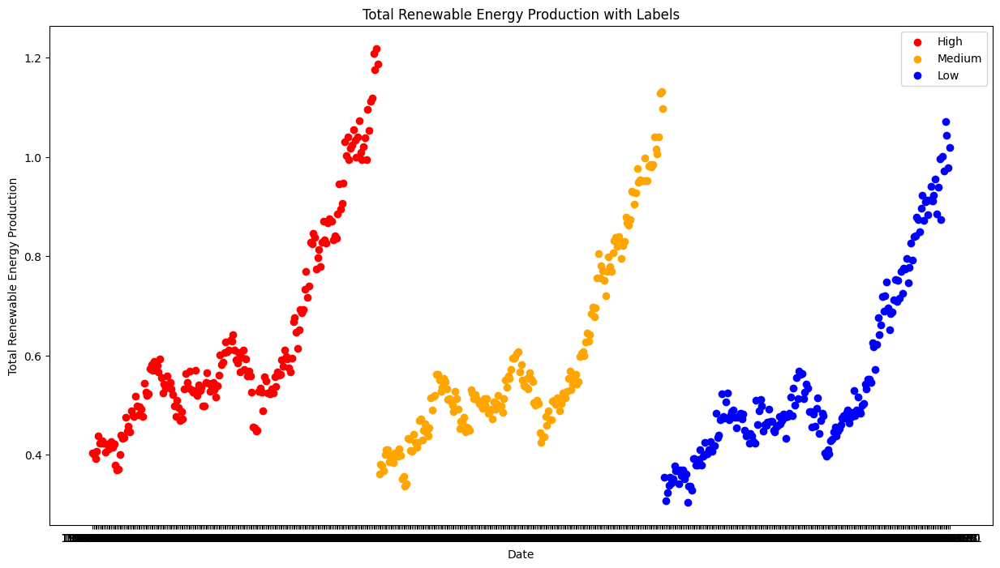

ds               0
y                0
year             0
label            0
month            0
season           0
rolling_mean     0
rolling_std      0
rolling_label    0
dtype: int64
Evaluation for Random Forest:
Classification Report:
               precision    recall  f1-score   support

        High       0.63      0.78      0.70        37
         Low       0.74      0.74      0.74        39
      Medium       0.57      0.45      0.51        44

    accuracy                           0.65       120
   macro avg       0.65      0.66      0.65       120
weighted avg       0.65      0.65      0.64       120

Confusion Matrix:
 [[29  2  6]
 [ 1 29  9]
 [16  8 20]]


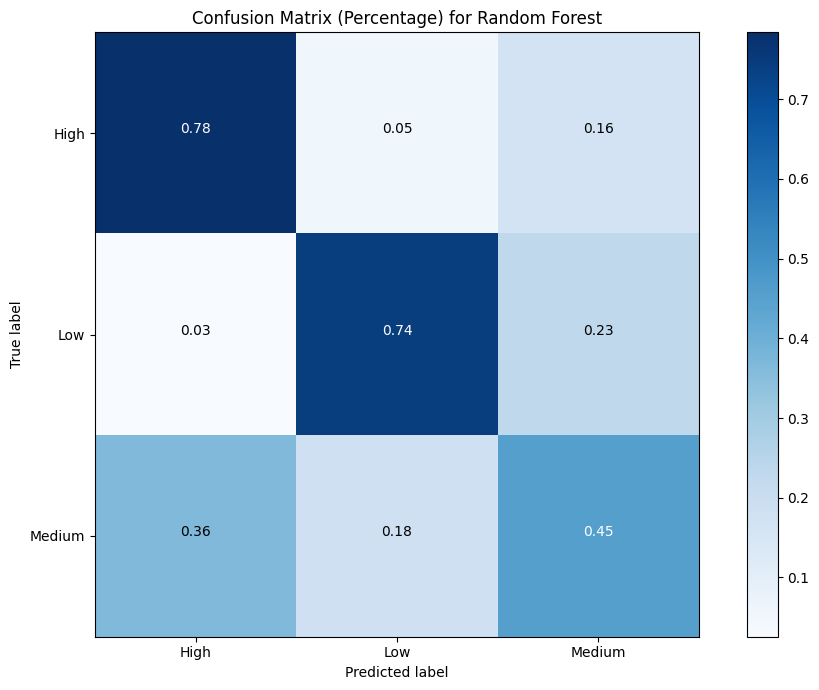

Evaluation for k-Nearest Neighbors:
Classification Report:
               precision    recall  f1-score   support

        High       0.60      0.78      0.68        37
         Low       0.63      0.69      0.66        39
      Medium       0.52      0.34      0.41        44

    accuracy                           0.59       120
   macro avg       0.58      0.61      0.58       120
weighted avg       0.58      0.59      0.58       120

Confusion Matrix:
 [[29  3  5]
 [ 3 27  9]
 [16 13 15]]


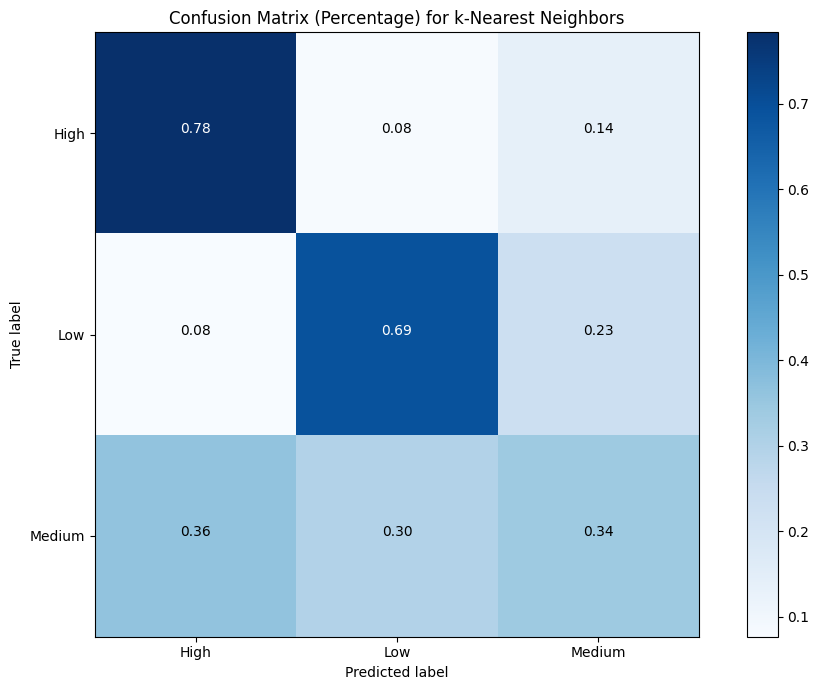

Evaluation for Decision Tree:
Classification Report:
               precision    recall  f1-score   support

        High       0.60      0.73      0.66        37
         Low       0.68      0.67      0.68        39
      Medium       0.51      0.43      0.47        44

    accuracy                           0.60       120
   macro avg       0.60      0.61      0.60       120
weighted avg       0.60      0.60      0.59       120

Confusion Matrix:
 [[27  2  8]
 [ 3 26 10]
 [15 10 19]]


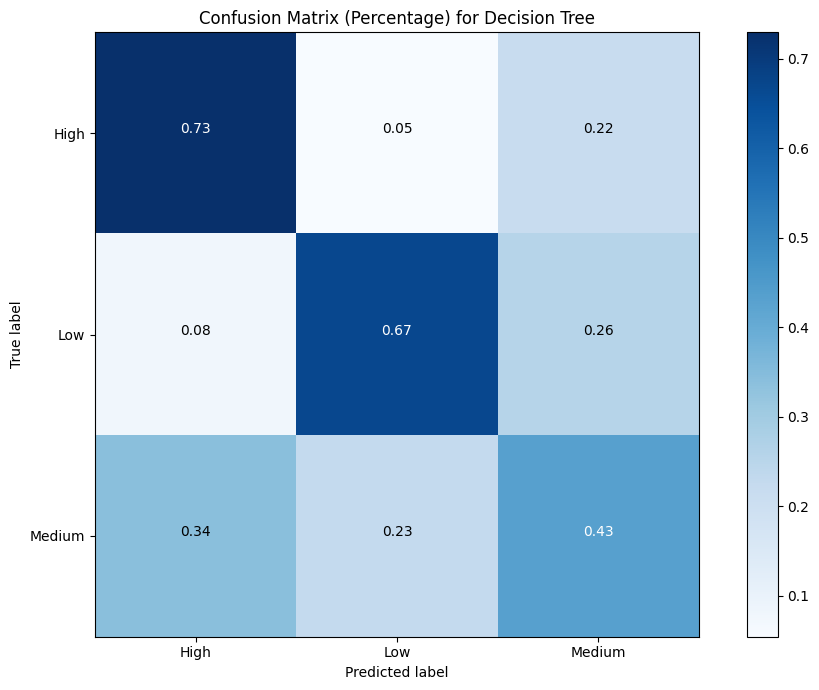

Evaluation for Support Vector Machine:
Classification Report:
               precision    recall  f1-score   support

        High       0.31      1.00      0.47        37
         Low       0.00      0.00      0.00        39
      Medium       0.00      0.00      0.00        44

    accuracy                           0.31       120
   macro avg       0.10      0.33      0.16       120
weighted avg       0.10      0.31      0.15       120

Confusion Matrix:
 [[37  0  0]
 [39  0  0]
 [44  0  0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


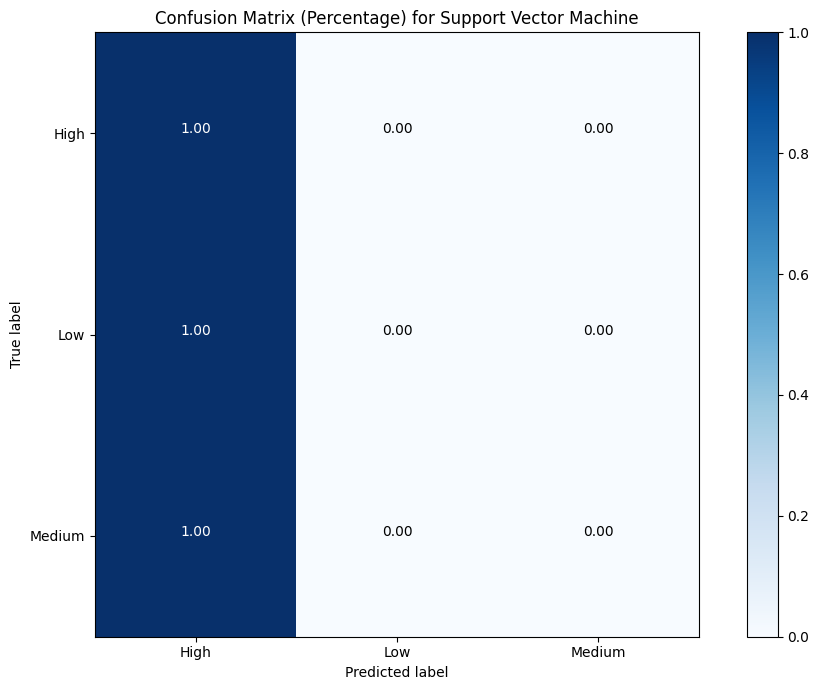

Evaluation for Naive Bayes:
Classification Report:
               precision    recall  f1-score   support

        High       0.57      0.78      0.66        37
         Low       0.63      0.69      0.66        39
      Medium       0.42      0.25      0.31        44

    accuracy                           0.56       120
   macro avg       0.54      0.58      0.54       120
weighted avg       0.53      0.56      0.53       120

Confusion Matrix:
 [[29  4  4]
 [ 1 27 11]
 [21 12 11]]


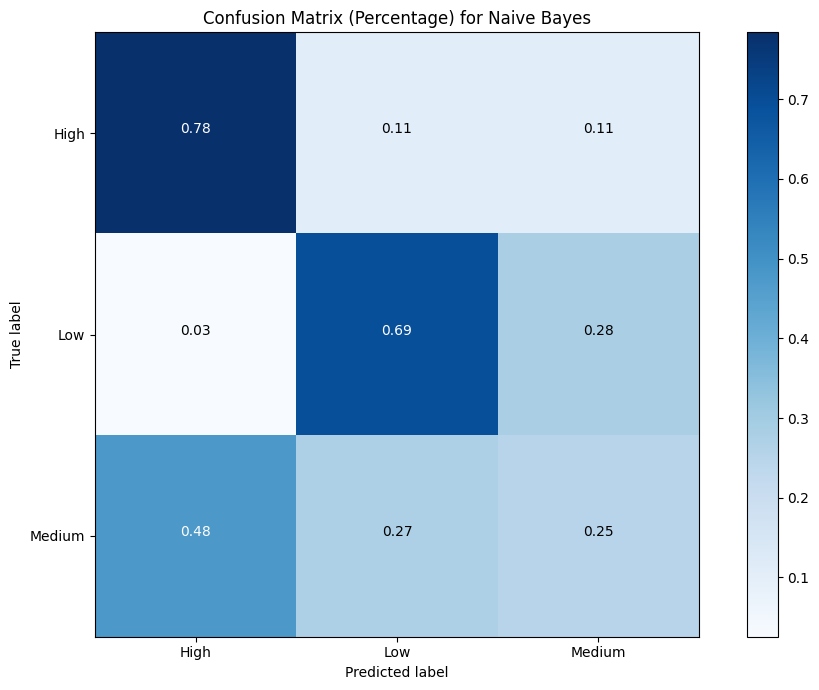

Evaluation for Extra Trees:
Classification Report:
               precision    recall  f1-score   support

        High       0.67      0.78      0.72        37
         Low       0.72      0.67      0.69        39
      Medium       0.54      0.50      0.52        44

    accuracy                           0.64       120
   macro avg       0.64      0.65      0.65       120
weighted avg       0.64      0.64      0.64       120

Confusion Matrix:
 [[29  2  6]
 [ 0 26 13]
 [14  8 22]]


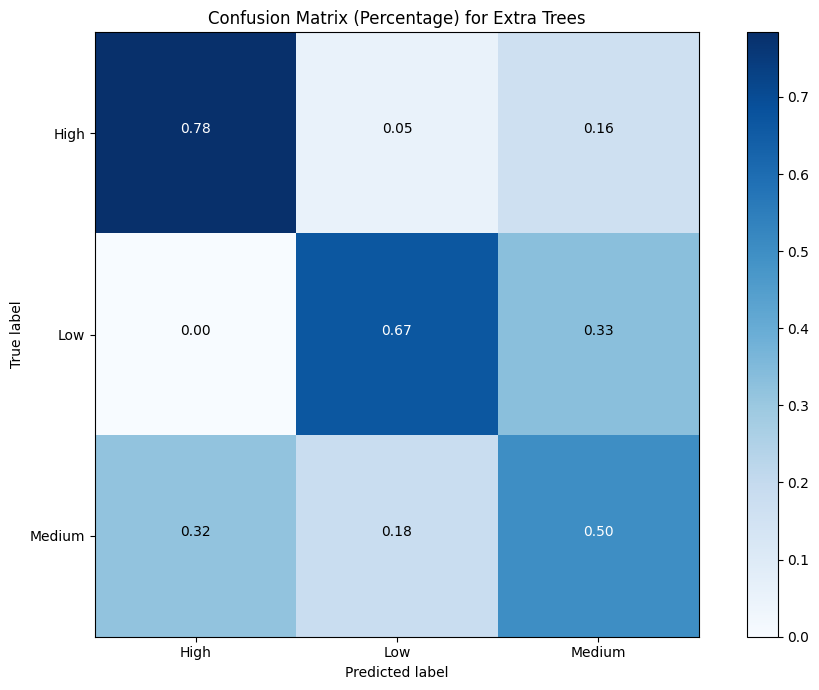

Evaluation for Gradient Boosting:
Classification Report:
               precision    recall  f1-score   support

        High       0.67      0.81      0.73        37
         Low       0.74      0.74      0.74        39
      Medium       0.58      0.48      0.53        44

    accuracy                           0.67       120
   macro avg       0.66      0.68      0.67       120
weighted avg       0.66      0.67      0.66       120

Confusion Matrix:
 [[30  2  5]
 [ 0 29 10]
 [15  8 21]]


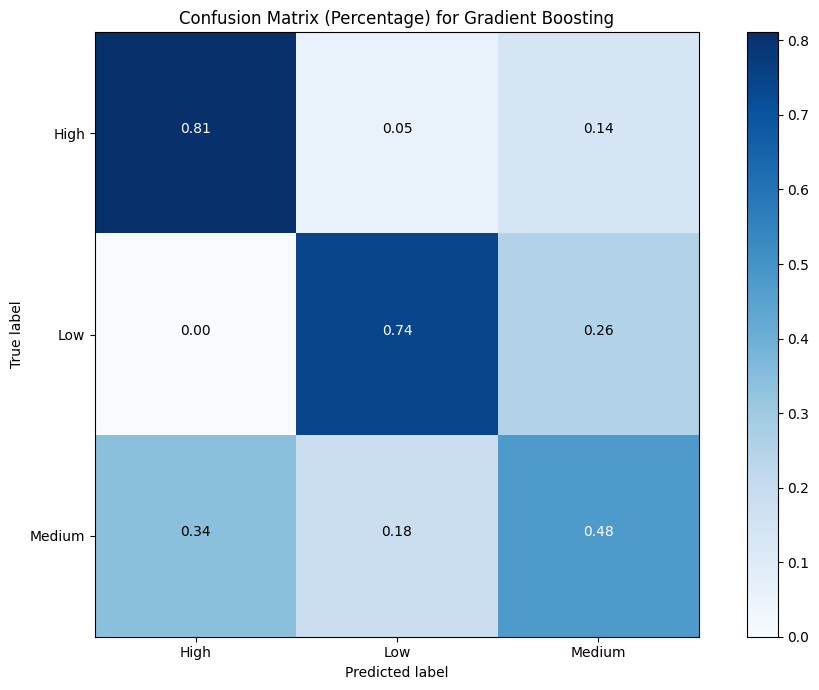

Shape of X_train_seq: (476, 3, 5)
Shape of X_test_seq: (120, 3, 5)
Shape of y_train_seq: (476,)
Shape of y_test_seq: (120,)
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_3 (Conv1D)           (None, 3, 64)             384       
                                                                 
 max_pooling1d_3 (MaxPoolin  (None, 1, 64)             0         
 g1D)                                                            
                                                                 
 lstm_3 (LSTM)               (None, 50)                23000     
                                                                 
 dense_3 (Dense)             (None, 3)                 153       
                                                                 
Total params: 23537 (91.94 KB)
Trainable params: 23537 (91.94 KB)
Non-trainable params: 0 (0.00 Byte)
__________________________

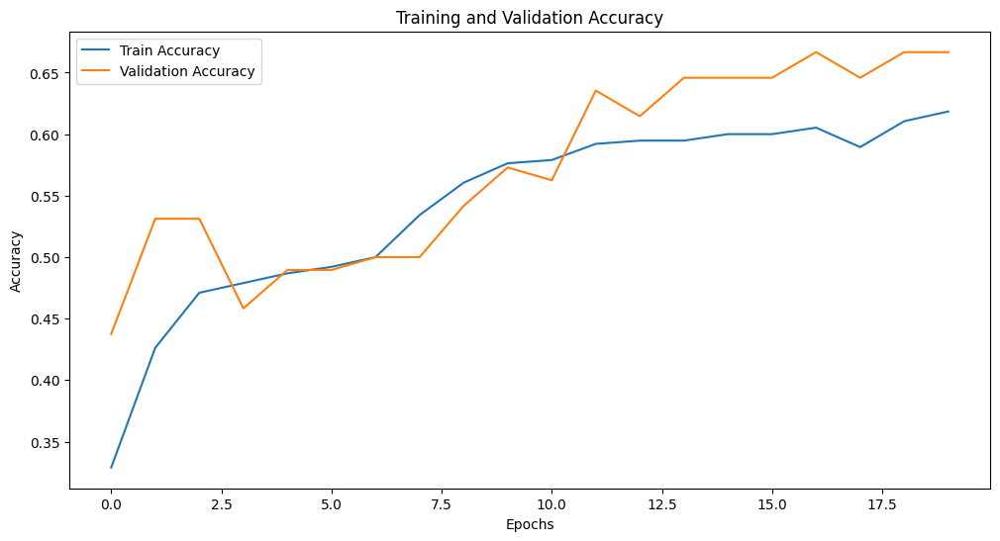

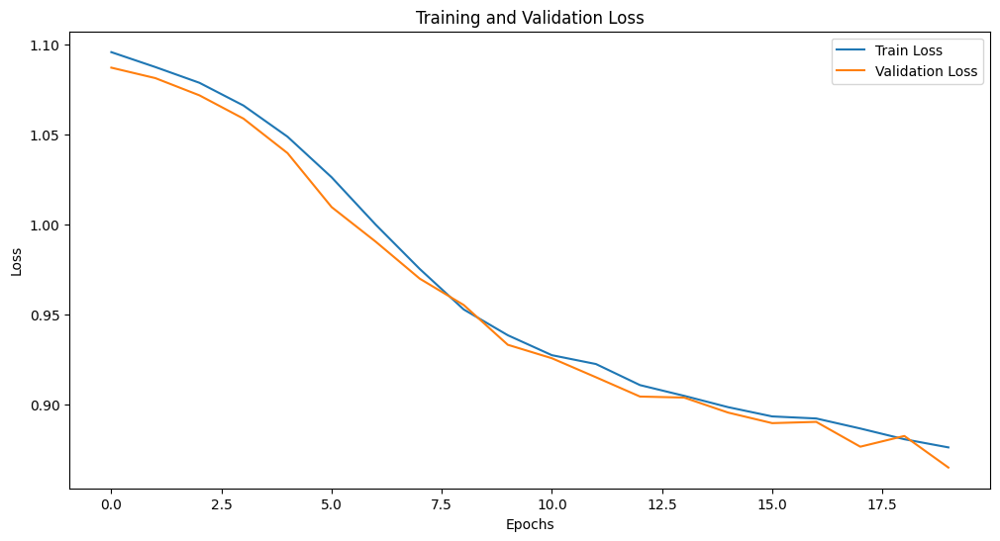

4/4 [==============================] - 1s 14ms/step - loss: 0.9770 - accuracy: 0.5583
Test Accuracy: 0.5583
4/4 [==============================] - 0s 7ms/step
Classification Report for CNN-LSTM:
               precision    recall  f1-score   support

        High       0.57      0.68      0.62        37
         Low       0.57      0.83      0.67        36
      Medium       0.52      0.26      0.34        47

    accuracy                           0.56       120
   macro avg       0.55      0.59      0.54       120
weighted avg       0.55      0.56      0.53       120

Confusion Matrix for CNN-LSTM:
 [[25  5  7]
 [ 2 30  4]
 [17 18 12]]


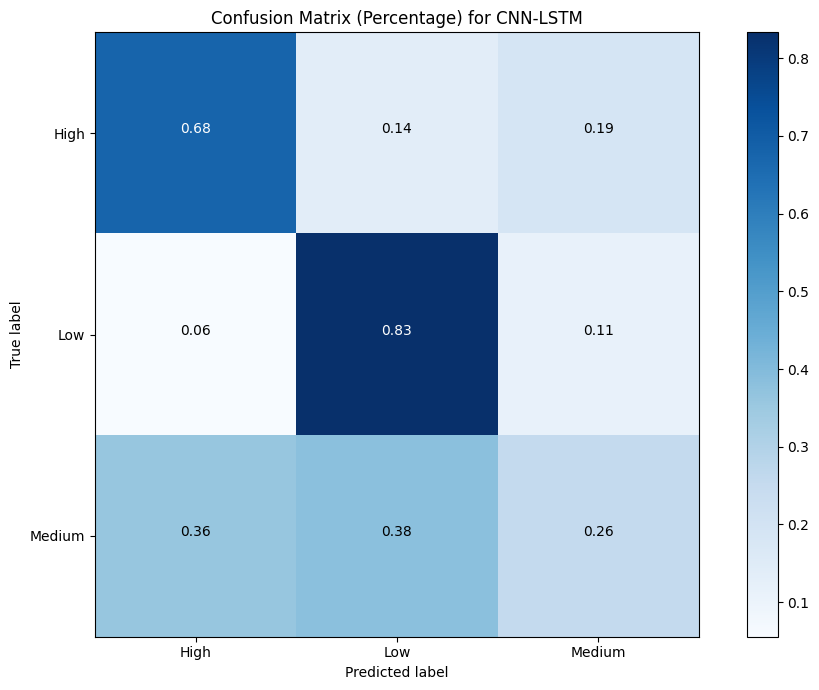

CNN-LSTM RMSE: 1.0206
k-Nearest Neighbors RMSE: 0.9265
k-Nearest Neighbors Accuracy: 0.6417
Classification Report:
               precision    recall  f1-score   support

        High       0.70      0.70      0.70        37
         Low       0.65      0.78      0.71        36
      Medium       0.57      0.49      0.53        47

    accuracy                           0.64       120
   macro avg       0.64      0.66      0.65       120
weighted avg       0.64      0.64      0.64       120

Confusion Matrix:
 [[26  2  9]
 [ 0 28  8]
 [11 13 23]]
Decision Tree RMSE: 0.9487
Decision Tree Accuracy: 0.6250
Classification Report:
               precision    recall  f1-score   support

        High       0.69      0.65      0.67        37
         Low       0.65      0.72      0.68        36
      Medium       0.56      0.53      0.54        47

    accuracy                           0.62       120
   macro avg       0.63      0.63      0.63       120
weighted avg       0.62      0.62      

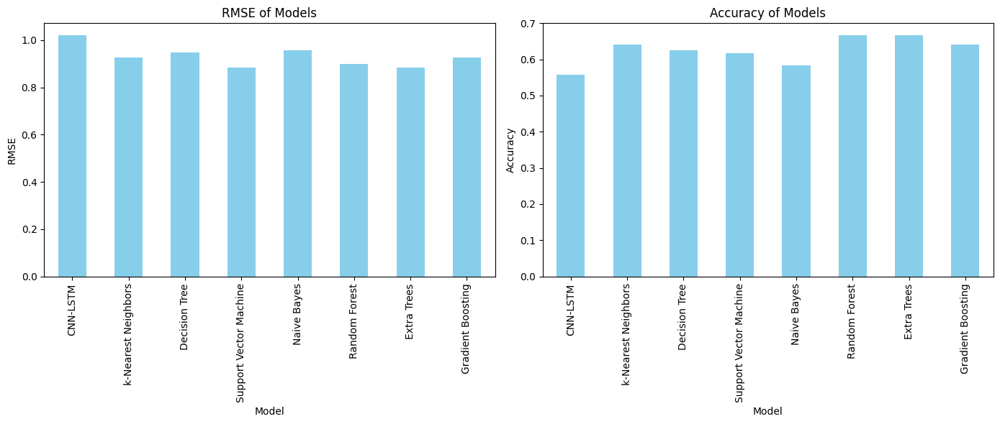

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, mean_squared_error, accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
import itertools
from keras.models import Sequential
from keras.layers import Dense, Conv1D, MaxPooling1D, Flatten, LSTM

# Load the dataset
file_path = 'World-Energy-Overview.csv'
df = pd.read_csv(file_path, parse_dates=['Date'], index_col='Date')

# Keep only the required columns
df = df[['Total Renewable Energy Production']]

# Rename the column
df.rename(columns={'Total Renewable Energy Production': 'y'}, inplace=True)

# Reset the index to make 'Date' a column
df.reset_index(inplace=True)

# Rename the 'Date' column to 'ds'
df.rename(columns={'Date': 'ds'}, inplace=True)

# Convert the date format to YYYY-MM-DD
df['ds'] = pd.to_datetime(df['ds']).dt.strftime('%Y-%m-%d')

# Define thresholds for each year to categorize into Low, Medium, and High
def classify_yearly(row, low_threshold, high_threshold):
    if row['y'] <= low_threshold:
        return 'Low'
    elif row['y'] <= high_threshold:
        return 'Medium'
    else:
        return 'High'

# Create labels for each year
df['year'] = pd.to_datetime(df['ds']).dt.year
df['label'] = None

# Calculate thresholds and classify for each year
for year in df['year'].unique():
    yearly_data = df[df['year'] == year]
    low_threshold = yearly_data['y'].quantile(0.33)
    high_threshold = yearly_data['y'].quantile(0.67)
    df.loc[df['year'] == year, 'label'] = yearly_data.apply(classify_yearly, axis=1, args=(low_threshold, high_threshold))

# Print the first few rows of the dataset with labels
print(df.head())

# Plot the data points and labels
plt.figure(figsize=(15, 8))
colors = {'Low': 'blue', 'Medium': 'orange', 'High': 'red'}
for label in df['label'].unique():
    subset = df[df['label'] == label]
    plt.scatter(subset['ds'], subset['y'], label=label, color=colors[label])
plt.xlabel('Date')
plt.ylabel('Total Renewable Energy Production')
plt.title('Total Renewable Energy Production with Labels')
plt.legend()
plt.show()

# Create time-based features
df['month'] = pd.to_datetime(df['ds']).dt.month
df['season'] = pd.to_datetime(df['ds']).dt.month % 12 // 3 + 1  # Create a season feature (1: Winter, 2: Spring, 3: Summer, 4: Fall)

# Example of rolling statistics
df['rolling_mean'] = df['y'].rolling(window=3, min_periods=1).mean()
df['rolling_std'] = df['y'].rolling(window=3, min_periods=1).std()

# Fill NaNs in rolling statistics with column mean
df['rolling_mean'].fillna(df['rolling_mean'].mean(), inplace=True)
df['rolling_std'].fillna(df['rolling_std'].mean(), inplace=True)

# Define function to classify based on rolling mean
def classify_rolling_mean(row, low_threshold, high_threshold):
    if row['rolling_mean'] <= low_threshold:
        return 'Low'
    elif row['rolling_mean'] <= high_threshold:
        return 'Medium'
    else:
        return 'High'

# Add a rolling category feature
df['rolling_label'] = None
for year in df['year'].unique():
    yearly_data = df[df['year'] == year]
    low_threshold = yearly_data['rolling_mean'].quantile(0.33)
    high_threshold = yearly_data['rolling_mean'].quantile(0.67)
    df.loc[df['year'] == year, 'rolling_label'] = yearly_data.apply(classify_rolling_mean, axis=1, args=(low_threshold, high_threshold))

# Ensure no NaNs remain
print(df.isna().sum())

# Select features and target
X = df[['year', 'month', 'season', 'rolling_mean', 'rolling_std']]
y = df['rolling_label']

# Encode the target labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Function to evaluate models
def evaluate_model(model, X_train, y_train, X_test, y_test, model_name):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"Evaluation for {model_name}:")
    print("Classification Report:\n", classification_report(y_test, y_pred, target_names=label_encoder.classes_))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

    # Plot confusion matrix with proper formatting
    cm = confusion_matrix(y_test, y_pred)
    cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    plt.figure(figsize=(10, 7))
    plt.imshow(cm_percentage, interpolation='nearest', cmap='Blues')
    plt.title(f'Confusion Matrix (Percentage) for {model_name}')
    plt.colorbar()
    tick_marks = np.arange(len(label_encoder.classes_))
    plt.xticks(tick_marks, label_encoder.classes_)
    plt.yticks(tick_marks, label_encoder.classes_)

    fmt = '.2f'
    thresh = cm_percentage.max() / 2.
    for i, j in itertools.product(range(cm_percentage.shape[0]), range(cm_percentage.shape[1])):
        plt.text(j, i, format(cm_percentage[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm_percentage[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    plt.show()

# Initialize models
models = {
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'k-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Support Vector Machine': SVC(random_state=42),
    'Naive Bayes': GaussianNB(),
    'Extra Trees': ExtraTreesClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, random_state=42)
}

# Evaluate each model
for model_name, model in models.items():
    evaluate_model(model, X_train, y_train, X_test, y_test, model_name)

# Reshape data into sequences for CNN-LSTM
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)

def create_sequences(X, y, time_steps=3):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        Xs.append(X[i:i+time_steps])
        ys.append(y[i+time_steps])
    return np.array(Xs), np.array(ys)

time_steps = 3
X_seq, y_seq = create_sequences(X_scaled, y_encoded, time_steps)

# Split the data into training and testing sets
X_train_seq, X_test_seq, y_train_seq, y_test_seq = train_test_split(X_seq, y_seq, test_size=0.2, random_state=42)

print(f"Shape of X_train_seq: {X_train_seq.shape}")
print(f"Shape of X_test_seq: {X_test_seq.shape}")
print(f"Shape of y_train_seq: {y_train_seq.shape}")
print(f"Shape of y_test_seq: {y_test_seq.shape}")

# Define the CNN-LSTM model
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=1, activation='relu', input_shape=(X_train_seq.shape[1], X_train_seq.shape[2])))
model.add(MaxPooling1D(pool_size=2))
model.add(LSTM(50, activation='relu'))
model.add(Dense(3, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

print(model.summary())

# Train the model
history = model.fit(X_train_seq, y_train_seq, epochs=20, batch_size=32, validation_split=0.2, verbose=1)

# Plot training and validation accuracy
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot training and validation loss
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Evaluate the CNN-LSTM model on the test set
test_loss, test_accuracy = model.evaluate(X_test_seq, y_test_seq, verbose=1)
print(f"Test Accuracy: {test_accuracy:.4f}")

# Make predictions with the CNN-LSTM model
y_pred_seq = model.predict(X_test_seq)
y_pred_seq_classes = np.argmax(y_pred_seq, axis=1)

# Classification report and confusion matrix for CNN-LSTM
print("Classification Report for CNN-LSTM:\n", classification_report(y_test_seq, y_pred_seq_classes, target_names=label_encoder.classes_))
print("Confusion Matrix for CNN-LSTM:\n", confusion_matrix(y_test_seq, y_pred_seq_classes))

# Plot confusion matrix for CNN-LSTM
cm = confusion_matrix(y_test_seq, y_pred_seq_classes)
cm_percentage = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(10, 7))
plt.imshow(cm_percentage, interpolation='nearest', cmap='Blues')
plt.title('Confusion Matrix (Percentage) for CNN-LSTM')
plt.colorbar()
tick_marks = np.arange(len(label_encoder.classes_))
plt.xticks(tick_marks, label_encoder.classes_)
plt.yticks(tick_marks, label_encoder.classes_)

fmt = '.2f'
thresh = cm_percentage.max() / 2.
for i, j in itertools.product(range(cm_percentage.shape[0]), range(cm_percentage.shape[1])):
    plt.text(j, i, format(cm_percentage[i, j], fmt),
             horizontalalignment="center",
             color="white" if cm_percentage[i, j] > thresh else "black")

plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.tight_layout()
plt.show()

# Calculate RMSE for CNN-LSTM
rmse = np.sqrt(mean_squared_error(y_test_seq, y_pred_seq_classes))
print(f'CNN-LSTM RMSE: {rmse:.4f}')

# Store results in a DataFrame
results = {
    'Model': ['CNN-LSTM'],
    'RMSE': [rmse],
    'Accuracy': [test_accuracy]
}

# Define function to calculate metrics for other models
def calculate_metrics(y_true, y_pred, model_name):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    accuracy = accuracy_score(y_true, y_pred)

    print(f'{model_name} RMSE: {rmse:.4f}')
    print(f'{model_name} Accuracy: {accuracy:.4f}')
    print("Classification Report:\n", classification_report(y_true, y_pred, target_names=label_encoder.classes_))
    print("Confusion Matrix:\n", confusion_matrix(y_true, y_pred))

    # Append results
    results['Model'].append(model_name)
    results['RMSE'].append(rmse)
    results['Accuracy'].append(accuracy)

# Reshape data for sklearn models
X_train_2d = X_train_seq.reshape(X_train_seq.shape[0], -1)
X_test_2d = X_test_seq.reshape(X_test_seq.shape[0], -1)

# Evaluate and store metrics for sklearn models
models_to_evaluate = {
    'k-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Support Vector Machine': SVC(random_state=42),
    'Naive Bayes': GaussianNB(),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Extra Trees': ExtraTreesClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, random_state=42)
}

for model_name, model in models_to_evaluate.items():
    model.fit(X_train_2d, y_train_seq)
    y_pred = model.predict(X_test_2d)
    calculate_metrics(y_test_seq, y_pred, model_name)

# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Display the results
print(results_df)

# Plot the results
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

results_df.plot(kind='bar', x='Model', y='RMSE', ax=axes[0], legend=False, color='skyblue')
axes[0].set_title('RMSE of Models')
axes[0].set_ylabel('RMSE')

results_df.plot(kind='bar', x='Model', y='Accuracy', ax=axes[1], legend=False, color='skyblue')
axes[1].set_title('Accuracy of Models')
axes[1].set_ylabel('Accuracy')

plt.tight_layout()
plt.show()



**Results**

1. The **Random Forest and Extra Trees classifiers achieved the highest accuracy (66.67%)** among the machine learning models.

2. Random Forest and Extra Trees also showed the lowest RMSE values, indicating they made fewer errors in classifying the energy production levels.

3. Random Forest produced an RMSE of 0.899 while Extra Trees are 0.885, putting Extra Trees a slightly higher advantage.

4. The **CNN-LSTM model achieved a least accuracy (58.33%)** compared to some of the traditional machine learning models with the RMSE at 1.02.

5. The training and validation accuracy improves with wavering graph and not smooth, where validation accuracy exceeds train accuracy after 17 epochs.

6. The loss-epoch curves down from 1.1 to 0.9 which still leaves a high lossm indicating poor performance of the model.

7. In the **confusion matrices of the high performing models, Random Forest and Extra Trees, the label with that has least been corrected predicted is 'Medium'**. This is because of the window between 'Low', 'Medium' and 'Medium', 'High', which leads to the model processing more to judge whether the value should belong to 'Low' or 'Medium', or, 'Medium' or 'High'.

   For example, in Random Forest, 78% of 'High' labels have been correctly predicted, 74% for 'Low', however, 'Medium' is at 45%, which is below half, and 36% of 'Medium' labels have been predicted as 'High' while 18% of the 'Low' labels have been predicted as 'Low.

### 7.2.Bar, Polar, Box Plots


**Purpose**

1. The following code makes **bar plots that represents the count of renewable energy production levels (Low, Medium, High) for each month for a given time period t**. The total time period is T. The x-axis represents the months of an year against the y-axis that shows the count of each of the three label together.

  The labels are represented by colors. 'Low' is blue, 'Medium' is orange, 'High' is red.

  For example, one bar of May shows three colors or labels with varying lengths based on the respective counts from the time period.

2. This **polar plot shows the distribution of renewable energy production levels (Low, Medium, High) for each month from a given time period**. Each spoke is label with months from January to December. The distance from the center indicates number of count of each category for that month.

  The labels are represented by colors. 'Low' is blue, 'Medium' is orange, 'High' is red.

  For example, October has the highest count of Low values, indicated by the large blue area.


Similarly,

There are four time periods:
1. 1975 - 1990 (1st one-third of T) t1
2. 1990 - 2005 (2nd one-third of T) t2
3. 2005 - 2020 (3rd one-third of T) t3
4. 1975 - 2020 (from beginning to end) T

So, t1 + t2 + t3 = T

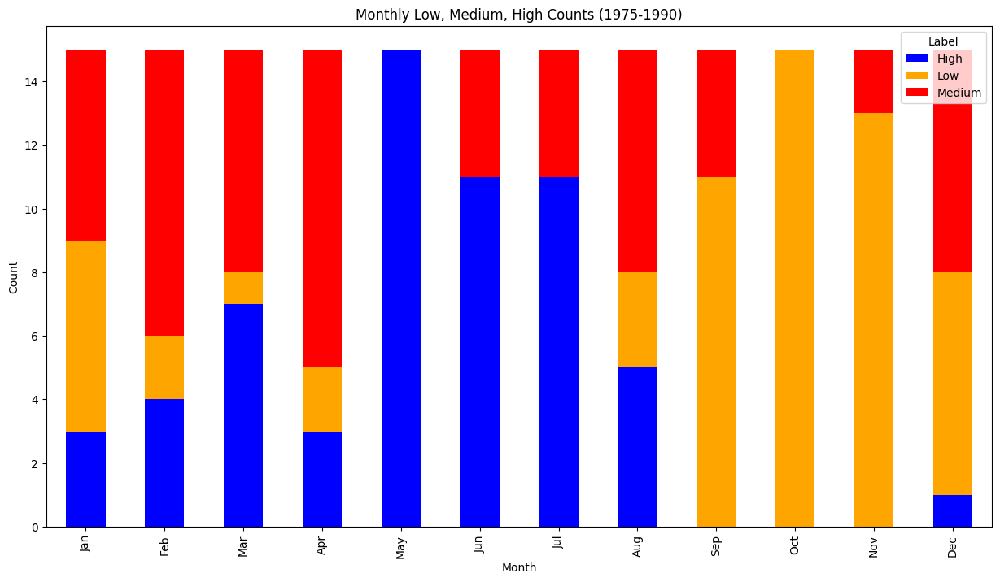

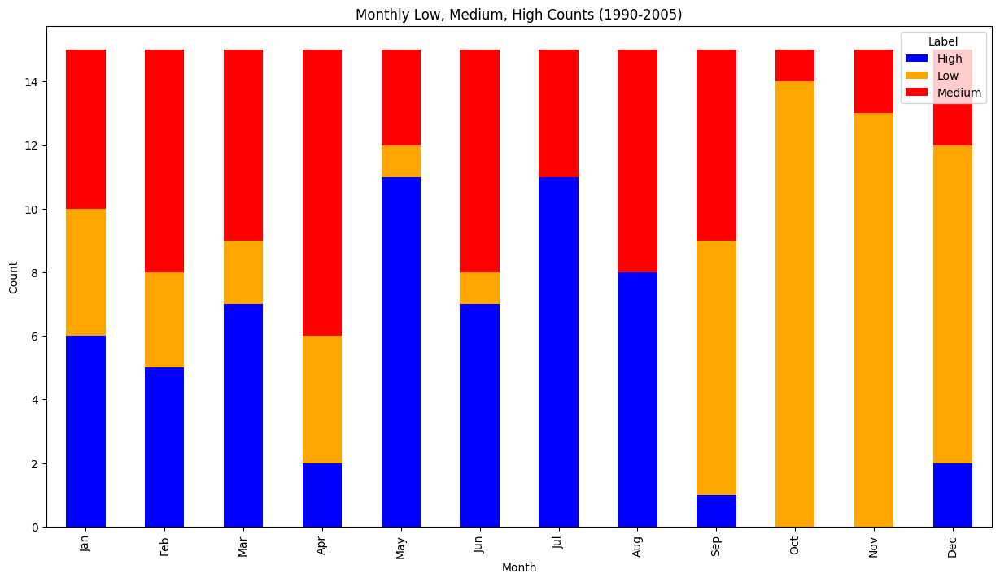

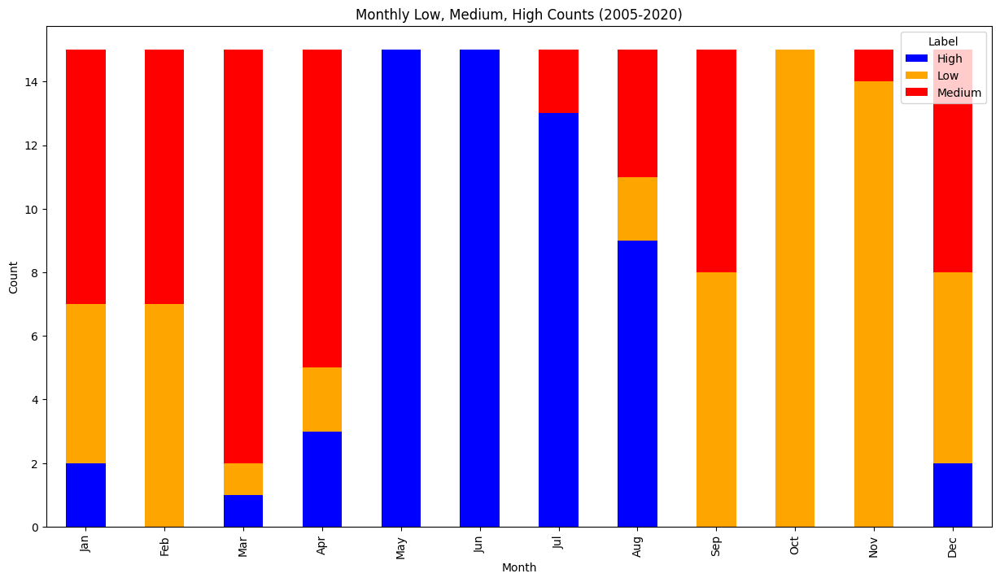

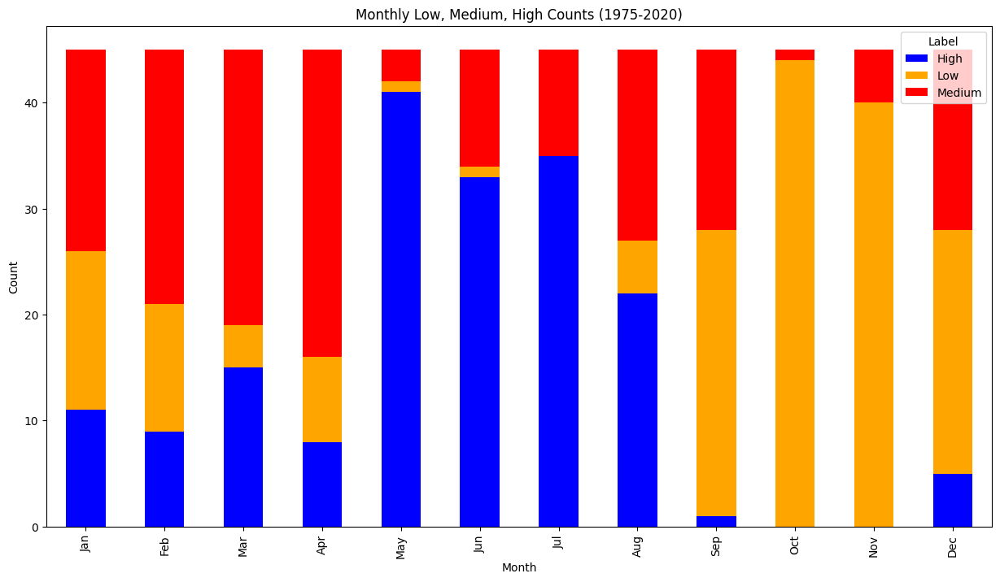

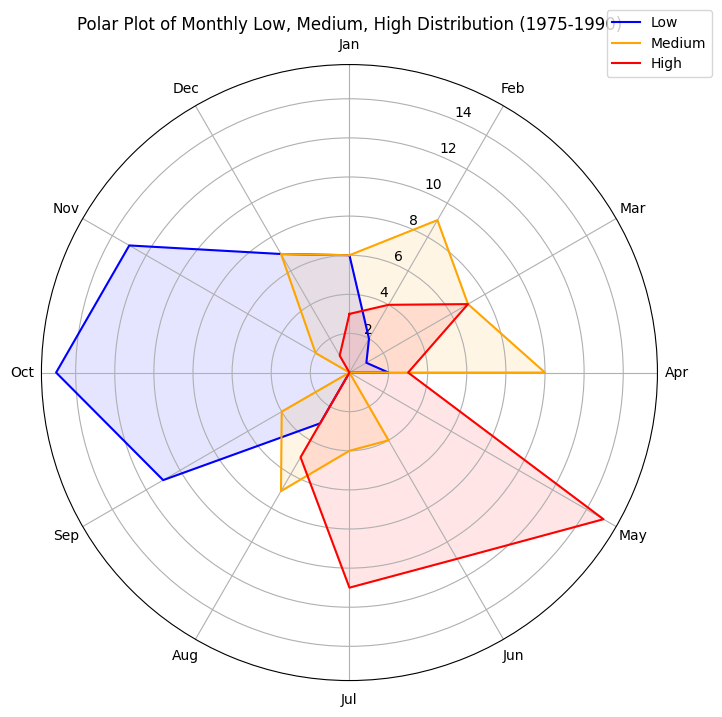

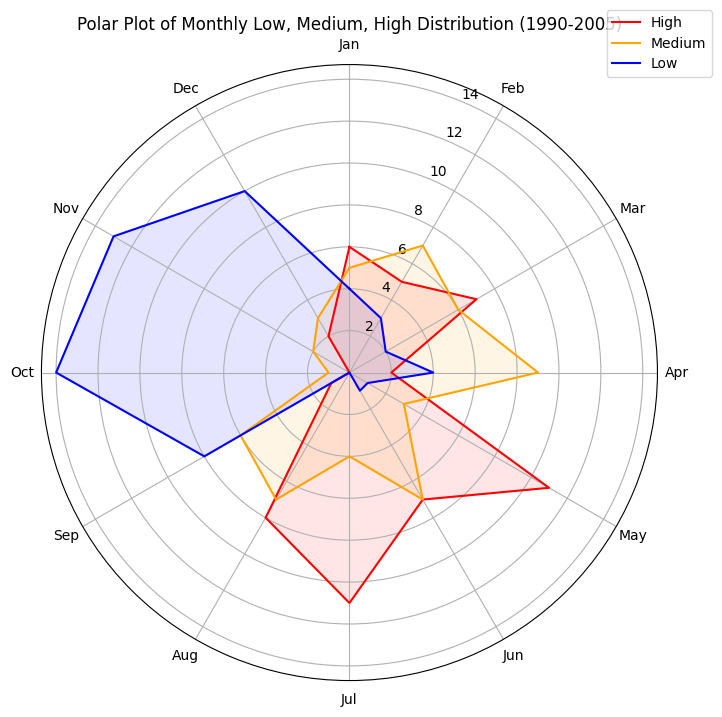

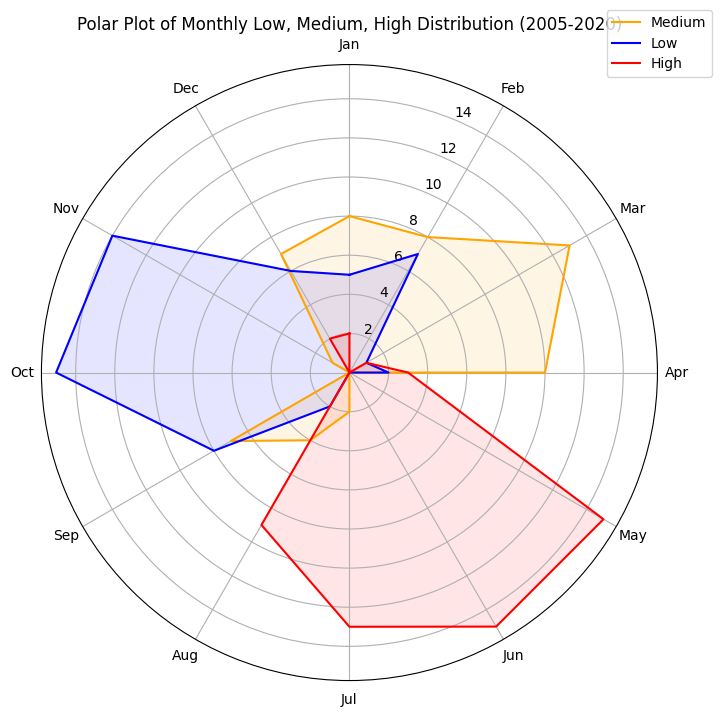

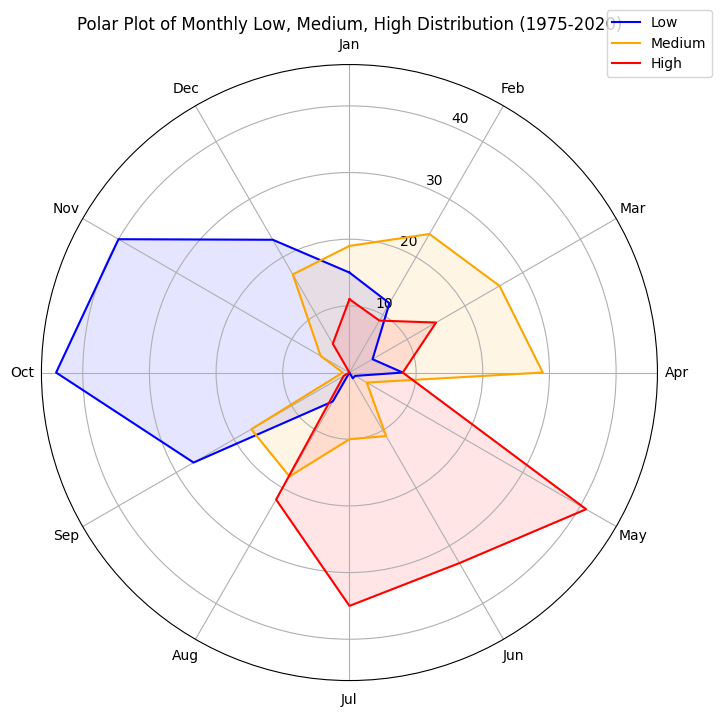

<Figure size 1200x800 with 0 Axes>

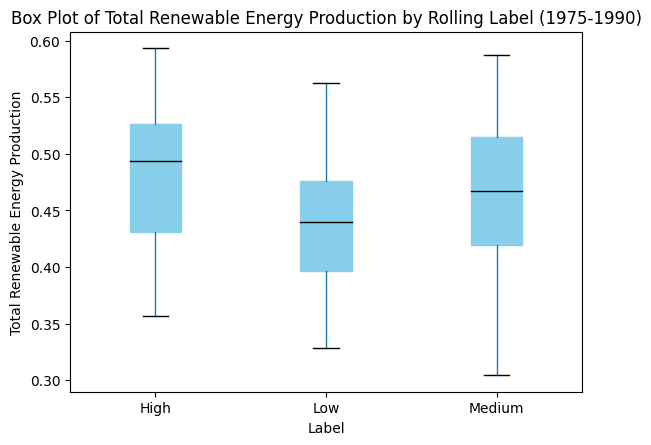

<Figure size 1200x800 with 0 Axes>

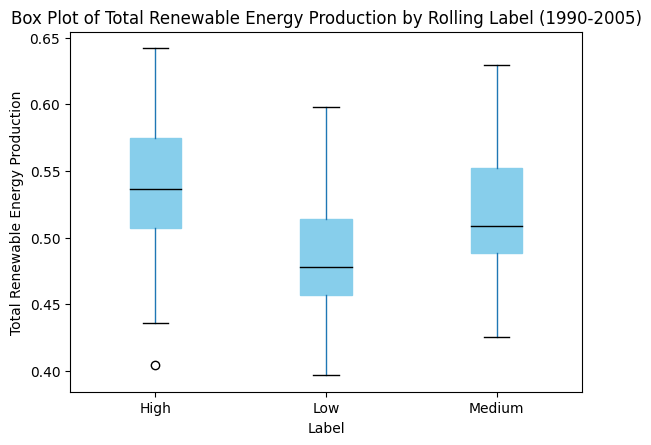

<Figure size 1200x800 with 0 Axes>

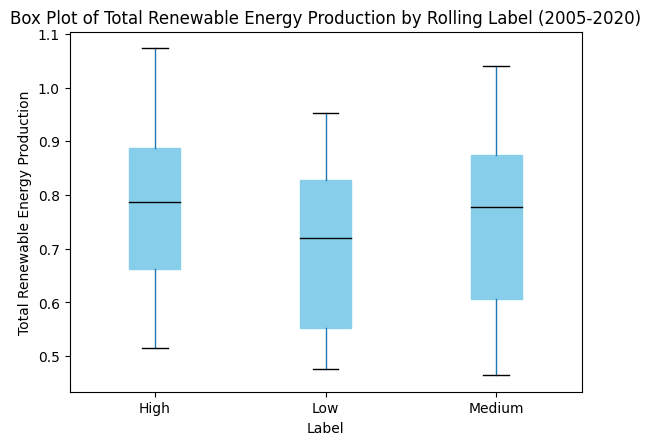

<Figure size 1200x800 with 0 Axes>

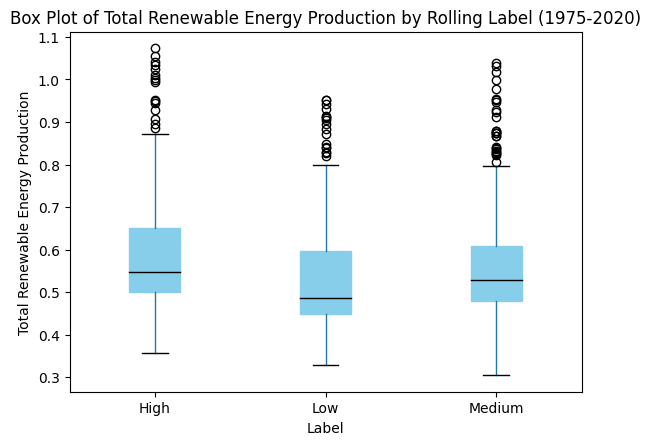

In [ ]:
# Define periods
periods = [(1975, 1990), (1990, 2005), (2005, 2020), (1975, 2020)]

# Function to plot monthly low, medium, high counts
def plot_monthly_label_counts(df, start_year, end_year):
    period_df = df[(df['year'] >= start_year) & (df['year'] < end_year)]
    label_counts = period_df.groupby(['month', 'rolling_label']).size().unstack(fill_value=0)
    label_counts.plot(kind='bar', stacked=True, figsize=(15, 8), color=['blue', 'orange', 'red'])
    plt.xlabel('Month')
    plt.ylabel('Count')
    plt.title(f'Monthly Low, Medium, High Counts ({start_year}-{end_year})')
    plt.legend(title='Label')
    plt.xticks(ticks=np.arange(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.show()

# Function to plot polar plot for monthly distribution of labels
# Function to plot polar plot for monthly distribution of labels
def plot_polar_label_distribution(df, start_year, end_year):
    period_df = df[(df['year'] >= start_year) & (df['year'] < end_year)]
    plt.figure(figsize=(10, 8))
    ax = plt.subplot(111, polar=True)
    months = np.arange(1, 13)
    angles = np.linspace(0, 2 * np.pi, 12, endpoint=False).tolist()
    angles += angles[:1]
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    for label in period_df['rolling_label'].unique():
        values = period_df[period_df['rolling_label'] == label].groupby('month').size().reindex(months, fill_value=0).tolist()
        values += values[:1]
        # Directly use the string label for plotting, no need for inverse_transform
        ax.plot(angles, values, label=label, color=colors[label])
        ax.fill(angles, values, color=colors[label], alpha=0.1)
    plt.title(f'Polar Plot of Monthly Low, Medium, High Distribution ({start_year}-{end_year})')
    plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
    plt.show()

# # Function to plot box plot for production values by rolling label
# def plot_box_plot_by_label(df, start_year, end_year):
#     period_df = df[(df['year'] >= start_year) & (df['year'] < end_year)]
#     plt.figure(figsize=(12, 8))
#     period_df.boxplot(column='y', by='rolling_label', grid=False, patch_artist=True,
#                       boxprops=dict(facecolor='skyblue', color='skyblue'),
#                       medianprops=dict(color='black'))
#     plt.title(f'Box Plot of Total Renewable Energy Production by Rolling Label ({start_year}-{end_year})')
#     plt.suptitle('')
#     plt.xlabel('Label')
#     plt.ylabel('Total Renewable Energy Production')
#     plt.xticks(ticks=np.arange(1, 4), labels=label_encoder.inverse_transform(np.arange(3)))
#     plt.show()

# Plot for each period in sequence
for start_year, end_year in periods:
    plot_monthly_label_counts(df, start_year, end_year)

for start_year, end_year in periods:
    plot_polar_label_distribution(df, start_year, end_year)

# for start_year, end_year in periods:
#     plot_box_plot_by_label(df, start_year, end_year)

**Results**


  **1975 - 1990**

1. In the bar plot, May received only 'High' labels, indicating that May had highest renewable energy production relative to a given year for every year within the period. The count max is 15, since 15 years and all 15 years were 'High' for May.

2. June and July received the second highest counts of 'High' at 11 and remaining 4 of 'Medium'.

3. 'Low' label enters slightly in August. September transitions into 'Low' and 'Medium'.

4. October received only 'Low' labels, indicating that October had the lowest renewable energy production realtive to a given year for every year within the period.

5. May to July are dominated by 'High' label, September to December are dominated by 'Low' label and January to April as well as August are dominated by 'Medium' label.

This has not only been depicted in the bar plots but the polar chart as well where May to July received high count of shade of 'High', high count of shade between September to November for 'Low', and moderating recordings of 'Medium' from January to April.

6. Interestingly, this closely associates for the seasons in a year. Although seasons vary globally especially across northern and southern hemisphere, this dataset is for total renewable energy production from world. Largely, most of the land, countries belongs to the northern hemisphere. And in these regions, May to August period is generally summer seasons, September to December is fall/winter season, and January to April is spring/moderate season.



How can renewable energy production be associated with seasons of an year?

Here are some possible reasons:

Renewable energy production is composed of several contributors, majorly solar energy powered by the sun for instance. The exposure and the intensity of the sun varies across seasons. So, it can be deduced that summer months receive high solar exposure generate high renewable energy, unlike winter where there is minimal exposure hence least production. Spring season or even the duration from change between seasons, the energy production has been moderate as winds change and the sun exposure is neither too low or high. Wind energy and tidal energy, smaller contributors comapred to solar energy,  record medium levels of renewable energy geenration.

 **1990 - 2005**

1. There is a reduced in count of 'High' label from May to August with equal distribution of around 10 with the rest compensated by 'Medium'.

2. However, in the Janaury to April months there is a rise in the 'High' labels indicated a shift in the production levels.

3. September to December remain dominantly with 'Low' label as predicted.

4. Every month of the year has 'Medium' label which had not been previously observed.

5. In the polar plot, the labels overlap the most between January and March, psossibly indicating varying production levels across the time period due to policy changes.

Why is there an increase in renewable energy production in January to April as well?

Here are some possible reasons:

Changes in climate, due to global warming might have made the spring months warmer having more sun exposure, in turn raise in solar energy which increases renewable energy production.

 **2005 - 2020**

 1. Both the bar plot and polar plot show that January to April are dominantly 'Moderate', May to August are 'High' and September to December is 'Low'.

2. The polar plot has least and little to low overlap between the labels and visually equal shaded regions indicated normal equal distribution between the labels.

**Please ignore box plots**

**Purpose**

The label categorization was initially designed for classfying the y-axis (total renewable energy production) into three parts into 0-0.4, 0.4-0.6, 0.6-over, visually.

**Result**

However, this had not been modelled. This is because the general trend of renewable energy production seems to rise always(despite the possibilty of a carrying capacity) meaning that the prediction label will also be 'High'. This knowledge might not be useful or help describe the trend or changes within an year clearly. Therefore, the previous method of classification had been adopted.

          ds         y label  year  month  season
0 1973-01-31  0.403981   Low  1973      1       1
1 1973-02-28  0.360900   Low  1973      2       1
2 1973-03-31  0.400161   Low  1973      3       2
3 1973-04-30  0.380470   Low  1973      4       2
4 1973-05-31  0.392141   Low  1973      5       2


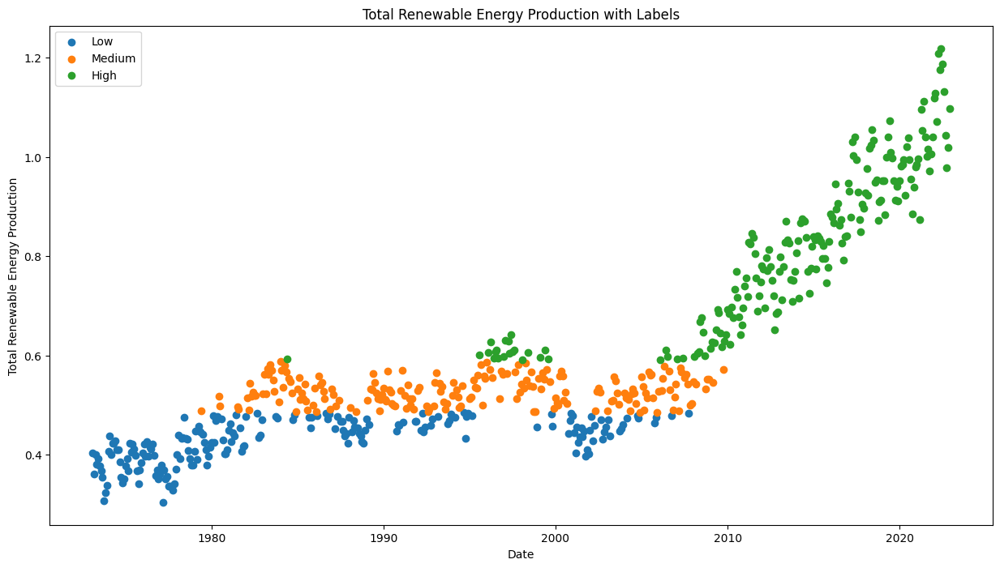

Classification Report:
               precision    recall  f1-score   support

        High       0.98      0.91      0.94        44
         Low       0.92      0.85      0.89        41
      Medium       0.76      0.89      0.82        35

    accuracy                           0.88       120
   macro avg       0.88      0.88      0.88       120
weighted avg       0.89      0.88      0.89       120

Confusion Matrix:
 [[40  0  4]
 [ 0 35  6]
 [ 1  3 31]]


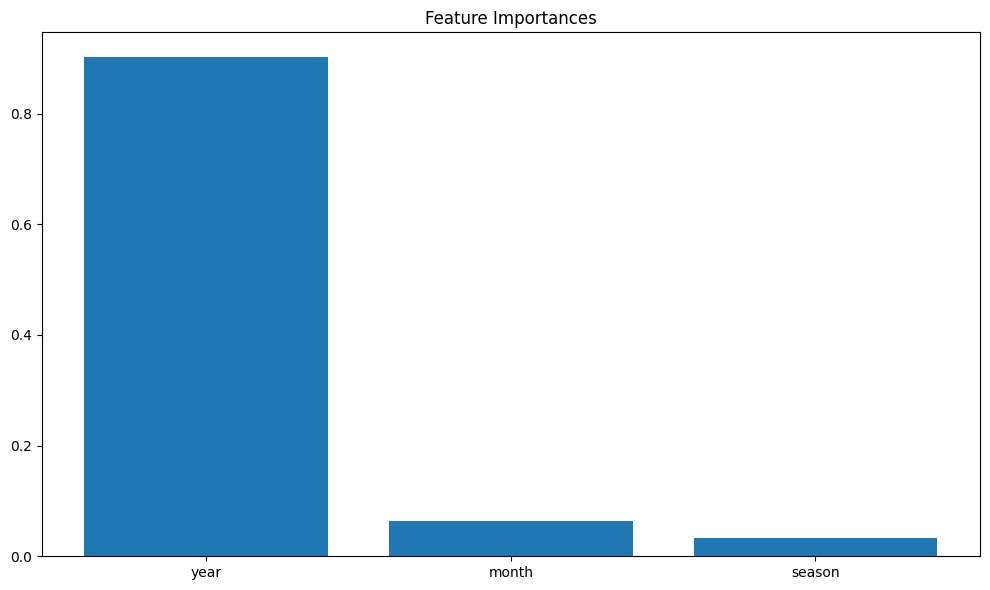

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Load the dataset
file_path = 'World-Energy-Overview.csv'
df = pd.read_csv(file_path, parse_dates=['Date'], index_col='Date')

# Keep only the required columns
df = df[['Total Renewable Energy Production']]

# Rename the column
df.rename(columns={'Total Renewable Energy Production': 'y'}, inplace=True)

# Reset the index to make 'Date' a column
df.reset_index(inplace=True)

# Rename the 'Date' column to 'ds'
df.rename(columns={'Date': 'ds'}, inplace=True)

# Define thresholds for classification
low_threshold = df['y'].quantile(0.33)
high_threshold = df['y'].quantile(0.67)

# Create labels based on the thresholds
def classify(value):
    if value <= low_threshold:
        return 'Low'
    elif value <= high_threshold:
        return 'Medium'
    else:
        return 'High'

df['label'] = df['y'].apply(classify)

# Create seasonal features
df['year'] = df['ds'].dt.year
df['month'] = df['ds'].dt.month
df['season'] = df['ds'].dt.month % 12 // 3 + 1  # Create a season feature (1: Winter, 2: Spring, 3: Summer, 4: Fall)

# Select features and target
X = df[['year', 'month', 'season']]
y = df['label']

# Print the first few rows of the dataset with labels
print(df.head())

# Plot the data points and labels
plt.figure(figsize=(15, 8))
for label in df['label'].unique():
    subset = df[df['label'] == label]
    plt.scatter(subset['ds'], subset['y'], label=label)
plt.xlabel('Date')
plt.ylabel('Total Renewable Energy Production')
plt.title('Total Renewable Energy Production with Labels')
plt.legend()
plt.show()

# Encode the target labels
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Train a classification model
classifier = RandomForestClassifier(n_estimators=100, random_state=42)
classifier.fit(X_train, y_train)

# Make predictions
y_pred = classifier.predict(X_test)

# Evaluate the model
print("Classification Report:\n", classification_report(y_test, y_pred, target_names=label_encoder.classes_))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Plot feature importances
importances = classifier.feature_importances_
indices = np.argsort(importances)[::-1]
feature_names = X.columns

plt.figure(figsize=(10, 6))
plt.title('Feature Importances')
plt.bar(range(X.shape[1]), importances[indices], align='center')
plt.xticks(range(X.shape[1]), feature_names[indices])
plt.tight_layout()
plt.show()


## 8.Prophet

**Purpose**

The main purpose of the code snippets is to perform time series forecasting of renewable energy production using the Prophet library. it performs the following tasks:
1. Breaking graph into trend, seasonality and holiday components
2. Handling outliers and uncertainity intervals
3. Visualizing trends, seasonality, and holidays
4. Tuning the model for more accurate predictions.
5. Carrying capacity and floor.
6. Trend changepoints.

(not in order)

In [ ]:
!pip install prophet
!pip install holidays==0.24
!pip install plotly


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 499.9/499.9 kB 3.7 MB/s eta 0:00:00
  Attempting uninstall: holidays
    Found existing installation: holidays 0.52
    Uninstalling holidays-0.52:
      Successfully uninstalled holidays-0.52
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
prophet 1.1.5 requires holidays>=0.25, but you have holidays 0.24 which is incompatible.


          ds         y
0 1973-01-31  0.403981
1 1973-02-28  0.360900
2 1973-03-31  0.400161
3 1973-04-30  0.380470
4 1973-05-31  0.392141
            ds         y
594 2022-07-31  1.132400
595 2022-08-31  1.044026
596 2022-09-30  0.978647
597 2022-10-31  1.019209
598 2022-11-30  1.097519


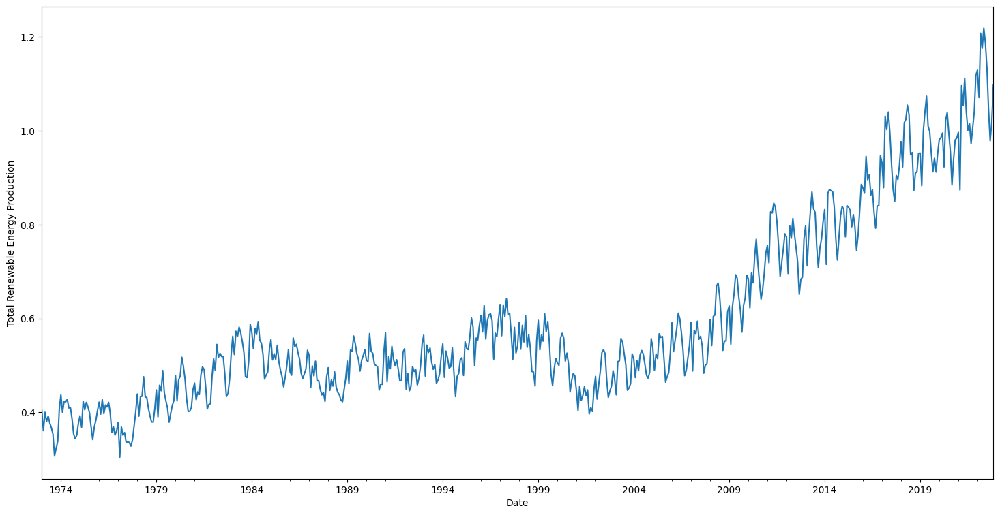

,y
count,599.000000
mean,0.593709
std,0.193351
min,0.304328
25%,0.467414
50%,0.527479
75%,0.685252
max,1.218790


In [ ]:
import pandas as pd
from prophet import Prophet
from prophet.make_holidays import make_holidays_df
from prophet.plot import plot_plotly, add_changepoints_to_plot, plot_components_plotly, plot_forecast_component, plot_yearly
from IPython.display import Image
import matplotlib.pyplot as plt


# Load the dataset
df = pd.read_csv('World-Energy-Overview.csv', parse_dates=['Date'], index_col='Date')

# Keep only the required columns
df = df[['Total Renewable Energy Production']]

# Rename the column
df.rename(columns={'Total Renewable Energy Production': 'y'}, inplace=True)

# Reset the index to make 'Date' a column
df.reset_index(inplace=True)

# Rename the 'Date' column to 'ds'
df.rename(columns={'Date': 'ds'}, inplace=True)



# Display the first few rows of the modified DataFrame
print(df.head())
print(df.tail())

# Plot the time series data
df.plot(x='ds', y='y', figsize=(18, 9))
plt.xlabel('Date')
plt.ylabel('Total Renewable Energy Production')
plt.legend().set_visible(False)
plt.show()

df[['y']].describe()



In [ ]:
# Prepare the data for Prophet
m = Prophet()
m.fit(df)

# Make a future dataframe for 12 months
future = m.make_future_dataframe(periods=60, freq='M')
future

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprsoeu1h9/x9f14nak.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprsoeu1h9/yzmz1ljj.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=6127', 'data', 'file=/tmp/tmprsoeu1h9/x9f14nak.json', 'init=/tmp/tmprsoeu1h9/yzmz1ljj.json', 'output', 'file=/tmp/tmprsoeu1h9/prophet_modelwqo0j40b/prophet_model-20240714045417.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:54:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:54:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


,ds
0,1973-01-31
1,1973-02-28
2,1973-03-31
3,1973-04-30
4,1973-05-31
...,...
654,2027-07-31
655,2027-08-31
656,2027-09-30
657,2027-10-31


In [ ]:
forecast = m.predict(future)
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,1973-01-31,0.357739,0.333975,0.427163,0.357739,0.357739,0.023546,0.023546,0.023546,0.023546,0.023546,0.023546,0.0,0.0,0.0,0.381286
1,1973-02-28,0.358598,0.286406,0.376314,0.358598,0.358598,-0.028190,-0.028190,-0.028190,-0.028190,-0.028190,-0.028190,0.0,0.0,0.0,0.330407
2,1973-03-31,0.359548,0.348218,0.437359,0.359548,0.359548,0.033028,0.033028,0.033028,0.033028,0.033028,0.033028,0.0,0.0,0.0,0.392576
3,1973-04-30,0.360468,0.331321,0.419560,0.360468,0.360468,0.016560,0.016560,0.016560,0.016560,0.016560,0.016560,0.0,0.0,0.0,0.377028
4,1973-05-31,0.361418,0.363135,0.451595,0.361418,0.361418,0.046028,0.046028,0.046028,0.046028,0.046028,0.046028,0.0,0.0,0.0,0.407446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
654,2027-07-31,1.246457,1.205351,1.313580,1.221015,1.271288,0.013720,0.013720,0.013720,0.013720,0.013720,0.013720,0.0,0.0,0.0,1.260177
655,2027-08-31,1.249273,1.176661,1.286404,1.222878,1.274860,-0.016015,-0.016015,-0.016015,-0.016015,-0.016015,-0.016015,0.0,0.0,0.0,1.233259
656,2027-09-30,1.252000,1.142073,1.247801,1.224887,1.278339,-0.059837,-0.059837,-0.059837,-0.059837,-0.059837,-0.059837,0.0,0.0,0.0,1.192163
657,2027-10-31,1.254817,1.158720,1.267485,1.226665,1.281894,-0.043581,-0.043581,-0.043581,-0.043581,-0.043581,-0.043581,0.0,0.0,0.0,1.211235


In [ ]:
# yhat: predicted values, yhat_lower: lower uncertainty interval, yhat_upper: upper uncertainty interval
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
654,2027-07-31,1.260177,1.205351,1.313580
655,2027-08-31,1.233259,1.176661,1.286404
656,2027-09-30,1.192163,1.142073,1.247801
657,2027-10-31,1.211235,1.158720,1.267485
658,2027-11-30,1.228130,1.173059,1.285400


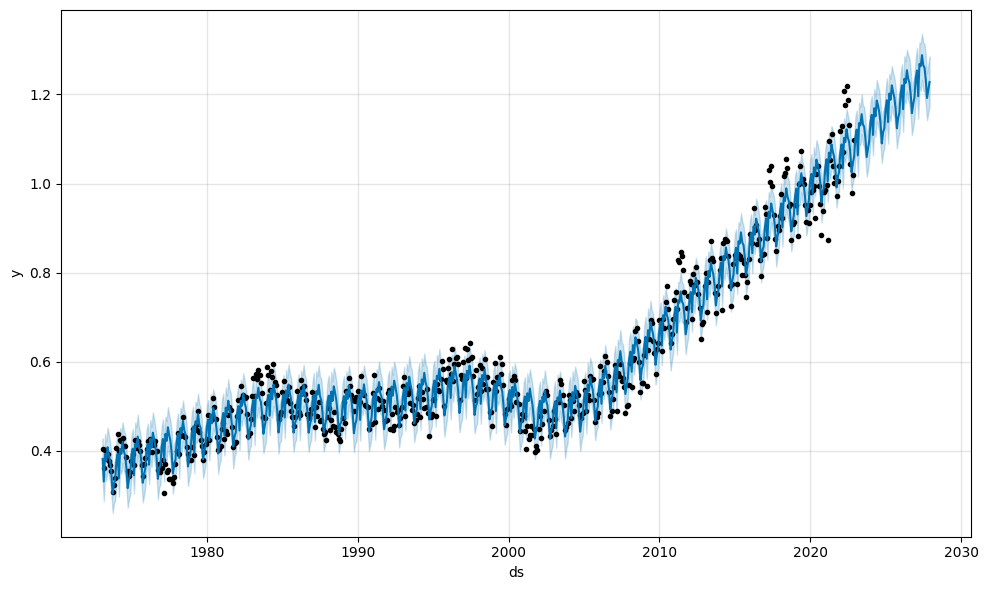

In [ ]:
# Plot the forecast
fig1 = m.plot(forecast)

### 8.1.Representation with Prophet

**Results**

1. The black dots are datapoints from the dataset which are monthly total renewable production. The blue line represents the model fitting to the data. The part from around after 2023 till before 2023, does not have black dots as there is no data for it yet. It is the predicted section of the graph.


2. The shaded area represents the confidence interval. The confidence interval for a period of 60, meaning 60 months or 5 years, the confidence interval is not very high meaning, the prediction has good performance and good accuracy.

3. The trend shows an increasing pattern in total renewable energy production over the years.

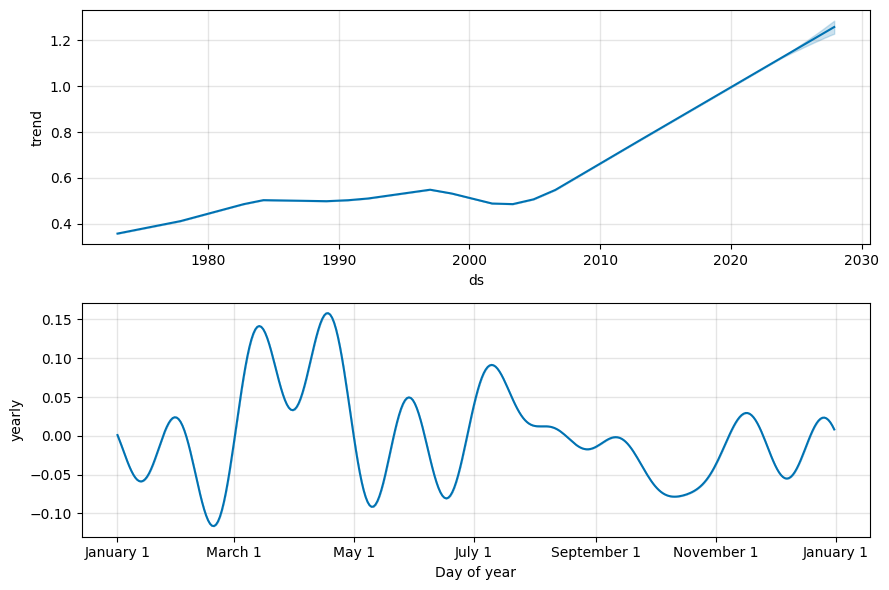

In [ ]:
fig2 = m.plot_components(forecast)

### 8.2.Trend and Yearly Decomposition

**Results**

- Trend: The trend graph indicates an increase from 1973 to mid 1980s from 0.3 to 0.5 and the slope reduces and plateaus until late 1990s around the level of 0.5. The trend takes a short dip before it starkly rises linearly.

- The shaded part at the end is the confidence interval of the predicted trend. The confidence interval is V-shaped with increasing amplitude indicating that simply predicting from trend component might be hard.

- Seasonality: Since, this is monthly data, only yearly component is relevant where the x-axis would represent the months for a given year. There is spike in the renewable energy production from March to May. The peaks above 0 occur in these months as well as June, July and early November. The troughs occer at late February, and October. These is more or less in accordance with the bar plots. However, the bar plots indicated 'High' production from May to July but it is March to May here. The possible reason in this mismatch might be the window size. Although the months may shift, the shape of the seasonlity can be agreed between the bar and the Prophet seasonality component.



In [ ]:
# Plot the forecast
fig = plot_plotly(m, forecast)
fig.show()

### 8.3. Overall Forecast

**Results**

- The zoomed view from 2014 to 2030 shows the regularity of seasonal peaks and troughs in the prediction as well as the historical data, which reaffirms the consistency of renewable energy production cycles. Hence the confidence interval is around the fitted regression line.

In [ ]:
# Plot components
fig2 = plot_components_plotly(m, forecast)
fig2.show()


In [ ]:
df

,ds,y
0,1973-01-31,0.403981
1,1973-02-28,0.360900
2,1973-03-31,0.400161
3,1973-04-30,0.380470
4,1973-05-31,0.392141
...,...,...
594,2022-07-31,1.132400
595,2022-08-31,1.044026
596,2022-09-30,0.978647
597,2022-10-31,1.019209


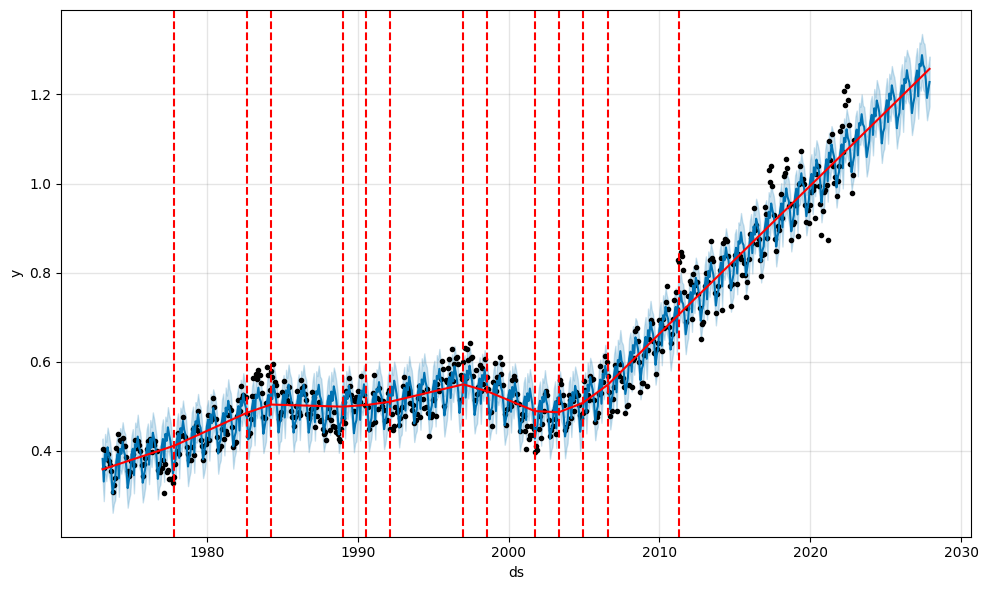

In [ ]:
# Visualizing changepoints
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

### 8.4. Changepoints Representation

**Results**

- This plot shows the detected changepoints in the time series, marked by red dashed lines. Changepoints indicate significant shifts in the trend.

- At the locations previously mentioned in the trend component, red dotted lines pass to indicate the same time.

- More changepoints have been located at 2011, and more than one changepoints at previously visually inspected places.

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprsoeu1h9/mtwtsgm_.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprsoeu1h9/76qjgzbp.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49049', 'data', 'file=/tmp/tmprsoeu1h9/mtwtsgm_.json', 'init=/tmp/tmprsoeu1h9/76qjgzbp.json', 'output', 'file=/tmp/tmprsoeu1h9/prophet_model6ota_skn/prophet_model-20240714045445.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:54:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:54:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


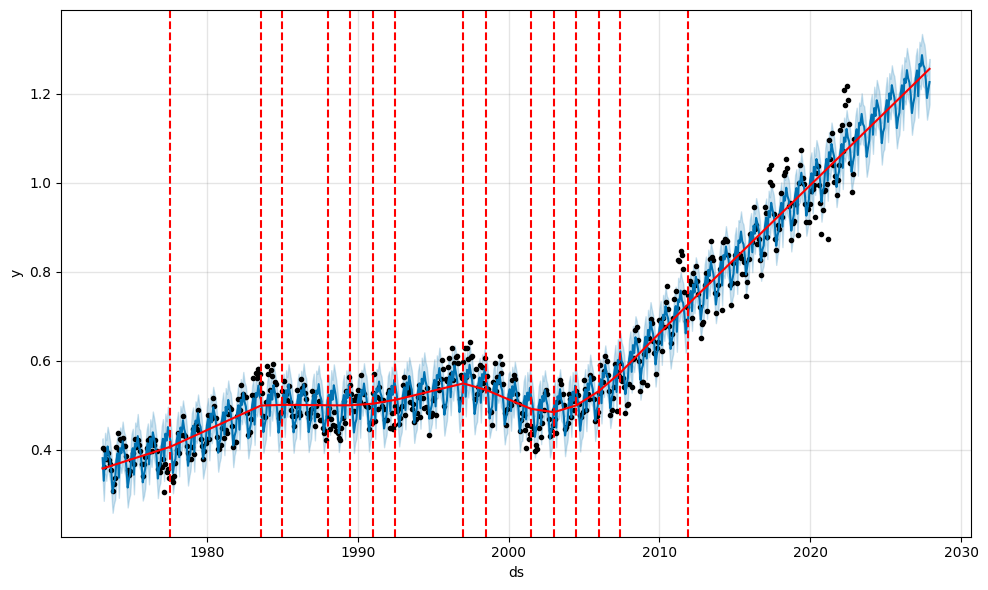

In [ ]:
# Initialize the model with custom changepoint settings (30 change points and the first 90% of the time series).
m = Prophet(n_changepoints=30, changepoint_range=0.9)

# Fit the model
m.fit(df)

# Create future dataframe
future = m.make_future_dataframe(periods=60, freq='M')

# Make predictions
forecast = m.predict(future)

# Plot the forecast
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast);

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprsoeu1h9/two7ihra.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprsoeu1h9/x9r_vnsf.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26479', 'data', 'file=/tmp/tmprsoeu1h9/two7ihra.json', 'init=/tmp/tmprsoeu1h9/x9r_vnsf.json', 'output', 'file=/tmp/tmprsoeu1h9/prophet_modelxj9s2pke/prophet_model-20240714045525.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:55:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:55:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


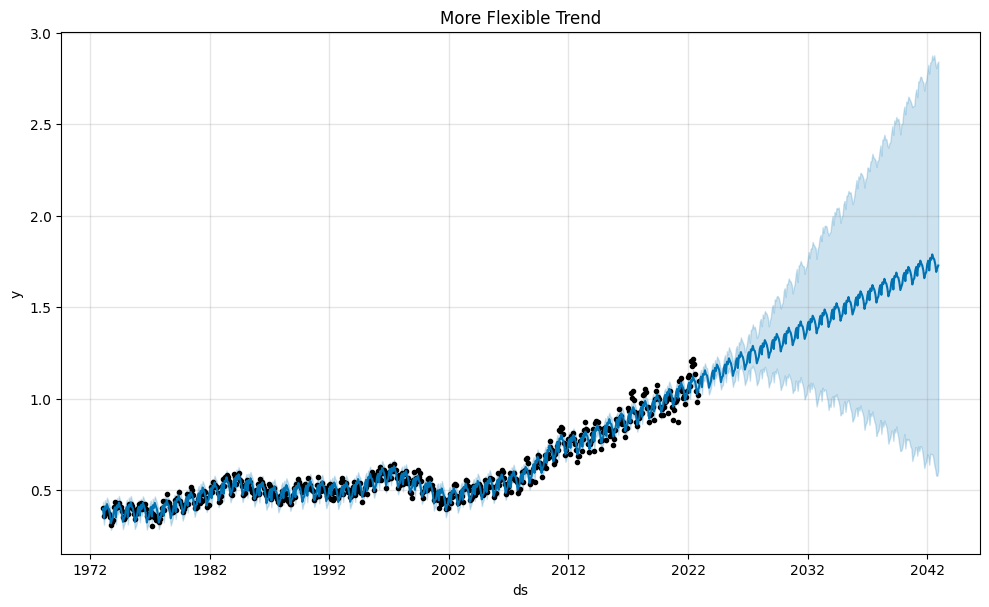

In [ ]:
# Create future dataframe
future = m.make_future_dataframe(periods=240, freq='M')
# More flexible trend
m = Prophet(changepoint_prior_scale=0.5)
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)
plt.title('More Flexible Trend');

### 8.5.More Flexible

**Results**

- This plot shows the forecast with a higher changepoint prior scale, letting in for a more flexible trend.

-  The forecast shows high variability or high confidence intervals, capturing more fluctuations in the data, suggesting influencing renewable energy production.

- The amplitude of the prediction and the trend look very similar to the past information despite the high confidence intervals.

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmprsoeu1h9/fbp7iezp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmprsoeu1h9/qeo8g8xi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79217', 'data', 'file=/tmp/tmprsoeu1h9/fbp7iezp.json', 'init=/tmp/tmprsoeu1h9/qeo8g8xi.json', 'output', 'file=/tmp/tmprsoeu1h9/prophet_modelu9olcdyp/prophet_model-20240714045540.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
04:55:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
04:55:40 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
04:55:40 - cmdstanpy - ERROR - Chain [1]

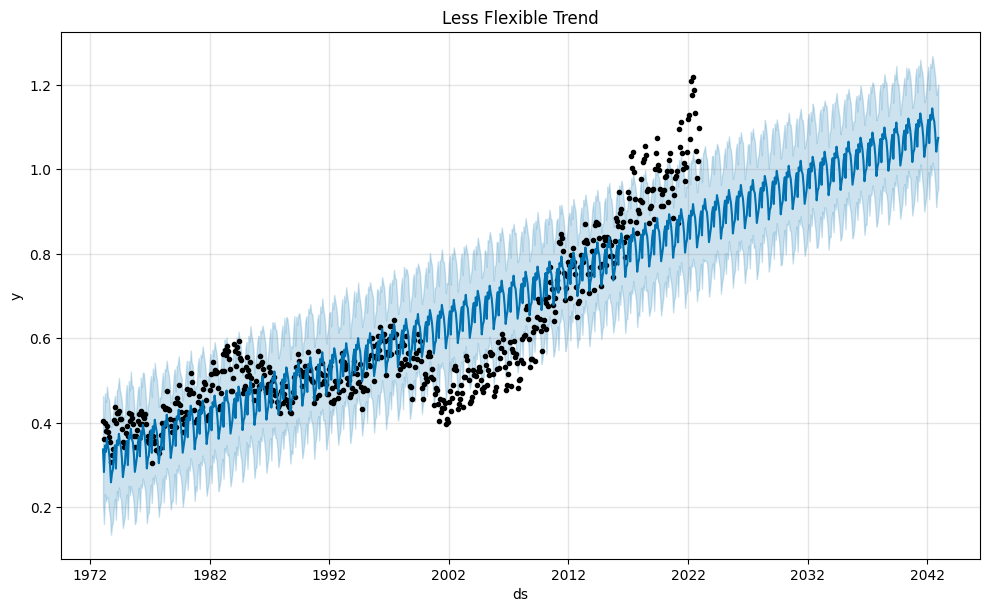

In [ ]:
# Less flexible trend
m = Prophet(changepoint_prior_scale=0.001)
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)
plt.title('Less Flexible Trend');

### 8.6.Less Flexible

**Results**

- This plot shows the forecast with a lower changepoint prior scale, showing as a smoother trend.

- The forecast smooths out short-term fluctuations, emphasizing long-term trends and reducing noise, however the model does not properly fit changes in the datapoints and the trend is linear trend with less confidence interval size.

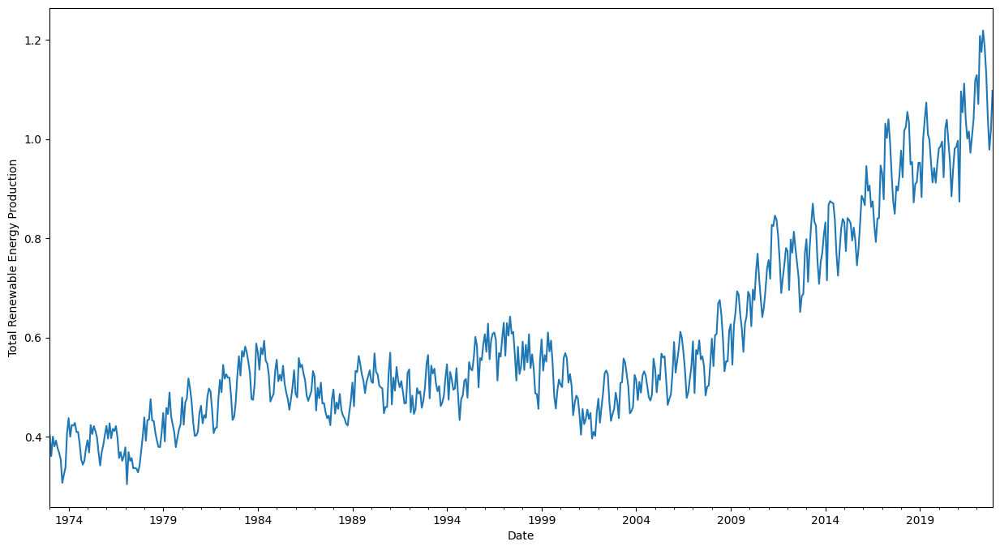

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpw6b86dh0/tyoiw2l3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpw6b86dh0/zff7pu8s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46860', 'data', 'file=/tmp/tmpw6b86dh0/tyoiw2l3.json', 'init=/tmp/tmpw6b86dh0/zff7pu8s.json', 'output', 'file=/tmp/tmpw6b86dh0/prophet_modelg7j3zv1q/prophet_model-20240713185644.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:56:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:56:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


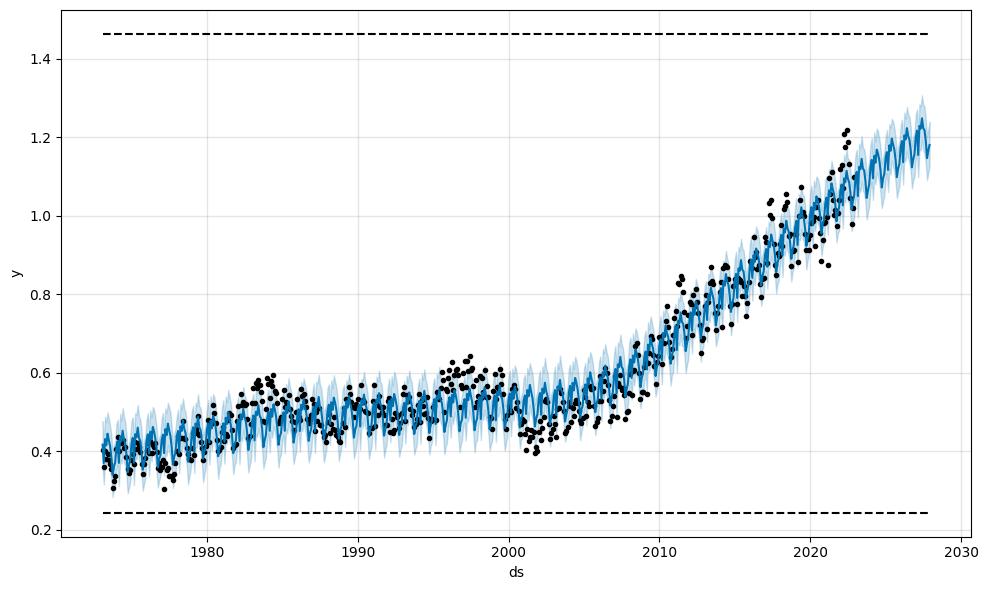

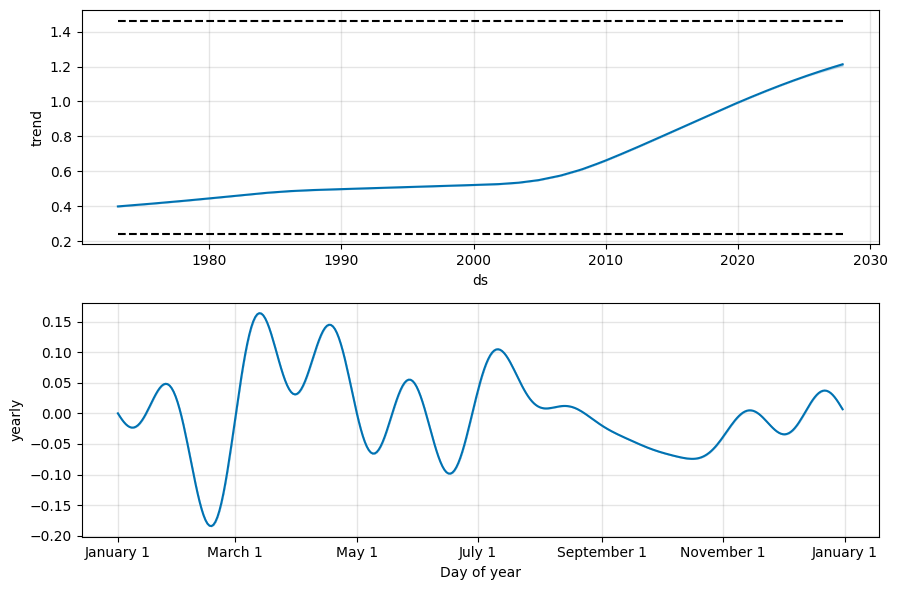

In [ ]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'World-Energy-Overview.csv'
df = pd.read_csv(file_path, parse_dates=['Date'], index_col='Date')

# Keep only the required columns
df = df[['Total Renewable Energy Production']]

# Rename the column to 'y' for Prophet compatibility
df.rename(columns={'Total Renewable Energy Production': 'y'}, inplace=True)

# Reset the index to make 'Date' a column
df.reset_index(inplace=True)

# Rename the 'Date' column to 'ds' for Prophet compatibility
df.rename(columns={'Date': 'ds'}, inplace=True)

# Plot the time series data
df.plot(x='ds', y='y', figsize=(15, 8))
plt.xlabel('Date')
plt.ylabel('Total Renewable Energy Production')
plt.legend().set_visible(False)
plt.show()

# Set the carrying capacity and floor values
carrying_capacity = df['y'].max() * 1.2  # 20% higher than the maximum value
floor_value = df['y'].min() * 0.8  # 20% lower than the minimum value, or you can set it to a specific value if needed

df['cap'] = carrying_capacity
df['floor'] = floor_value

# Specify logistic growth model
m = Prophet(growth='logistic')

# Fit the model
m.fit(df)

# Create future dataframe with specified periods (5 years into the future)
future = m.make_future_dataframe(periods=60, freq='M')
future['cap'] = carrying_capacity
future['floor'] = floor_value

# Make predictions
fcst = m.predict(future)

# Plot the forecast
fig1 = m.plot(fcst)
plt.show()

# Plot forecast components
fig2 = m.plot_components(fcst)
plt.show()

# Interactive figure of the forecast
fig3 = plot_plotly(m, fcst)
fig3.show()

# Interactive figure of the forecast components
fig4 = plot_components_plotly(m, fcst)
fig4.show()


### 8.7.Carrying Capacity and Floor

**Results**

- The carrying capacity is hard to estimate for total world energy production levels as we need to understand and add all the companies that generate the production. However this may fluctuate with new companies coming in.

- The floor can be decided as from 1973 some developments have already been made for renewable energy sources. (hydroelectric followed by wind eenrgy)

<ipython-input-2-b93ccdc53e87>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={'Total Renewable Energy Production': 'y'}, inplace=True)
<ipython-input-2-b93ccdc53e87>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={'Date': 'ds'}, inplace=True)
/usr/local/lib/python3.10/dist-packages/holidays/countries/india.py:103: Warning: Diwali and Holi holidays available from 2001 to 2030 only
  warnings.warn(warning_msg, Warning)


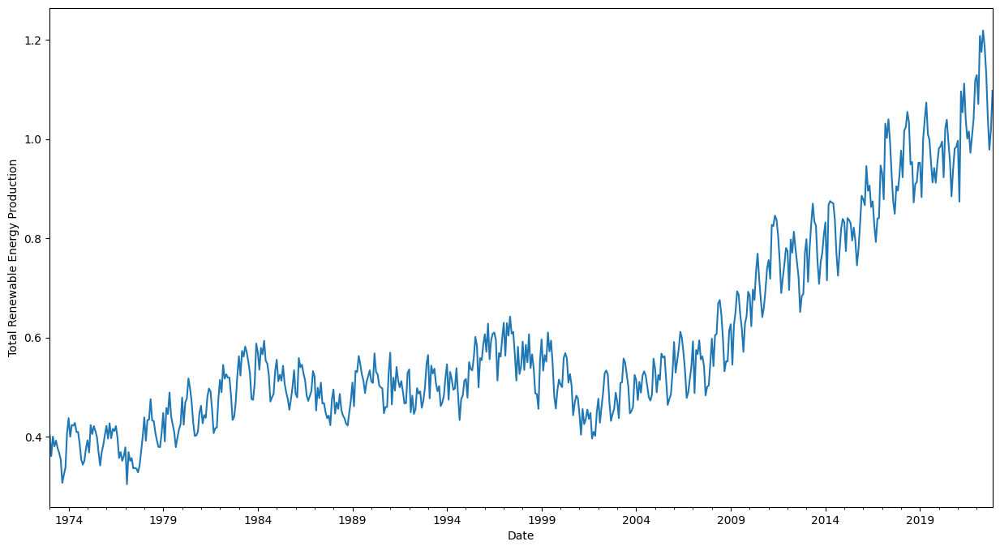

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/so7xh31x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/bgfqz7ht.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=33976', 'data', 'file=/tmp/tmptc4ieywy/so7xh31x.json', 'init=/tmp/tmptc4ieywy/bgfqz7ht.json', 'output', 'file=/tmp/tmptc4ieywy/prophet_modelywzsd_f3/prophet_model-20240715070134.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:01:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:01:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


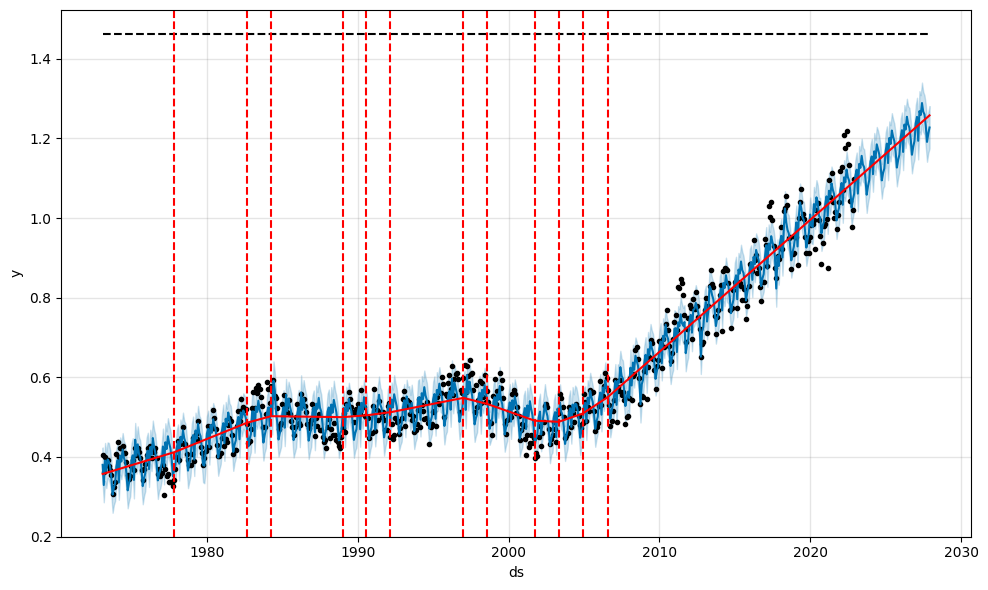

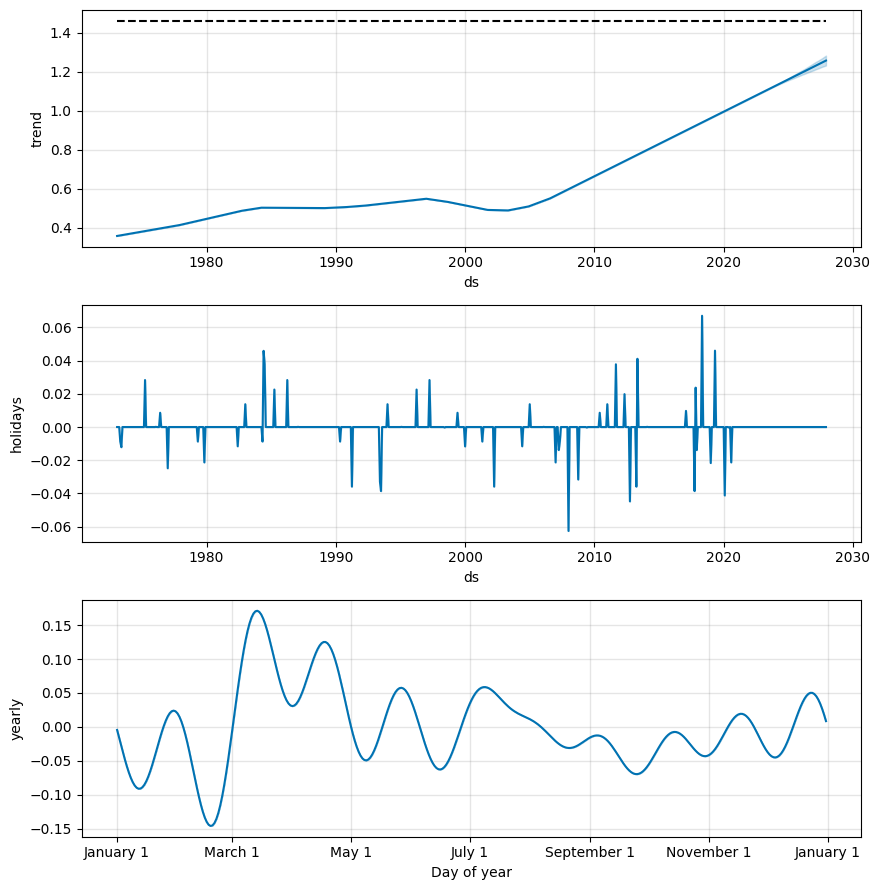

In [ ]:
import pandas as pd
import numpy as np
import holidays
from prophet import Prophet
from prophet.plot import add_changepoints_to_plot, plot_components_plotly, plot_plotly
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'World-Energy-Overview.csv'
df = pd.read_csv(file_path, parse_dates=['Date'], index_col='Date')

# Keep only the required columns
df = df[['Total Renewable Energy Production']]

# Rename the column to 'y' for Prophet compatibility
df.rename(columns={'Total Renewable Energy Production': 'y'}, inplace=True)

# Reset the index to make 'Date' a column
df.reset_index(inplace=True)

# Rename the 'Date' column to 'ds' for Prophet compatibility
df.rename(columns={'Date': 'ds'}, inplace=True)

## Fetch international holidays
years = list(range(1973, 2021))
countries = ['US', 'CA', 'GB', 'DE', 'FR', 'IT', 'ES', 'JP', 'CN', 'IN', 'BR', 'AU']  # Add major countries as needed

holiday_list = []

for country in countries:
    for year in years:
        for date, name in holidays.CountryHoliday(country, years=[year]).items():
            holiday_list.append({'holiday': name, 'ds': pd.to_datetime(date), 'country': country})

holidays_df = pd.DataFrame(holiday_list)

# Plot the time series data
df.plot(x='ds', y='y', figsize=(15, 8))
plt.xlabel('Date')
plt.ylabel('Total Renewable Energy Production')
plt.legend().set_visible(False)
plt.show()

# Instantiate Prophet with holidays
m = Prophet(holidays=holidays_df, yearly_seasonality=True, daily_seasonality=False)

# Fit the model
m.fit(df)

# Create future dataframe with specified periods (5 years into the future)
future = m.make_future_dataframe(periods=60, freq='M')
future['cap'] = df['y'].max() * 1.2  # 20% higher than the maximum value
future['floor'] = df['y'].min() * 0.8  # 20% lower than the minimum value

# Make predictions
forecast = m.predict(future)

# Visualize the forecast and changepoints
fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)
plt.show()

# Plot the forecast components
fig = m.plot_components(forecast)
plt.show()

# Interactive plot of the forecast
fig = plot_plotly(m, forecast)
fig.show()

# Interactive plot of the forecast components
fig = plot_components_plotly(m, forecast)
fig.show()


/usr/local/lib/python3.10/dist-packages/holidays/countries/india.py:103: Warning:

Diwali and Holi holidays available from 2001 to 2030 only



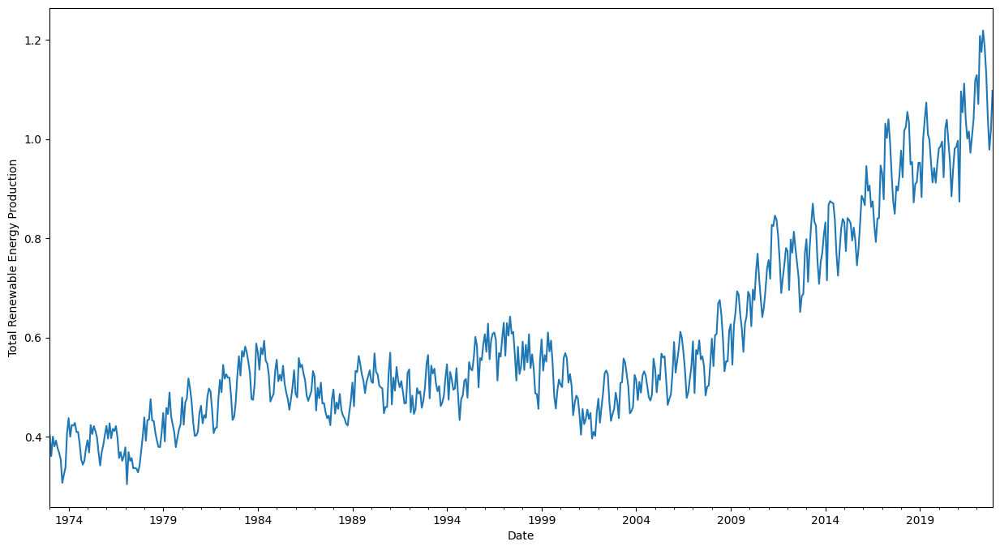

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/i3zfurjh.json


Fourier order for yearly seasonality:
Default yearly seasonality:


DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/u04iiu9z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63725', 'data', 'file=/tmp/tmptc4ieywy/i3zfurjh.json', 'init=/tmp/tmptc4ieywy/u04iiu9z.json', 'output', 'file=/tmp/tmptc4ieywy/prophet_modelae8wz2xw/prophet_model-20240715071836.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:18:36 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:18:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/xqn0dh1u.json


Custom yearly seasonality with a higher Fourier order:


DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/lwwl4tlr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=68830', 'data', 'file=/tmp/tmptc4ieywy/xqn0dh1u.json', 'init=/tmp/tmptc4ieywy/lwwl4tlr.json', 'output', 'file=/tmp/tmptc4ieywy/prophet_modelp94gi1tu/prophet_model-20240715071837.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:18:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:18:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Custom monthly seasonality:


DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/rxre2_w9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/ytfvy5nz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=91679', 'data', 'file=/tmp/tmptc4ieywy/rxre2_w9.json', 'init=/tmp/tmptc4ieywy/ytfvy5nz.json', 'output', 'file=/tmp/tmptc4ieywy/prophet_modeld2av8qcb/prophet_model-20240715071840.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:18:40 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:18:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Conditional seasonalities:


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/ylgedk24.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/_zal8izv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=73068', 'data', 'file=/tmp/tmptc4ieywy/ylgedk24.json', 'init=/tmp/tmptc4ieywy/_zal8izv.json', 'output', 'file=/tmp/tmptc4ieywy/prophet_modelvg5oi10b/prophet_model-20240715071853.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:18:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:18:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality

Additive and multiplicative seasonality modes:
Additive seasonality:


DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/9d_d8uzj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/g0m6pter.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51150', 'data', 'file=/tmp/tmptc4ieywy/9d_d8uzj.json', 'init=/tmp/tmptc4ieywy/g0m6pter.json', 'output', 'file=/tmp/tmptc4ieywy/prophet_modeljbt9p6ze/prophet_model-20240715071905.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:19:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:19:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmp

Multiplicative seasonality:


INFO:cmdstanpy:Chain [1] start processing
07:19:06 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Seasonality modes with regressor:


DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/pzbi8325.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptc4ieywy/33p5617p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38882', 'data', 'file=/tmp/tmptc4ieywy/pzbi8325.json', 'init=/tmp/tmptc4ieywy/33p5617p.json', 'output', 'file=/tmp/tmptc4ieywy/prophet_modelpe7abxtg/prophet_model-20240715071910.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
07:19:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
07:19:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


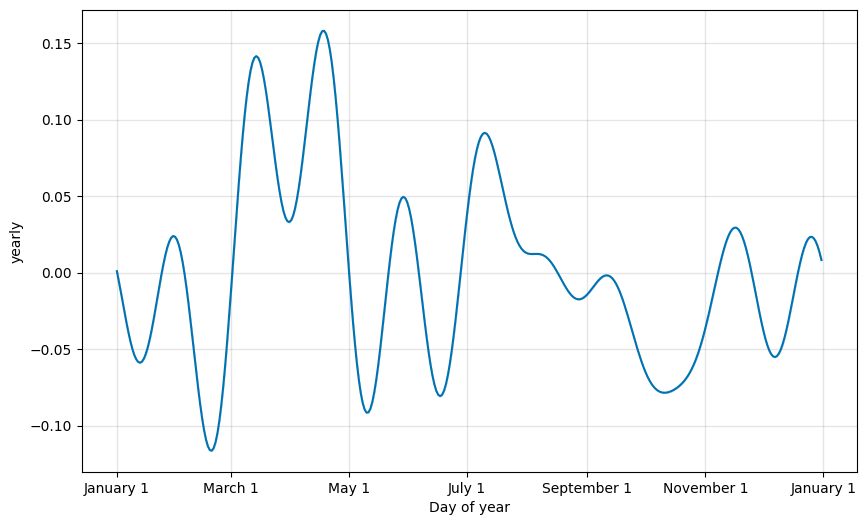

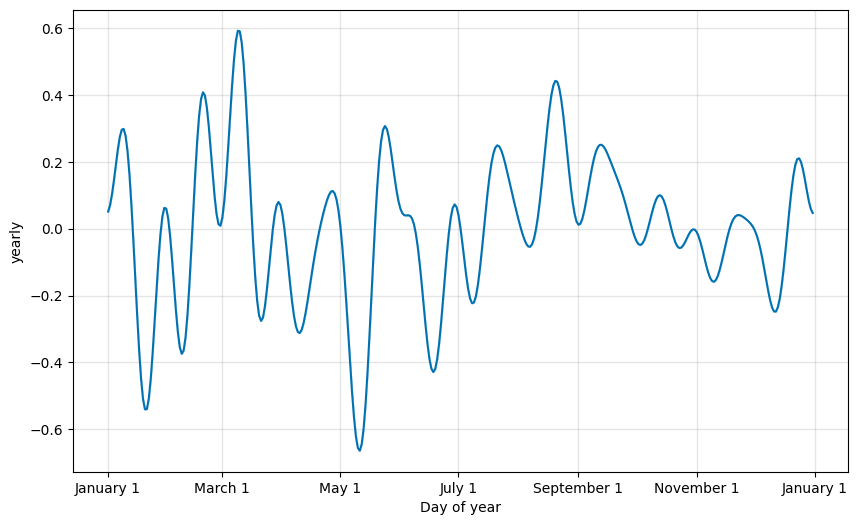

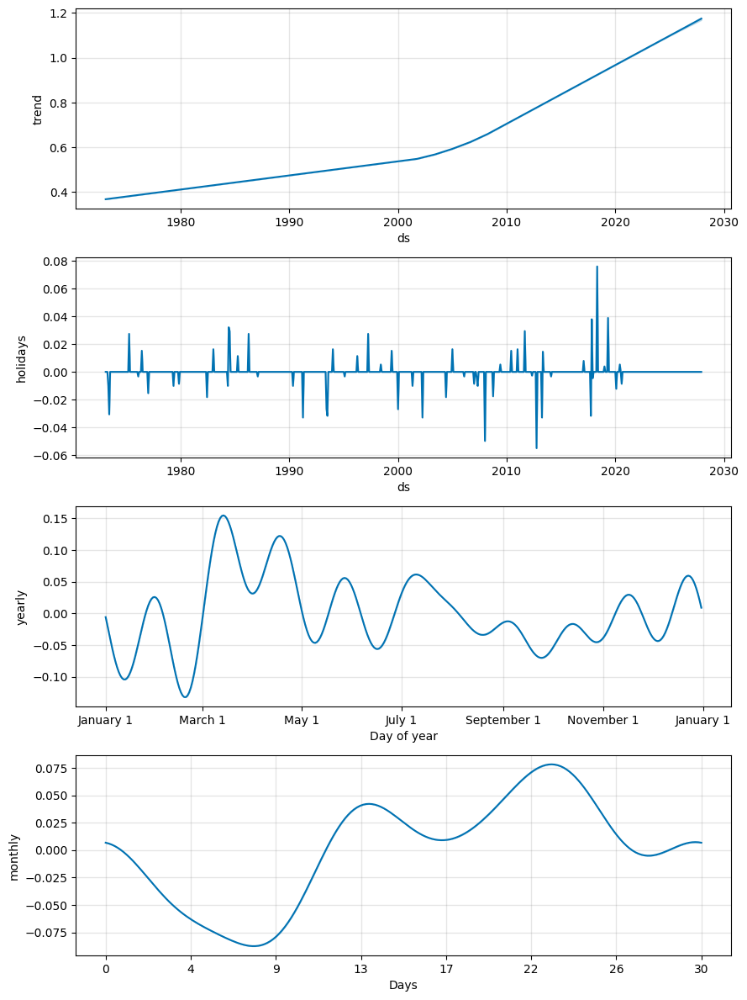

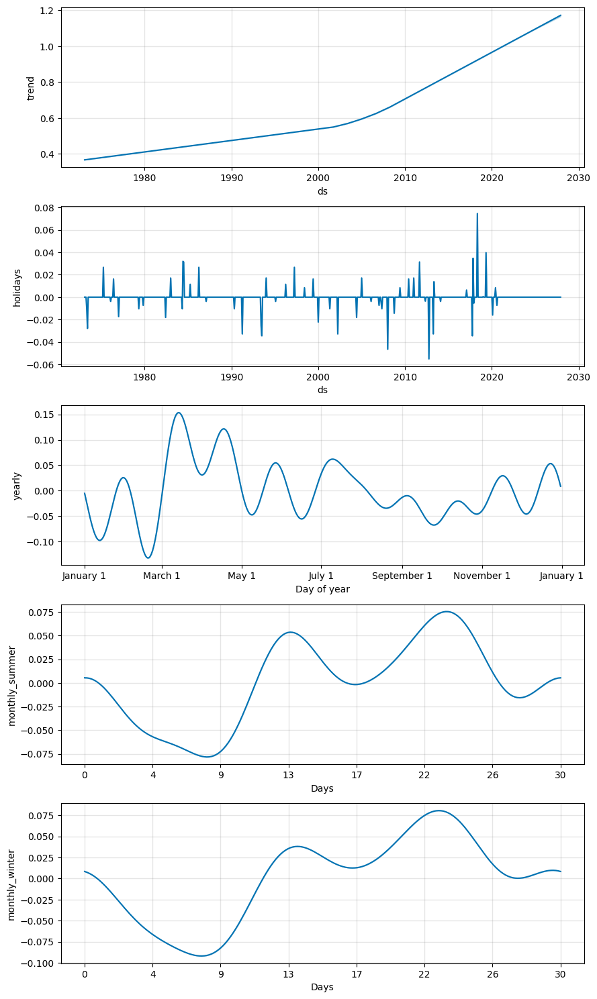

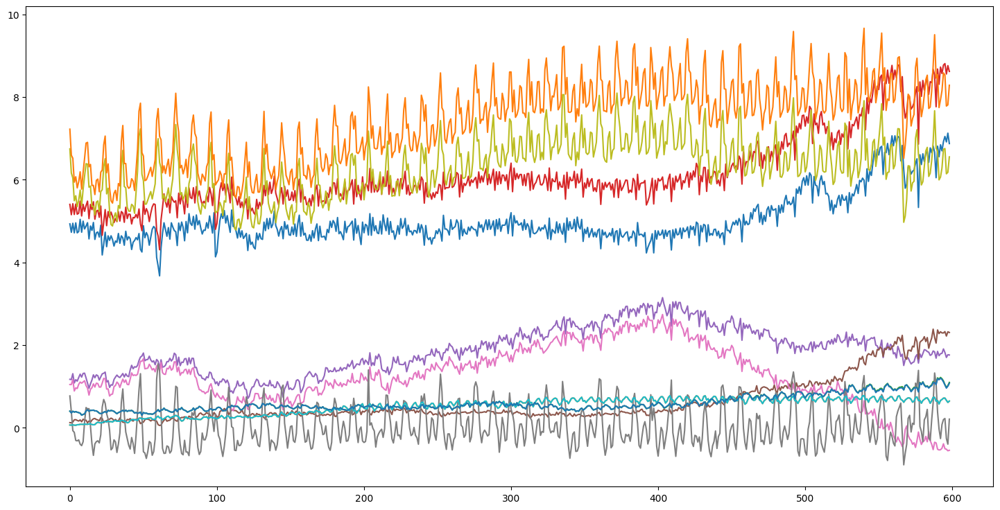

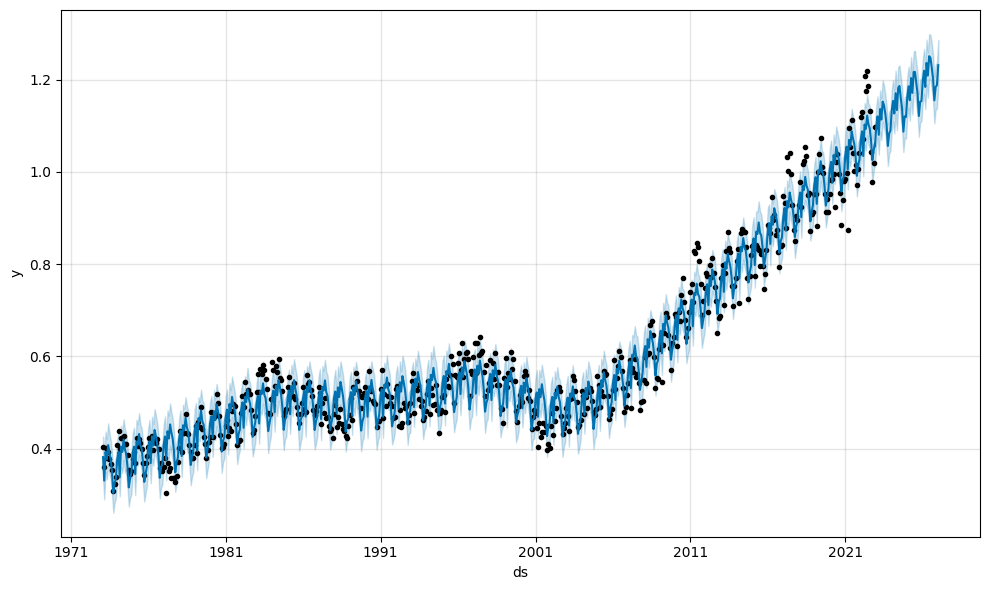

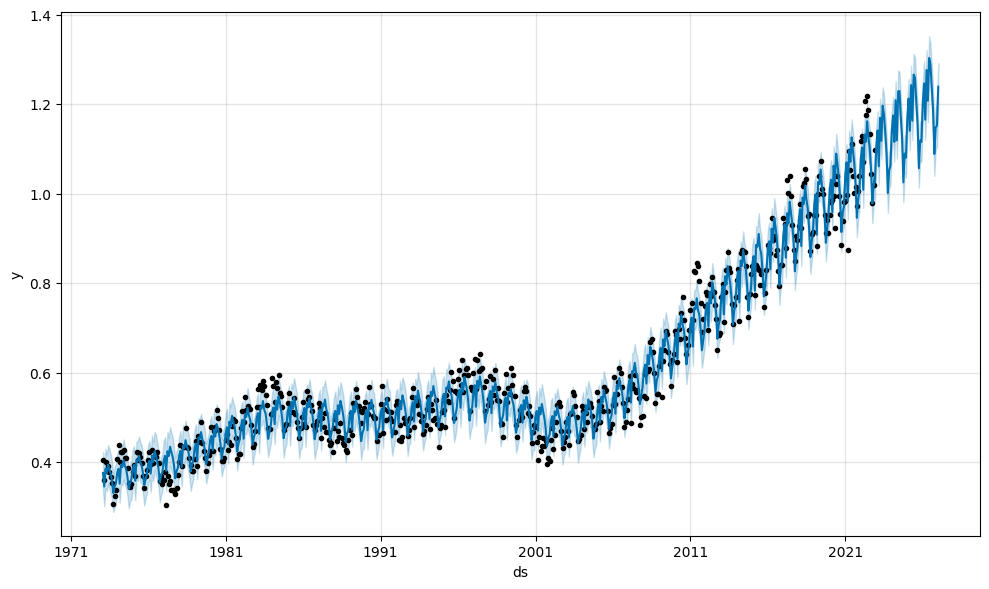

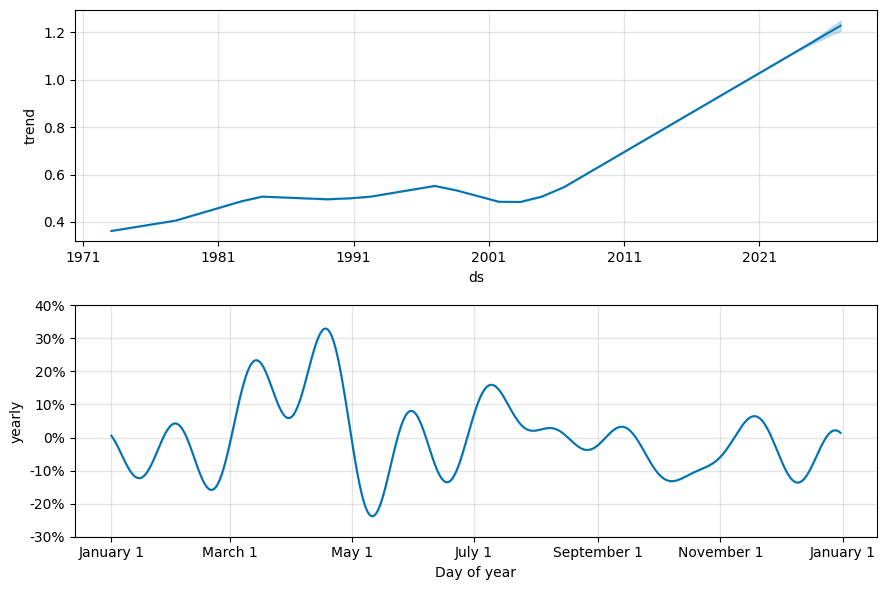

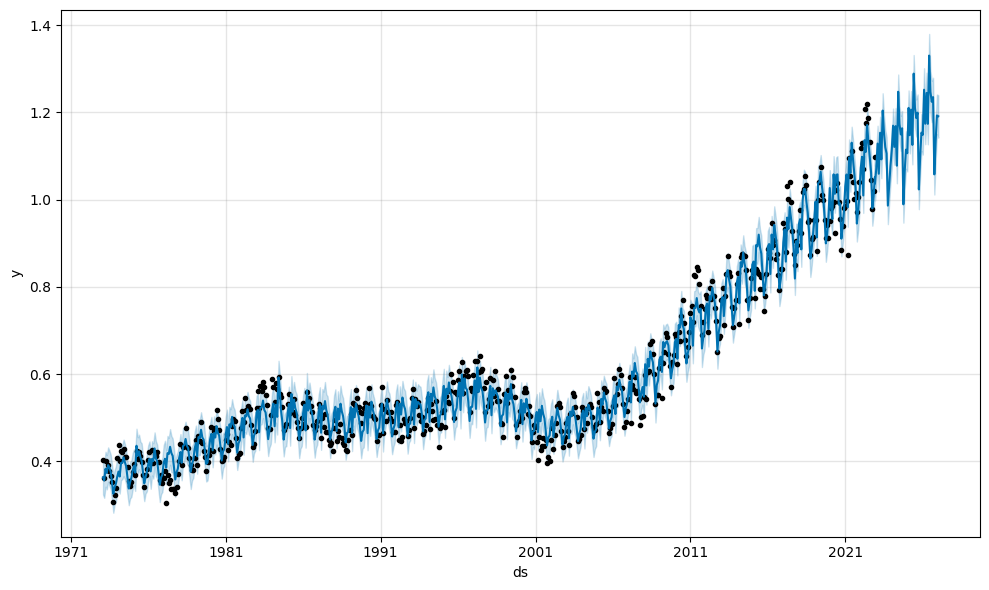

In [ ]:
import pandas as pd
from prophet import Prophet
from prophet.plot import add_changepoints_to_plot, plot_components_plotly, plot_plotly, plot_forecast_component, plot_yearly
import holidays
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'World-Energy-Overview.csv'
df = pd.read_csv(file_path, parse_dates=['Date'], index_col='Date')

# Keep only the required columns
df = df[['Total Renewable Energy Production']]

# Rename the column to 'y' for Prophet compatibility
df.rename(columns={'Total Renewable Energy Production': 'y'}, inplace=True)

# Reset the index to make 'Date' a column
df.reset_index(inplace=True)

# Rename the 'Date' column to 'ds' for Prophet compatibility
df.rename(columns={'Date': 'ds'}, inplace=True)

# Fetch international holidays
years = list(range(1973, 2021))
countries = ['US', 'CA', 'GB', 'DE', 'FR', 'IT', 'ES', 'JP', 'CN', 'IN', 'BR', 'AU']  # Add major countries as needed

holiday_list = []

for country in countries:
    for year in years:
        for date, name in holidays.CountryHoliday(country, years=[year]).items():
            holiday_list.append({'holiday': name, 'ds': pd.to_datetime(date), 'country': country})

holidays_df = pd.DataFrame(holiday_list)

# Plot the time series data
df.plot(x='ds', y='y', figsize=(15, 8))
plt.xlabel('Date')
plt.ylabel('Total Renewable Energy Production')
plt.legend().set_visible(False)
plt.show()

# Fourier order for yearly seasonality
print("Fourier order for yearly seasonality:")

# Default yearly seasonality
print("Default yearly seasonality:")
m_default = Prophet()
m_default.fit(df)
a = plot_yearly(m_default)

# Custom yearly seasonality with a higher Fourier order
print("Custom yearly seasonality with a higher Fourier order:")
m_custom = Prophet(yearly_seasonality=20)
m_custom.fit(df)
a = plot_yearly(m_custom)

# Custom seasonality: monthly seasonality with a period of 30.5 days and a Fourier order of 5
print("Custom monthly seasonality:")
m_custom_seasonality = Prophet(weekly_seasonality=False, holidays=holidays_df)
m_custom_seasonality.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m_custom_seasonality.fit(df)
future = m_custom_seasonality.make_future_dataframe(periods=60, freq='M')
forecast = m_custom_seasonality.predict(future)
fig = m_custom_seasonality.plot_components(forecast)

# Conditional seasonalities
print("Conditional seasonalities:")

def is_summer(ds):
    date = pd.to_datetime(ds)
    return (date.month > 5 and date.month < 9)

df['summer'] = df['ds'].apply(is_summer)
df['winter'] = ~df['ds'].apply(is_summer)

m_conditional = Prophet(weekly_seasonality=False, holidays=holidays_df)
m_conditional.add_seasonality(name='monthly_summer', period=30.5, fourier_order=5, condition_name='summer')
m_conditional.add_seasonality(name='monthly_winter', period=30.5, fourier_order=5, condition_name='winter')

future['summer'] = future['ds'].apply(is_summer)
future['winter'] = ~future['ds'].apply(is_summer)

forecast = m_conditional.fit(df).predict(future)
fig = m_conditional.plot_components(forecast)

# Additive and multiplicative seasonality modes
print("Additive and multiplicative seasonality modes:")
df_passengers = pd.read_csv('World-Energy-Overview.csv')
df_passengers = df_passengers.rename(columns={'Total Renewable Energy Production': 'y', 'Date': 'ds'}) # Rename columns to 'ds' and 'y'
df_passengers.plot(figsize=(18, 9))
plt.legend().set_visible(False)

# Additive seasonality
print("Additive seasonality:")
m_additive = Prophet()
m_additive.fit(df_passengers)
future_passengers = m_additive.make_future_dataframe(50, freq='MS')
forecast_additive = m_additive.predict(future_passengers)
fig = m_additive.plot(forecast_additive)

# Multiplicative seasonality
print("Multiplicative seasonality:")
m_multiplicative = Prophet(seasonality_mode='multiplicative')
m_multiplicative.fit(df_passengers)
forecast_multiplicative = m_multiplicative.predict(future_passengers)
fig = m_multiplicative.plot(forecast_multiplicative)
fig = m_multiplicative.plot_components(forecast_multiplicative)

# Seasonality modes with regressor
print("Seasonality modes with regressor:")
m_seasonality_modes = Prophet(seasonality_mode='multiplicative', holidays=holidays_df)
m_seasonality_modes.add_seasonality(name='quarterly', period=91.25, fourier_order=8, mode='additive')
m_seasonality_modes.add_regressor('regressor', mode='additive')

df['regressor'] = range(len(df))
m_seasonality_modes.fit(df)

future = m_seasonality_modes.make_future_dataframe(50, freq='MS')
future['regressor'] = range(len(future))

forecast = m_seasonality_modes.predict(future)
fig = m_seasonality_modes.plot(forecast)


### 8.8.Holiday Component

**Results**

- The holiday component has been extracted and several noticeable spikes have been observed from the 1973 to 2020 timeframe.

- Since these are world holidays, it cannot be fixed to one country. Therefore, countries with top production including United States, Canada, UK, Germany, France, Italy, Spain, Japan, China, India, Brazil, Australia and their respective holidays have been included. The positive spike is highest before 2020 and goes up to 0.08, while the highest negative spike is around 2013 at -0.06.

- The monthly component is also geenrated. Though we do not have data for each data, the graph represents a dip in energy production at the beggin of the month, which will rise again from the 9th day to the 23rd day of the month and then dips again.

             ds         y
530  2017-03-31  1.031122
532  2017-05-31  1.039891
542  2018-03-31  1.017194
543  2018-04-30  1.024178
544  2018-05-31  1.054663
545  2018-06-30  1.033802
555  2019-04-30  1.039700
556  2019-05-31  1.073754
568  2020-05-31  1.021471
569  2020-06-30  1.038836
578  2021-03-31  1.096067
579  2021-04-30  1.053848
580  2021-05-31  1.112084
581  2021-06-30  1.039772
583  2021-08-31  1.015449
586  2021-11-30  1.040253
587  2021-12-31  1.118251
588  2022-01-31  1.129142
589  2022-02-28  1.070709
590  2022-03-31  1.208051
591  2022-04-30  1.175706
592  2022-05-31  1.218790
593  2022-06-30  1.186711
594  2022-07-31  1.132400
595  2022-08-31  1.044026
597  2022-10-31  1.019209
598  2022-11-30  1.097519


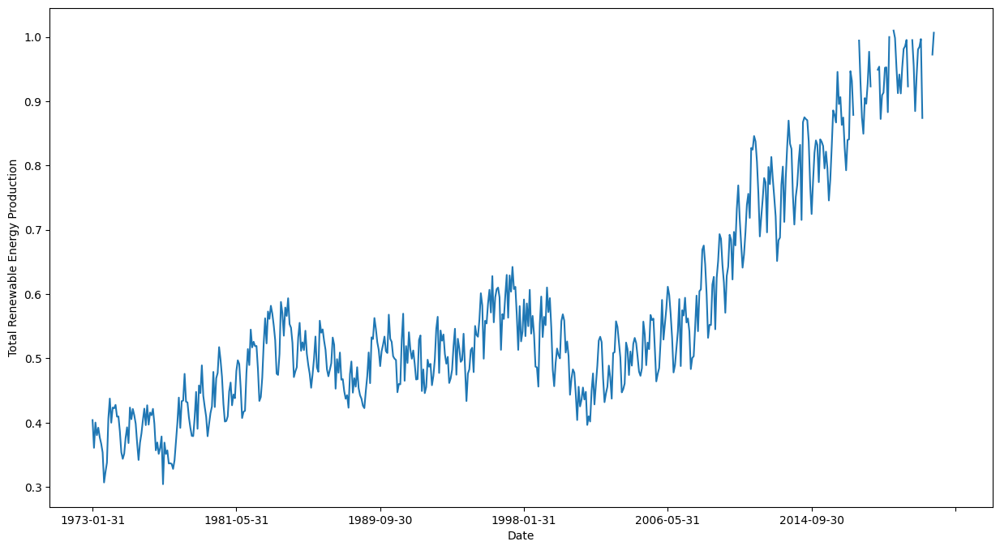

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpus0py9v2/otkke67u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpus0py9v2/7sdacxcy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85338', 'data', 'file=/tmp/tmpus0py9v2/otkke67u.json', 'init=/tmp/tmpus0py9v2/7sdacxcy.json', 'output', 'file=/tmp/tmpus0py9v2/prophet_model0pcexrox/prophet_model-20240714134446.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
13:44:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
13:44:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


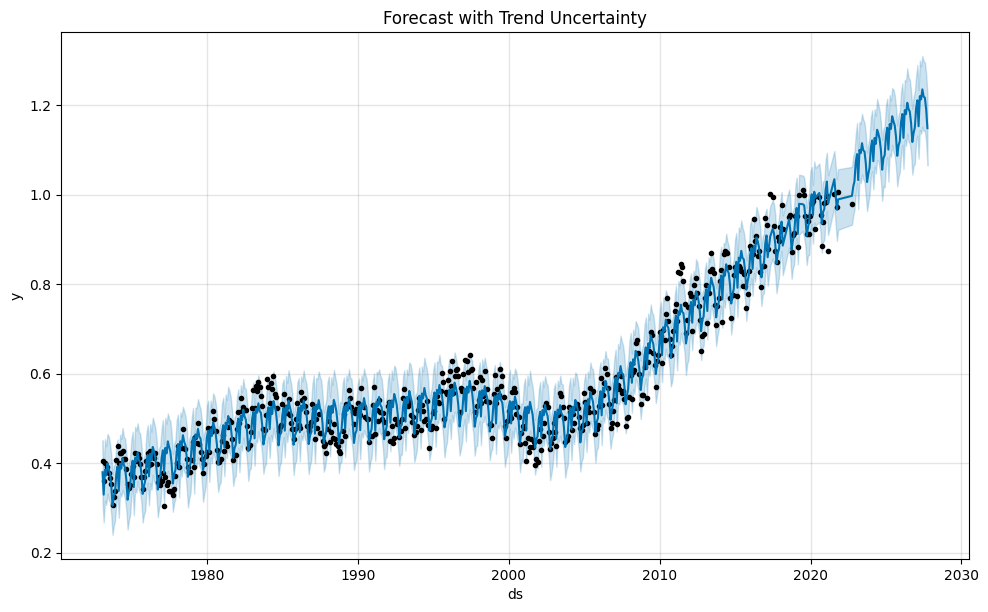

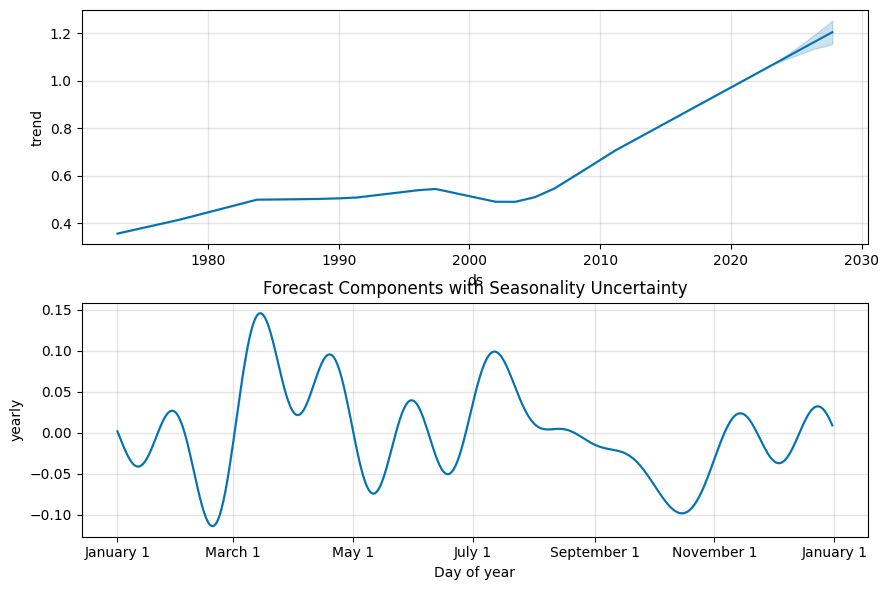

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpus0py9v2/8f3u3o1u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpus0py9v2/35yvuf90.json
13:44:50 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=14845', 'data', 'file=/tmp/tmpus0py9v2/8f3u3o1u.json', 'init=/tmp/tmpus0py9v2/35yvuf90.json', 'output', 'file=/tmp/tmpus0py9v2/prophet_modelcu_s68h3/prophet_model-20240714134451_1.csv', 'method=sample', 'num_samples=150', 'num_warmup=150', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=14845', 'data', 'file=/tmp/tmpus0py9v2/8f3u3o1u.json', 'init=/tmp/tmpus0py9v2/35yvuf90.json', 'output', 'file=/tmp/tmpus0py9v2/prophet_modelcu_s68h3/prophet_model-20240714134451_2.csv', 'method=sample', 'num_samples=150', 'num_warmup=150', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

13:46:20 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=14845', 'data', 'file=/tmp/tmpus0py9v2/8f3u3o1u.json', 'init=/tmp/tmpus0py9v2/35yvuf90.json', 'output', 'file=/tmp/tmpus0py9v2/prophet_modelcu_s68h3/prophet_model-20240714134451_1.csv', 'method=sample', 'num_samples=150', 'num_warmup=150', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpus0py9v2/prophet_modelcu_s68h3/prophet_model-20240714134451_1.csv
 console_msgs (if any):
	/tmp/tmpus0py9v2/prophet_modelcu_s68h3/prophet_model-20240714134451_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 150
    num_warmup = 150
    save_warmup = 0 (Default)
    thin = 1 (Defau

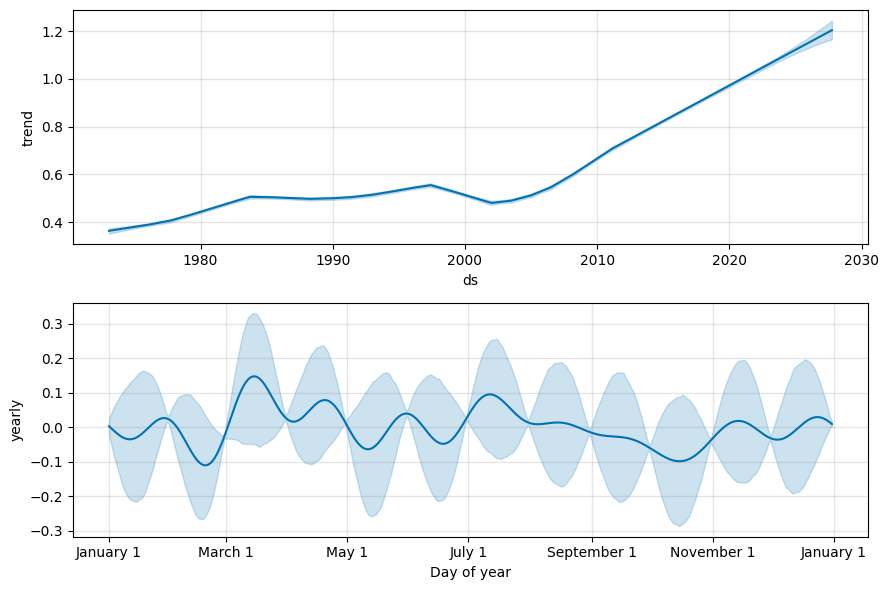

In [ ]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt

# Load the dataset
file_path = 'World-Energy-Overview.csv'
df = pd.read_csv(file_path, parse_dates=['Date'], index_col='Date')

# Keep only the required columns
df = df[['Total Renewable Energy Production']]

# Rename the column to 'y' for Prophet compatibility
df.rename(columns={'Total Renewable Energy Production': 'y'}, inplace=True)

# Reset the index to make 'Date' a column
df.reset_index(inplace=True)

# Rename the 'Date' column to 'ds' for Prophet compatibility
df.rename(columns={'Date': 'ds'}, inplace=True)

# Convert the date format to YYYY-MM-DD
df['ds'] = df['ds'].dt.strftime('%Y-%m-%d')

# Identify and handle outliers using IQR method
Q1 = df['y'].quantile(0.25)
Q3 = df['y'].quantile(0.75)
IQR = Q3 - Q1

outliers = df[(df['y'] < (Q1 - 1.5 * IQR)) | (df['y'] > (Q3 + 1.5 * IQR))]
print(outliers)

# Remove outliers
df.loc[outliers.index, 'y'] = None

# Plot the data without outliers
df.plot(x='ds', y='y', figsize=(15, 8))
plt.xlabel('Date')
plt.ylabel('Total Renewable Energy Production')
plt.legend().set_visible(False)
plt.show()

# Fit the model with cleaned data and specify interval width for uncertainty
model = Prophet(interval_width=0.95)
model.fit(df)

# Create a future dataframe
future = model.make_future_dataframe(periods=60, freq='M')  # 5 years into the future

# Make predictions
forecast = model.predict(future)



# Plot the forecast with trend uncertainty
fig = model.plot(forecast)
plt.title('Forecast with Trend Uncertainty')
plt.show()

# Plot the forecast components with seasonality uncertainty
fig = model.plot_components(forecast)
plt.title('Forecast Components with Seasonality Uncertainty')
plt.show()


m = Prophet(mcmc_samples=300)
forecast = m.fit(df).predict(future)

fig = m.plot_components(forecast)

### 8.9.Seasonality Component

**Results**

- The plot shows distinct peaks and troughs, Higher production is observed around March and May. Lower production is observed around January, July, and November.

- The effect ranges from approximately -0.2 to 0.3. This indicates the extent to which renewable energy production deviates from the trend due to seasonal factors.

- The recurring seasonal pattern highlights specific months where renewable energy production consistently increases or decreases, which can be crucial for planning energy supply and demand.

## 9.Conclusion

This report summarizes key findings of univariate time series forecasting og renewable erngy production dataset from around the world based on information provided by eia.gov from the official website hosted by the United States through Kaggle.

## Research Questions

**1. How did the global renewable energy production evolve over from 1973 - 2022?**

The Total Renewable Energy Production shows an overall nonlinear increasing trend. From 1973 to 2000, production fluctuates between 0.4 and 0.6 quad Btu, peaking in 1984 and 1997, while from 2001 to 2022, it rapidly increases from just over 0.4 to nearly 1.2 quad Btu.


**2. What factors have influenced the evolution of renewable energy production over time?**

A sudden difference in trend from 2000 may indicate availibility of more data and changes in policies of renewable energy and more recent technolgical advancements and standardization of prices. These are exogenerous variables.


**3. How does the growth rate of renewable energy production compare to that of fossil fuels and nuclear energy?**

-- The relationship between total renewable energy production and total fossil fuel production exhibits a moderately positive correlation and a somewhat linear pattern. Contrary to the expectation that an increase in renewable energy would correspond to a decrease in fossil fuels, both energy sources are increasing simultaneously, indicating that one is not replacing the other.


**4. What are the correlations of renewable energy production, fossil fuels, nuclear energy production, ?**

-- There is a perfect positive correlation between ttoal renewable enrgy and total renewable energy consumption, which is expected as higher demand correlates with higher production. Fossil fules have a moderately positive correlation while nuclear electric production and renewable enrgy production show non-linear correlation.


## Model Evaluation

- ConvLSTM Model: Best overall performance with RMSE: 0.049657, MAE: 0.038772, and MAPE: 4.093273%, effectively capturing both trends and fluctuations.
- Vector Output Model: Strong performance in multi-step forecasting with tight prediction bundling, RMSE: 0.056716, and MAE: 0.046123.
- Univariate CNN: Effective for univariate predictions, capturing trends and seasonality well with RMSE: 0.048757 and MAE: 0.038186.
- Multi-step CNN: Useful for longer horizon forecasts, capturing future trends effectively with RMSE: 0.072331 and MAE: 0.057219.
- Multivariate CNN: Leveraging additional features (consumption and fossil fuel production) improves accuracy, RMSE: 0.034249, and MAE: 0.027702.
- LSTM Variants: Bidirectional, CNN-LSTM, Vanilla, and Stacked LSTM capture different temporal patterns, but ConvLSTM outperforms them in accuracy.
- Encoder-Decoder Model: Slightly less accurate than the Vector Output Model with RMSE: 0.060508 and MAE: 0.048020, but effective in handling variable-length sequences.
- Grid Search was experimented over three models namely Dense Layer, CNN and LSTM. The best configuration for each are [12, 100, 100, 1, 0], [12, 64, 5, 100, 150, 12], [12, 100, 50, 150, 12], with RMSE values at 0.056, 0.050, 0.053 respectively. This makes CNN compatively the better performer followed by LSTM and Dense Layer.



## Classification Problem

**5. How do seasonal variations and climate change affect renewable energy production across different months and years?**

1. Solar Energy Exposure:

- Summer Months (May to August): High solar exposure leads to increased solar energy production, resulting in higher renewable energy output.

- Winter Months (September to December): Minimal solar exposure reduces solar energy production, leading to lower renewable energy output.

- Spring Months (January to April): Moderate solar exposure results in moderate renewable energy production, as the sun exposure is neither too low nor too high.

- These trends were identified for three sets of 15 yeats from 1975 to 2020 and there were some changes identified for which more reasons are explained as follows.

2. Seasonal Changes in Climate:

- Global Warming: Changes in climate due to global warming might have made spring months warmer, increasing solar energy production during these months.

- Contribution of Wind and Tidal Energy: These smaller contributors to renewable energy generation record medium levels of production, which is reflected in the moderate energy production observed during the transition months between seasons.

3. Policy Changes and Technological Advancements:

- Policy Changes: Variations in renewable energy production across different months and years may also be influenced by changes in policies promoting renewable energy.

- Technological Advancements: Improvements in renewable energy technologies could lead to increased production during certain periods.
